# Expore data : strat 3 (comb mode 1bis)
## with new data : 21_Data_Sources (-> 2025/11/01 00:00:00)
### Comb mode 1bis : 
- use 161000 3-event-comb with 100th-best-delta-prob events without crossprob of all cat per event
- and select 5300 best comb p_high > 0.35 and n_event > 930
-  6 hours History in 5mins units: used to predict next: 1h15 of 5 min units in the Future
- target_level = 0.45 %
- R = 2
- q0-q1 : 0.10-0.90  (selection feature cat)
- All Models : ML /Clustering /Prob models on 3-events-comb are not enough validated
  - highest winrate <=> precision on TRAIN and TEST at the same time < 45% the limit with actual hyperliquid fees 
  - max trade per day << 1 trade/day
  - Data leak for Prob Models because it uses best 3-events-comb on Train and Test set !

- df_cont : quantiles / prob data of features : [nb_features, nb quantiles data e.g. : q10 q90 n_unique]
- Feature category : e.g. "high" if feature value > quantile-90
- 1 event : (a feature, a lag, a category "low", "neutral" or "high") : all events => nb_events
- list_past_lag : selected time lag exponentially distributed : 7 values : -5min, -10min, -20min, -40min, -80min and -160min
- df_prob : prob/infos for each events about target category limited to list past lag : [nb_events, nb prob/info data]
- df_prob_comb : prob / infos for each 3-events-combined : [nb_comb_3_events, nb prob/info data]  
- df_combined_condition : true table of sekected 3-events-combined of each samples : [nb_samples (time), nb_comb_3_events]
  - selection of 1160 3-events-comb with p_min=0.333, and count_min = 1000


- Global TRAIN/TEST split : 99.5%/0.5% but not exploitable
- ML TRAIN/ ML TEST (from TRAIN split ) : 70%/30% (but not for Prob Mdls !)

# TODO

In [31]:
# DONE : optimize corr calculation
# DONE : evaluate value of target_14 in term of real variation % between high and low 
# DONE : cross : find cat combinaison with most prob diff between high and low (linked to chi2 not always but a little)
# DONE : change algo for target cat : buy/sell with TP/SL = 2 (if +0.1% TP => -0.05% SL)
# DONE : past history: select the lags exponentially on the past history (not linear: example 5 min ago, 10 min, 20 min, 40 min, 1h20, 2h40, 5h20 ago)
# DONE : cross best over all lags : find cat combinaison with most prob diff between high and low (linked to chi2 ?)
# DONE : check temporal repartition of interesting events
# DONE : maybe have a threshold on target instead of quantiles?
# DONE : test another target : maybe the max/min value on all targets to have ony 2 targets
# DONE : cross prob with selected features with best corr with targets
# DONE : cross prob with selected features with best chi2 with targets
# DONE : machine learning classification with selected features with RandomForest 
# DONE : Take best cross prob (3 feat) and check when several occurs on same time to see if prob increase
# DONE : change prob model (particularly threshold) to have same 10 trades per day minimum and best precision
# DONE : Check Max prob Model limited to 100 best probs : why same results compared to without limit mode? 
# DONE : Add check comb2 model with Max prob or mean prob mdl (using 6 events (2*3 comb event))
# DONE : Change to price dependant features for ATR indices and z-score ETH
# DONE : Redo study by limited cat features (27000 max) with TRAIN/TEST split ? 
# DONE : ML study on precision on all limited cat features (max 27000 comb event cat) with best ML model : RF, XGBoost, KNN ...
# DONE : Same ML Study on all features (not comb event cat features) with best ML model : RF, XGBoost, KNN ...
# DONE : Clustering on train data with normal features (no feat categories) to find clusters with high/low/neutral targets ?
# DONE : Backstest : baseline : check fees impact
# DONE : Fix target TP / SL with High / Low : the intersection between low/high not empty !
# DONE : new realistic target on 1 hour ? new tp ratio = 0.45% and R=2
# DONE : fix backtest with time range of 1h15 ?
# DONE : On backtest, check some trade on validate input output data to be sure of logic
# DONE : for clustering, add p_high_test to understand better the clusters (need > 2000-5000 ? events on TRAIN) : need trade of validation set (doesn't exist)
# DONE : fix script backtest buy and sell list size
# DONE : backtest strat on df_train / df_test data with model RF
# DONE : redo seperation of set : TRAIN / VALIDATION / TEST for all models and backtest : ML, Prob, Clustering 
# DONE : increase to 27000 selected 3-events-comb for strat 3
# DONE : add as source : market profile and volume profile over several time-range with max, min, median of BTC and target ETH price
# TODO : new realistic target on 1 hour ? new tp ratio = 0.33% and R=2.5
# TODO : think about change to multicass with TP, SL, Neutral (instead of High Neutral Low) for ML learning
# TODO : think about a model to multiclass : High/Low/Neutral 
# TODO : backtest strat on df_train / df_test data with model High Prob Event ? data leak of test data ? redo on TRAIN only ?
# TODO : test feat cat: with ranges: H/N/L (20/60/20) instead of (10/80/10)
# TODO : test feat cat: with more ranges: HH/H/N/L/LL (5/20/50/20/5) instead of (10/80/10)
# TODO : create a new exploration notebook for a target of daily trading : (currently : 6 hours history to predict next 1h)
#        - find good time frame / PAST_HISTORY / FUTURE_TARGET
#        - find good target level (0.1% ?)

## Import & definitions

In [938]:
import os
import hashlib
import sys
from pathlib import Path
import re
import random
import time
import math
import itertools
from datetime import timedelta
from datetime import timezone
from datetime import datetime
import json
import joblib
# Third Party
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_halving_search_cv  # noqa: F401
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.model_selection import TimeSeriesSplit
from scipy.stats import randint
import scipy.stats as stats
from scipy.stats.mstats import mquantiles
# from helpers.ocean_helpers import save_list
'''import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import L1L2'''
# PLOT
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sns.set_theme()
#sns.set_theme("notebook")
#mpl.style.use('seaborn-v0_8-ticks')
# definitions
DT_PAST = 5 # 5 min
PAST_HISTORY = int(6*60 / DT_PAST) #  6 hours in 5mins units : used to predict next values in future
FUTURE_TARGET = 12 + 3 # number of 5 min to predict  : 15 : 1h15
STEP = 1
BATCH_SIZE = 256 #128 #32
TRAIN_SPLIT_RATIO = 0.9 #0.8 #0.9891 # 1-(60/5*24)/50977
TARGET_NAME = "Close_ETH"
MODE_TRAIN_AE = True 
'''
#LIST_SEEDS = [1,2,3,4,5]
LIST_SEEDS = [1]
MODE_AUTO_SELECT = 0 #1 #   #0 # 0: False, 1: True, 2: from disk
MODE_TRAIN_PREDICTOR = True # False

EPOCHS_AE = 1#30
PATIENCE_AE = 0#10
LIST_UNITS_ENC_AE = [64]
LIST_UNITS_AE = [16]
LIST_DROPOUT_AE = [0.2]

EPOCHS_PRED = 100#30
PATIENCE_PRED = 0#10
LIST_UNITS_PRED = [128]
LIST_DROPOUT_PRED = [0.2]

MODE_TRAIN_LSTM = False
'''
# paths
path_data = "data"
path_save_df_feat = os.path.join(path_data, "df_features_05m.csv")

path_save_pred_vals = os.path.join(path_data, "pred_vals.csv")
path_save_auto_select = os.path.join(path_data, "list_auto_select.csv")

path_scaler = os.path.join(path_data, "scaler.bin")
path_scaler_y = os.path.join(path_data, "scaler_y.bin")
path_scaler_enc = os.path.join(path_data, "scaler_enc.bin")
path_save_df_feat_std = os.path.join(path_data, "df_features_05m_std.csv")
path_X_train = os.path.join(path_data, 'X_train.dat')
path_X_train_sca = os.path.join(path_data, 'X_train_sca.dat')
path_df_prob_comb = os.path.join(path_data, 'df_prob_comb.csv')
path_df_prob_comb_2 = os.path.join(path_data, 'df_prob_comb_2.csv')
path_df_prob_comb_1b = os.path.join(path_data, 'df_prob_comb_1b.csv')
path_arr_corr_matrix_targets = os.path.join(
    path_data, 'arr_corr_matrix_targets.npy'
)
path_pca = os.path.join(path_data,"pca_model.pkl")
path_hash_pca = os.path.join(path_data, 'pca_hash.txt')

'''
path_mdl_autoencoder =  os.path.join(path_data, "mdl_autoencoder")
path_mdl_encoder  =  os.path.join(path_data, "mdl_encoder")
path_mdl_predict_lstm  =  os.path.join(path_data, "mdl_predict_lstm")
path_mdl_predict_autoenc_lstm  =  os.path.join(
    path_data, "mdl_predict_autoenc_lstm")
'''

'\npath_mdl_autoencoder =  os.path.join(path_data, "mdl_autoencoder")\npath_mdl_encoder  =  os.path.join(path_data, "mdl_encoder")\npath_mdl_predict_lstm  =  os.path.join(path_data, "mdl_predict_lstm")\npath_mdl_predict_autoenc_lstm  =  os.path.join(\n    path_data, "mdl_predict_autoenc_lstm")\n'

In [33]:
PAST_HISTORY

72

In [34]:
# helpers: save/load list
def save_list(list_: list, file_name: str):
    """Save a file shaped: [1.2, 3.4, 5.6, ..]"""
    p = Path(file_name)
    p.write_text(str(list_))
    
def load_list(file_name: str) -> list:
    """Load from a file shaped: [1.2, 3.4, 5.6, ..]"""
    p = Path(file_name)
    s = p.read_text()
    list_ = eval(s)
    return list_

In [35]:
def plot_train_history(history, title, saveFolder=None):
    """
    Plot train errors
    """
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(loss))

    fig = plt.figure()

    plt.plot(epochs, loss, 'b', label='Training loss')
    plt.plot(epochs, val_loss, 'r', label='Validation loss')
    plt.title(title)
    plt.legend()
    ax = fig.gca()
    ax.set_xlabel("epoch[-]")
    if saveFolder is not None:
        title_clean = re.sub('[^-a-zA-Z0-9 \.]', ' ', title)
        plt.savefig(os.path.join(saveFolder, f"output_{title_clean}.jpg")) 
    plt.show()


def naming_plot(n_unit_enc, encoding_dim, dropout_autoenc):
    return f"TS {TRAIN_SPLIT_RATIO} - units {n_unit_enc} - enc_dim {encoding_dim} - drop {dropout_autoenc}"

<>:19: SyntaxWarning: invalid escape sequence '\.'
<>:19: SyntaxWarning: invalid escape sequence '\.'
/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/2761487227.py:19: SyntaxWarning: invalid escape sequence '\.'
  title_clean = re.sub('[^-a-zA-Z0-9 \.]', ' ', title)


In [36]:
# Helpers check update
def get_data_hash(data):
    data = str(data).encode('utf-8')
    return hashlib.sha256(data).hexdigest()

def load_hash(file_path):
    if not os.path.exists(file_path):
        return None
    with open(file_path, 'r') as file:
        data = file.read()
    return data

def check_hash_inputs(tuple_inputs, path_hash):
    hash_inputs = ""
    for curr_var in tuple_inputs:
        hash_inputs += get_data_hash(curr_var)

    # load old file hash
    hash_inputs_old = load_hash(path_hash)

    # compare hash
    if hash_inputs == hash_inputs_old:
        print("hash match: mode LOAD")
        return False, hash_inputs
    else:
        print("hash not match : mode REDO")
        return True, hash_inputs
    
def save_hash(path_hash, hash_inputs):
    with open(path_hash, 'w') as file:
            file.write(hash_inputs)


## Load raw features

In [37]:
# load
df_feat_raw = pd.read_csv(path_save_df_feat)
# keep target untouched
df_feat_raw[f"{TARGET_NAME}_raw"] = df_feat_raw[TARGET_NAME]
df_feat_raw

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/2738736025.py:2: DtypeWarning: Columns (197,198,199,200,201,202,203,213) have mixed types. Specify dtype option on import or set low_memory=False.
  df_feat_raw = pd.read_csv(path_save_df_feat)


,Time,Open_ETH,High_ETH,Low_ETH,Close_ETH,Volume_ETH,date_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,...,Actual_num,Consensus_num,Previous_num,delta_event_pred,event_pred,delta_event_real,event_real,day_off,date,Close_ETH_raw
0,1672531200000,1196.13,1196.32,1195.65,1196.32,334.5592,2023-01-01 00:00:00,2605.987019,2605.114163,NaN,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,1196.32
1,1672531500000,1196.31,1196.69,1194.90,1195.38,682.3876,2023-01-01 00:05:00,2605.987019,2605.114163,NaN,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,1195.38
2,1672531800000,1195.38,1195.81,1194.55,1194.55,228.9387,2023-01-01 00:10:00,2605.987019,2605.114163,NaN,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,1194.55
3,1672532100000,1194.55,1195.98,1194.31,1195.98,601.8903,2023-01-01 00:15:00,2605.987019,2605.114163,NaN,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,1195.98
4,1672532400000,1195.98,1196.37,1195.97,1196.06,144.8048,2023-01-01 00:20:00,2605.987019,2605.114163,NaN,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,1196.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298077,1761954000000,3853.34,3858.00,3853.34,3857.99,381.3255,2025-10-31 23:40:00,3866.835000,3855.415000,3858.590,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3857.99
298078,1761954300000,3858.00,3858.77,3852.01,3852.18,429.9622,2025-10-31 23:45:00,3863.877500,3857.600000,3858.590,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3852.18
298079,1761954600000,3852.19,3852.19,3849.42,3849.42,587.7892,2025-10-31 23:50:00,3862.972500,3857.600000,3858.300,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3849.42
298080,1761954900000,3849.43,3849.45,3847.94,3847.99,580.9754,2025-10-31 23:55:00,3861.960000,3857.600000,3857.560,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3847.99


### drop nan

In [38]:
def get_missing(df):
    nb_missing = df.isnull().sum()
    nb_missing = nb_missing.sort_values()
    nb_missing = nb_missing[nb_missing.values > 0]
    print("missing data : ")
    print(nb_missing)
    print("")
    print("on {} samples".format(df.shape[0]))
    return nb_missing

nb_missing = get_missing(df_feat_raw)

missing data : 
vwap_z_score_ETH         1
vwap_z_score_BTC         1
ichi_tenkan_ETH          8
ichi_tenkan_BTC          8
max_high_1_ETH          11
                     ...  
delta_event_pred    297953
delta_event_real    297953
date                297953
Country             297953
keep                297953
Length: 129, dtype: int64

on 298082 samples


#### Cheat Backward Filling

In [39]:
df_feat = df_feat_raw.copy()

In [40]:
df_feat = df_feat.bfill(axis ='rows')

In [41]:
df_feat

,Time,Open_ETH,High_ETH,Low_ETH,Close_ETH,Volume_ETH,date_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,...,Actual_num,Consensus_num,Previous_num,delta_event_pred,event_pred,delta_event_real,event_real,day_off,date,Close_ETH_raw
0,1672531200000,1196.13,1196.32,1195.65,1196.32,334.5592,2023-01-01 00:00:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1196.32
1,1672531500000,1196.31,1196.69,1194.90,1195.38,682.3876,2023-01-01 00:05:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1195.38
2,1672531800000,1195.38,1195.81,1194.55,1194.55,228.9387,2023-01-01 00:10:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1194.55
3,1672532100000,1194.55,1195.98,1194.31,1195.98,601.8903,2023-01-01 00:15:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1195.98
4,1672532400000,1195.98,1196.37,1195.97,1196.06,144.8048,2023-01-01 00:20:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1196.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298077,1761954000000,3853.34,3858.00,3853.34,3857.99,381.3255,2025-10-31 23:40:00,3866.835000,3855.415000,3858.590,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3857.99
298078,1761954300000,3858.00,3858.77,3852.01,3852.18,429.9622,2025-10-31 23:45:00,3863.877500,3857.600000,3858.590,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3852.18
298079,1761954600000,3852.19,3852.19,3849.42,3849.42,587.7892,2025-10-31 23:50:00,3862.972500,3857.600000,3858.300,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3849.42
298080,1761954900000,3849.43,3849.45,3847.94,3847.99,580.9754,2025-10-31 23:55:00,3861.960000,3857.600000,3857.560,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3847.99


In [42]:
df_feat["date_ETH"].value_counts()

date_ETH
2024-12-12 13:00:00    2
2023-01-01 00:00:00    1
2024-11-20 23:50:00    1
2024-11-21 00:25:00    1
2024-11-21 00:20:00    1
                      ..
2023-12-12 00:00:00    1
2023-12-11 23:55:00    1
2023-12-11 23:50:00    1
2023-12-11 23:45:00    1
2025-11-01 00:00:00    1
Name: count, Length: 298081, dtype: int64

In [43]:
nb_missing = get_missing(df_feat)

missing data : 
date                636
delta_event_real    636
delta_event_pred    636
Previous_num        636
Consensus_num       636
Actual_num          636
Date                636
Previous            636
Actual              636
Event               636
Country             636
Time (ET)           636
keep                636
Consensus           636
dtype: int64

on 298082 samples


In [44]:
#print(df_feat.shape)
#df_feat = df_feat.dropna(subset=["Consensus_num"]).copy()
#df_feat.reset_index(inplace=True)
#df_feat.shape

## Features Selection

### Sentiment analysis

In [45]:
# calculate correlation between df_feat["impact_index_ema_7d_ETH"] and df_feat["impact_index_ema_7d_BTC"]
print(f"Correlation 7 days sentiment BTC/ETH : {df_feat['impact_index_ema_7d_ETH'].corr(df_feat['impact_index_ema_7d_BTC']):.2f}")
print(f"Correlation 24h sentiment BTC/ETH : {df_feat['impact_index_ema_24h_ETH'].corr(df_feat['impact_index_ema_24h_BTC']):.2f}")
print(f"Correlation 4h sentiment BTC/ETH : {df_feat['impact_index_ema_4h_ETH'].corr(df_feat['impact_index_ema_4h_BTC']):.2f}")
print(f"Correlation 1h sentiment BTC/ETH : {df_feat['impact_index_ema_1h_ETH'].corr(df_feat['impact_index_ema_1h_BTC']):.2f}")
print(f"Correlation sentiment BTC/ETH : {df_feat['impact_index_ETH'].corr(df_feat['impact_index_BTC']):.2f}")
# create plot of this results


Correlation 7 days sentiment BTC/ETH : 0.97
Correlation 24h sentiment BTC/ETH : 0.67
Correlation 4h sentiment BTC/ETH : 0.39
Correlation 1h sentiment BTC/ETH : 0.28
Correlation sentiment BTC/ETH : 0.12


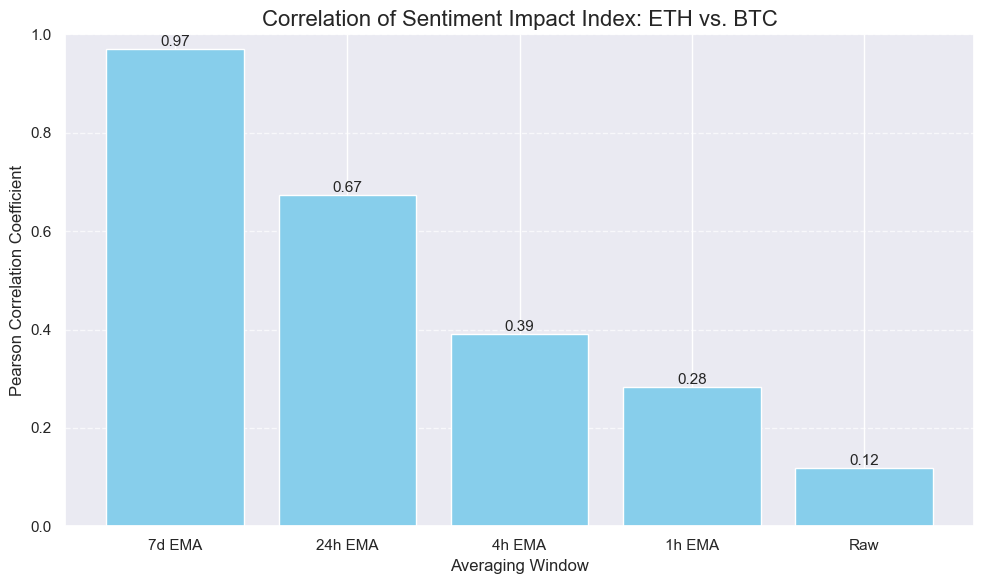

In [46]:
import matplotlib.pyplot as plt

# Store the correlation results in a dictionary
correlations = {
    "7d EMA": df_feat['impact_index_ema_7d_ETH'].corr(df_feat['impact_index_ema_7d_BTC']),
    "24h EMA": df_feat['impact_index_ema_24h_ETH'].corr(df_feat['impact_index_ema_24h_BTC']),
    "4h EMA": df_feat['impact_index_ema_4h_ETH'].corr(df_feat['impact_index_ema_4h_BTC']),
    "1h EMA": df_feat['impact_index_ema_1h_ETH'].corr(df_feat['impact_index_ema_1h_BTC']),
    "Raw": df_feat['impact_index_ETH'].corr(df_feat['impact_index_BTC'])
}

# Extract labels and values for plotting
labels = list(correlations.keys())
values = list(correlations.values())

# Create the bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, values, color='skyblue')

# Add titles and labels for clarity
plt.title('Correlation of Sentiment Impact Index: ETH vs. BTC', fontsize=16)
plt.xlabel('Averaging Window', fontsize=12)
plt.ylabel('Pearson Correlation Coefficient', fontsize=12)
plt.ylim(0, 1)

# Add the correlation value on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2f}', va='bottom', ha='center', fontsize=11)

# Add a horizontal grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

In [47]:
# calculate correlation between df_feat["impact_index_ema_1h_ETH"] and df_feat["Close"] variation in next hour
# We want to correlate the sentiment at time 't' with the price change between 't' and 't+1h'.
# df.pct_change(n) calculates (price(t) - price(t-n))/price(t-n). This is a backward-looking change.
# To get a forward-looking change, we can calculate the percentage change and then shift the result.
# Let's assume the number of periods for one hour is `periods_in_hour`.
# The future return is `df['Close_ETH'].pct_change(periods_in_hour).shift(-periods_in_hour)`.
# This calculates the return over the next hour.
periods_in_hour = 60 // 5 # Assuming DT_PAST is 5, for 5-minute intervals.
nb_period_price = 1*periods_in_hour
nb_period_sentiment = 1*periods_in_hour
print(f"Correlation 1h sentiment ETH/Close ETH : {df_feat['impact_index_ema_4h_ETH'].pct_change(nb_period_sentiment).corr(df_feat['Close_ETH'].pct_change(nb_period_price).shift(-nb_period_price))}")


Correlation 1h sentiment ETH/Close ETH : 0.01799446271075739


In [48]:
print(f"Correlation 1h sentiment ETH/Close ETH : {df_feat['impact_index_ema_4h_ETH'].pct_change(nb_period_sentiment).corr(
    df_feat['Close_ETH'].pct_change(nb_period_price).shift(-nb_period_price),
    method='kendall',
    )}")

Correlation 1h sentiment ETH/Close ETH : 0.0010107370462819419


In [49]:
df_feat['impact_index_ETH'].pct_change(nb_period_sentiment).corr(
    df_feat['Close_ETH'].pct_change(nb_period_price).shift(-nb_period_price),
    method='kendall',
    min_periods=0)

np.float64(0.004841729815590113)

#### Max Price vs Sentiment

##### Raw sentiment

In [50]:
# L'indicateur de sentiment à tester
sentiment_col = 'impact_index_ETH'
def calc_corr_sent_raw(df_feat, sentiment_col):
    # Plage des périodes à tester (en heures)
    hours_range = range(1, 25) # de 1 à 24 heures

    results = []

    # --- Boucle de Calcul des Corrélations ---
    print(f"--- Calcul des Corrélations de Kendall pour '{sentiment_col}' ---")
    # Boucle sur chaque période pour la variation du sentiment
    for sent_hours in hours_range:
        # Boucle sur chaque période pour la variation future du prix
        for price_hours in hours_range:
            
            # Calculer le nombre de points de données pour chaque fenêtre
            periods_in_sent_window = (sent_hours * 60) // DT_PAST
            periods_in_price_window = (price_hours * 60) // DT_PAST

            # S'assurer que la fenêtre n'est pas nulle
            if periods_in_sent_window == 0 or periods_in_price_window == 0:
                continue

            # 1. Calculer la variation en pourcentage du sentiment sur sa fenêtre
            sentiment_change = df_feat[sentiment_col].pct_change(periods_in_sent_window)

            # 2. Calculer la variation en pourcentage future du prix sur sa fenêtre
            #future_price_change = df_feat['Close_ETH'].pct_change(periods_in_price_window).shift(-periods_in_price_window)
            # 2. Calculer la variation maximale future du prix
            #    a. Trouver le prix maximum dans la fenêtre de prix future
            #       rolling().max() regarde dans le passé, donc on inverse la série, on applique rolling, puis on ré-inverse.
            future_max_price = df_feat['Close_ETH'][::-1].rolling(window=periods_in_price_window, min_periods=1).max()[::-1]
            
            #    b. Décaler pour aligner le max futur avec le temps 't'
            future_max_price = future_max_price.shift(-1)

            #    c. Calculer le pct_change entre le max futur et le prix actuel
            max_future_pct_change = (future_max_price - df_feat['Close_ETH']) / df_feat['Close_ETH']

            # 3. Calculer la corrélation
            #correlation = sentiment_change.corr(max_future_pct_change)
            # 3. Calculer la corrélation de KENDALL
            correlation = sentiment_change.corr(
                max_future_pct_change,
                method='kendall',
                min_periods=0 # Comme demandé
            )

            # Stocker le résultat
            results.append({
                "Sentiment Period (h)": sent_hours,
                "Price Period (h)": price_hours,
                "Kendall Correlation": correlation
            })
        
        # Affichage de la progression
        if sent_hours % 4 == 0:
            print(f"Calculs terminés pour une période de sentiment de {sent_hours} heures...")


    # --- Analyse des Résultats ---
    if results:
        # Convertir les résultats en DataFrame pour une analyse facile
        results_df = pd.DataFrame(results)

        # Remplacer les NaN qui peuvent apparaître si une série a une variance nulle
        results_df.dropna(inplace=True)

        if not results_df.empty:
            # Trouver la meilleure (la plus positive) et la pire (la plus négative) corrélation
            best_corr = results_df.loc[results_df['Kendall Correlation'].idxmax()]
            worst_corr = results_df.loc[results_df['Kendall Correlation'].idxmin()]

            print("\n" + "="*60)
            print(f"--- Résumé de l'Analyse pour '{sentiment_col}' ---")
            print("="*60)
            
            print("\nMeilleure Corrélation Positive Trouvée:")
            print(best_corr)

            print("\nPire Corrélation (la plus négative) Trouvée:")
            print(worst_corr)

            print(f"\nDataFrame complet des résultats contient {len(results_df)} combinaisons.")
            return results_df
        else:
            print("L'analyse n'a produit aucun résultat valide (corrélation non-NaN).")
    else:
        print("Aucun résultat n'a été généré. Veuillez vérifier votre configuration.")

    return None

In [51]:
def plot_corr_sent_raw(results_df, sentiment_col):
    # --- Analyse et Visualisation des Résultats ---
    results_df.dropna(inplace=True)
    if not results_df.empty:
        # --- Affichage du résumé texte ---
        best_corr = results_df.loc[results_df['Kendall Correlation'].idxmax()]
        worst_corr = results_df.loc[results_df['Kendall Correlation'].idxmin()]
        print("\n" + "="*60)
        print(f"--- Résumé de l'Analyse pour '{sentiment_col}' ---")
        print("="*60)
        print("\nMeilleure Corrélation Positive Trouvée:\n", best_corr)
        print("\nPire Corrélation (la plus négative) Trouvée:\n", worst_corr)

        # --- Préparation des données pour la heatmap ---
        # Pivoter le DataFrame pour obtenir une grille 2D
        pivot_df = results_df.pivot(
            index='Sentiment Period (h)', 
            columns='Price Period (h)', 
            values='Kendall Correlation'
        )

        # --- Création de la Heatmap ---
        print("\nGénération de la heatmap...")
        
        
        # Utiliser une palette de couleurs divergente est idéal pour les corrélations
        # (négatif, zéro, positif)
        sns.heatmap(pivot_df, cmap='coolwarm', center=0, annot=False)
        #fig = plt.gcf()
        #fig.set_size_inches([10,10])
        # Ajouter les titres et étiquettes
        plt.title(f"Heatmap de Corrélation (Kendall) entre la variation de '{sentiment_col}' et la variation future du prix", fontsize=16, pad=20)
        plt.xlabel('Période de Variation du Prix (heures)', fontsize=12)
        plt.ylabel('Période de Variation du Sentiment (heures)', fontsize=12)
        
        plt.show()

    else:
        print("L'analyse n'a produit aucun résultat valide (corrélation non-NaN).")


###### ETH

In [52]:
res_sent_eth_raw = calc_corr_sent_raw(df_feat, "impact_index_ETH")

--- Calcul des Corrélations de Kendall pour 'impact_index_ETH' ---
Calculs terminés pour une période de sentiment de 4 heures...
Calculs terminés pour une période de sentiment de 8 heures...
Calculs terminés pour une période de sentiment de 12 heures...
Calculs terminés pour une période de sentiment de 16 heures...
Calculs terminés pour une période de sentiment de 20 heures...
Calculs terminés pour une période de sentiment de 24 heures...

--- Résumé de l'Analyse pour 'impact_index_ETH' ---

Meilleure Corrélation Positive Trouvée:
Sentiment Period (h)    24.000000
Price Period (h)        24.000000
Kendall Correlation      0.012581
Name: 575, dtype: float64

Pire Corrélation (la plus négative) Trouvée:
Sentiment Period (h)    16.000000
Price Period (h)         6.000000
Kendall Correlation     -0.023915
Name: 365, dtype: float64

DataFrame complet des résultats contient 576 combinaisons.


In [53]:
res_sent_eth_raw.sort_values(by='Kendall Correlation', ascending=False)

,Sentiment Period (h),Price Period (h),Kendall Correlation
575,24,24,0.012581
551,23,24,0.012429
574,24,23,0.011755
550,23,23,0.011482
527,22,24,0.011325
...,...,...,...
389,17,6,-0.022847
366,16,7,-0.022932
388,17,5,-0.023152
364,16,5,-0.023406



--- Résumé de l'Analyse pour 'impact_index_ETH' ---

Meilleure Corrélation Positive Trouvée:
 Sentiment Period (h)    24.000000
Price Period (h)        24.000000
Kendall Correlation      0.012581
Name: 575, dtype: float64

Pire Corrélation (la plus négative) Trouvée:
 Sentiment Period (h)    16.000000
Price Period (h)         6.000000
Kendall Correlation     -0.023915
Name: 365, dtype: float64

Génération de la heatmap...


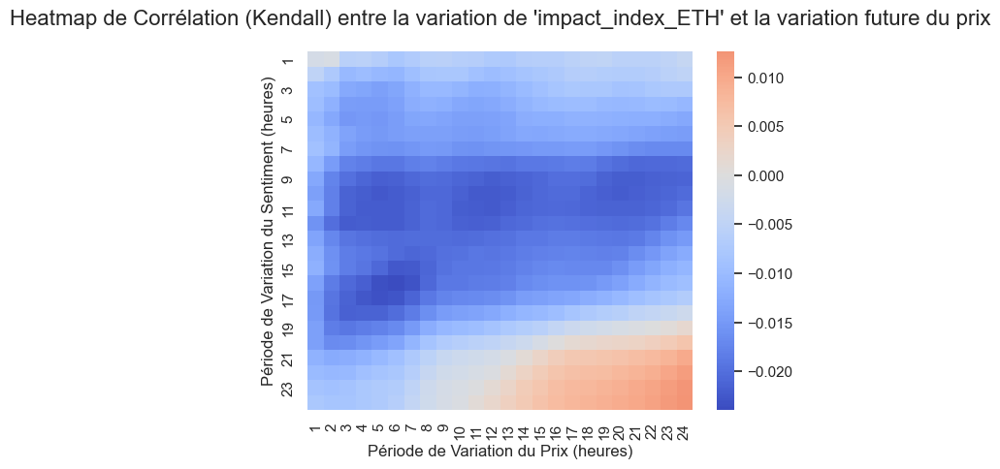

In [54]:
plot_corr_sent_raw(res_sent_eth_raw, "impact_index_ETH")

###### BTC

In [55]:
res_sent_btc_raw = calc_corr_sent_raw(df_feat, "impact_index_BTC")

--- Calcul des Corrélations de Kendall pour 'impact_index_BTC' ---
Calculs terminés pour une période de sentiment de 4 heures...
Calculs terminés pour une période de sentiment de 8 heures...
Calculs terminés pour une période de sentiment de 12 heures...
Calculs terminés pour une période de sentiment de 16 heures...
Calculs terminés pour une période de sentiment de 20 heures...
Calculs terminés pour une période de sentiment de 24 heures...

--- Résumé de l'Analyse pour 'impact_index_BTC' ---

Meilleure Corrélation Positive Trouvée:
Sentiment Period (h)     9.000000
Price Period (h)        23.000000
Kendall Correlation      0.008044
Name: 214, dtype: float64

Pire Corrélation (la plus négative) Trouvée:
Sentiment Period (h)    1.000000
Price Period (h)        1.000000
Kendall Correlation    -0.009835
Name: 0, dtype: float64

DataFrame complet des résultats contient 576 combinaisons.


In [56]:
res_sent_btc_raw.sort_values(by='Kendall Correlation', ascending=False)

,Sentiment Period (h),Price Period (h),Kendall Correlation
214,9,23,0.008044
213,9,22,0.007954
215,9,24,0.007929
420,18,13,0.007516
212,9,21,0.007484
...,...,...,...
120,6,1,-0.008728
24,2,1,-0.008876
5,1,6,-0.009053
2,1,3,-0.009246



--- Résumé de l'Analyse pour 'impact_index_BTC' ---

Meilleure Corrélation Positive Trouvée:
 Sentiment Period (h)     9.000000
Price Period (h)        23.000000
Kendall Correlation      0.008044
Name: 214, dtype: float64

Pire Corrélation (la plus négative) Trouvée:
 Sentiment Period (h)    1.000000
Price Period (h)        1.000000
Kendall Correlation    -0.009835
Name: 0, dtype: float64

Génération de la heatmap...


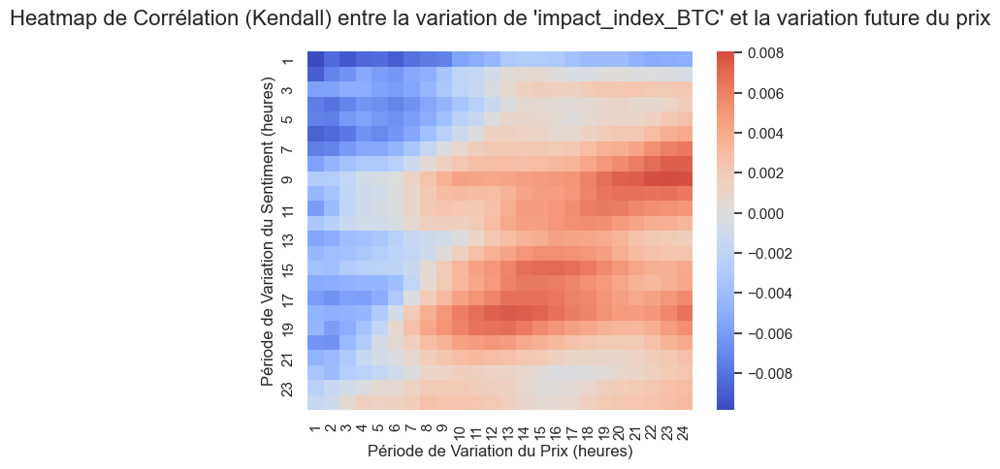

In [57]:
plot_corr_sent_raw(res_sent_btc_raw, "impact_index_BTC")

##### EMA Sentiment : Pearson Corr

In [58]:
df_feat["impact_index_ema_7d_BTC"].isna().sum()

np.int64(0)

In [59]:
def calc_corr_sent(df_feat, token, method="pearson"):
    # Liste des colonnes d'indicateurs de sentiment à tester
    sentiment_cols = [
        f"impact_index_ema_1h_{token}",
        f"impact_index_ema_4h_{token}",
        f"impact_index_ema_24h_{token}",
        f"impact_index_ema_7d_{token}",
    ]

    # Dictionnaire des périodes à tester (en heures)
    time_periods = {
        "1 Hour": 1,
        "4 Hours": 4,
        "24 Hours": 24,
        "7 Days": 24 * 7
    }

    results = []

    # --- Boucle de Calcul des Corrélations ---
    print("--- Calcul des Corrélations (Sentiment vs Max Future Price ETH Change) ---")
    # Boucle sur chaque indicateur de sentiment
    for sentiment_col in sentiment_cols:
        # Boucle sur chaque période pour la variation du sentiment
        for sent_period_name, sent_hours in time_periods.items():
            # Boucle sur chaque période pour la variation future du prix
            for price_period_name, price_hours in time_periods.items():
                
                # Calculer le nombre de points de données pour chaque fenêtre
                periods_in_sent_window = (sent_hours * 60) // DT_PAST
                periods_in_price_window = (price_hours * 60) // DT_PAST

                # S'assurer qu'il y a assez de données pour le calcul
                if periods_in_sent_window == 0 or periods_in_price_window == 0:
                    continue

                # 1. Calculer la variation en pourcentage du sentiment sur sa fenêtre
                sentiment_change = df_feat[sentiment_col].pct_change(periods_in_sent_window)

                # 2. Calculer la variation maximale future du prix
                #    a. Trouver le prix maximum dans la fenêtre de prix future
                #       rolling().max() regarde dans le passé, donc on inverse la série, on applique rolling, puis on ré-inverse.
                future_max_price = df_feat['Close_ETH'][::-1].rolling(window=periods_in_price_window, min_periods=1).max()[::-1]
                
                #    b. Décaler pour aligner le max futur avec le temps 't'
                future_max_price = future_max_price.shift(-1)

                #    c. Calculer le pct_change entre le max futur et le prix actuel
                max_future_pct_change = (future_max_price - df_feat['Close_ETH']) / df_feat['Close_ETH']

                # 3. Calculer la corrélation
                correlation = sentiment_change.corr(
                    max_future_pct_change,
                    method=method,
                )
                # Stocker le résultat
                results.append({
                    "Sentiment EMA": sentiment_col.replace("impact_index_ema_", "").replace(f"_{token}", ""),
                    "Sentiment Period": sent_period_name,
                    "Price Period": price_period_name,
                    "Correlation": correlation
                })
                
                #print(f"Corr(Sent {sent_period_name} vs Max Price ETH Change sur {price_period_name} | {sentiment_col.split('_')[-2]}): {correlation:.4f}")

    # --- Analyse des Résultats ---
    if results:
        # Convertir les résultats en DataFrame pour une analyse facile
        results_df = pd.DataFrame(results)
        print(results_df)

        # Trouver la meilleure (la plus positive) et la pire (la plus négative) corrélation
        best_corr = results_df.loc[results_df['Correlation'].idxmax()]
        worst_corr = results_df.loc[results_df['Correlation'].idxmin()]

        print("\n" + "="*55)
        print("--- Résumé de l'Analyse (Sentiment vs Max Future Change) ---")
        print("="*55)
        
        print("\nMeilleure Corrélation Positive Trouvée:")
        print(best_corr)

        print("\nPire Corrélation (la plus négative) Trouvée:")
        print(worst_corr)
        return results_df
    else:
        print("Aucun résultat n'a été généré. Veuillez vérifier votre configuration.")
        return None

# plot sentiment vs future price change

# --- Plotting with Heatmap for Categorical Data ---

# This helper function pivots the data to create the matrix needed for a heatmap.
# It's the same function as before, but it will now handle categorical axes.
def plot_sent_corr_ema(df, token="ETH", method="pearson"):
    def draw_heatmap(*args, **kwargs):
        data = kwargs.pop('data')
        pivoted_data = data.pivot(index="Price Period", columns="Sentiment Period", values="Correlation")
        sns.heatmap(pivoted_data, **kwargs)

    # Create a FacetGrid, creating a new plot in the `col` dimension for each 'Sentiment EMA' value.
    g = sns.FacetGrid(df, col="Sentiment EMA", height=5)

    # Map the heatmap drawing function to the grid.
    # We use a different format string 'fmt=".3f"' for your smaller correlation values.
    g.map_dataframe(
        draw_heatmap,
        annot=True,      # Show the correlation values
        fmt=".3f",       # Format values to 3 decimal places
        cmap="viridis",  # A color-blind friendly colormap
        cbar=True        # Show the color bar
    )

    # Add titles and labels for clarity
    g.fig.suptitle(f'Correlation ({method}) by Period and EMA Window : Price ETH Change vs {token} sentiment', y=1.07, fontsize=16)
    g.set_axis_labels("Sentiment Period", "Price Period")
    g.set_titles("Sentiment EMA: {col_name}") # Set title for each subplot

    # Adjust layout to prevent titles/labels from overlapping
    plt.tight_layout()
    plt.show()


###### ETH

In [60]:
res_corr_sent_eth = calc_corr_sent(df_feat, "ETH", method="pearson")

--- Calcul des Corrélations (Sentiment vs Max Future Price ETH Change) ---
   Sentiment EMA Sentiment Period Price Period  Correlation
0             1h           1 Hour       1 Hour    -0.001647
1             1h           1 Hour      4 Hours    -0.005399
2             1h           1 Hour     24 Hours     0.007722
3             1h           1 Hour       7 Days    -0.005525
4             1h          4 Hours       1 Hour    -0.006097
..           ...              ...          ...          ...
59            7d         24 Hours       7 Days    -0.002830
60            7d           7 Days       1 Hour    -0.012405
61            7d           7 Days      4 Hours    -0.011675
62            7d           7 Days     24 Hours    -0.010151
63            7d           7 Days       7 Days    -0.011129

[64 rows x 4 columns]

--- Résumé de l'Analyse (Sentiment vs Max Future Change) ---

Meilleure Corrélation Positive Trouvée:
Sentiment EMA             4h
Sentiment Period      7 Days
Price Period         

In [61]:
res_corr_sent_eth.sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
31,4h,7 Days,7 Days,0.066886
30,4h,7 Days,24 Hours,0.042512
15,1h,7 Days,7 Days,0.032058
46,24h,7 Days,24 Hours,0.027713
38,24h,4 Hours,24 Hours,0.025194
...,...,...,...,...
62,7d,7 Days,24 Hours,-0.010151
63,7d,7 Days,7 Days,-0.011129
61,7d,7 Days,4 Hours,-0.011675
60,7d,7 Days,1 Hour,-0.012405


In [62]:
res_corr_sent_eth[res_corr_sent_eth["Price Period"] == "1 Hour"].sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
48,7d,1 Hour,1 Hour,0.020227
32,24h,1 Hour,1 Hour,0.020106
16,4h,1 Hour,1 Hour,0.015797
28,4h,7 Days,1 Hour,0.010690
52,7d,4 Hours,1 Hour,0.009458
44,24h,7 Days,1 Hour,0.009418
40,24h,24 Hours,1 Hour,0.008952
36,24h,4 Hours,1 Hour,0.007625
24,4h,24 Hours,1 Hour,0.006867
8,1h,24 Hours,1 Hour,0.006735


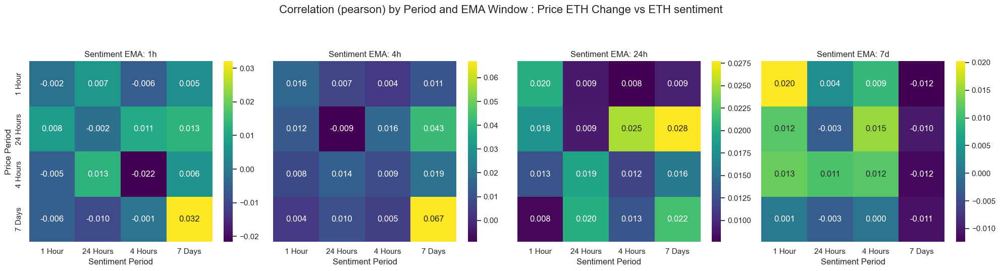

In [63]:
plot_sent_corr_ema(res_corr_sent_eth, "ETH", "pearson")

###### BTC

In [64]:
res_corr_sent_btc = calc_corr_sent(df_feat, "BTC", method="pearson")

--- Calcul des Corrélations (Sentiment vs Max Future Price ETH Change) ---
   Sentiment EMA Sentiment Period Price Period  Correlation
0             1h           1 Hour       1 Hour    -0.004070
1             1h           1 Hour      4 Hours    -0.007132
2             1h           1 Hour     24 Hours     0.002195
3             1h           1 Hour       7 Days    -0.000758
4             1h          4 Hours       1 Hour    -0.004120
..           ...              ...          ...          ...
59            7d         24 Hours       7 Days     0.030531
60            7d           7 Days       1 Hour    -0.004827
61            7d           7 Days      4 Hours    -0.000770
62            7d           7 Days     24 Hours     0.013708
63            7d           7 Days       7 Days     0.010365

[64 rows x 4 columns]

--- Résumé de l'Analyse (Sentiment vs Max Future Change) ---

Meilleure Corrélation Positive Trouvée:
Sentiment EMA             7d
Sentiment Period    24 Hours
Price Period        2

In [65]:
res_corr_sent_btc.sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
58,7d,24 Hours,24 Hours,0.031818
59,7d,24 Hours,7 Days,0.030531
53,7d,4 Hours,4 Hours,0.030146
43,24h,24 Hours,7 Days,0.028539
54,7d,4 Hours,24 Hours,0.023484
...,...,...,...,...
60,7d,7 Days,1 Hour,-0.004827
29,4h,7 Days,4 Hours,-0.006407
40,24h,24 Hours,1 Hour,-0.006634
1,1h,1 Hour,4 Hours,-0.007132


In [66]:
res_corr_sent_btc[res_corr_sent_btc["Price Period"] == "1 Hour"].sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
52,7d,4 Hours,1 Hour,0.014561
8,1h,24 Hours,1 Hour,0.008272
36,24h,4 Hours,1 Hour,0.004662
48,7d,1 Hour,1 Hour,0.004094
12,1h,7 Days,1 Hour,0.001417
56,7d,24 Hours,1 Hour,0.001129
20,4h,4 Hours,1 Hour,0.001110
32,24h,1 Hour,1 Hour,-0.002858
44,24h,7 Days,1 Hour,-0.003233
0,1h,1 Hour,1 Hour,-0.004070


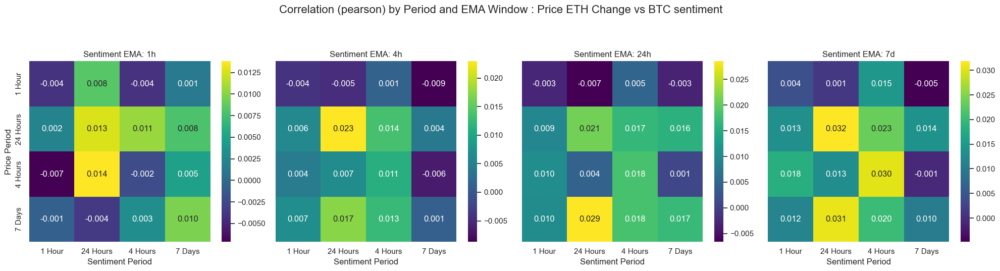

In [67]:
plot_sent_corr_ema(res_corr_sent_btc, "BTC", "pearson")

##### EMA Sentiment : Rank corr

###### ETH

In [68]:
res_corr_rank_sent_eth = calc_corr_sent(df_feat, "ETH", method="spearman")

--- Calcul des Corrélations (Sentiment vs Max Future Price ETH Change) ---
   Sentiment EMA Sentiment Period Price Period  Correlation
0             1h           1 Hour       1 Hour     0.008819
1             1h           1 Hour      4 Hours     0.002334
2             1h           1 Hour     24 Hours     0.009303
3             1h           1 Hour       7 Days     0.002595
4             1h          4 Hours       1 Hour     0.000962
..           ...              ...          ...          ...
59            7d         24 Hours       7 Days     0.013299
60            7d           7 Days       1 Hour    -0.006277
61            7d           7 Days      4 Hours    -0.001828
62            7d           7 Days     24 Hours    -0.000873
63            7d           7 Days       7 Days     0.004837

[64 rows x 4 columns]

--- Résumé de l'Analyse (Sentiment vs Max Future Change) ---

Meilleure Corrélation Positive Trouvée:
Sentiment EMA            24h
Sentiment Period     4 Hours
Price Period        2

In [69]:
res_corr_rank_sent_eth.sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
38,24h,4 Hours,24 Hours,0.022934
47,24h,7 Days,7 Days,0.021758
55,7d,4 Hours,7 Days,0.021532
39,24h,4 Hours,7 Days,0.020784
48,7d,1 Hour,1 Hour,0.019392
...,...,...,...,...
12,1h,7 Days,1 Hour,-0.008525
8,1h,24 Hours,1 Hour,-0.008713
9,1h,24 Hours,4 Hours,-0.016023
10,1h,24 Hours,24 Hours,-0.016083


In [70]:
res_corr_rank_sent_eth[res_corr_rank_sent_eth["Price Period"] == "1 Hour"].sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
48,7d,1 Hour,1 Hour,0.019392
32,24h,1 Hour,1 Hour,0.015005
16,4h,1 Hour,1 Hour,0.014362
52,7d,4 Hours,1 Hour,0.012806
36,24h,4 Hours,1 Hour,0.009608
0,1h,1 Hour,1 Hour,0.008819
40,24h,24 Hours,1 Hour,0.008262
44,24h,7 Days,1 Hour,0.007036
20,4h,4 Hours,1 Hour,0.006525
56,7d,24 Hours,1 Hour,0.005251


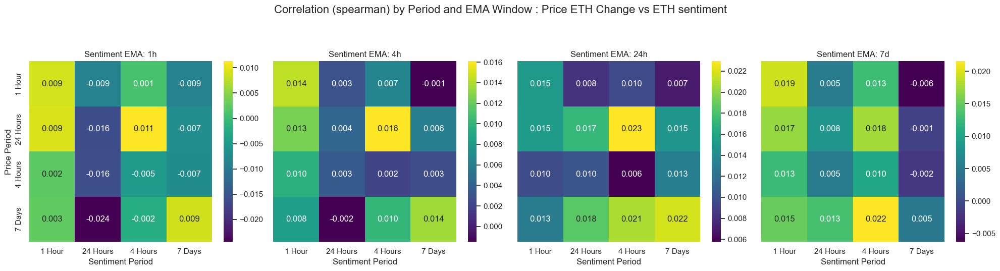

In [71]:
plot_sent_corr_ema(res_corr_rank_sent_eth, "ETH", "spearman")

###### BTC

In [72]:
res_corr_rank_sent_btc = calc_corr_sent(df_feat, "BTC", method="spearman")

--- Calcul des Corrélations (Sentiment vs Max Future Price ETH Change) ---
   Sentiment EMA Sentiment Period Price Period  Correlation
0             1h           1 Hour       1 Hour     0.013436
1             1h           1 Hour      4 Hours     0.014961
2             1h           1 Hour     24 Hours     0.004884
3             1h           1 Hour       7 Days     0.002824
4             1h          4 Hours       1 Hour     0.003834
..           ...              ...          ...          ...
59            7d         24 Hours       7 Days     0.043501
60            7d           7 Days       1 Hour    -0.002206
61            7d           7 Days      4 Hours    -0.000935
62            7d           7 Days     24 Hours     0.017492
63            7d           7 Days       7 Days     0.039033

[64 rows x 4 columns]

--- Résumé de l'Analyse (Sentiment vs Max Future Change) ---

Meilleure Corrélation Positive Trouvée:
Sentiment EMA             1h
Sentiment Period      7 Days
Price Period         

In [73]:
res_corr_rank_sent_btc.sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
15,1h,7 Days,7 Days,0.051599
59,7d,24 Hours,7 Days,0.043501
63,7d,7 Days,7 Days,0.039033
43,24h,24 Hours,7 Days,0.030419
27,4h,24 Hours,7 Days,0.029402
...,...,...,...,...
24,4h,24 Hours,1 Hour,-0.020097
41,24h,24 Hours,4 Hours,-0.020536
9,1h,24 Hours,4 Hours,-0.022673
25,4h,24 Hours,4 Hours,-0.024431


In [74]:
res_corr_rank_sent_btc[res_corr_rank_sent_btc["Price Period"] == "1 Hour"].sort_values(by="Correlation", ascending=False)

,Sentiment EMA,Sentiment Period,Price Period,Correlation
48,7d,1 Hour,1 Hour,0.018869
32,24h,1 Hour,1 Hour,0.017272
16,4h,1 Hour,1 Hour,0.016550
0,1h,1 Hour,1 Hour,0.013436
52,7d,4 Hours,1 Hour,0.011521
20,4h,4 Hours,1 Hour,0.007713
36,24h,4 Hours,1 Hour,0.007695
4,1h,4 Hours,1 Hour,0.003834
60,7d,7 Days,1 Hour,-0.002206
44,24h,7 Days,1 Hour,-0.004025


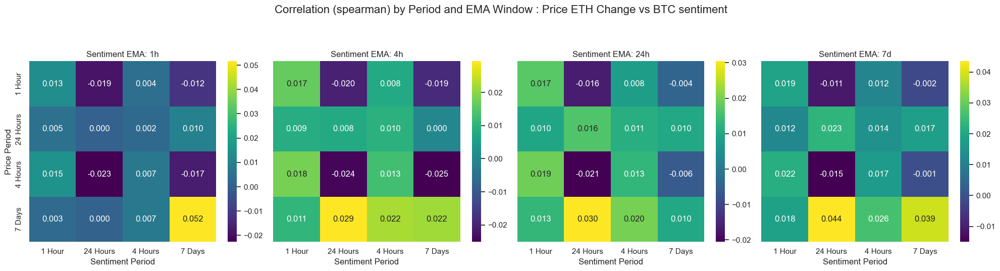

In [75]:

plot_sent_corr_ema(res_corr_rank_sent_btc, "BTC", "spearman")

##### inutile ? : toutes les heures de prix

In [76]:
# # Liste des colonnes d'indicateurs de sentiment à tester
# sentiment_cols = [
#     "impact_index_ema_1h_ETH",
#     "impact_index_ema_4h_ETH",
#     "impact_index_ema_24h_ETH",
#     "impact_index_ema_7d_ETH"
# ]

# # Plage des périodes à tester (en heures)
# hours_range = range(1, 25) # de 1 à 24 heures

# results = []

# # --- Boucle de Calcul des Corrélations ---
# print("--- Calcul des Corrélations de Kendall (Sentiment vs Max Future Price Change) ---")
# # Boucle sur chaque indicateur de sentiment
# for sentiment_col in sentiment_cols:
#     # Boucle sur chaque période pour la variation du sentiment
#     for sent_hours in hours_range:
#         # Boucle sur chaque période pour la variation future du prix
#         for price_hours in hours_range:
            
#             # Calculer le nombre de points de données pour chaque fenêtre
#             periods_in_sent_window = (sent_hours * 60) // DT_PAST
#             periods_in_price_window = (price_hours * 60) // DT_PAST

#             # S'assurer qu'il y a assez de données pour le calcul
#             if periods_in_sent_window == 0 or periods_in_price_window == 0:
#                 continue

#             # 1. Calculer la variation en pourcentage du sentiment sur sa fenêtre
#             sentiment_change = df_feat[sentiment_col].pct_change(periods_in_sent_window)

#             # 2. Calculer la variation maximale future du prix
#             future_max_price = df_feat['Close_ETH'][::-1].rolling(window=periods_in_price_window, min_periods=1).max()[::-1]
#             future_max_price = future_max_price.shift(-1)
#             max_future_pct_change = (future_max_price - df_feat['Close_ETH']) / df_feat['Close_ETH']

#             # 3. Calculer la corrélation de KENDALL
#             correlation = sentiment_change.corr(max_future_pct_change, method='kendall')

#             # Stocker le résultat
#             results.append({
#                 "Sentiment EMA": sentiment_col.replace("impact_index_ema_", "").replace("_ETH", ""),
#                 "Sentiment Period (h)": sent_hours,
#                 "Price Period (h)": price_hours,
#                 "Kendall Correlation": correlation
#             })
    
#     print(f"Calculs terminés pour {sentiment_col}")


# # --- Analyse des Résultats ---
# if results:
#     # Convertir les résultats en DataFrame pour une analyse facile
#     results_df = pd.DataFrame(results)

#     # Remplacer les NaN qui peuvent apparaître si une série a une variance nulle
#     results_df.dropna(inplace=True)

#     # Trouver la meilleure (la plus positive) et la pire (la plus négative) corrélation
#     best_corr = results_df.loc[results_df['Kendall Correlation'].idxmax()]
#     worst_corr = results_df.loc[results_df['Kendall Correlation'].idxmin()]

#     print("\n" + "="*60)
#     print("--- Résumé de l'Analyse (Corrélation de Kendall) ---")
#     print("="*60)
    
#     print("\nMeilleure Corrélation Positive Trouvée:")
#     print(best_corr)

#     print("\nPire Corrélation (la plus négative) Trouvée:")
#     print(worst_corr)

#     print(f"\nDataFrame complet des résultats contient {len(results_df)} combinaisons.")
#     # Vous pouvez afficher le DataFrame complet si vous le souhaitez
#     # with pd.option_context('display.max_rows', None):
#     #     print(results_df.sort_values(by='Kendall Correlation', ascending=False))
# else:
#     print("Aucun résultat n'a été généré. Veuillez vérifier votre configuration.")



In [77]:
#results_df.sort_values(by="Kendall Correlation", ascending=False)

In [78]:
#results_df[results_df["Price Period (h)"] == 1].sort_values(by="Kendall Correlation", ascending=False)

#### Conclusion
- RAW (inst) : à garder pour tester : OK
- EMA 1h, 4h, 24h : OK
- Pas l'EMA 7d : impact important mais evolution monotone qui ne permet pas d'avoir une valeur de TEST (val TEST > all val TRAIN)

In [79]:
list_col_sent = [
    "impact_index_ETH",
    "impact_index_ema_1h_ETH",
    "impact_index_ema_4h_ETH",
    "impact_index_ema_24h_ETH",
    "impact_index_BTC",
    "impact_index_ema_1h_BTC",
    "impact_index_ema_4h_BTC",
    "impact_index_ema_24h_BTC",
]

### Proportional to the Price

In [80]:
list_col = df_feat.columns.to_list()
list_col

['Time',
 'Open_ETH',
 'High_ETH',
 'Low_ETH',
 'Close_ETH',
 'Volume_ETH',
 'date_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'rsi_0_ETH',
 'rsi_1_ETH',
 'rsi_2_ETH',
 'rsi_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'chop_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'chop_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'chop_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'chop_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vwap_z_score_ETH',
 'nupl_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH'

In [81]:
list_col_ETH = [col for col in list_col if re.search("_ETH", col) is not None]
list_col_ETH

['Open_ETH',
 'High_ETH',
 'Low_ETH',
 'Close_ETH',
 'Volume_ETH',
 'date_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'rsi_0_ETH',
 'rsi_1_ETH',
 'rsi_2_ETH',
 'rsi_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'chop_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'chop_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'chop_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'chop_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vwap_z_score_ETH',
 'nupl_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH',
 'vp_va

In [82]:
list_price_dep_ETH = [
    "Close_ETH",
    "Open_ETH",
    "High_ETH",
    "Low_ETH",
    'ichi_cloud_a_ETH',
    'ichi_cloud_b_ETH',
    'ichi_kijun_ETH',
    'ichi_tenkan_ETH',
    'ichi_cloud_a_1_ETH',
    'ichi_cloud_b_1_ETH',
    'ichi_kijun_1_ETH',
    'ichi_tenkan_1_ETH',
    'ichi_cloud_a_2_ETH',
    'ichi_cloud_b_2_ETH',
    'ichi_kijun_2_ETH',
    'ichi_tenkan_2_ETH',
    'ichi_cloud_a_3_ETH',
    'ichi_cloud_b_3_ETH',
    'ichi_kijun_3_ETH',
    'ichi_tenkan_3_ETH',
    'max_high_0_ETH',
    'min_low_0_ETH',
    'atr_0_ETH',
    'max_high_1_ETH',
    'min_low_1_ETH',
    'atr_1_ETH',
    'max_high_2_ETH',
    'min_low_2_ETH',
    'atr_2_ETH',
    'max_high_3_ETH',
    'min_low_3_ETH',
    'atr_3_ETH',
    'vwap_h_ETH',
    'vwap_4h_ETH',
    'vwap_d_ETH',
    'vwap_w_ETH',
    'vwap_m_ETH',
    'vwap_3m_ETH',
    'vwap_y_ETH',
    'vwap_all_ETH',
    'vp_val_d_ETH',
    'vp_vpoc_d_ETH',
    'vp_vah_d_ETH',
    'vp_val_w_ETH',
    'vp_vpoc_w_ETH',
    'vp_vah_w_ETH',
    'vp_val_m_ETH',
    'vp_vpoc_m_ETH',
    'vp_vah_m_ETH',
    'vp_val_q_ETH',
    'vp_vpoc_q_ETH',
    'vp_vah_q_ETH',
    'tp_val_d_ETH',
    'tp_tpo_d_ETH',
    'tp_vah_d_ETH',
    'tp_val_w_ETH',
    'tp_tpo_w_ETH',
    'tp_vah_w_ETH',
    'tp_val_m_ETH',
    'tp_tpo_m_ETH',
    'tp_vah_m_ETH',
    'tp_val_q_ETH',
    'tp_tpo_q_ETH',
    'tp_vah_q_ETH',
]


#    'max_high_h_ETH',
#    'ichi_tenkan_week_ETH',

In [83]:
list_col_BTC = [col for col in list_col if re.search("_BTC", col) is not None]
list_col_BTC

['Open_BTC',
 'High_BTC',
 'Low_BTC',
 'Close_BTC',
 'Volume_BTC',
 'date_BTC',
 'ichi_cloud_a_BTC',
 'ichi_cloud_b_BTC',
 'ichi_kijun_BTC',
 'ichi_tenkan_BTC',
 'ichi_cloud_a_1_BTC',
 'ichi_cloud_b_1_BTC',
 'ichi_kijun_1_BTC',
 'ichi_tenkan_1_BTC',
 'ichi_cloud_a_2_BTC',
 'ichi_cloud_b_2_BTC',
 'ichi_kijun_2_BTC',
 'ichi_tenkan_2_BTC',
 'ichi_cloud_a_3_BTC',
 'ichi_cloud_b_3_BTC',
 'ichi_kijun_3_BTC',
 'ichi_tenkan_3_BTC',
 'rsi_0_BTC',
 'rsi_1_BTC',
 'rsi_2_BTC',
 'rsi_3_BTC',
 'max_high_0_BTC',
 'min_low_0_BTC',
 'atr_0_BTC',
 'chop_0_BTC',
 'max_high_1_BTC',
 'min_low_1_BTC',
 'atr_1_BTC',
 'chop_1_BTC',
 'max_high_2_BTC',
 'min_low_2_BTC',
 'atr_2_BTC',
 'chop_2_BTC',
 'max_high_3_BTC',
 'min_low_3_BTC',
 'atr_3_BTC',
 'chop_3_BTC',
 'vwap_h_BTC',
 'vwap_4h_BTC',
 'vwap_d_BTC',
 'vwap_w_BTC',
 'vwap_m_BTC',
 'vwap_3m_BTC',
 'vwap_y_BTC',
 'vwap_all_BTC',
 'vwap_z_score_BTC',
 'nupl_BTC',
 'vp_val_d_BTC',
 'vp_vpoc_d_BTC',
 'vp_vah_d_BTC',
 'vp_val_w_BTC',
 'vp_vpoc_w_BTC',
 'vp_va

In [84]:
list_price_dep_BTC = [
    'Open_BTC',
    'High_BTC',
    'Low_BTC',
    'Close_BTC',
    'ichi_cloud_a_BTC',
    'ichi_cloud_b_BTC',
    'ichi_kijun_BTC',
    'ichi_tenkan_BTC',
    'ichi_cloud_a_1_BTC',
    'ichi_cloud_b_1_BTC',
    'ichi_kijun_1_BTC',
    'ichi_tenkan_1_BTC',
    'ichi_cloud_a_2_BTC',
    'ichi_cloud_b_2_BTC',
    'ichi_kijun_2_BTC',
    'ichi_tenkan_2_BTC',
    'ichi_cloud_a_3_BTC',
    'ichi_cloud_b_3_BTC',
    'ichi_kijun_3_BTC',
    'ichi_tenkan_3_BTC',
    'max_high_0_BTC',
    'min_low_0_BTC',
    'atr_0_BTC',
    'max_high_1_BTC',
    'min_low_1_BTC',
    'atr_1_BTC',
    'max_high_2_BTC',
    'min_low_2_BTC',
    'atr_2_BTC',
    'max_high_3_BTC',
    'min_low_3_BTC',
    'atr_3_BTC',
    'vwap_h_BTC',
    'vwap_4h_BTC',
    'vwap_d_BTC',
    'vwap_w_BTC',
    'vwap_m_BTC',
    'vwap_3m_BTC',
    'vwap_y_BTC',
    'vwap_all_BTC',
    'vp_val_d_BTC',
    'vp_vpoc_d_BTC',
    'vp_vah_d_BTC',
    'vp_val_w_BTC',
    'vp_vpoc_w_BTC',
    'vp_vah_w_BTC',
    'vp_val_m_BTC',
    'vp_vpoc_m_BTC',
    'vp_vah_m_BTC',
    'vp_val_q_BTC',
    'vp_vpoc_q_BTC',
    'vp_vah_q_BTC',
    'tp_val_d_BTC',
    'tp_tpo_d_BTC',
    'tp_vah_d_BTC',
    'tp_val_w_BTC',
    'tp_tpo_w_BTC',
    'tp_vah_w_BTC',
    'tp_val_m_BTC',
    'tp_tpo_m_BTC',
    'tp_vah_m_BTC',
    'tp_val_q_BTC',
    'tp_tpo_q_BTC',
    'tp_vah_q_BTC',
]

In [85]:
list_col_BNB = [col for col in list_col if re.search("_BNB", col) is not None]
list_col_BNB

['Open_BNB', 'High_BNB', 'Low_BNB', 'Close_BNB', 'Volume_BNB', 'date_BNB']

In [86]:
list_price_dep_BNB = ['Open_BNB', 'High_BNB', 'Low_BNB', 'Close_BNB']

#### add special indices

In [87]:
df_feat[["fvx", "spx", "dxy"]]

,fvx,spx,dxy
0,3.910,3823.179932,103.494003
1,3.910,3823.179932,103.494003
2,3.910,3823.179932,103.494003
3,3.910,3823.179932,103.494003
4,3.910,3823.179932,103.494003
...,...,...,...
298077,3.717,6840.229980,99.718002
298078,3.717,6840.229980,99.718002
298079,3.717,6840.229980,99.718002
298080,3.717,6840.229980,99.718002


In [88]:
list_price_dep_special = ["fvx", "spx", "dxy"]

In [89]:
df_feat[["date_ETH", "fvx", "spx", "dxy"]].tail(60)

,date_ETH,fvx,spx,dxy
298022,2025-10-31 19:05:00,3.717,6862.609863,99.814003
298023,2025-10-31 19:10:00,3.717,6862.609863,99.814003
298024,2025-10-31 19:15:00,3.717,6862.609863,99.814003
298025,2025-10-31 19:20:00,3.717,6862.609863,99.814003
298026,2025-10-31 19:25:00,3.717,6862.609863,99.814003
298027,2025-10-31 19:30:00,3.717,6862.609863,99.814003
298028,2025-10-31 19:35:00,3.717,6862.609863,99.814003
298029,2025-10-31 19:40:00,3.717,6862.609863,99.814003
298030,2025-10-31 19:45:00,3.717,6862.609863,99.814003
298031,2025-10-31 19:50:00,3.717,6862.609863,99.814003


### Not proportional to the Price 

In [90]:
set(list_col) - set(list_price_dep_ETH) - set(list_price_dep_BTC) - set(list_price_dep_BNB) - set(list_price_dep_special)

{'Actual',
 'Actual_num',
 'Close_ETH_raw',
 'Consensus',
 'Consensus_num',
 'Country',
 'Date',
 'Event',
 'Previous',
 'Previous_num',
 'PriceVolume_BTC',
 'PriceVolume_ETH',
 'Time',
 'Time (ET)',
 'Volume_BNB',
 'Volume_BTC',
 'Volume_ETH',
 'act_addr_BTC',
 'act_addr_ETH',
 'chop_0_BTC',
 'chop_0_ETH',
 'chop_1_BTC',
 'chop_1_ETH',
 'chop_2_BTC',
 'chop_2_ETH',
 'chop_3_BTC',
 'chop_3_ETH',
 'date',
 'date_BNB',
 'date_BTC',
 'date_ETH',
 'day',
 'day_in_month_cos',
 'day_in_month_sin',
 'day_off',
 'day_ratio',
 'days_in_month',
 'delta_event_pred',
 'delta_event_real',
 'event_pred',
 'event_real',
 'fear_greed',
 'fear_greed_class',
 'gli',
 'hour',
 'hour_cos',
 'hour_sin',
 'impact_index_BTC',
 'impact_index_ETH',
 'impact_index_ema_1h_BTC',
 'impact_index_ema_1h_ETH',
 'impact_index_ema_24h_BTC',
 'impact_index_ema_24h_ETH',
 'impact_index_ema_4h_BTC',
 'impact_index_ema_4h_ETH',
 'impact_index_ema_7d_BTC',
 'impact_index_ema_7d_ETH',
 'keep',
 'market_dom_BTC',
 'market_dom

In [91]:
list_col_other = [
    'Volume_BNB',
    'Volume_BTC',
    'Volume_ETH',
    'chop_0_BTC',
    'chop_0_ETH',
    'chop_1_BTC',
    'chop_1_ETH',
    'chop_2_BTC',
    'chop_2_ETH',
    'chop_3_BTC',
    'chop_3_ETH',
    'rsi_0_BTC',
    'rsi_0_ETH',
    'rsi_1_BTC',
    'rsi_1_ETH',
    'rsi_2_BTC',
    'rsi_2_ETH',
    'rsi_3_BTC',
    'rsi_3_ETH',
    'vwap_z_score_ETH',
    'vwap_z_score_BTC',
    #'dxy',
    #'spx',
    #'fvx',
    'act_addr_BTC',
    'act_addr_ETH',
    'market_dom_BTC',
    'market_dom_ETH',
    'nupl_BTC',
    'nupl_ETH',
    'fear_greed',
    'supply_BTC',
    'supply_ETH',
    'hour_cos',
    'hour_sin',
    'weekday_cos',
    'weekday_sin',
    'day_in_month_cos',
    'day_in_month_sin',
    'month_cos',
    'month_sin',
    'day_off',
    'event_pred',
    'event_real',
]

### Final selection

In [92]:
list_col_select_simple = [
    "Close_ETH",
    "Open_ETH",
    "High_ETH",
    "Low_ETH",
]

list_col_select_global = (
    list_price_dep_ETH +
    list_price_dep_BTC +
    list_price_dep_BNB +  
    list_price_dep_special +  
    list_col_other +
    list_col_sent +
    [f"{TARGET_NAME}_raw"]
)

# selection
list_col_select = list_col_select_global

# only col in df_feat
list_col_select = [feat for feat in list_col_select if feat in df_feat.columns]
print("num features : ", len(list_col_select))

num features :  185


In [93]:
list_col_select

['Close_ETH',
 'Open_ETH',
 'High_ETH',
 'Low_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH',
 'vp_vah_w_ETH',
 'vp_val_m_ETH',
 'vp_vpoc_m_ETH',
 'vp_vah_m_ETH',
 'vp_val_q_ETH',
 'vp_vpoc_q_ETH',
 'vp_vah_q_ETH',
 'tp_val_d_ETH',
 'tp_tpo_d_ETH',
 'tp_vah_d_ETH',
 'tp_val_w_ET

In [94]:
get_missing(df_feat.filter(list_col_select))

missing data : 
Series([], dtype: int64)

on 298082 samples


Series([], dtype: int64)

## Features preparation

df_feat [selected features]   
--> X_train_raw, X_test_raw, y_train_raw, y_test_raw  
--> X_train (with prices ratio of ETH Close price at last lag) <-- used by autoencoder 


X [nb samples, nb lags, nb features]


In [95]:
df_feat.shape[0]

298082

In [96]:
TRAIN_SPLIT_RATIO

0.9

In [97]:
TRAIN_SPLIT = round(TRAIN_SPLIT_RATIO * df_feat.shape[0])
TRAIN_SPLIT

268274

In [98]:
bol_train = [True if I <= TRAIN_SPLIT else False \
                       for I in range(df_feat.shape[0])]
df_feat["train"] = bol_train
df_feat

,Time,Open_ETH,High_ETH,Low_ETH,Close_ETH,Volume_ETH,date_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,...,Consensus_num,Previous_num,delta_event_pred,event_pred,delta_event_real,event_real,day_off,date,Close_ETH_raw,train
0,1672531200000,1196.13,1196.32,1195.65,1196.32,334.5592,2023-01-01 00:00:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1196.32,True
1,1672531500000,1196.31,1196.69,1194.90,1195.38,682.3876,2023-01-01 00:05:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1195.38,True
2,1672531800000,1195.38,1195.81,1194.55,1194.55,228.9387,2023-01-01 00:10:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1194.55,True
3,1672532100000,1194.55,1195.98,1194.31,1195.98,601.8903,2023-01-01 00:15:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1195.98,True
4,1672532400000,1195.98,1196.37,1195.97,1196.06,144.8048,2023-01-01 00:20:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1196.06,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298077,1761954000000,3853.34,3858.00,3853.34,3857.99,381.3255,2025-10-31 23:40:00,3866.835000,3855.415000,3858.590,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3857.99,False
298078,1761954300000,3858.00,3858.77,3852.01,3852.18,429.9622,2025-10-31 23:45:00,3863.877500,3857.600000,3858.590,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3852.18,False
298079,1761954600000,3852.19,3852.19,3849.42,3849.42,587.7892,2025-10-31 23:50:00,3862.972500,3857.600000,3858.300,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3849.42,False
298080,1761954900000,3849.43,3849.45,3847.94,3847.99,580.9754,2025-10-31 23:55:00,3861.960000,3857.600000,3857.560,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3847.99,False


In [99]:
df_feat[df_feat["train"] == True]

,Time,Open_ETH,High_ETH,Low_ETH,Close_ETH,Volume_ETH,date_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,...,Consensus_num,Previous_num,delta_event_pred,event_pred,delta_event_real,event_real,day_off,date,Close_ETH_raw,train
0,1672531200000,1196.13,1196.32,1195.65,1196.32,334.5592,2023-01-01 00:00:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1196.32,True
1,1672531500000,1196.31,1196.69,1194.90,1195.38,682.3876,2023-01-01 00:05:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1195.38,True
2,1672531800000,1195.38,1195.81,1194.55,1194.55,228.9387,2023-01-01 00:10:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1194.55,True
3,1672532100000,1194.55,1195.98,1194.31,1195.98,601.8903,2023-01-01 00:15:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1195.98,True
4,1672532400000,1195.98,1196.37,1195.97,1196.06,144.8048,2023-01-01 00:20:00,2605.987019,2605.114163,1194.710,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2023-01-02 05:00:00,1196.06,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268270,1753011900000,3730.33,3766.45,3728.40,3760.68,20235.0704,2025-07-20 11:45:00,3703.430000,3681.700000,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3760.68,True
268271,1753012200000,3760.68,3764.40,3750.00,3750.37,8283.8819,2025-07-20 11:50:00,3703.430000,3681.700000,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3750.37,True
268272,1753012500000,3750.37,3760.00,3744.07,3756.71,5155.8111,2025-07-20 11:55:00,3702.727500,3681.700000,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3756.71,True
268273,1753012800000,3756.70,3756.70,3745.04,3752.21,4956.8064,2025-07-20 12:00:00,3702.402500,3682.660000,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3752.21,True


In [100]:
df_feat[df_feat["train"] == False]

,Time,Open_ETH,High_ETH,Low_ETH,Close_ETH,Volume_ETH,date_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,...,Consensus_num,Previous_num,delta_event_pred,event_pred,delta_event_real,event_real,day_off,date,Close_ETH_raw,train
268275,1753013400000,3751.67,3752.34,3747.38,3750.34,2320.7302,2025-07-20 12:10:00,3702.6175,3683.280,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3750.34,False
268276,1753013700000,3750.35,3750.35,3729.41,3732.60,5816.4820,2025-07-20 12:15:00,3702.6625,3683.280,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3732.60,False
268277,1753014000000,3732.61,3736.27,3729.74,3735.74,2731.0317,2025-07-20 12:20:00,3704.7350,3683.280,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3735.74,False
268278,1753014300000,3735.75,3737.14,3724.94,3729.84,3942.5178,2025-07-20 12:25:00,3706.6900,3683.280,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3729.84,False
268279,1753014600000,3729.83,3738.93,3726.37,3736.97,2614.6427,2025-07-20 12:30:00,3706.2225,3683.280,3731.225,...,4.5,4.5,0.0,0.0,0.0,0.0,0.0,2025-07-30 19:00:00,3736.97,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298077,1761954000000,3853.34,3858.00,3853.34,3857.99,381.3255,2025-10-31 23:40:00,3866.8350,3855.415,3858.590,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3857.99,False
298078,1761954300000,3858.00,3858.77,3852.01,3852.18,429.9622,2025-10-31 23:45:00,3863.8775,3857.600,3858.590,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3852.18,False
298079,1761954600000,3852.19,3852.19,3849.42,3849.42,587.7892,2025-10-31 23:50:00,3862.9725,3857.600,3858.300,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3849.42,False
298080,1761954900000,3849.43,3849.45,3847.94,3847.99,580.9754,2025-10-31 23:55:00,3861.9600,3857.600,3857.560,...,NaN,NaN,NaN,0.0,NaN,0.0,0.0,NaN,3847.99,False


In [101]:
def gen_sequence(id_df, seq_length, len_pred, seq_cols, i_price_dep=None):
    # Close ETH need to be in first place
    # we divide by close ETH price all price dependent features except the first Close ETH
    # in a matrix
    data_matrix = id_df[seq_cols].values # data of selected col
    num_elements = data_matrix.shape[0] # nb samples

    for start, stop in zip(
            range(0, num_elements - seq_length - len_pred), 
            range(seq_length, num_elements - len_pred)
        ):
            out_matrix = data_matrix[start:stop, :].copy()
            if i_price_dep is not None:
                p_close = out_matrix[-1, 0] # last past history lag, first feature = Close ETH
                # scaling : price dependent features divide by Close ETH 
                out_matrix[:, i_price_dep] = (
                    out_matrix[:, i_price_dep] / p_close
                )
                # keep Price Close with no scaling
                #out_matrix[-1, 0] = p_close
                
            yield out_matrix

def gen_labels(id_df, seq_length, len_pred, label, divide_price=False, price_label=None):

    data_matrix = id_df[label].values 
    num_elements = data_matrix.shape[0]

    if price_label:
        price_matrix = id_df[price_label].values

    for start, stop in zip(
            range(seq_length, num_elements - len_pred), 
            range(seq_length + len_pred, num_elements)
        ):
        out_matrix = data_matrix[start:stop, :].copy()
        if divide_price:
            if price_label:
                out_matrix = out_matrix / price_matrix[start-1, 0]
            else:
                out_matrix = out_matrix / data_matrix[start-1, 0]
        yield np.swapaxes(out_matrix,0,1).squeeze()

In [102]:
x = np.array([[1,2,3]])
x = np.swapaxes(x,0,1)
x = np.swapaxes(x,0,1).squeeze()
x

array([1, 2, 3])

In [103]:
i_col_price_dep = [
    (
        (col in list_price_dep_ETH) 
        or (col in list_price_dep_BTC) 
        or (col in list_price_dep_BNB)
        or (col in list_price_dep_special)
    ) 
    for col in list_col_select ]

In [104]:
df_feat[df_feat["train"] == True].shape[0]

268275

In [105]:
df_feat[df_feat["train"] == True].shape[0] - PAST_HISTORY - FUTURE_TARGET

268188

In [106]:
n_feat = df_feat.loc[df_feat["train"] == True, list_col_select].shape[1]
n_feat

185

In [107]:
# create X_train on disk
#filename = os.path.join(path_data, 'X_train.dat')
#print(filename)
X_train_dat = np.memmap(
    path_X_train, 
    dtype='float32', 
    mode='w+', 
    shape=(
        df_feat[df_feat["train"] == True].shape[0] - PAST_HISTORY - FUTURE_TARGET, 
        PAST_HISTORY, 
        n_feat,
    )
)

In [108]:
list_col_select

['Close_ETH',
 'Open_ETH',
 'High_ETH',
 'Low_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH',
 'vp_vah_w_ETH',
 'vp_val_m_ETH',
 'vp_vpoc_m_ETH',
 'vp_vah_m_ETH',
 'vp_val_q_ETH',
 'vp_vpoc_q_ETH',
 'vp_vah_q_ETH',
 'tp_val_d_ETH',
 'tp_tpo_d_ETH',
 'tp_vah_d_ETH',
 'tp_val_w_ET

In [109]:
X_test = []
y_train, y_test = [], []
y_high_train, y_high_test = [], []
y_low_train, y_low_test = [], []


for is_train, _df in df_feat.groupby("train"):

    for index, seq in enumerate(gen_sequence(
        _df, 
        PAST_HISTORY,
        FUTURE_TARGET,
        list_col_select,
        i_col_price_dep
        )):
        if is_train:
            # don't use append here but assign to X_train_dat
            X_train_dat[index] = seq # PAST_HISTORY * n_feat
            #X_train.append(seq)
        else:
            X_test.append(seq)
        
        #index += 1
    if is_train:
        X_train_dat.flush()

    for seq_y in gen_labels(_df, PAST_HISTORY, FUTURE_TARGET, ['Close_ETH'], divide_price=True):

        if is_train:
            y_train.append(seq_y)
        else:
            y_test.append(seq_y)
    
    for seq_y in gen_labels(_df, PAST_HISTORY, FUTURE_TARGET, ['High_ETH'], divide_price=True, 
                            price_label=['Close_ETH']):

        if is_train:
            y_high_train.append(seq_y)
        else:
            y_high_test.append(seq_y) 

    for seq_y in gen_labels(_df, PAST_HISTORY, FUTURE_TARGET, ['Low_ETH'], divide_price=True, 
                            price_label=['Close_ETH']):

        if is_train:
            y_low_train.append(seq_y)
        else:
            y_low_test.append(seq_y) 

#X_train = np.asarray(X_train)
y_train = np.array(y_train)
X_test = np.asarray(X_test)
y_test = np.array(y_test)

y_high_train = np.array(y_high_train)
y_high_test = np.array(y_high_test)

y_low_train = np.array(y_low_train)
y_low_test = np.array(y_low_test)

#print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(29720, 72, 185) (29720, 15)


In [110]:
y_high_train


array([[1.0004688 , 1.00057763, 1.00039346, ..., 1.00053577, 1.00031811,
        1.00015069],
       [1.00011715, 0.99993306, 0.99985775, ..., 0.99985775, 0.9996904 ,
        0.99939753],
       [1.00000837, 0.99993305, 0.99990795, ..., 0.99976569, 0.9994728 ,
        0.99888703],
       ...,
       [1.000924  , 1.00067814, 1.00099694, ..., 1.00946422, 1.01759917,
        1.01704532],
       [1.00102973, 1.00134865, 1.0005027 , ..., 1.01795671, 1.01740266,
        1.01621347],
       [1.00059685, 0.99975154, 1.00004321, ..., 1.0166388 , 1.01545051,
        1.01455929]], shape=(268188, 15))

In [111]:
assert df_feat["Close_ETH"].iloc[PAST_HISTORY] / df_feat["Close_ETH"].iloc[PAST_HISTORY-1] == y_train[0,0]


In [112]:
assert df_feat["High_ETH"].iloc[PAST_HISTORY] / df_feat["Close_ETH"].iloc[PAST_HISTORY-1] == y_high_train[0,0]


In [113]:
assert df_feat["Low_ETH"].iloc[PAST_HISTORY] / df_feat["Close_ETH"].iloc[PAST_HISTORY-1] == y_low_train[0,0]


In [114]:
X_train_dat.shape

(268188, 72, 185)

In [115]:
X_train_dat[0,:,:].shape

(72, 185)

Close_ETH normalized by Close_ETH at last lag of the past history

In [116]:
X_train_dat[0,:,0]

memmap([1.0014901 , 1.0007032 , 1.0000083 , 1.0012054 , 1.0012724 ,
        1.0017328 , 0.9998493 , 0.99973214, 0.9992466 , 1.0000837 ,
        1.0002344 , 0.9996233 , 0.99963164, 1.0009627 , 1.0007032 ,
        1.0007032 , 1.0008874 , 1.0007617 , 1.0005022 , 1.000159  ,
        1.0003182 , 1.0008287 , 1.0006781 , 1.001239  , 0.99972373,
        0.99985766, 1.0005692 , 1.0006614 , 1.0007032 , 1.0013226 ,
        1.0018417 , 1.0011386 , 1.0006111 , 1.0009376 , 1.0007617 ,
        1.0007199 , 0.99878615, 0.99918795, 0.99887824, 0.9978318 ,
        0.99903727, 0.9990289 , 0.999054  , 0.9994307 , 0.99954796,
        0.99958146, 0.9998744 , 0.99958146, 0.9993721 , 0.9985434 ,
        0.99840945, 0.9983006 , 0.99802434, 0.99802434, 0.99808294,
        0.998602  , 0.99790716, 0.99809134, 0.998242  , 0.9986438 ,
        0.9990038 , 0.9988364 , 0.9989536 , 0.9989201 , 0.99918795,
        0.99969864, 0.99951446, 0.99922144, 0.99963164, 0.9998326 ,
        0.999774  , 1.        ], dtype=float32)

In [117]:
list_col_select[1]

'Open_ETH'

In [118]:
X_train_dat[0,:,1]

memmap([1.0013311 , 1.0014818 , 1.0007032 , 1.0000083 , 1.0012054 ,
        1.0012724 , 1.0017413 , 0.99985766, 0.99973214, 0.9992466 ,
        1.000092  , 1.0002344 , 0.9996233 , 0.99964005, 1.0009711 ,
        1.0007032 , 1.0006949 , 1.0008874 , 1.0007617 , 1.0005022 ,
        1.000159  , 1.0003182 , 1.0008371 , 1.0006781 , 1.0012306 ,
        0.99972373, 0.9998493 , 1.0005609 , 1.0006614 , 1.0007032 ,
        1.0013311 , 1.0018417 , 1.0011386 , 1.0006195 , 1.0009376 ,
        1.0007617 , 1.0007284 , 0.99878615, 0.99918795, 0.99886984,
        0.9978318 , 0.99904567, 0.99903727, 0.99904567, 0.9994391 ,
        0.99954796, 0.99957305, 0.99986607, 0.9995898 , 0.9993721 ,
        0.998535  , 0.99840105, 0.9983006 , 0.99802434, 0.99802434,
        0.9980746 , 0.998602  , 0.99789876, 0.9980997 , 0.99825037,
        0.9986438 , 0.9990038 , 0.9988364 , 0.9989536 , 0.99891174,
        0.9991796 , 0.999707  , 0.9995228 , 0.99922985, 0.9996233 ,
        0.9998409 , 0.9997823 ], dtype=float32)

Close_ETH_raw

In [119]:
list_col_select[-1]

'Close_ETH_raw'

In [120]:
X_train_dat[0,:,-1]

memmap([1196.32, 1195.38, 1194.55, 1195.98, 1196.06, 1196.61, 1194.36,
        1194.22, 1193.64, 1194.64, 1194.82, 1194.09, 1194.1 , 1195.69,
        1195.38, 1195.38, 1195.6 , 1195.45, 1195.14, 1194.73, 1194.92,
        1195.53, 1195.35, 1196.02, 1194.21, 1194.37, 1195.22, 1195.33,
        1195.38, 1196.12, 1196.74, 1195.9 , 1195.27, 1195.66, 1195.45,
        1195.4 , 1193.09, 1193.57, 1193.2 , 1191.95, 1193.39, 1193.38,
        1193.41, 1193.86, 1194.  , 1194.04, 1194.39, 1194.04, 1193.79,
        1192.8 , 1192.64, 1192.51, 1192.18, 1192.18, 1192.25, 1192.87,
        1192.04, 1192.26, 1192.44, 1192.92, 1193.35, 1193.15, 1193.29,
        1193.25, 1193.57, 1194.18, 1193.96, 1193.61, 1194.1 , 1194.34,
        1194.27, 1194.54], dtype=float32)

## Standardization

In [121]:
# check if new  data in df_feat
# hash input
hash_df_feat = get_data_hash(df_feat)
# load df_prob file hash
path_feat_hash = os.path.join(path_data, 'df_feat_hash.txt')
# hash df_prob data
hash_df_feat_old = load_hash(path_feat_hash)

# compare hash
if hash_df_feat == hash_df_feat_old:
    print("hash match: mode LOAD rescaling")
    mode_rescale = False
else:
    print("hash not match : mode REDO rescaling")
    mode_rescale = True


hash match: mode LOAD rescaling


In [122]:
#mode_rescale = True

In [123]:
path_scaler

'data/scaler.bin'

In [124]:
X_train_sca_dat = np.memmap(
    path_X_train_sca, 
    dtype='float32', 
    mode='w+', 
    shape=(
        df_feat[df_feat["train"] == True].shape[0] - PAST_HISTORY - FUTURE_TARGET, 
        PAST_HISTORY, 
        n_feat,
    )
)

In [125]:
list_col_select_global

['Close_ETH',
 'Open_ETH',
 'High_ETH',
 'Low_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH',
 'vp_vah_w_ETH',
 'vp_val_m_ETH',
 'vp_vpoc_m_ETH',
 'vp_vah_m_ETH',
 'vp_val_q_ETH',
 'vp_vpoc_q_ETH',
 'vp_vah_q_ETH',
 'tp_val_d_ETH',
 'tp_tpo_d_ETH',
 'tp_vah_d_ETH',
 'tp_val_w_ET

In [126]:
# Peak memory : 36Gb !
# need to rescale minmax for some entries
list_min_max = ['day_off',
 'event_pred',
 'event_real']

if mode_rescale:
    scaler = StandardScaler()
    scaler.fit(X_train_dat.reshape(-1,X_train_dat.shape[-1]))
    for col in list_min_max:
        i_col = list_col_select.index(col)
        scaler.scale_[i_col] = 1
        scaler.mean_[i_col] = 0
    #X_train_sca_dat[:] = scaler.fit_transform(X_train_dat.reshape(-1,X_train_dat.shape[-1])).reshape(X_train_dat.shape)
    X_train_sca_dat[:] = scaler.transform(X_train_dat.reshape(-1,X_train_dat.shape[-1])).reshape(X_train_dat.shape)
    X_test_sca = scaler.transform(X_test.reshape(-1,X_test.shape[-1])).reshape(X_test.shape)
    joblib.dump(scaler, path_scaler)

    scaler_y = StandardScaler()
    y_train_sca = scaler_y.fit_transform(y_train.ravel().reshape(-1, 1)).reshape(y_train.shape)
    y_test_sca = scaler_y.transform(y_test.ravel().reshape(-1, 1)).reshape(y_test.shape)
    joblib.dump(scaler_y, path_scaler_y)
    # save hash
    with open(path_feat_hash, 'w') as file:
        file.write(hash_df_feat)
else:
    print("Load standardization from disk...")
    scaler = joblib.load(path_scaler)
    X_train_sca_dat[:] = scaler.transform(X_train_dat.reshape(-1,X_train_dat.shape[-1])).reshape(X_train_dat.shape)
    X_test_sca = scaler.transform(X_test.reshape(-1,X_test.shape[-1])).reshape(X_test.shape)

    scaler_y =  joblib.load(path_scaler_y)
    y_train_sca = scaler_y.transform(y_train.ravel().reshape(-1, 1)).reshape(y_train.shape)
    y_test_sca = scaler_y.transform(y_test.ravel().reshape(-1, 1)).reshape(y_test.shape)

Load standardization from disk...


In [127]:
y_train

array([[1.00046043, 1.00038509, 0.99962329, ..., 0.99989117, 1.00015069,
        0.99985769],
       [0.99992469, 0.99916324, 0.99983265, ..., 0.9996904 , 0.99939753,
        0.99880344],
       [0.99923849, 0.99990795, 0.99943096, ..., 0.9994728 , 0.99887866,
        0.99859414],
       ...,
       [0.99964877, 1.00039986, 0.99946776, ..., 1.00784317, 1.01604027,
        1.01325477],
       [1.00075135, 0.99981892, 0.9998973 , ..., 1.01639725, 1.01361077,
        1.01532428],
       [0.99906827, 0.99914659, 0.99931403, ..., 1.01284977, 1.01456199,
        1.01334669]], shape=(268188, 15))

In [128]:
np.mean(y_train_sca)

np.float64(-1.2905552444060011e-14)

In [129]:
np.std(y_train_sca)

np.float64(0.9999999999999997)

In [130]:
np.mean(y_test_sca)

np.float64(-0.004606233352597948)

In [131]:
np.std(y_test_sca)

np.float64(1.0645458292498917)

In [132]:
scaler.scale_

array([1.11989715e-02, 1.13577729e-02, 1.12872029e-02, 1.12989765e-02,
       1.60733143e-02, 1.71348518e-02, 1.21896522e-02, 1.15526355e-02,
       5.29399574e-02, 5.66369996e-02, 1.99542133e-02, 1.49667225e-02,
       1.04729565e-01, 1.09923845e-01, 3.44314252e-02, 2.22365411e-02,
       2.17962500e-01, 2.46306168e-01, 7.86507824e-02, 4.74963746e-02,
       1.12872029e-02, 1.12989765e-02, 2.16717820e-03, 1.21940860e-02,
       1.22832897e-02, 1.46131159e-03, 1.47108740e-02, 1.48368314e-02,
       1.23564571e-03, 2.49121258e-02, 2.50446511e-02, 9.97102378e-04,
       1.16032411e-02, 1.27747264e-02, 1.91367960e-02, 4.28061361e-02,
       2.16886859e-01, 2.23804920e-01, 2.33261350e-01, 1.94269802e-01,
       2.98203284e-02, 3.01278788e-02, 3.06509467e-02, 7.55821262e-02,
       7.73499603e-02, 7.85754224e-02, 1.50352928e-01, 1.45730748e-01,
       1.77832629e-01, 1.98857295e-01, 2.24942051e-01, 2.84847846e-01,
       3.10701227e-02, 3.49760256e-02, 3.22470673e-02, 7.83695927e-02,
      

In [133]:
scaler.scale_.shape

(185,)

In [134]:
scaler.scale_[-4:]

array([2.64151530e-01, 1.89876100e-01, 1.36961107e-01, 7.03414755e+02])

In [135]:
scaler.mean_[-4:]

array([7.49428160e-01, 7.58034977e-01, 7.54401186e-01, 2.43179913e+03])

In [136]:
X_train_dat[0,:,0]

memmap([1.0014901 , 1.0007032 , 1.0000083 , 1.0012054 , 1.0012724 ,
        1.0017328 , 0.9998493 , 0.99973214, 0.9992466 , 1.0000837 ,
        1.0002344 , 0.9996233 , 0.99963164, 1.0009627 , 1.0007032 ,
        1.0007032 , 1.0008874 , 1.0007617 , 1.0005022 , 1.000159  ,
        1.0003182 , 1.0008287 , 1.0006781 , 1.001239  , 0.99972373,
        0.99985766, 1.0005692 , 1.0006614 , 1.0007032 , 1.0013226 ,
        1.0018417 , 1.0011386 , 1.0006111 , 1.0009376 , 1.0007617 ,
        1.0007199 , 0.99878615, 0.99918795, 0.99887824, 0.9978318 ,
        0.99903727, 0.9990289 , 0.999054  , 0.9994307 , 0.99954796,
        0.99958146, 0.9998744 , 0.99958146, 0.9993721 , 0.9985434 ,
        0.99840945, 0.9983006 , 0.99802434, 0.99802434, 0.99808294,
        0.998602  , 0.99790716, 0.99809134, 0.998242  , 0.9986438 ,
        0.9990038 , 0.9988364 , 0.9989536 , 0.9989201 , 0.99918795,
        0.99969864, 0.99951446, 0.99922144, 0.99963164, 0.9998326 ,
        0.999774  , 1.        ], dtype=float32)

### Check unscaling

In [137]:
df_feat[list_col_select].head(10)

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw
0,1196.32,1196.13,1196.32,1195.65,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1196.32
1,1195.38,1196.31,1196.69,1194.90,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1195.38
2,1194.55,1195.38,1195.81,1194.55,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.55
3,1195.98,1194.55,1195.98,1194.31,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1195.98
4,1196.06,1195.98,1196.37,1195.97,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1196.06
5,1196.61,1196.06,1196.70,1196.06,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1196.61
6,1194.36,1196.62,1196.62,1193.72,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.36
7,1194.22,1194.37,1194.43,1192.72,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.22
8,1193.64,1194.22,1194.22,1193.02,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1193.64
9,1194.64,1193.64,1195.06,1193.63,2605.987019,2605.114163,1194.71,1194.71,2604.620395,2599.496407,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.64


In [138]:
df_feat["Close_ETH"].iloc[0:10]

0    1196.32
1    1195.38
2    1194.55
3    1195.98
4    1196.06
5    1196.61
6    1194.36
7    1194.22
8    1193.64
9    1194.64
Name: Close_ETH, dtype: float64

In [139]:
X_train_sca_dat.shape

(268188, 72, 185)

In [140]:
np.testing.assert_array_almost_equal(
    scaler.inverse_transform(X_train_sca_dat[-1,-1,:].reshape(1,-1)).squeeze(),
    X_train_dat[-1,-1,:],
    decimal=4)

## Check Inputs TRAIN/TEST 

In [141]:
X_train_sca_dat[:,-1,:].shape

(268188, 185)

In [142]:
X_test[:,-1,:].shape

(29720, 185)

In [143]:
df = pd.DataFrame(np.vstack((np.hstack((X_train_sca_dat[:,-1,:], np.ones((X_train_sca_dat.shape[0], 1)))),
           np.hstack((X_test_sca[:,-1,:], np.zeros((X_test_sca.shape[0], 1)))))),
           columns=list_col_select + ["TRAIN"])
df

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw,TRAIN
0,0.007767,-0.011298,-0.078739,0.087573,-0.031208,0.018118,-0.102140,-0.028020,22.309984,20.797249,...,-0.440232,-1.315423,-1.908718,-3.178039,-0.566802,-1.513162,-2.150407,-2.954686,-1.758933,1.0
1,0.007767,-0.031917,-0.087643,0.066846,-0.055264,-0.008733,-0.125078,-0.052259,22.291029,20.779568,...,-0.440232,-1.315423,-1.908718,-3.178039,-0.566802,-1.513162,-2.150407,-2.954686,-1.758151,1.0
2,0.007767,0.015235,-0.071325,0.093502,-0.050584,-0.004343,-0.114448,-0.026916,22.294128,20.782461,...,-0.440232,-1.315423,-1.908718,-3.178039,-0.566802,-1.513162,-2.150407,-2.954686,-1.758279,1.0
3,0.007767,0.075702,-0.020123,0.098682,-0.000229,0.040102,-0.052040,0.039016,22.325504,20.811729,...,-0.440232,-1.315423,-1.908718,-3.178039,-0.566802,-1.513162,-2.150407,-2.954686,-1.759573,1.0
4,0.007767,-0.051083,-0.086153,0.048320,-0.030804,0.001028,-0.106908,-0.018950,22.297920,20.785995,...,-0.440232,-1.315423,-1.908718,-3.178039,-0.566802,-1.513162,-2.150407,-2.954686,-1.758435,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297903,0.007767,0.214848,0.124030,0.056825,0.339583,0.055692,0.284835,0.142113,-0.173844,0.313440,...,-1.239597,-1.597391,-0.756012,0.950723,-0.730833,-1.642734,-1.456622,-0.070860,2.021781,0.0
297904,0.007767,-0.065406,-0.068858,0.032316,0.286493,0.007104,0.216350,0.069973,-0.189409,0.298511,...,-1.239597,-1.597391,-0.756012,0.950723,-0.730833,-1.642734,-1.456622,-0.070860,2.026345,0.0
297905,0.007767,-0.094732,-0.072781,-0.029018,0.213683,-0.060872,0.120535,-0.030956,-0.212506,0.277624,...,-1.239597,-1.597391,-0.756012,0.950723,-0.730833,-1.642734,-1.456622,-0.070860,2.032742,0.0
297906,0.007767,0.027708,-0.033078,0.055769,0.227747,-0.047743,0.124168,-0.011462,-0.259978,0.281659,...,-1.239597,-1.597391,-0.756012,0.950723,-0.730833,-1.642734,-1.456622,-0.070860,2.031505,0.0


In [144]:
df["event_real"].mean()

np.float64(3.3567410072908416e-05)

In [145]:
df["event_real"].std()

np.float64(0.013710470474326353)

#### SAve

In [146]:
df.to_csv(path_save_df_feat_std, index=False)

In [147]:
df[df["TRAIN"] == 1].describe()

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw,TRAIN
count,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,...,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.000000,268188.0
mean,0.007767,0.007656,0.007750,0.007655,0.003856,0.003550,0.007042,0.007517,-0.001338,-0.001338,...,0.000138,0.000444,0.000611,0.000793,0.000214,0.000238,0.000440,0.000602,0.000470,1.0
std,0.000000,0.166432,0.128296,0.130850,0.631712,0.682106,0.381165,0.242718,0.944656,0.951114,...,1.000014,1.000162,1.000245,0.999857,1.000054,0.999856,0.999787,0.999592,1.000009,0.0
min,0.007767,-5.101499,-0.088382,-7.963634,-7.201736,-6.894484,-6.573766,-5.564090,-4.696415,-4.517215,...,-3.209901,-4.173103,-3.160746,-3.191630,-3.475353,-4.264211,-2.776824,-2.966234,-1.760667,1.0
25%,0.007767,-0.059778,-0.067058,-0.022890,-0.243289,-0.274264,-0.159220,-0.098921,-0.338039,-0.385213,...,-0.519931,-0.646934,-0.691599,-0.742522,-0.591910,-0.615307,-0.713365,-0.728188,-0.858411,1.0
50%,0.007767,0.007405,-0.027875,0.043825,0.002460,0.007136,0.013121,0.010497,-0.019821,-0.016698,...,0.312253,0.011572,-0.133116,-0.097848,0.310975,0.049169,0.012345,0.061946,-0.115436,1.0
75%,0.007767,0.073508,0.037619,0.084197,0.240961,0.272540,0.177750,0.117253,0.260779,0.311473,...,0.771090,0.731234,0.727920,0.650728,0.745181,0.715380,0.748948,0.813547,0.851178,1.0
max,0.007767,8.289898,8.421088,0.107576,13.223444,13.285409,6.101447,5.180841,22.352093,20.836533,...,1.861024,2.685413,2.832400,2.819494,2.495537,2.586074,2.498792,1.918514,2.359932,1.0


In [148]:
df[df["TRAIN"] == 0].describe()

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw,TRAIN
count,2.972000e+04,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,...,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.000000,29720.0
mean,7.766897e-03,0.007984,0.021387,-0.005748,0.011889,0.012739,0.010629,0.009693,-0.001993,0.005119,...,0.188501,0.611821,1.095593,2.460793,0.100242,0.296049,0.470741,1.017265,2.483715,0.0
std,8.673763e-19,0.179152,0.154971,0.131677,0.666996,0.735477,0.422365,0.268464,0.714523,0.761858,...,0.944053,0.956043,0.966087,0.659535,0.922634,0.886973,0.710175,0.342754,0.472348,0.0
min,7.766897e-03,-3.315715,-0.088382,-4.501146,-6.064920,-5.687315,-3.674808,-3.618116,-2.315256,-2.367560,...,-2.890097,-2.807732,-0.883763,0.950723,-3.080201,-3.251613,-1.648035,-0.070860,1.339382,0.0
25%,7.766897e-03,-0.075242,-0.059753,-0.044939,-0.320829,-0.356677,-0.214977,-0.127959,-0.439165,-0.482931,...,-0.360242,0.114678,0.297206,2.065127,-0.420448,-0.140048,0.158492,0.873027,2.070639,0.0
50%,7.766897e-03,0.007630,-0.012873,0.028047,0.000430,-0.000971,0.005111,0.007294,0.002252,-0.010346,...,0.506667,0.566199,1.192244,2.691587,0.426585,0.412363,0.645336,1.034933,2.546827,0.0
75%,7.766897e-03,0.090282,0.059289,0.075379,0.306902,0.339179,0.228981,0.144101,0.419237,0.479359,...,0.862646,1.333012,2.008315,2.959960,0.768837,0.967884,0.971031,1.279817,2.888901,0.0
max,7.766897e-03,5.806803,9.556485,0.107576,10.134054,11.405369,6.120491,6.196099,4.733127,4.674460,...,1.965476,2.509020,2.615089,3.273317,2.790485,2.201458,1.733932,1.649902,3.582098,0.0


#### check out of range

In [149]:
df_min = df.groupby(df["TRAIN"]).min().transpose()
df_min

TRAIN,0.0,1.0
Close_ETH,0.007767,0.007767
Open_ETH,-3.315715,-5.101499
High_ETH,-0.088382,-0.088382
Low_ETH,-4.501146,-7.963634
ichi_cloud_a_ETH,-6.064920,-7.201736
...,...,...
impact_index_BTC,-3.080201,-3.475353
impact_index_ema_1h_BTC,-3.251613,-4.264211
impact_index_ema_4h_BTC,-1.648035,-2.776824
impact_index_ema_24h_BTC,-0.070860,-2.966234


In [150]:
df_min["out_min"] = df_min[0] < (df_min[1] - 1e-6)
df_min


TRAIN,0.0,1.0,out_min
Close_ETH,0.007767,0.007767,False
Open_ETH,-3.315715,-5.101499,False
High_ETH,-0.088382,-0.088382,False
Low_ETH,-4.501146,-7.963634,False
ichi_cloud_a_ETH,-6.064920,-7.201736,False
...,...,...,...
impact_index_BTC,-3.080201,-3.475353,False
impact_index_ema_1h_BTC,-3.251613,-4.264211,False
impact_index_ema_4h_BTC,-1.648035,-2.776824,False
impact_index_ema_24h_BTC,-0.070860,-2.966234,False


In [151]:
sum(df_min["out_min"].values)

np.int64(14)

In [152]:
df_max = df.groupby(df["TRAIN"]).max().transpose()
df_max

TRAIN,0.0,1.0
Close_ETH,0.007767,0.007767
Open_ETH,5.806803,8.289898
High_ETH,9.556485,8.421088
Low_ETH,0.107576,0.107576
ichi_cloud_a_ETH,10.134054,13.223444
...,...,...
impact_index_BTC,2.790485,2.495537
impact_index_ema_1h_BTC,2.201458,2.586074
impact_index_ema_4h_BTC,1.733932,2.498792
impact_index_ema_24h_BTC,1.649902,1.918514


In [153]:
df_max[0]

Close_ETH                    0.007767
Open_ETH                     5.806803
High_ETH                     9.556485
Low_ETH                      0.107576
ichi_cloud_a_ETH            10.134054
                              ...    
impact_index_BTC             2.790485
impact_index_ema_1h_BTC      2.201458
impact_index_ema_4h_BTC      1.733932
impact_index_ema_24h_BTC     1.649902
Close_ETH_raw                3.582098
Name: 0.0, Length: 185, dtype: float64

In [154]:
df_max[1]

Close_ETH                    0.007767
Open_ETH                     8.289898
High_ETH                     8.421088
Low_ETH                      0.107576
ichi_cloud_a_ETH            13.223444
                              ...    
impact_index_BTC             2.495537
impact_index_ema_1h_BTC      2.586074
impact_index_ema_4h_BTC      2.498792
impact_index_ema_24h_BTC     1.918514
Close_ETH_raw                2.359932
Name: 1.0, Length: 185, dtype: float64

In [155]:
df_max["out_max"] = df_max[0] > (df_max[1] + 1e-6)
df_max

TRAIN,0.0,1.0,out_max
Close_ETH,0.007767,0.007767,False
Open_ETH,5.806803,8.289898,False
High_ETH,9.556485,8.421088,True
Low_ETH,0.107576,0.107576,False
ichi_cloud_a_ETH,10.134054,13.223444,False
...,...,...,...
impact_index_BTC,2.790485,2.495537,True
impact_index_ema_1h_BTC,2.201458,2.586074,False
impact_index_ema_4h_BTC,1.733932,2.498792,False
impact_index_ema_24h_BTC,1.649902,1.918514,False


In [156]:
sum(df_max["out_max"].values)

np.int64(17)

In [157]:
df_max[df_max["out_max"] == True]

TRAIN,0.0,1.0,out_max
High_ETH,9.556485,8.421088,True
ichi_kijun_ETH,6.120491,6.101447,True
ichi_tenkan_ETH,6.196099,5.180841,True
ichi_tenkan_1_ETH,8.350481,7.896616,True
max_high_0_ETH,9.556485,8.421088,True
atr_1_ETH,29.833380,24.273212,True
atr_2_ETH,13.625041,13.094130,True
vp_vpoc_d_ETH,9.480142,8.862466,True
atr_0_BTC,53.513273,43.499893,True
chop_3_ETH,2.802347,2.534310,True


In [158]:
nb_sample_test = df[df["TRAIN"] == False].shape[0]
print(nb_sample_test)
# min
def fun_min(value, col):
    return value < (df_min.at[col, 1] - 1e-6)
list_ser_col_min = []
for col in list_col_select:
    list_ser_col_min.append(df[df["TRAIN"] == False][col].apply(fun_min, args=(col,)))
df_count_min = pd.DataFrame(data=list_ser_col_min).transpose()


#pc_out_max = 100 * nb_out / nb_sample_test
#print(pc_out_max)
df_count_min

29720


,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw
268188,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268189,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268190,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268191,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268192,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297903,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
297904,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
297905,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
297906,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [159]:
# max
def fun_max(value, col):
    return value > (df_max.at[col, 1] + 1e-6)
#nb_out = sum(df[df["TRAIN"] == False]["supply_BTC"].apply(fun_max, args=("supply_BTC",)))
list_ser_col_max = []
for col in list_col_select:
    list_ser_col_max.append(df[df["TRAIN"] == False][col].apply(fun_max, args=(col,)))
df_count_max = pd.DataFrame(data=list_ser_col_max).transpose()
df_count_max

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw
268188,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268189,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268190,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268191,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
268192,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297903,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
297904,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
297905,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
297906,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [160]:
ser_min = df_count_min.apply(lambda x: 100*x.sum()/ x.shape[0])
ser_max = df_count_max.apply(lambda x: 100*x.sum()/ x.shape[0])
df_count = pd.DataFrame(data=[ser_min, ser_max], index=["pc_out_min", "pc_out_max"]).transpose()
df_count_out = df_count.loc[df_count["pc_out_min"] !=0 |(df_count["pc_out_max"] !=0) , :].transpose()
df_count_out

,High_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_tenkan_1_ETH,max_high_0_ETH,atr_1_ETH,atr_2_ETH,vwap_m_ETH,vp_vpoc_d_ETH,vp_val_m_ETH,...,fvx,dxy,chop_3_ETH,rsi_0_ETH,supply_BTC,supply_ETH,impact_index_ETH,impact_index_ema_24h_ETH,impact_index_BTC,Close_ETH_raw
pc_out_min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.55249,0.000000,5.302826,...,82.486541,71.887618,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
pc_out_max,0.003365,0.003365,0.006729,0.003365,0.003365,0.020188,0.020188,0.00000,0.003365,0.000000,...,0.000000,0.000000,0.38358,0.003365,99.761104,100.0,0.010094,40.185061,0.104307,60.888291


Text(0.5, 1.0, 'Percentage of TEST Out of range')

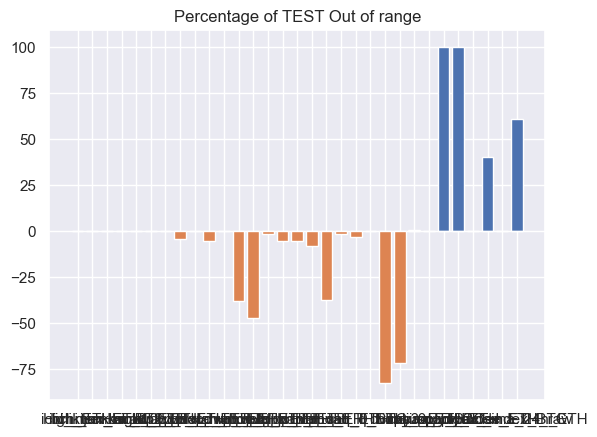

In [161]:
fig, ax = plt.subplots()
ax.bar(df_count_out.xs("pc_out_max").index.tolist(), df_count_out.xs("pc_out_max").values)
ax.bar(df_count_out.xs("pc_out_min").index.tolist(), -df_count_out.xs("pc_out_min").values)
ax.set_title("Percentage of TEST Out of range")

Text(0.5, 1.0, 'Features scaled boxplot')

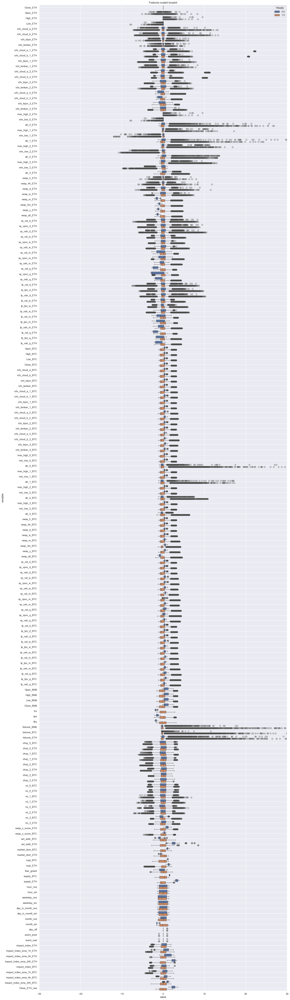

In [162]:
df_comp = df.melt(id_vars=["TRAIN"], value_vars=list_col_select, value_name="value")
plt.figure(figsize=(20, 80))
sns.boxplot(data=df_comp, x="value", y="variable" , hue="TRAIN")
fig = plt.gcf()
ax = fig.gca()
ax.set_xlim([-30,30])
ax.yaxis.grid(True)
plt.title("Features scaled boxplot")

In [163]:
df_comp[(df_comp["TRAIN"] == True) & (df_comp["variable"] == "day_off")]["value"].unique()

array([0., 1.])

In [164]:
df_comp[(df_comp["TRAIN"] == True) & (df_comp["variable"] == "day_off")]["value"].unique()


array([0., 1.])

In [165]:
df_comp[(df_comp["TRAIN"] == False) & (df_comp["variable"] == "day_off")]["value"].unique()

array([0., 1.])

<Axes: >

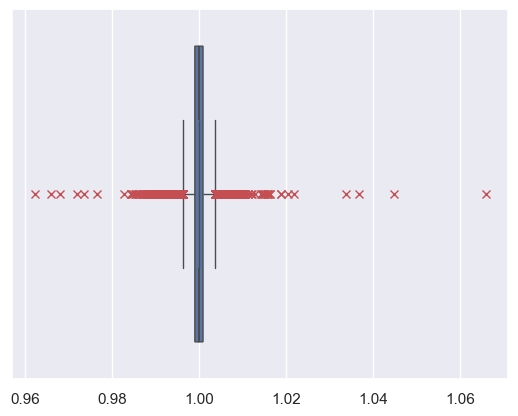

In [166]:
sns.boxplot(
    x=X_test[:,-1,:][:,1],  
    notch=True,
    flierprops={"markeredgecolor":"r", "marker": "x"}
)

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/4208190987.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='upper right')


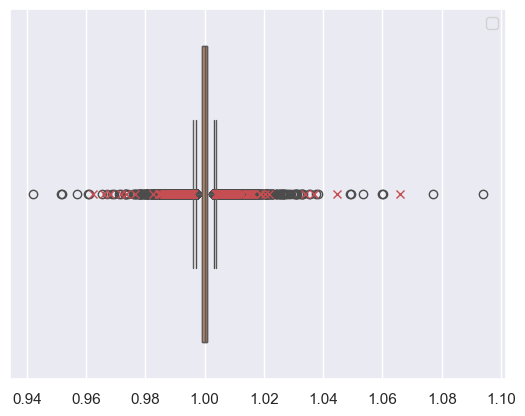

In [167]:
ax = sns.boxplot(
    x=X_train_dat[:,-1,:][:,1],  
)
sns.boxplot(
    x=X_test[:,-1,:][:,1],  
    ax=ax, 
    flierprops={"markeredgecolor":"r", "marker": "x"},
)
plt.legend(loc='upper right')

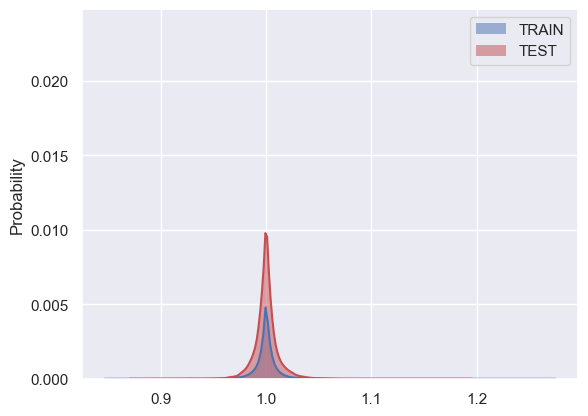

In [168]:

ax = sns.histplot(x=X_train_dat.reshape(-1, X_train_dat.shape[-1])[:,0],  stat="probability", kde=True, label="TRAIN")
sns.histplot(
    x=X_test.reshape(-1, X_test.shape[-1])[:,0],  
    stat="probability", 
    kde=True, 
    ax=ax, 
    color="r",
    label="TEST")
plt.legend(loc='upper right')

## Correlation

To simplify, we try to find correlation between all features X t-0 and target y t+1

In [169]:
def plot_hist_cat(x, data, title):
    '''
    Plot histogram count of categorical data 
    Add proportional information
    '''
    ser_val = data[x].value_counts(dropna=False)
    pc_val = ser_val.values / data[x].shape[0]

    sns.catplot(x=x, kind="count", palette="ch:.25", data=data, 
                height=5, 
                aspect=1.7,
                order=ser_val.index)
    fig = plt.gcf()
    ax = fig.gca()

    for K, y_val in enumerate(ser_val.values):
        ax.text(K, y_val, '{:.2f}'.format(pc_val[K]))
    
    ax.set_title(title)
    
    
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    
    return ser_val

def contingency_table(X, Y, data):
    '''
    Calculate Chi-2 heatmap into contingency table for 
    X event and Y event
    and p value of independance
    '''
    c = data[[X,Y]].pivot_table(index=X, columns=Y, aggfunc=len)

    c = c.fillna(0) # on remplace les valeurs nulles par des 0

    chi2, p, dof, expected = stats.chi2_contingency(c)

    return c, chi2, p, dof, expected



def plot_cont(X, Y, data, liste_cat=None):
    '''
    Calculate Chi-2 heatmap into contingency table for 
    X event and Y event
    '''
    c, chi2, p, dof, expected = contingency_table(X, Y, data)
    print("expected: ", expected)
    
    tx = data[X].value_counts()
    ty = data[Y].value_counts()
    
    cont = c.copy()
    cont.loc[:,"Total"] = tx
    cont.loc["total",:] = ty
    cont.loc["total","Total"] = len(data)
    
    print(cont)

    tx = pd.DataFrame(tx)
    ty = pd.DataFrame(ty)
    tx.columns = ["foo"]
    ty.columns = ["foo"]
    n = len(data)
    indep = tx.dot(ty.T) / n
    
    # calcul du signe (add-on)
    d_sign = (c-indep) / np.fabs(c-indep)
    
    mesure = d_sign * (c-indep)**2 / indep
    
    # patch sign
    xi_n = np.fabs(mesure).sum().sum()
    print("xi_n = ", xi_n)
    
    print("chi2: ", chi2)
    print("dof: ", dof)
    print("p: ", p)
    print(f"We have we have a {100*p:.4f}% chance for H0 to be true.")
    print("H0 : independance of distributions")
    print("H1 : distribution are not independant : we reject H0")
    # plot
    #print(c.shape)
    fig = plt.figure(figsize = (7/5*c.shape[1], 6/4*c.shape[0]))
    sns.heatmap(mesure/xi_n, annot=c, fmt=".0f", center=0)
    ax = fig.gca()
    ax.set_title(Y + "= f( " + X + ")")
    plt.show()
    
    return c

In [170]:
def plot_corr(corr_matrix, title='Corrélation with 2 variables', aspect=None, size=25):
    # Afficher la matrice de corrélation
    if aspect is None:
        aspect = 1
    fig_size = (size, size*len(corr_matrix.index)/len(corr_matrix.columns))
    fig, ax = plt.subplots(figsize=fig_size)
    im = ax.matshow(corr_matrix, aspect=aspect)
    plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, rotation=90)
    plt.yticks(range(len(corr_matrix.index)), corr_matrix.index)
    plt.title(title)
    fig.colorbar(im)
    plt.show()

### Linear Corr

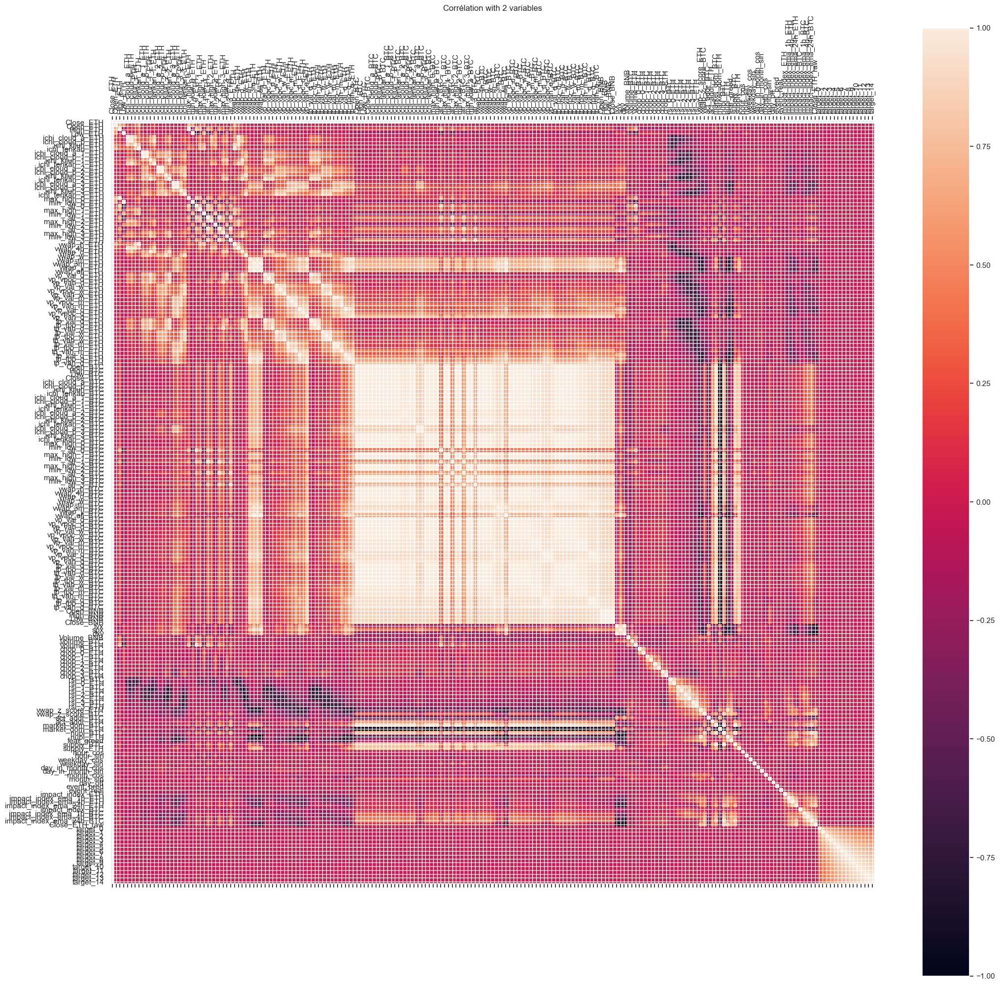

In [171]:
nb_plot = len(list_col_select)
list_col_targets = [ f"target_{n_t}" for n_t in range(FUTURE_TARGET)]
list_col_corr = list_col_select[:nb_plot] + list_col_targets

# Créer un DataFrame pandas à partir des données d'entrée X et de la variable à prédire y
#df = pd.DataFrame(np.hstack((X_train[:,-1,:nb_plot], y_train[:,0][:, np.newaxis])), 
#    columns=list_col_select[:nb_plot] + ['target'])
df = pd.DataFrame(np.hstack((X_train_dat[:,-1,:nb_plot], y_train)), 
    columns=list_col_corr)
# Calculer la matrice de corrélation
corr_matrix = df.corr()

fig = plot_corr(corr_matrix)


In [172]:
y_train.shape

(268188, 15)

In [173]:
list_col_corr

['Close_ETH',
 'Open_ETH',
 'High_ETH',
 'Low_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH',
 'vp_vah_w_ETH',
 'vp_val_m_ETH',
 'vp_vpoc_m_ETH',
 'vp_vah_m_ETH',
 'vp_val_q_ETH',
 'vp_vpoc_q_ETH',
 'vp_vah_q_ETH',
 'tp_val_d_ETH',
 'tp_tpo_d_ETH',
 'tp_vah_d_ETH',
 'tp_val_w_ET

In [174]:
list_col_select

['Close_ETH',
 'Open_ETH',
 'High_ETH',
 'Low_ETH',
 'ichi_cloud_a_ETH',
 'ichi_cloud_b_ETH',
 'ichi_kijun_ETH',
 'ichi_tenkan_ETH',
 'ichi_cloud_a_1_ETH',
 'ichi_cloud_b_1_ETH',
 'ichi_kijun_1_ETH',
 'ichi_tenkan_1_ETH',
 'ichi_cloud_a_2_ETH',
 'ichi_cloud_b_2_ETH',
 'ichi_kijun_2_ETH',
 'ichi_tenkan_2_ETH',
 'ichi_cloud_a_3_ETH',
 'ichi_cloud_b_3_ETH',
 'ichi_kijun_3_ETH',
 'ichi_tenkan_3_ETH',
 'max_high_0_ETH',
 'min_low_0_ETH',
 'atr_0_ETH',
 'max_high_1_ETH',
 'min_low_1_ETH',
 'atr_1_ETH',
 'max_high_2_ETH',
 'min_low_2_ETH',
 'atr_2_ETH',
 'max_high_3_ETH',
 'min_low_3_ETH',
 'atr_3_ETH',
 'vwap_h_ETH',
 'vwap_4h_ETH',
 'vwap_d_ETH',
 'vwap_w_ETH',
 'vwap_m_ETH',
 'vwap_3m_ETH',
 'vwap_y_ETH',
 'vwap_all_ETH',
 'vp_val_d_ETH',
 'vp_vpoc_d_ETH',
 'vp_vah_d_ETH',
 'vp_val_w_ETH',
 'vp_vpoc_w_ETH',
 'vp_vah_w_ETH',
 'vp_val_m_ETH',
 'vp_vpoc_m_ETH',
 'vp_vah_m_ETH',
 'vp_val_q_ETH',
 'vp_vpoc_q_ETH',
 'vp_vah_q_ETH',
 'tp_val_d_ETH',
 'tp_tpo_d_ETH',
 'tp_vah_d_ETH',
 'tp_val_w_ET

In [175]:
df.filter(list_col_select)

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real,impact_index_ETH,impact_index_ema_1h_ETH,impact_index_ema_4h_ETH,impact_index_ema_24h_ETH,impact_index_BTC,impact_index_ema_1h_BTC,impact_index_ema_4h_BTC,impact_index_ema_24h_BTC,Close_ETH_raw
0,1.0,0.999782,1.000109,0.999774,0.999171,0.999736,0.998393,0.999464,2.180438,2.176148,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.540039
1,1.0,0.999548,1.000008,0.999540,0.998785,0.999276,0.998113,0.999184,2.179435,2.175147,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1195.089966
2,1.0,1.000084,1.000193,0.999841,0.998860,0.999351,0.998243,0.999477,2.179599,2.175311,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1195.000000
3,1.0,1.000770,1.000770,0.999900,0.999669,1.000113,0.999003,1.000239,2.181260,2.176969,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.089966
4,1.0,0.999330,1.000025,0.999330,0.999178,0.999443,0.998335,0.999569,2.179799,2.175511,...,0.0,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,0.349724,1194.890015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268183,1.0,1.000300,1.001526,0.999087,0.991569,0.989072,1.000620,1.001795,0.963267,0.946999,...,0.0,1.207414,1.248751,1.220811,1.047688,1.467024,0.824876,0.980454,0.972820,3702.030029
268184,1.0,0.999746,1.000370,0.999198,0.991601,0.988821,1.000366,1.001541,0.963022,0.946759,...,0.0,1.207414,1.248751,1.220811,1.047688,1.467024,0.824876,0.980454,0.972820,3702.969971
268185,1.0,1.000451,1.000916,0.999241,0.992160,0.989378,1.000839,1.001990,0.963454,0.947184,...,0.0,1.207414,1.248751,1.220811,1.047688,1.467024,0.824876,0.980454,0.972820,3701.310059
268186,1.0,1.000354,1.001276,0.999370,0.993068,0.990115,1.001436,1.001496,0.963793,0.947516,...,0.0,1.207414,1.248751,1.220811,1.047688,1.467024,0.824876,0.980454,0.972820,3700.010010


In [176]:
df.filter(list_col_targets)

,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,target_10,target_11,target_12,target_13,target_14
0,1.000460,1.000385,0.999623,1.000293,0.999816,1.000050,0.999498,0.999506,0.999858,0.999925,0.999858,1.000226,0.999891,1.000151,0.999858
1,0.999925,0.999163,0.999833,0.999356,0.999590,0.999038,0.999046,0.999398,0.999464,0.999398,0.999766,0.999431,0.999690,0.999398,0.998803
2,0.999238,0.999908,0.999431,0.999665,0.999113,0.999121,0.999473,0.999540,0.999473,0.999841,0.999506,0.999766,0.999473,0.998879,0.998594
3,1.000670,1.000193,1.000427,0.999874,0.999883,1.000234,1.000301,1.000234,1.000603,1.000268,1.000528,1.000234,0.999640,0.999355,1.000427
4,0.999523,0.999757,0.999205,0.999213,0.999565,0.999632,0.999565,0.999933,0.999598,0.999858,0.999565,0.998971,0.998686,0.999757,0.999732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268183,1.000254,0.999806,0.999454,1.000205,0.999273,0.999352,0.999519,0.998739,0.999816,1.002120,1.004668,1.005046,1.006342,1.005735,1.007647
268184,0.999552,0.999201,0.999951,0.999020,0.999098,0.999265,0.998485,0.999563,1.001866,1.004413,1.004791,1.006087,1.005479,1.007391,1.015585
268185,0.999649,1.000400,0.999468,0.999546,0.999714,0.998933,1.000011,1.002315,1.004863,1.005241,1.006538,1.005930,1.007843,1.016040,1.013255
268186,1.000751,0.999819,0.999897,1.000065,0.999284,1.000362,1.002668,1.005216,1.005595,1.006892,1.006284,1.008197,1.016397,1.013611,1.015324


In [177]:
df["Close_ETH_raw"].corr(df["target_14"])

np.float64(-0.015099134798680422)

In [178]:
df.filter(list_col_select).corrwith(df["target_14"])

/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3045: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3046: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Close_ETH                        NaN
Open_ETH                    0.005917
High_ETH                    0.020541
Low_ETH                    -0.014234
ichi_cloud_a_ETH           -0.007850
                              ...   
impact_index_BTC            0.020570
impact_index_ema_1h_BTC     0.015222
impact_index_ema_4h_BTC     0.005312
impact_index_ema_24h_BTC   -0.000749
Close_ETH_raw              -0.015099
Length: 185, dtype: float64

In [179]:
df.filter(list_col_select).corrwith(df.filter(list_col_targets))

Close_BNB          NaN
Close_BTC          NaN
Close_ETH          NaN
Close_ETH_raw      NaN
High_BNB           NaN
                    ..
vwap_y_ETH         NaN
vwap_z_score_BTC   NaN
vwap_z_score_ETH   NaN
weekday_cos        NaN
weekday_sin        NaN
Length: 200, dtype: float64

In [180]:
len(list_col_select)

185

In [181]:
nb_plot

185

In [182]:
# check if new  data in df_feat
# hash inputs
hash_correl_inputs = (
    get_data_hash(df_feat) + 
    get_data_hash(PAST_HISTORY) + 
    get_data_hash(FUTURE_TARGET) +
    get_data_hash(X_train_dat[:, 0, :nb_plot])
)
# load old file hash
path_correl_hash = os.path.join(path_data, 'correl_inputs_hash.txt')
hash_correl_inputs_old = load_hash(path_correl_hash)

# compare hash
if hash_correl_inputs == hash_correl_inputs_old:
    print("hash match: mode LOAD correl ")
    # load data output
    arr_corr_matrix_targets = np.load(path_arr_corr_matrix_targets)
    mode_correl = False
else:
    print("hash not match : mode REDO correl")
    mode_correl = True

hash match: mode LOAD correl 


In [183]:
#mode_correl = True

In [184]:
# Assuming the following variables are pre-defined from your environment:
# PAST_HISTORY: int
# X_train_dat: np.ndarray (e.g., shape: num_samples, total_past_steps, num_total_features)
# y_train: np.ndarray (e.g., shape: num_samples, num_targets or num_samples for single target)
# list_col_select: list of strings (names of all features)
# nb_plot: int (number of features to use from X_train_dat, e.g., list_col_select[:nb_plot])
# list_col_targets: list of strings (names of target columns)
# list_col_corr: list of strings (from original code, not strictly needed for optimized version but was used for column naming in the old approach)
# These are the names of the feature columns we'll be selecting from X_train_dat.
# These will form the row index of our correlation matrix for each I_past.
feature_names_to_correlate = list_col_select[:nb_plot]

if mode_correl:
    # Optimized code for calculating correlations:
    list_corr_optimized = []
    # Create a DataFrame for the target(s) once, as it's constant across I_past iterations.
    # This assumes y_train has columns corresponding to list_col_targets.
    # If y_train is 1D (num_samples,), list_col_targets should contain one target name.
    y_train_df = pd.DataFrame(y_train, columns=list_col_targets)

    for I_past in range(PAST_HISTORY):
        # Extract the relevant feature data for the current I_past step
        # Shape: (num_samples, nb_plot)
        current_X_data = X_train_dat[:, I_past, :nb_plot]
        
        # Create a DataFrame for the features of the current I_past step
        df_features = pd.DataFrame(current_X_data, columns=feature_names_to_correlate)
        
        # Initialize a DataFrame to store correlations for this I_past step
        # Rows: features (feature_names_to_correlate)
        # Columns: targets (list_col_targets)
        # This ensures consistent shape and ordering.
        corr_matrix_for_this_past_step = pd.DataFrame(
            index=feature_names_to_correlate,
            columns=list_col_targets,
            dtype=float  # Ensure float type for correlations
        )
        
        # Calculate correlation of all features with each target column
        for target_col_name in list_col_targets:
            # df_features.corrwith() computes the correlation of each column in df_features
            # with the provided Series (y_train_df[target_col_name]).
            # The result is a Series indexed by feature_names_to_correlate.
            corrs_with_target = df_features.corrwith(y_train_df[target_col_name])
            corr_matrix_for_this_past_step[target_col_name] = corrs_with_target
                
        list_corr_optimized.append(corr_matrix_for_this_past_step)

    # Convert the list of DataFrames to a 3D NumPy array
    # Each DataFrame in list_corr_optimized has shape (len_feat, len_targets)
    # So, arr_corr_matrix_targets will have shape (PAST_HISTORY, len_feat, len_targets)
    # The final variable name 'arr_corr_matrix_targets' matches the original script's output.
    arr_corr_matrix_targets = np.array([df.values for df in list_corr_optimized])
    np.save(path_arr_corr_matrix_targets, arr_corr_matrix_targets)
    # save hash
    with open(path_correl_hash, 'w') as file:
        file.write(hash_correl_inputs)
        
# To check the shape (optional, similar to original script's last line intent):
print(arr_corr_matrix_targets.shape)

(72, 185, 15)


In [185]:
min_corr = np.min(arr_corr_matrix_targets, axis=0)
# create a same col/row than corr_matrix_targets  dataframe using the array max_corr 
min_corr_matrix_targets = pd.DataFrame(min_corr, columns=list_col_targets, index=feature_names_to_correlate)
min_corr_matrix_targets

,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,target_10,target_11,target_12,target_13,target_14
Close_ETH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Open_ETH,-0.002135,-0.003694,-0.005249,-0.005862,-0.006691,-0.007325,-0.007763,-0.008458,-0.009237,-0.009945,-0.010811,-0.011842,-0.012825,-0.013477,-0.014127
High_ETH,-0.001352,-0.003092,-0.004864,-0.005529,-0.006111,-0.006512,-0.006936,-0.007643,-0.008398,-0.008998,-0.009849,-0.010794,-0.011686,-0.012361,-0.012945
Low_ETH,-0.016403,-0.009112,-0.013076,-0.010841,-0.013481,-0.014751,-0.013207,-0.013077,-0.013559,-0.012340,-0.012212,-0.012695,-0.013609,-0.014362,-0.015051
ichi_cloud_a_ETH,-0.001949,-0.003621,-0.005282,-0.005971,-0.006702,-0.007131,-0.007594,-0.008372,-0.009223,-0.009976,-0.010827,-0.011878,-0.012832,-0.013538,-0.014245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
impact_index_BTC,0.003186,0.004658,0.005766,0.006692,0.007636,0.008365,0.009172,0.009952,0.010857,0.011714,0.012307,0.012922,0.013579,0.014276,0.015048
impact_index_ema_1h_BTC,0.001972,0.002821,0.003587,0.004231,0.004797,0.005368,0.005908,0.006460,0.006934,0.007380,0.007779,0.008166,0.008552,0.008924,0.009305
impact_index_ema_4h_BTC,0.000429,0.000622,0.000804,0.000962,0.001107,0.001256,0.001404,0.001541,0.001667,0.001786,0.001898,0.002012,0.002114,0.002221,0.002313
impact_index_ema_24h_BTC,-0.000459,-0.000642,-0.000780,-0.000891,-0.000982,-0.001060,-0.001127,-0.001199,-0.001264,-0.001328,-0.001383,-0.001434,-0.001483,-0.001528,-0.001575


In [186]:
max_corr = np.max(arr_corr_matrix_targets, axis=0)
# create a same col/row thatn corr_matrix_targets  dataframe using the array max_corr 
max_corr_matrix_targets = pd.DataFrame(max_corr, columns=list_col_targets, index=feature_names_to_correlate)
max_corr_matrix_targets

,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,target_10,target_11,target_12,target_13,target_14
Close_ETH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Open_ETH,0.012088,0.012131,0.007590,0.008464,0.009446,0.010541,0.011327,0.011584,0.011364,0.011534,0.011307,0.010616,0.010322,0.010225,0.009642
High_ETH,0.014087,0.017193,0.012490,0.013520,0.015006,0.018259,0.018034,0.018324,0.017805,0.019088,0.019258,0.019250,0.018740,0.018904,0.020541
Low_ETH,0.009693,0.007042,0.006285,0.007282,0.007811,0.008587,0.009230,0.009171,0.008556,0.008394,0.007973,0.007168,0.006291,0.005894,0.005392
ichi_cloud_a_ETH,0.001295,0.000409,-0.000994,-0.001200,-0.001561,-0.001733,-0.001933,-0.002732,-0.003655,-0.004239,-0.004927,-0.005908,-0.006714,-0.007287,-0.007850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
impact_index_BTC,0.006157,0.008718,0.010573,0.012134,0.013182,0.014256,0.015140,0.015980,0.016799,0.017569,0.018317,0.018954,0.019543,0.020124,0.020690
impact_index_ema_1h_BTC,0.004149,0.005776,0.007054,0.008084,0.009001,0.009815,0.010534,0.011209,0.011867,0.012503,0.013087,0.013657,0.014199,0.014724,0.015222
impact_index_ema_4h_BTC,0.001427,0.001973,0.002408,0.002770,0.003090,0.003376,0.003630,0.003871,0.004112,0.004343,0.004564,0.004778,0.004970,0.005154,0.005331
impact_index_ema_24h_BTC,-0.000199,-0.000285,-0.000357,-0.000411,-0.000454,-0.000495,-0.000531,-0.000569,-0.000601,-0.000632,-0.000658,-0.000679,-0.000703,-0.000726,-0.000749


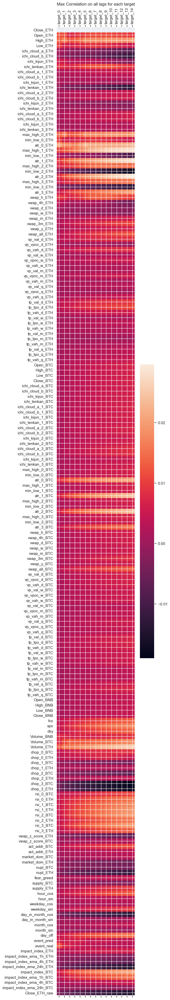

In [187]:
#corr_matrix_targets = corr_matrix.copy().loc[list_col_select[:nb_plot], list_col_targets]
fig = plot_corr(max_corr_matrix_targets, title = "Max Correlation on all lags for each target", size=5)

In [188]:
arr_corr_matrix_targets.shape

(72, 185, 15)

In [189]:

# create a same col/row thatn corr_matrix_targets  dataframe using the array max_corr 
corr_matrix_targets = pd.DataFrame(arr_corr_matrix_targets[-1,:,:], columns=list_col_targets, index=feature_names_to_correlate)
corr_matrix_targets

,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,target_10,target_11,target_12,target_13,target_14
Close_ETH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Open_ETH,0.009466,0.012131,0.004426,0.004689,0.002619,0.003065,0.005464,0.006426,0.005623,0.006187,0.007393,0.006591,0.005066,0.005110,0.005917
High_ETH,0.014087,0.017193,0.012490,0.013520,0.015006,0.018259,0.018034,0.018324,0.017805,0.019088,0.019258,0.019250,0.018740,0.018904,0.020541
Low_ETH,-0.016403,-0.009112,-0.013076,-0.010841,-0.013481,-0.014751,-0.013207,-0.013077,-0.013559,-0.012340,-0.012212,-0.012425,-0.013347,-0.014167,-0.014234
ichi_cloud_a_ETH,0.001295,0.000409,-0.000994,-0.001200,-0.001561,-0.001733,-0.001933,-0.002732,-0.003655,-0.004239,-0.004927,-0.005908,-0.006714,-0.007287,-0.007850
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
impact_index_BTC,0.004666,0.006926,0.008624,0.010034,0.011413,0.012544,0.013862,0.015079,0.016292,0.017435,0.018137,0.018927,0.019543,0.020081,0.020570
impact_index_ema_1h_BTC,0.003827,0.005439,0.006628,0.007648,0.008592,0.009459,0.010347,0.011115,0.011841,0.012503,0.013087,0.013657,0.014199,0.014724,0.015222
impact_index_ema_4h_BTC,0.001299,0.001849,0.002244,0.002600,0.002937,0.003246,0.003560,0.003823,0.004076,0.004304,0.004513,0.004722,0.004927,0.005124,0.005312
impact_index_ema_24h_BTC,-0.000222,-0.000306,-0.000386,-0.000442,-0.000482,-0.000516,-0.000540,-0.000575,-0.000606,-0.000638,-0.000666,-0.000688,-0.000709,-0.000728,-0.000749


#### Best Max Corr Features

In [190]:
# (72, 103, 15)
ind = np.unravel_index(
    np.argsort(np.nan_to_num(arr_corr_matrix_targets, nan=0.0), axis=None), 
    arr_corr_matrix_targets.shape,
)
# 30th first features
nb_lag_corr_max = 50
# for lag_curr, feat_curr, target_curr in zip(ind[0][-nb_lag_corr_max:], ind[1][-nb_lag_corr_max:], ind[2][-nb_lag_corr_max:]): #ind[0][-30:]
    
#     corr_curr = arr_corr_matrix_targets[lag_curr, feat_curr, target_curr]
#     print(f"{feature_names_to_correlate[feat_curr]}, lag: {lag_curr}, target: {target_curr}, corr: {corr_curr}")

# 1. Get the slices of your indices
lags = ind[0][-nb_lag_corr_max:]
feature_indices = ind[1][-nb_lag_corr_max:]
target_indices = ind[2][-nb_lag_corr_max:]

# 2. Create the DataFrame from a dictionary of lists
corr_max_df_efficient = pd.DataFrame({
    'Feature': [feature_names_to_correlate[i] for i in feature_indices],
    'Lag': lags,
    'Target': target_indices,
    'Correlation': [arr_corr_matrix_targets[lag, feat, targ] for lag, feat, targ in zip(lags, feature_indices, target_indices)]
})

corr_max_df_efficient.sort_values(by='Correlation', ascending=False)


,Feature,Lag,Target,Correlation
49,atr_2_ETH,71,14,0.029702
48,atr_2_ETH,70,14,0.029464
47,atr_2_ETH,69,14,0.029403
46,atr_2_ETH,68,14,0.029278
45,atr_2_ETH,67,14,0.029151
44,atr_2_ETH,66,14,0.029008
43,atr_2_ETH,65,14,0.028902
42,atr_2_ETH,64,14,0.028833
41,atr_2_ETH,71,13,0.028760
40,atr_2_ETH,63,14,0.028752


max_high_h_ETH & Volume_ETH are the best positive impact on price.  
Explanation : 
- have a high higher in the last hour lead to have more chance to have a higher value in the next hour
- volume also  

Direction is kept 


#### Best Min Corr Features

In [191]:
# 1. Get the slices of your indices
lags = ind[0][0:nb_lag_corr_max]
feature_indices = ind[1][0:nb_lag_corr_max]
target_indices = ind[2][0:nb_lag_corr_max]

# 2. Create the DataFrame from a dictionary of lists
corr_min_df_efficient = pd.DataFrame({
    'Feature': [feature_names_to_correlate[i] for i in feature_indices],
    'Lag': lags,
    'Target': target_indices,
    'Correlation': [arr_corr_matrix_targets[lag, feat, targ] for lag, feat, targ in zip(lags, feature_indices, target_indices)]
})

corr_min_df_efficient.sort_values(by='Correlation', ascending=True)

,Feature,Lag,Target,Correlation
0,min_low_2_ETH,71,14,-0.030734
1,min_low_2_ETH,71,13,-0.029792
2,min_low_2_ETH,70,14,-0.029025
3,min_low_2_ETH,69,14,-0.028609
4,min_low_2_ETH,71,12,-0.028553
5,min_low_2_ETH,70,13,-0.028185
6,min_low_2_ETH,68,14,-0.027611
7,min_low_2_ETH,69,13,-0.027568
8,min_low_2_ETH,70,12,-0.027220
9,min_low_2_ETH,71,11,-0.026984


In [192]:
np.nanmin(arr_corr_matrix_targets)

np.float64(-0.030734176562381484)

min_low_h_ETH & Close_ETH_raw are the best negative impact on price.  
Explanation : 
- have a min low higher in the last hour lead to have more chance to have a lower value in the next hour : direction kept
- have a price higher, so return to mean value


#### Last Lag Max Correlation

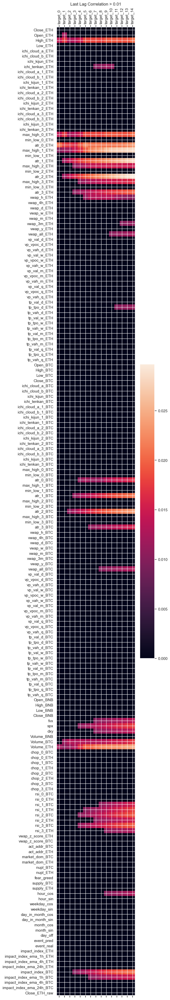

In [193]:
fig = plot_corr(
    corr_matrix_targets.where(corr_matrix_targets>0.01, 0), 
    title = "Last Lag Correlation > 0.01", 
    size=5)

#### Max Correlation on all lags

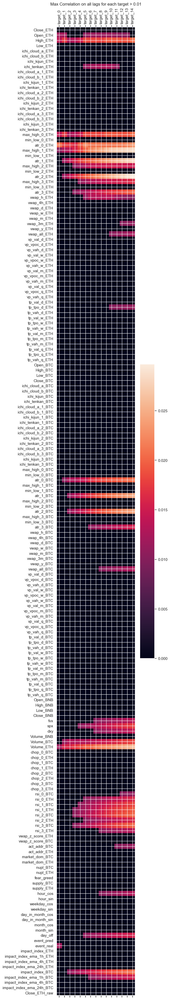

In [194]:
fig = plot_corr(
    max_corr_matrix_targets.where(max_corr_matrix_targets>0.01, 0),
    title="Max Correlation on all lags for each target > 0.01",
    size=5)

<Axes: >

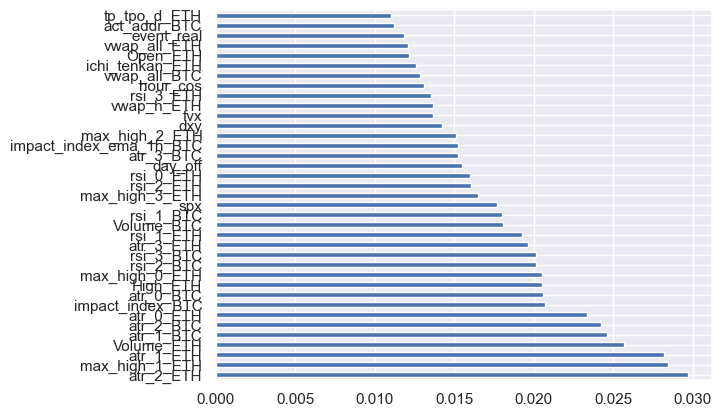

In [195]:
max_max_corr = max_corr_matrix_targets.max(axis=1).sort_values(ascending=False)
max_max_corr[max_max_corr.values>0.011].plot.barh()

#### Test on the highest corr


In [196]:
df = pd.DataFrame(np.hstack((X_train_dat[:, -1, :nb_plot], y_train)), 
        columns=list_col_corr)

In [197]:
df["target_cat"] = "neutral"
df.loc[df["target_14"] >= 1 + 0.5/100, "target_cat"] = "up"
df.loc[df["target_14"] <= 1 - 0.5/100, "target_cat"] = "down"
df["target_cat"].value_counts()

target_cat
neutral    191512
up          39290
down        37386
Name: count, dtype: int64

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/215884474.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(x=x, kind="count", palette="ch:.25", data=data,


target_cat
neutral    191512
up          39290
down        37386
Name: count, dtype: int64

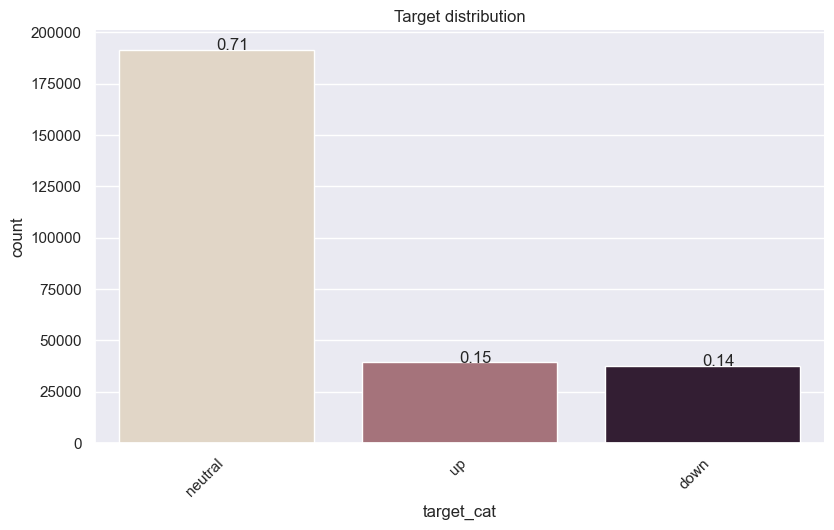

In [198]:
plot_hist_cat("target_cat", df, "Target distribution")

In [199]:
df["atr_2_ETH"].describe()

count    268188.000000
mean          0.002213
std           0.001238
min           0.000080
25%           0.001405
50%           0.001981
75%           0.002730
max           0.018392
Name: atr_2_ETH, dtype: float64

In [200]:
list_level=["neutral", "higher", "very-higher"]
df["atr_2_ETH_cat"] = "very-higher"
df.loc[df["atr_2_ETH"] <= 0.001405, "atr_2_ETH_cat"] = "higher"
df.loc[df["atr_2_ETH"] <= 0.002730, "atr_2_ETH_cat"] = "neutral"

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/215884474.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(x=x, kind="count", palette="ch:.25", data=data,


atr_2_ETH_cat
neutral        201136
very-higher     67052
Name: count, dtype: int64

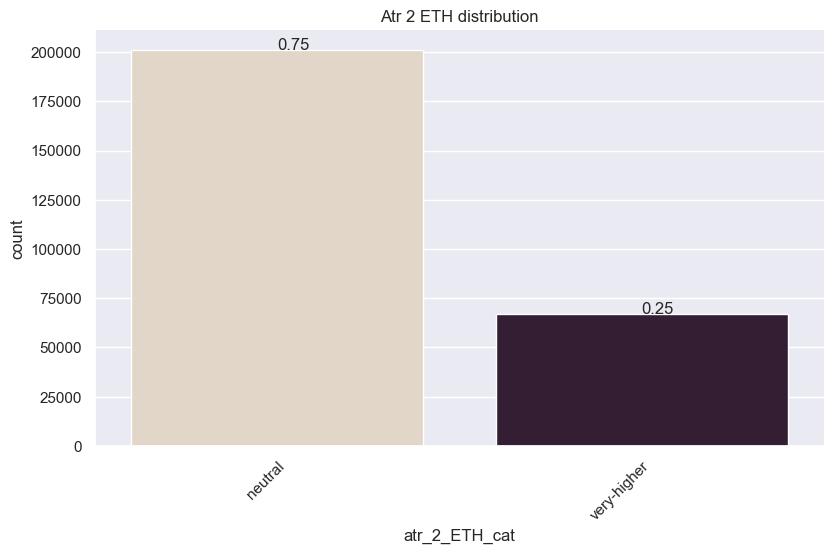

In [201]:
plot_hist_cat("atr_2_ETH_cat", df, "Atr 2 ETH distribution")

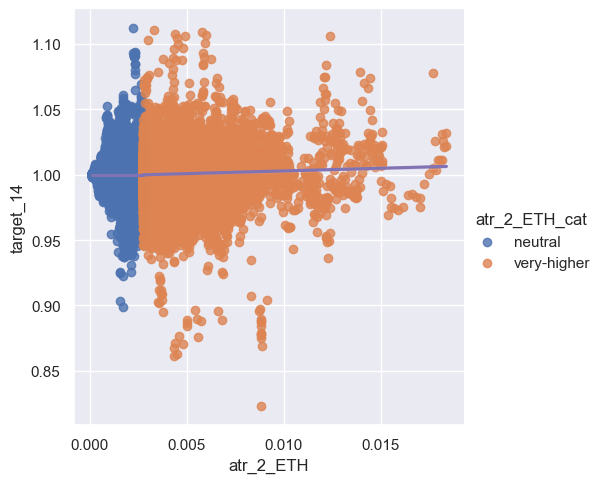

In [202]:
sns.lmplot(x="atr_2_ETH", y="target_14",
            hue="atr_2_ETH_cat", data=df,
           line_kws={"color": "C4"})

(0.98, 1.02)

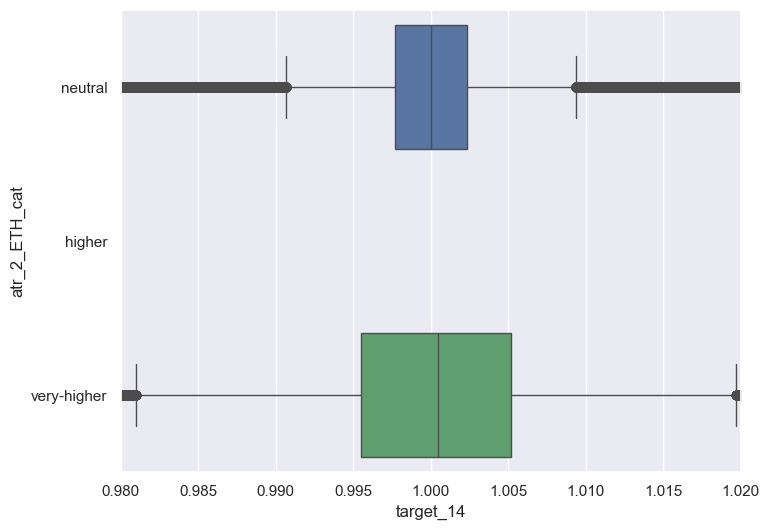

In [203]:
fig = plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x="target_14", y="atr_2_ETH_cat", 
    hue="atr_2_ETH_cat", dodge=False, 
    order=list_level, hue_order=list_level)
ax = fig.gca()
ax.set_xlim([0.98,1.02])  

expected:  [[ 28038.80298895 143630.42951959  29466.76749146]
 [  9347.19701105  47881.57048041   9823.23250854]]
target_cat        down   neutral       up     Total
atr_2_ETH_cat                                      
neutral        21952.0  157258.0  21926.0  201136.0
very-higher    15434.0   34254.0  17364.0   67052.0
total          37386.0  191512.0  39290.0  268188.0
xi_n =  18174.918583827835
chi2:  18174.918583827835
dof:  2
p:  0.0
We have we have a 0.0000% chance for H0 to be true.
H0 : independance of distributions
H1 : distribution are not independant : we reject H0


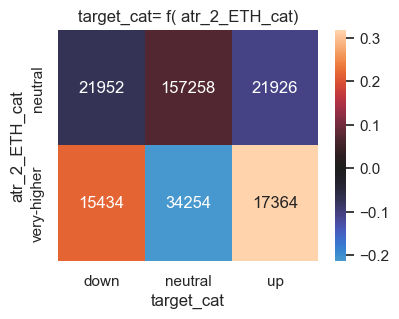

target_cat,down,neutral,up
atr_2_ETH_cat,,,
neutral,21952,157258,21926
very-higher,15434,34254,17364


In [204]:
plot_cont(X="atr_2_ETH_cat", Y="target_cat", data=df)

expected:  [[ 28038.80298895 143630.42951959  29466.76749146]
 [  9347.19701105  47881.57048041   9823.23250854]]
target_cat        down   neutral       up     Total
atr_2_ETH_cat                                      
neutral        21952.0  157258.0  21926.0  201136.0
very-higher    15434.0   34254.0  17364.0   67052.0
total          37386.0  191512.0  39290.0  268188.0
xi_n =  18174.918583827835
chi2:  18174.918583827835
dof:  2
p:  0.0
We have we have a 0.0000% chance for H0 to be true.
H0 : independance of distributions
H1 : distribution are not independant : we reject H0


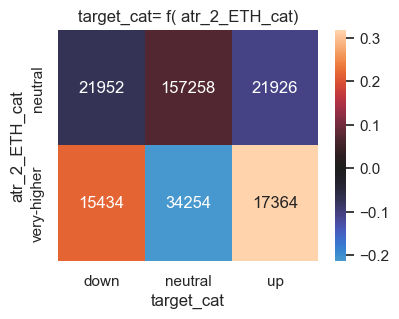

target_cat,down,neutral,up
atr_2_ETH_cat,,,
neutral,21952,157258,21926
very-higher,15434,34254,17364


In [205]:
plot_cont(X="atr_2_ETH_cat", Y="target_cat", data=df)

In [206]:
df["nupl_ETH"].describe()

count    268188.000000
mean          0.116105
std           0.194221
min          -0.775319
25%           0.033318
50%           0.103906
75%           0.256974
max           0.513805
Name: nupl_ETH, dtype: float64

In [207]:

mquantiles(df["nupl_ETH"], prob=[0.10, 0.90])

array([-0.07593075,  0.35576042])

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/215884474.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.catplot(x=x, kind="count", palette="ch:.25", data=data,


nupl_ETH_cat
neutral    181887
higher      70857
lower       15444
Name: count, dtype: int64

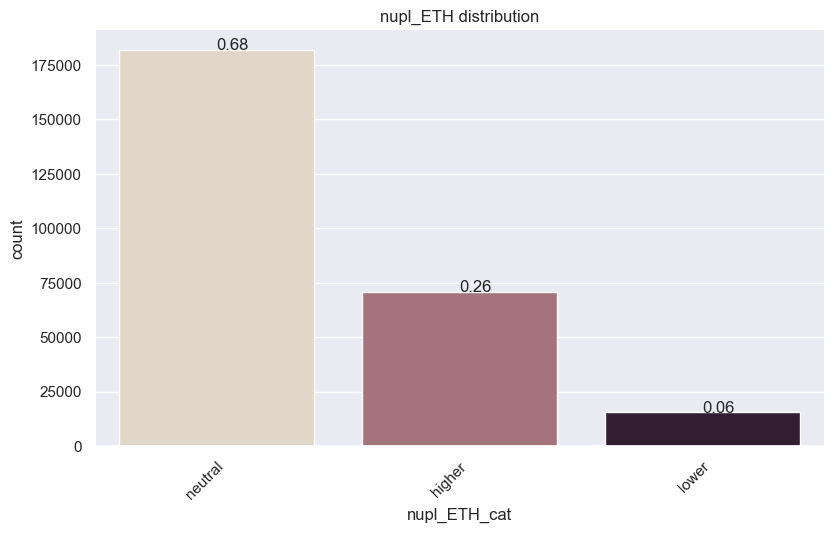

In [208]:

list_level=["lower", "neutral", "higher"]
df["nupl_ETH_cat"] = "neutral"
df.loc[df["nupl_ETH"] >= 0.25, "nupl_ETH_cat"] = "higher"
df.loc[df["nupl_ETH"] <= -0.25, "nupl_ETH_cat"] = "lower"
plot_hist_cat("nupl_ETH_cat", df, "nupl_ETH distribution")

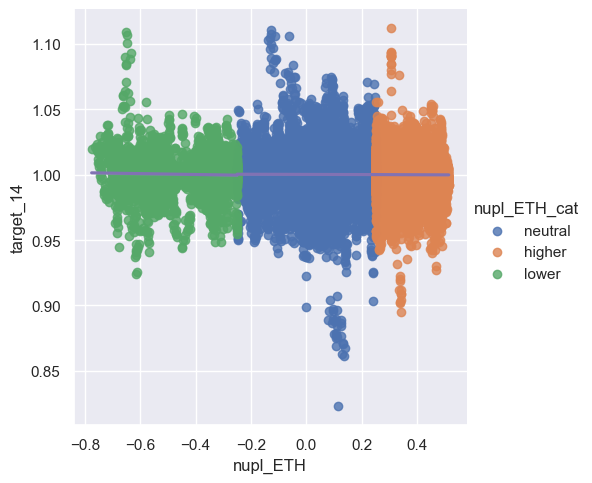

In [209]:
sns.lmplot(x="nupl_ETH", y="target_14", hue="nupl_ETH_cat", data=df,
           line_kws={"color": "C4"})

(0.98, 1.02)

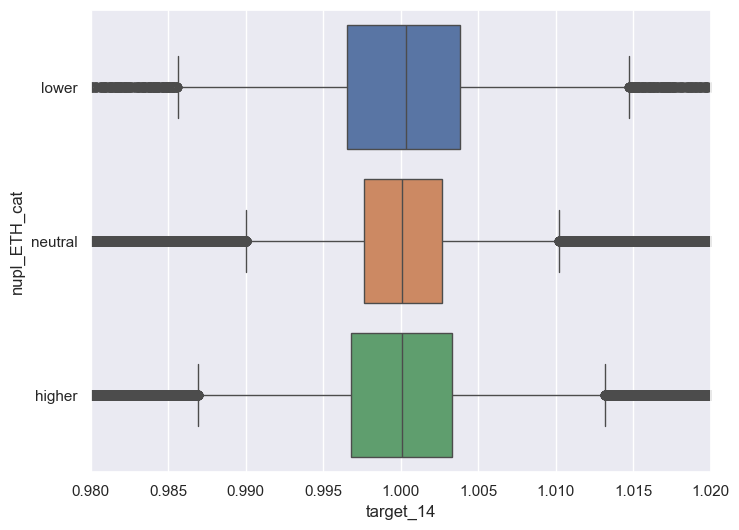

In [210]:
fig = plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x="target_14", y="nupl_ETH_cat", 
    hue="nupl_ETH_cat", dodge=False, 
    order=list_level, hue_order=list_level)
ax = fig.gca()
ax.set_xlim([0.98,1.02])  

expected:  [[  9877.62242158  50598.70607186  10380.67150656]
 [  2152.92773726  11028.49988814   2262.5723746 ]
 [ 25355.44984116 129884.79404     26646.75611884]]
target_cat       down   neutral       up     Total
nupl_ETH_cat                                      
higher        11792.0   47105.0  11960.0   70857.0
lower          2817.0    9702.0   2925.0   15444.0
neutral       22777.0  134705.0  24405.0  181887.0
total         37386.0  191512.0  39290.0  268188.0
xi_n =  2040.5525811967063
chi2:  2040.5525811967063
dof:  4
p:  0.0
We have we have a 0.0000% chance for H0 to be true.
H0 : independance of distributions
H1 : distribution are not independant : we reject H0


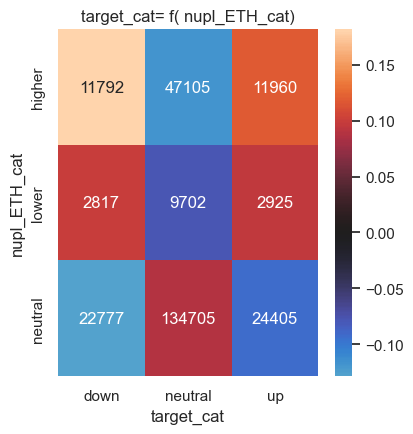

target_cat,down,neutral,up
nupl_ETH_cat,,,
higher,11792,47105,11960
lower,2817,9702,2925
neutral,22777,134705,24405


In [211]:
plot_cont(X="nupl_ETH_cat", Y="target_cat", data=df)

In [212]:
chi2 = 2159
indep = 35144.0/253677.0*69777.0
c = 11586
print("chi2: ", chi2)
print("indep: ", indep)
print("c: ", c)
print("chi2 abs part : ", (c-indep)**2/indep)
print("chi2 sign part : ", (c-indep) / np.fabs(c-indep))
print("% of chi2 : ", 100*(c-indep)**2/indep / chi2)


chi2:  2159
indep:  9666.79236982462
c:  11586
chi2 abs part :  381.03207215054994
chi2 sign part :  1.0
% of chi2 :  17.64854433305002


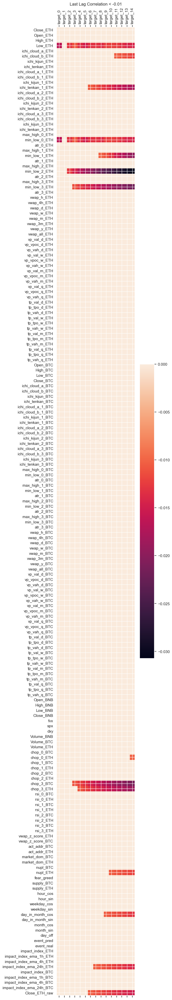

In [213]:
plot_corr(corr_matrix_targets.where(corr_matrix_targets<-0.01, 0), 
          title="Last Lag Correlation < -0.01", 
          size=5)

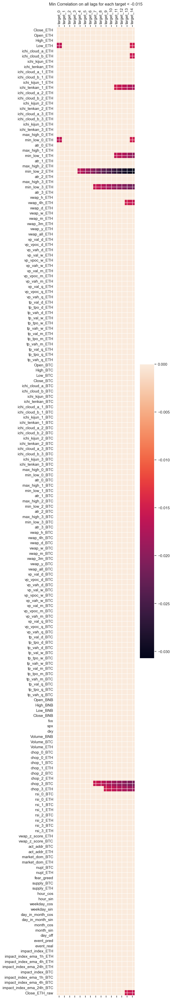

In [214]:
fig = plot_corr(min_corr_matrix_targets.where(min_corr_matrix_targets < -0.015, 0),
                title="Min Correlation on all lags for each target < -0.015",
                size=5)

Text(0, 0.5, 'Min Correlation on all lags for each target < -0.015')

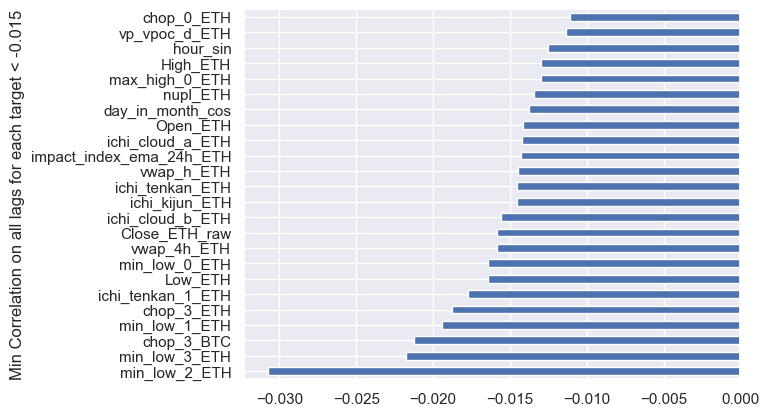

In [215]:
min_min_corr = min_corr_matrix_targets.min(axis=1).sort_values(ascending=True)
min_min_corr[min_min_corr.values<-0.011].plot.barh()
# get current axis
ax = plt.gca()
# set y-axis label
ax.set_ylabel("Min Correlation on all lags for each target < -0.015")

<Axes: >

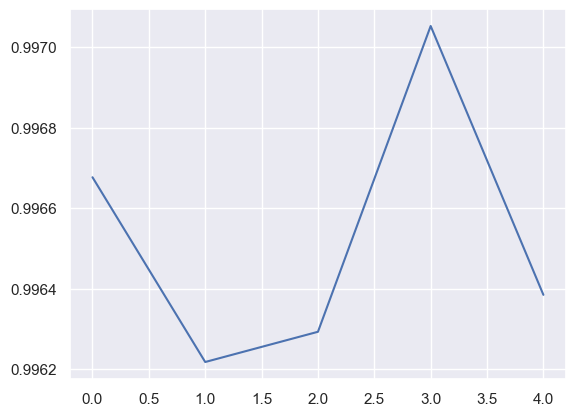

In [216]:
df["min_low_2_ETH"].head().plot()

In [217]:
df["min_low_2_ETH"].describe()

count    268188.000000
mean          0.990594
std           0.009516
min           0.831030
25%           0.987967
50%           0.993251
75%           0.996490
max           1.000000
Name: min_low_2_ETH, dtype: float64

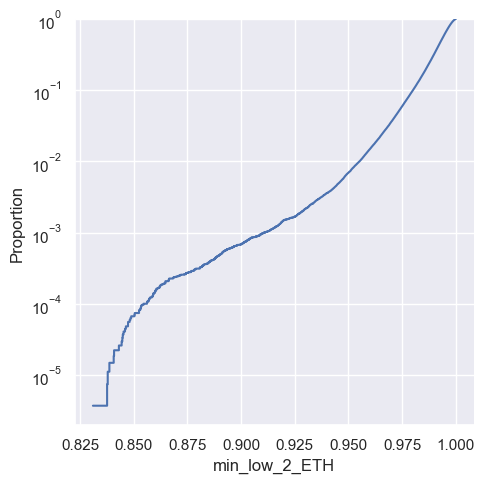

In [218]:
sns.displot(df, x="min_low_2_ETH", kind="ecdf", log_scale=(False, True))

In [219]:
df["target_14"].describe()

count    268188.000000
mean          1.000090
std           0.007208
min           0.823072
25%           0.997347
50%           1.000099
75%           1.002889
max           1.112129
Name: target_14, dtype: float64

In [220]:
df["target_1"].describe()

count    268188.000000
mean          1.000012
std           0.002656
min           0.907143
25%           0.998958
50%           1.000015
75%           1.001080
max           1.081058
Name: target_1, dtype: float64

<Axes: xlabel='target_14'>

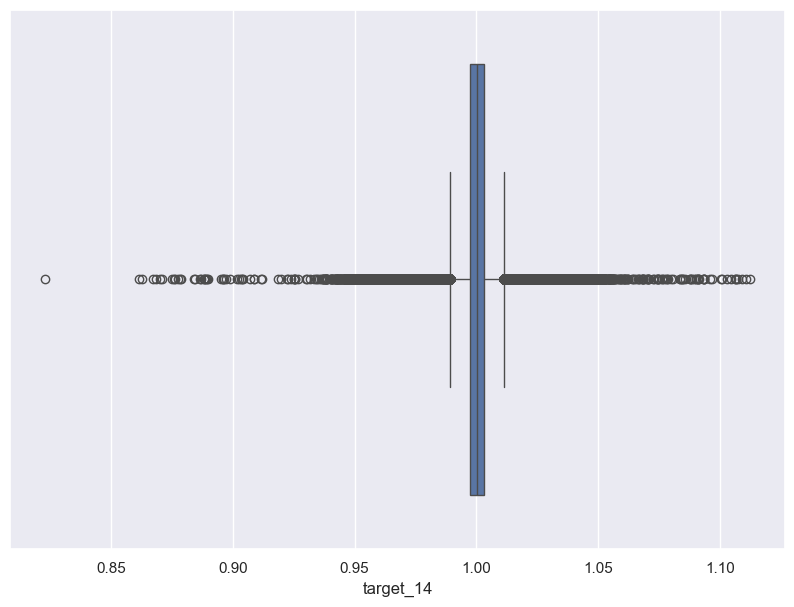

In [221]:
fig = plt.figure(figsize=(10, 7))
sns.boxplot(x=df["target_14"]) 

(0.98, 1.02)

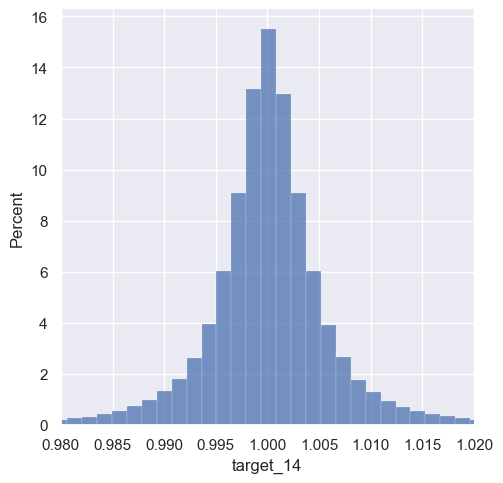

In [222]:
sns.displot(df, x="target_14", kind="hist", stat="percent", bins=200)
ax = plt.gca()
ax.set_xlim([0.98,1.02])

## Target cat by levels
Example :

To classify Targets we can say that : if we have : 
- a capital 10000$  
- leverage x10 maxi
- SL = -50$ / TP = 100$ / R = 2
- and we want to have 100$ of profit per days
- so:  0.1% up or down can be enough for target

We can use a level of >= 0.1% => "high" , <=-0.1% "low", otherwise "neutral"  

- BE CAREFUL : Hyperliquid for example can take 25% of trade if 0.1% is a trigger : 
  - maker fees : 0.015% (if trade out of orderbook (usually when limit order)
  - or taker fees : 0.038% (if market order)
  - funding 1h : 0.0014% ( funding rate will be positive, and the long position will pay the short position.)
  - TOTAL max 2 takers trades (open/close) + funding 1h max :  0.0774% => 77% of 0.1% !

In [223]:
df_targets = pd.DataFrame(y_train, columns=list_col_targets)
df_targets_test = pd.DataFrame(y_test, columns=list_col_targets)

In [224]:
target_level = 0.1/100

In [225]:
y_train.shape

(268188, 15)

In [226]:
y_train.max(axis=1) >= 1+target_level

array([False, False, False, ...,  True,  True,  True], shape=(268188,))

In [227]:
y_train.min(axis=1) <= 1-target_level

array([False,  True,  True, ...,  True, False,  True], shape=(268188,))

Not used anymore :  the last target value : 

In [228]:
Y = "target_last_cat"

df_targets[Y] = "neutral"
df_targets.loc[y_train[:,-1] >= 1+target_level, Y] = "high"
df_targets.loc[y_train[:,-1] <= 1-target_level, Y] = "low"
df_targets[Y].value_counts()

target_last_cat
high       108556
low        102983
neutral     56649
Name: count, dtype: int64

In [229]:
df_targets["target_last_cat"].value_counts()/df_targets.shape[0]

target_last_cat
high       0.404776
low        0.383996
neutral    0.211229
Name: count, dtype: float64

In [230]:
df_targets["target_14"].describe()

count    268188.000000
mean          1.000090
std           0.007208
min           0.823072
25%           0.997347
50%           1.000099
75%           1.002889
max           1.112129
Name: target_14, dtype: float64

In [231]:
df_targets["max_target"] = y_train.max(axis=1)
df_targets["min_target"] = y_train.min(axis=1)
df_targets

,target_0,target_1,target_2,target_3,target_4,target_5,target_6,target_7,target_8,target_9,target_10,target_11,target_12,target_13,target_14,target_last_cat,max_target,min_target
0,1.000460,1.000385,0.999623,1.000293,0.999816,1.000050,0.999498,0.999506,0.999858,0.999925,0.999858,1.000226,0.999891,1.000151,0.999858,neutral,1.000460,0.999498
1,0.999925,0.999163,0.999833,0.999356,0.999590,0.999038,0.999046,0.999398,0.999464,0.999398,0.999766,0.999431,0.999690,0.999398,0.998803,low,0.999925,0.998803
2,0.999238,0.999908,0.999431,0.999665,0.999113,0.999121,0.999473,0.999540,0.999473,0.999841,0.999506,0.999766,0.999473,0.998879,0.998594,low,0.999908,0.998594
3,1.000670,1.000193,1.000427,0.999874,0.999883,1.000234,1.000301,1.000234,1.000603,1.000268,1.000528,1.000234,0.999640,0.999355,1.000427,neutral,1.000670,0.999355
4,0.999523,0.999757,0.999205,0.999213,0.999565,0.999632,0.999565,0.999933,0.999598,0.999858,0.999565,0.998971,0.998686,0.999757,0.999732,neutral,0.999933,0.998686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268183,1.000254,0.999806,0.999454,1.000205,0.999273,0.999352,0.999519,0.998739,0.999816,1.002120,1.004668,1.005046,1.006342,1.005735,1.007647,high,1.007647,0.998739
268184,0.999552,0.999201,0.999951,0.999020,0.999098,0.999265,0.998485,0.999563,1.001866,1.004413,1.004791,1.006087,1.005479,1.007391,1.015585,high,1.015585,0.998485
268185,0.999649,1.000400,0.999468,0.999546,0.999714,0.998933,1.000011,1.002315,1.004863,1.005241,1.006538,1.005930,1.007843,1.016040,1.013255,high,1.016040,0.998933
268186,1.000751,0.999819,0.999897,1.000065,0.999284,1.000362,1.002668,1.005216,1.005595,1.006892,1.006284,1.008197,1.016397,1.013611,1.015324,high,1.016397,0.999284


Very important : we can see that the last target is not the best to use as a target,   
because it is not well distributed,   
so we will use the max and min, of all the targets, to create a new target   
But we take the first to appear above min/max threshold : +/-0.1%  
Example : 
- if the max is above 1.001 before min is below 0.999, then we will use the max as the target
- if the min is below 0.999 before max is above 1.001, then we will use the min as the target
- if none of them are above/below 1.001/0.999, then we will use the neutral target
  
##### First Strategy :  TP = SL

In [232]:
Y = "target_cat"
#df_targets = pd.DataFrame(y_train, columns=list_col_targets)
df_targets[Y] = "neutral"
# low cat : 
b_low = ((y_train.min(axis=1) <= 1-target_level) & (
    (y_train.argmin(axis=1) < y_train.argmax(axis=1)) |
    ((y_train.argmin(axis=1) > y_train.argmax(axis=1)) & (y_train.max(axis=1) < 1+target_level))
    )
)
df_targets.loc[b_low, Y] = "low"
# high cat
b_high = ((y_train.max(axis=1) >= 1+target_level)& (
    (y_train.argmax(axis=1) < y_train.argmin(axis=1)) |
    ((y_train.argmax(axis=1) > y_train.argmin(axis=1)) & (y_train.min(axis=1) > 1-target_level))
    )
)
df_targets.loc[b_high, Y] = "high"

df_targets[Y].value_counts()

target_cat
high       132679
low        130659
neutral      4850
Name: count, dtype: int64

In [233]:
df_targets[Y].value_counts()/df_targets.shape[0]

target_cat
high       0.494724
low        0.487192
neutral    0.018084
Name: count, dtype: float64

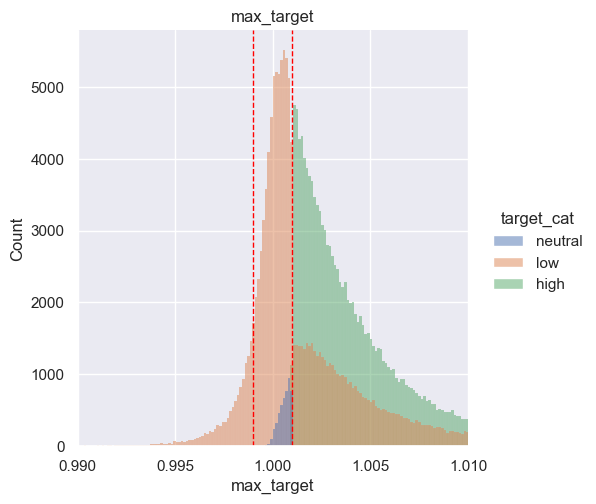

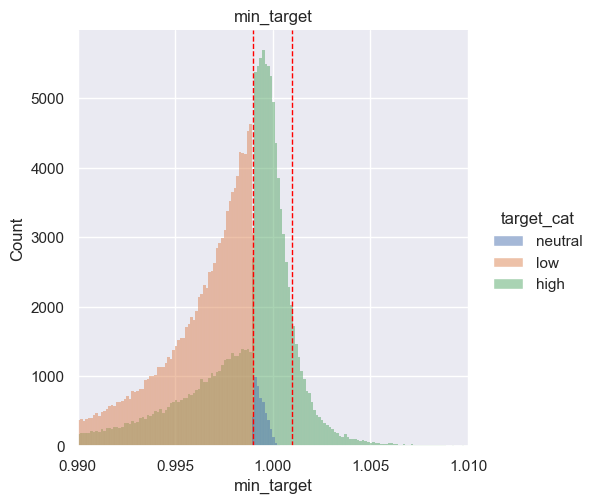

In [234]:
sns.displot(df_targets, x="max_target", hue="target_cat", kind="hist")
ax = plt.gca()
ax.set_xlim([0.99,1.01])
ax.set_title("max_target")
# add vertical lines at 1+target_level and 1-target_level
ax.axvline(1+target_level, color='red', linestyle='dashed', linewidth=1)
ax.axvline(1-target_level, color='red', linestyle='dashed', linewidth=1)

sns.displot(df_targets, x="min_target", hue="target_cat", kind="hist")
ax = plt.gca()
ax.set_xlim([0.99,1.01])
ax.set_title("min_target")
# add vertical lines at 1+target_level and 1-target_level
ax.axvline(1+target_level, color='red', linestyle='dashed', linewidth=1)
ax.axvline(1-target_level, color='red', linestyle='dashed', linewidth=1)

Here : complex graph : 
- If Neutral cat., min or max stay into thresholds.  
- if High cat., min value is around 1
- If Low cat., max value is 1.0005 (1-0.05%) (half the threshold 0.1%)


##### 2eme Strat : TP/SL = 2


In [235]:
Y = "target_cat_2"
target_level =  0.1/100
R = 2
#df_targets = pd.DataFrame(y_train, columns=list_col_targets)
df_targets[Y] = "neutral"
# low cat : if :
#   - low SHORT TP touched AND high SHORT SL IS NOT  reached during timerange
#   - OR low SHORT TP touched AND high SHORT SL IS reached during timerange but AFTER TP
b_low_old =(
    ((y_train.min(axis=1) <= 1-target_level) & (y_train.max(axis=1) < 1+target_level/R)) |
    (
        (y_train.min(axis=1) <= 1-target_level) & (y_train.max(axis=1) >= 1+target_level/R) &
        (np.argmax((y_train <= 1-target_level), axis=1) < np.argmax(y_train >= 1+target_level/R, axis=1))
    ) 
)
df_targets.loc[b_low_old, Y] = "low"
# high cat : if 
#   - high LONG TP touched AND low LONG SL IS NOT reached during timerange
#   - OR high LONG TP touched AND low LONG SL IS reached during timerange but AFTER TP
b_high_old = (
    ((y_train.max(axis=1) >= 1+target_level) & (y_train.min(axis=1) > 1-target_level/R)) |
    (
        (y_train.max(axis=1) >= 1+target_level) & (y_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_train >= 1+target_level), axis=1) < np.argmax(y_train <= 1-target_level/R, axis=1))
    )
)

df_targets.loc[b_high_old, Y] = "high"

# check 
val_count = df_targets[Y].value_counts()
print(val_count)
assert val_count["high"] == np.sum(b_high_old)
assert val_count["low"] == np.sum(b_low_old)
#
print(f"trade high : {100*np.sum(b_high_old)/df_targets.shape[0]:.2f}%")
print(f"trade low : {100*np.sum(b_low_old)/df_targets.shape[0]:.2f}%")
print(f"trade neutral : {100*(df_targets.shape[0]-np.sum(b_high_old)-np.sum(b_low_old))/df_targets.shape[0]:.2f}%")


target_cat_2
high       114081
low        111583
neutral     42524
Name: count, dtype: int64
trade high : 42.54%
trade low : 41.61%
trade neutral : 15.86%


In [236]:
print(f"max nb trades high per day: {np.sum(b_high_old) / (df_targets.shape[0]) * (24*60/5):.2f}")
print(f"{100/target_level:.2f}$ trading size per trade")
print('with 10000$ as collateral, you need a leverage x{:.1f} to have 100$ per trade'.format(100/target_level/10000))

max nb trades high per day: 122.51
100000.00$ trading size per trade
with 10000$ as collateral, you need a leverage x10.0 to have 100$ per trade


target_cat
high       107671
low        105473
neutral     40533
Name: count, dtype: int64
trade high : 42.44%
trade low : 41.58%
trade neutral : 15.98%

##### 2nd Strat fixed TP/SL=2

In [237]:
Y = "target_cat_2f"
target_level =  0.1/100
R = 2
df_targets[Y] = "neutral"
# low cat : if :
#   - low SHORT TP touched AND high SHORT SL IS NOT reached during timerange
#   - OR low SHORT TP touched AND high SHORT SL IS reached during timerange but AFTER TP
b_low =(
    ((y_low_train.min(axis=1) <= 1-target_level) & (y_high_train.max(axis=1) < 1+target_level/R)) |
    (
        (y_low_train.min(axis=1) <= 1-target_level) & (y_high_train.max(axis=1) >= 1+target_level/R) &
        (np.argmax((y_low_train <= 1-target_level), axis=1) < np.argmax(y_high_train >= 1+target_level/R, axis=1))
    ) 
)
df_targets.loc[b_low, Y] = "low"
# high cat : if 
#   - high LONG TP touched AND low LONG SL IS NOT reached during timerange
#   - OR high LONG TP touched AND low LONG SL IS reached during timerange but AFTER TP
b_high = (
    ((y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) > 1-target_level/R)) |
    (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) < np.argmax(y_low_train <= 1-target_level/R, axis=1))
    )
)
df_targets.loc[b_high, Y] = "high"

# if low and high at the same time, then it s neutral
nb_dual = np.sum(b_high & b_low)
if nb_dual > 0:
    print("nb cases high and low at same time: ", nb_dual)
    df_targets.loc[np.logical_not(b_high ^ b_low), Y] = "neutral"
else:
    print('highs and lows are distinct')
# check 
val_count = df_targets[Y].value_counts()
print(val_count)
assert val_count["high"] == np.sum(b_high)
assert val_count["low"] == np.sum(b_low)
#
print(f"trade high : {100*np.sum(b_high)/df_targets.shape[0]:.2f}%")
print(f"trade low : {100*np.sum(b_low)/df_targets.shape[0]:.2f}%")
print(f"trade neutral : {100*(df_targets.shape[0]-np.sum(b_high)-np.sum(b_low))/df_targets.shape[0]:.2f}%")

# target_cat_fixed : if high low not distinct
# neutral    102593
# low         75873
# high        75211


highs and lows are distinct
target_cat_2f
neutral    108651
low         80060
high        79477
Name: count, dtype: int64
trade high : 29.63%
trade low : 29.85%
trade neutral : 40.51%


In [238]:
print(f"max nb trades high per day: {np.sum(b_high) / (df_targets.shape[0]) * (24*60/5):.2f}")
print(f"{100/target_level:.2f}$ trading size per trade")
print('with 10000$ as collateral, you need a leverage x{:.1f} to have 100$ per trade'.format(100/target_level/10000))

max nb trades high per day: 85.35
100000.00$ trading size per trade
with 10000$ as collateral, you need a leverage x10.0 to have 100$ per trade


In [239]:
# check strat 2 high became low
b_not_high_to_high = np.logical_not(b_high_old) & b_high
print(f"nb new strat 2 fixed compare to strat 2 : {np.sum(b_not_high_to_high)}")
print(f"% high strat 2 converted in low strat 2 fixed : {100*np.sum(b_not_high_to_high) / df_targets.shape[0]:.2f} %")
b_high_to_low = b_high_old & b_low
print(f"nb high strat 2 converted in low strat 2 fixed : {np.sum(b_high_to_low)}")
print(f"% high strat 2 converted in low strat 2 fixed : {100*np.sum(b_high_to_low) / df_targets.shape[0]:.2f} %")
b_high_to_neutral = b_high_old & (np.logical_not(b_low) & np.logical_not(b_high))
print(f"nb high strat 2 converted in neutral strat 2 fixed : {np.sum(b_high_to_neutral)}")
print(f"% high strat 2 converted in low neutral 2 fixed : {100*np.sum(b_high_to_neutral) / df_targets.shape[0]:.2f} %")


nb new strat 2 fixed compare to strat 2 : 11834
% high strat 2 converted in low strat 2 fixed : 4.41 %
nb high strat 2 converted in low strat 2 fixed : 3887
% high strat 2 converted in low strat 2 fixed : 1.45 %
nb high strat 2 converted in neutral strat 2 fixed : 42551
% high strat 2 converted in low neutral 2 fixed : 15.87 %


In [240]:
b_high_sl_same_time = (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) == np.argmax(y_low_train <= 1-target_level/R, axis=1))
    )
print(f"in strat 2 fixed, TP & SL touched at same time : {np.sum(b_high_sl_same_time)}")
print(f" {100*np.sum(b_high_sl_same_time) / df_targets.shape[0]:.2f} %")

in strat 2 fixed, TP & SL touched at same time : 45698
 17.04 %


In [241]:
b_high_just_after_SL = (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) == np.argmax(y_low_train <= 1-target_level/R, axis=1) + 1)
    )
print(f"in strat 2 fixed, TP touched just after SL : {np.sum(b_high_just_after_SL)}")
print(f" {100*np.sum(b_high_just_after_SL) / df_targets.shape[0]:.2f} %")
b_high_just_before_SL = (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) == np.argmax(y_low_train <= 1-target_level/R, axis=1) - 1)
    )
print(f"in strat 2 fixed, TP touched just before SL : {np.sum(b_high_just_before_SL)}")
print(f" {100*np.sum(b_high_just_before_SL) / df_targets.shape[0]:.2f} %")

in strat 2 fixed, TP touched just after SL : 22671
 8.45 %
in strat 2 fixed, TP touched just before SL : 13183
 4.92 %


In [242]:
# % of same time TP & SL  with SL before :
print("approximation of nb of same times TP & SL with SL before :")
print(np.sum(b_high_sl_same_time) * np.sum(b_high_just_after_SL) / (np.sum(b_high_just_after_SL) + np.sum(b_high_just_before_SL)))
print(f"% of all TP/SP same time: {100*np.sum(b_high_sl_same_time) * np.sum(b_high_just_after_SL) / (np.sum(b_high_just_after_SL) + np.sum(b_high_just_before_SL)) / np.sum(b_high_sl_same_time):.2f} %" )


approximation of nb of same times TP & SL with SL before :
28895.502816979973
% of all TP/SP same time: 63.23 %


##### 3rd Strat R=2, TP_r=0.45%

In [243]:
Y = "target_cat"
target_level = 0.0045
R = 2
#df_targets = pd.DataFrame(y_train, columns=list_col_targets)
df_targets[Y] = "neutral"
# low cat : if :
#   - low SHORT TP touched AND high SHORT SL IS NOT reached during timerange
#   - OR low SHORT TP touched AND high SHORT SL IS reached during timerange but AFTER TP
b_low = (
    ((y_low_train.min(axis=1) <= 1-target_level) & (y_high_train.max(axis=1) < 1+target_level/R)) |
    (
        (y_low_train.min(axis=1) <= 1-target_level) & (y_high_train.max(axis=1) >= 1+target_level/R) &
        (np.argmax((y_low_train <= 1-target_level), axis=1) < np.argmax(y_high_train >= 1+target_level/R, axis=1))
    ) 
)
df_targets.loc[b_low, Y] = "low"
# high cat : if 
#   - high LONG TP touched AND low LONG SL IS NOT reached during timerange
#   - OR high LONG TP touched AND low LONG SL IS reached during timerange but AFTER TP
b_high = (
    ((y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) > 1-target_level/R)) |
    (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) < np.argmax(y_low_train <= 1-target_level/R, axis=1))
    )
)
df_targets.loc[b_high, Y] = "high"

# if low and high at the same time, then it s neutral
nb_dual = np.sum(b_high & b_low)
if nb_dual > 0:
    print("nb cases high and low at same time: ", nb_dual)
    df_targets.loc[np.logical_not(b_high ^ b_low), Y] = "neutral"
else:
    print('highs and lows are distinct')
# check 
val_count = df_targets[Y].value_counts()
print(val_count)
assert val_count["high"] == np.sum(b_high)
assert val_count["low"] == np.sum(b_low)
#
print(f"trade high : {100*np.sum(b_high)/df_targets.shape[0]:.2f}%")
print(f"trade low : {100*np.sum(b_low)/df_targets.shape[0]:.2f}%")
print(f"trade neutral : {100*(df_targets.shape[0]-np.sum(b_high)-np.sum(b_low))/df_targets.shape[0]:.2f}%")

highs and lows are distinct
target_cat
neutral    135212
low         67149
high        65827
Name: count, dtype: int64
trade high : 24.55%
trade low : 25.04%
trade neutral : 50.42%


In [244]:
b_high_sl_same_time = (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) == np.argmax(y_low_train <= 1-target_level/R, axis=1))
    )
print(f"in these strat., TP & SL touched at same time : {np.sum(b_high_sl_same_time)}")
print(f" {100*np.sum(b_high_sl_same_time) / df_targets.shape[0]:.2f} %")

in these strat., TP & SL touched at same time : 1195
 0.45 %


In [245]:
b_high_sl_before = (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) > np.argmax(y_low_train <= 1-target_level/R, axis=1))
)
print(f"nb TP touched: {np.sum((y_high_train.max(axis=1) >= 1+target_level))}")
print(f"in these strat., SL touched before TP:\n nb: {np.sum(b_high_sl_before)}")
print(f" {100*np.sum(b_high_sl_before) / df_targets.shape[0]:.2f} % of total")
print(f" {100*np.sum(b_high_sl_before) / np.sum((y_high_train.max(axis=1) >= 1+target_level)):.2f} % of TP touched")

nb TP touched: 94348
in these strat., SL touched before TP:
 nb: 27326
 10.19 % of total
 28.96 % of TP touched


nb High <=> nb TP touched - nb SL touched before TP - nb TP & SL at the same time : 

In [246]:
np.sum((y_high_train.max(axis=1) >= 1+target_level))

np.int64(94348)

In [247]:
np.sum(b_high_sl_same_time)

np.int64(1195)

In [248]:
np.sum(b_high_sl_before)

np.int64(27326)

In [249]:
# nb TP touched - nb SL touched before TP - nb TP & SL at the same time = nb High Winning Trade
#88250-25506-1137
assert np.sum(b_high) == (
    np.sum((y_high_train.max(axis=1) >= 1+target_level)) 
    - np.sum(b_high_sl_before) 
    - np.sum(b_high_sl_same_time)
)

In [250]:
# if LONG but SL touched <=> False Positive High trade : 
# True cat == "neutral" and SL touched 
b_high_false_pos_sl_touched = np.logical_not(b_high ^ b_low) & (y_low_train.min(axis=1) <= 1-target_level/R)
print(f"in case of High trading but Neutral cat & SL touched <=> Lost trade:")
print(f"<=> in case of False positive High Trade & SL touched:\n nb: {np.sum(b_high_false_pos_sl_touched)}")

print(f"% of neutral: {100*np.sum(b_high_false_pos_sl_touched)/sum(np.logical_not(b_high ^ b_low)):.2f} %")
print(f"% of Total: {100*np.sum(b_high_false_pos_sl_touched)/df_targets.shape[0]:.2f} %")

in case of High trading but Neutral cat & SL touched <=> Lost trade:
<=> in case of False positive High Trade & SL touched:
 nb: 80122
% of neutral: 59.26 %
% of Total: 29.88 %


In [251]:
# if LONG but TP & SL not touched <=> False Positive High trade <=> Real neutral trade
# True cat == "neutral" and TP or SL not touched
b_high_false_pos_neutral = (np.logical_not(b_high ^ b_low) & 
                            (y_low_train.min(axis=1) > 1-target_level/R) 
                            & (y_high_train.max(axis=1) < 1+target_level))
print(f"in these strat., in case of False positive High Trade but TP or SL not touched:\n nb: {np.sum(b_high_false_pos_neutral)}")
print(f"% of neutral: {100*np.sum(b_high_false_pos_neutral)/sum(np.logical_not(b_high ^ b_low)):.2f} %")
print(f"% of Total: {100*np.sum(b_high_false_pos_neutral)/df_targets.shape[0]:.2f} %")

in these strat., in case of False positive High Trade but TP or SL not touched:
 nb: 55090
% of neutral: 40.74 %
% of Total: 20.54 %


In [252]:
print(f"max nb trades high per day: {np.sum(b_high) / (df_targets.shape[0]) * (24*60/5):.2f}")
print(f"{100/target_level:.2f}$ trading size per trade")
print('with 10000$ as collateral, you need a leverage x{:.1f} to have 100$ per trade'.format(100/target_level/10000))

max nb trades high per day: 70.69
22222.22$ trading size per trade
with 10000$ as collateral, you need a leverage x2.2 to have 100$ per trade


In [253]:
df_targets_test[Y] = "neutral"
# low cat : if :
#   - low SHORT TP touched AND high SHORT SL IS NOT reached during timerange
#   - OR low SHORT TP touched AND high SHORT SL IS reached during timerange but AFTER TP
b_low = (
    ((y_low_test.min(axis=1) <= 1-target_level) & (y_high_test.max(axis=1) < 1+target_level/R)) |
    (
        (y_low_test.min(axis=1) <= 1-target_level) & (y_high_test.max(axis=1) >= 1+target_level/R) &
        (np.argmax((y_low_test <= 1-target_level), axis=1) < np.argmax(y_high_test >= 1+target_level/R, axis=1))
    ) 
)
df_targets_test.loc[b_low, Y] = "low"
# high cat : if 
#   - high LONG TP touched AND low LONG SL IS NOT reached during timerange
#   - OR high LONG TP touched AND low LONG SL IS reached during timerange but AFTER TP
b_high = (
    ((y_high_test.max(axis=1) >= 1+target_level) & (y_low_test.min(axis=1) > 1-target_level/R)) |
    (
        (y_high_test.max(axis=1) >= 1+target_level) & (y_low_test.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_test >= 1+target_level), axis=1) < np.argmax(y_low_test <= 1-target_level/R, axis=1))
    )
)
df_targets_test.loc[b_high, Y] = "high"

# if low and high at the same time, then it s neutral
nb_dual = np.sum(b_high & b_low)
if nb_dual > 0:
    print("nb cases high and low at same time: ", nb_dual)
    df_targets_test.loc[np.logical_not(b_high ^ b_low), Y] = "neutral"
else:
    print('highs and lows are distinct')
# check 
val_count = df_targets_test[Y].value_counts()
print(val_count)
assert val_count["high"] == np.sum(b_high)
assert val_count["low"] == np.sum(b_low)
#
print(f"trade high : {100*np.sum(b_high)/df_targets_test.shape[0]:.2f}%")
print(f"trade low : {100*np.sum(b_low)/df_targets_test.shape[0]:.2f}%")
print(f"trade neutral : {100*(df_targets_test.shape[0]-np.sum(b_high)-np.sum(b_low))/df_targets_test.shape[0]:.2f}%")

highs and lows are distinct
target_cat
neutral    12828
low         8581
high        8311
Name: count, dtype: int64
trade high : 27.96%
trade low : 28.87%
trade neutral : 43.16%


##### 4th Strat R=2.5, TP_r=0.33%

In [254]:
Y = "target_cat_4"
target_level = 0.33/100
R = 2.5
#df_targets = pd.DataFrame(y_train, columns=list_col_targets)
df_targets[Y] = "neutral"
# low cat : if :
#   - low SHORT TP touched AND high SHORT SL IS NOT reached during timerange
#   - OR low SHORT TP touched AND high SHORT SL IS reached during timerange but AFTER TP
b_low =(
    ((y_low_train.min(axis=1) <= 1-target_level) & (y_high_train.max(axis=1) < 1+target_level/R)) |
    (
        (y_low_train.min(axis=1) <= 1-target_level) & (y_high_train.max(axis=1) >= 1+target_level/R) &
        (np.argmax((y_low_train <= 1-target_level), axis=1) < np.argmax(y_high_train >= 1+target_level/R, axis=1))
    ) 
)
df_targets.loc[b_low, Y] = "low"
# high cat : if 
#   - high LONG TP touched AND low LONG SL IS NOT reached during timerange
#   - OR high LONG TP touched AND low LONG SL IS reached during timerange but AFTER TP
b_high = (
    ((y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) > 1-target_level/R)) |
    (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) < np.argmax(y_low_train <= 1-target_level/R, axis=1))
    )
)
df_targets.loc[b_high, Y] = "high"

# if low and high at the same time, then it s neutral
nb_dual = np.sum(b_high & b_low)
if nb_dual > 0:
    print("nb cases high and low at same time: ", nb_dual)
    df_targets.loc[np.logical_not(b_high ^ b_low), Y] = "neutral"
else:
    print('highs and lows are distinct')
# check 
val_count = df_targets[Y].value_counts()
print(val_count)
assert val_count["high"] == np.sum(b_high)
assert val_count["low"] == np.sum(b_low)
#
print(f"trade high : {100*np.sum(b_high)/df_targets.shape[0]:.2f}%")
print(f"trade low : {100*np.sum(b_low)/df_targets.shape[0]:.2f}%")
print(f"trade neutral : {100*(df_targets.shape[0]-np.sum(b_high)-np.sum(b_low))/df_targets.shape[0]:.2f}%")

highs and lows are distinct
target_cat_4
neutral    131551
low         68941
high        67696
Name: count, dtype: int64
trade high : 25.24%
trade low : 25.71%
trade neutral : 49.05%


In [255]:
b_high_low_same_time = (
        (y_high_train.max(axis=1) >= 1+target_level) & (y_low_train.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_train >= 1+target_level), axis=1) == np.argmax(y_low_train <= 1-target_level/R, axis=1))
    )
print(f"in this strat., TP & SL touched at same time : {np.sum(b_high_low_same_time)}")
print(f" {100*np.sum(b_high_low_same_time) / df_targets.shape[0]:.2f} %")

in this strat., TP & SL touched at same time : 3828
 1.43 %


In [256]:
print(f"max nb trades high per day: {np.sum(b_high) / (df_targets.shape[0]) * (24*60/5):.2f}")
print(f"{100/target_level:.2f}$ trading size per trade")
print('with 10000$ as collateral, you need a leverage x{:.1f} to have 100$ per trade'.format(100/target_level/10000))

max nb trades high per day: 72.70
30303.03$ trading size per trade
with 10000$ as collateral, you need a leverage x3.0 to have 100$ per trade


##### Strat selection

In [257]:
Y = "target_cat"
target_level = 0.45/100
R = 2

## Feature Event Categories
- Find rare events
- use it as feature categories between : "high", "low" and "neutral"

Or find a threshold that can occurs on FUTURE_TARGET points  at a minimum prob to have > 80% chance to touch min or max target  
For example : 
- 40% touch Target max
- 40% touch Target min
- 20% neutral
- Total Targets: 80%


In [258]:
# find for all features the quantiles
quantile_min = 0.10
quantile_max = 0.90
# select last lag
df = pd.DataFrame(np.hstack((X_train_dat[:, -1, :nb_plot], y_train)), 
        columns=list_col_corr)
last_target = list_col_targets[-1]
# transpose the dataframe to have the features as columns
df_cont = df.filter(list_col_select + [last_target]).quantile([quantile_min, quantile_max], axis=0)
df_cont = df_cont.T
# rename the columns
df_cont.columns = ["q0", "q1"]
# store nunique() in a new column
df_cont["nunique"] = df.filter(list_col_select + [last_target]).nunique()

df_cont

,q0,q1,nunique
Close_ETH,1.000000,1.000000,1
Open_ETH,0.998268,1.001724,78297
High_ETH,1.000021,1.002512,38110
Low_ETH,0.997408,0.999962,61659
ichi_cloud_a_ETH,0.990067,1.009107,179049
...,...,...,...
impact_index_ema_1h_BTC,0.409112,1.090341,5787
impact_index_ema_4h_BTC,0.496686,1.005134,5784
impact_index_ema_24h_BTC,0.568568,0.923472,5786
Close_ETH_raw,1629.859985,3482.142896,140012


## Chi-2 & Prob per event

If Distrib are independent between event cat and target cat (using given strat.), Chi-2 is low

But, if Chi-2 is high, then we can use them as features 

We calculate for each event the chi-2 and prob high / low of target

In [259]:
def calc_prob(val):
    # calculate proba for classes of a value counts as input : val
    # calculate also the delta "power" proba between high and low : (nb_H - nb_L)^2 / mean(nb_h,nb_L)
    # to indicate important feature
    prob_high = val["high"] / (val.sum())
    prob_low = val["low"] / (val.sum())
    prob_delta = np.sign(prob_high - prob_low) * (val["high"] - val["low"] )**2 / ((val["high"] + val["low"]) / 2)
    return val["high"], val["low"], prob_high, prob_low, prob_delta


##### Past history choice

For lag :  higher <=> recent, lower <=> old

Caclulate for lags exponentially distributed  : e.g. : 
- 1st lag 71 => -5min
- 2nd lag 70 = -10min
- 3rd lag 68 = -20min
- 4th lag 64 = -40min
- 5th lag 56 = -80min
- 6th lag 40 = -160min
- 7th lag 8  = -320min (5h20)

In [260]:

# find a maximum range as long as sum on i (from 1 to n) of DT_PAST*2**(i-1) is inferior to PAST_HISTORY 
k=0
list_past = []
for i in range(0, PAST_HISTORY):
    if 2**(i) - 1 > PAST_HISTORY:
        break
    else:
        k = PAST_HISTORY - 2**(i) 
        list_past.append(k)

print(list_past)

[71, 70, 68, 64, 56, 40, 8]


In [261]:
6*60 - 8*5

320

In [262]:
(6*60-8*5)/60

5.333333333333333

In [263]:
71*5/60

5.916666666666667

#### Calculate Prob

In [264]:
# Calculate classes, contigency chi2 and p value : for each feature and each past value
# - for all lags of target,  we have one categorical variable :
# - high mean we have touch high target level, 
# - low mean we have touch low target level,
# - neutral mean we have not touch target level
list_df = []
df_prob = pd.DataFrame()
for I_past in list_past: #range(PAST_HISTORY):
    # Créer un DataFrame pandas à partir des données d'entrée X et de la variable à prédire y
    df_ = pd.DataFrame(X_train_dat[:, I_past, :nb_plot], columns=list_col_select[:nb_plot])
    df_ = pd.concat([df_, df_targets], axis=1)
    for col_name in list_col_select:
        X = col_name + "_cat"
        df_[X] = "neutral"
        if df_cont.at[col_name, "nunique"] > 3:
            df_.loc[df_[col_name] >= df_cont.at[col_name, "q1"], X] = "high"
            df_.loc[df_[col_name] <= df_cont.at[col_name, "q0"], X] = "low"
        elif df_cont.at[col_name, "nunique"] == 3:
            unique_values = df_[col_name].unique()
            # sort the unique values
            unique_values.sort()
            # assign the categories
            df_.loc[df_[col_name] == unique_values[2], X] = "high"
            df_.loc[df_[col_name] == unique_values[1], X] = "neutral"
            df_.loc[df_[col_name] == unique_values[0], X] = "low"
        elif df_cont.at[col_name, "nunique"] == 2:
            unique_values = df_[col_name].unique()
            # sort the unique values
            unique_values.sort()
            # assign the categories
            df_.loc[df_[col_name] == unique_values[1], X] = "high"
            df_.loc[df_[col_name] == unique_values[0], X] = "low"
        

        # create prob df : 
        for cat_feature in ["high", "low"]:
            ser_prob_curr = pd.Series()
            val = df_.loc[df_[X] == cat_feature, "target_cat"].value_counts()
            if len(val) > 0 :
                val_high, val_low, prob_high, prob_low, delta_prob = calc_prob(val)
            else:
                val_high = np.nan
                val_low = np.nan
                prob_high = np.nan
                prob_low = np.nan
                delta_prob = np.nan
            ser_prob_curr["feature"] = X
            ser_prob_curr["feature_cat"] = cat_feature
            ser_prob_curr["lag"] = I_past
            ser_prob_curr["nb_high"] = val_high
            ser_prob_curr["nb_low"] = val_low
            ser_prob_curr["prob_high"] = prob_high
            ser_prob_curr["prob_low"] = prob_low
            ser_prob_curr["delta_prob"] = delta_prob
            #df_prob = pd.concat([df_prob, df_prob_curr], axis=0)
            if df_prob.shape[0] == 0:
                df_prob = ser_prob_curr.to_frame().T
            else:
                df_prob = pd.concat([df_prob, ser_prob_curr.to_frame().T], ignore_index=True)
    list_df.append(df_)

    df_cont[f"chi2_{I_past}"] = np.nan
    df_cont[f"p-value_{I_past}"] = np.nan
    # calculate contingency table for each feature
    arr_chi2 = np.full(len(list_col_select), np.nan)
    arr_p = np.full(len(list_col_select), np.nan)
    arr_prob_high_high = np.full(len(list_col_select), np.nan)
    arr_prob_high_low = np.full(len(list_col_select), np.nan)
    arr_delta_prob_high = np.full(len(list_col_select), np.nan)
    arr_prob_low_high = np.full(len(list_col_select), np.nan)
    arr_prob_low_low = np.full(len(list_col_select), np.nan)
    arr_delta_prob_low = np.full(len(list_col_select), np.nan)
    for I, col_name in enumerate(list_col_select):
        X = col_name + "_cat"
        # calculate contingency table : find link between feature cat and target cat
        c, chi2, p, dof, expected = contingency_table(X, "target_cat", df_)
        arr_chi2[I] = chi2
        arr_p[I] = p
        # calculate delta prob of high target and low target for each feature cat
        # when feat is high : 
        val = df_.loc[df_[X] == "high", "target_cat"].value_counts()
        if len(val) > 0 :
            _, _, prob_high_high, prob_high_low, delta_prob_high = calc_prob(val)
        else:
            prob_high_high = np.nan
            prob_high_low = np.nan
            delta_prob_high = np.nan
        arr_prob_high_high[I] = prob_high_high
        arr_prob_high_low[I] = prob_high_low
        arr_delta_prob_high[I] = delta_prob_high
        # and when feat is low :
        val = df_.loc[df_[X] == "low", "target_cat"].value_counts()
        if len(val) > 0 :
            _, _, prob_low_high, prob_low_low, delta_prob_low = calc_prob(val)
        else:
            prob_low_high = np.nan
            prob_low_low = np.nan
            delta_prob_low = np.nan
        arr_prob_low_high[I] = prob_low_high
        arr_prob_low_low[I] = prob_low_low
        arr_delta_prob_low[I] = delta_prob_low

        
    df_cont.loc[list_col_select, f"prob_high_high_{I_past}"] = arr_prob_high_high
    df_cont.loc[list_col_select, f"prob_high_low_{I_past}"] = arr_prob_high_low
    df_cont.loc[list_col_select, f"delta_prob_high_{I_past}"] = arr_delta_prob_high
    df_cont.loc[list_col_select, f"prob_low_high_{I_past}"] = arr_prob_low_high
    df_cont.loc[list_col_select, f"prob_low_low_{I_past}"] = arr_prob_low_low
    df_cont.loc[list_col_select, f"delta_prob_low_{I_past}"] = arr_delta_prob_low  


    df_cont.loc[list_col_select, f"chi2_{I_past}"] = arr_chi2
    df_cont.loc[list_col_select, f"p-value_{I_past}"] = arr_p


df_cont

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/4251734444.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_[X] = "neutral"
/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/4251734444.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_[X] = "neutral"
/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/4251734444.py:14: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider jo

,q0,q1,nunique,chi2_71,p-value_71,prob_high_high_71,prob_high_low_71,delta_prob_high_71,prob_low_high_71,prob_low_low_71,...,prob_low_low_40,delta_prob_low_40,chi2_8,p-value_8,prob_high_high_8,prob_high_low_8,delta_prob_high_8,prob_low_high_8,prob_low_low_8,delta_prob_low_8
Close_ETH,1.000000,1.000000,1,0.000000,1.000000e+00,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.000000,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN
Open_ETH,0.998268,1.001724,78297,4165.220190,0.000000e+00,0.301842,0.319663,-27.412597,0.313173,0.305679,...,0.254386,141.270322,3024.107406,0.000000e+00,0.244809,0.274550,-370.274333,0.269184,0.249095,176.904032
High_ETH,1.000021,1.002512,38110,3484.522762,0.000000e+00,0.315373,0.324173,-6.494403,0.201499,0.187218,...,0.239940,126.240829,2293.208008,0.000000e+00,0.249504,0.278149,-340.272164,0.257519,0.239343,167.405711
Low_ETH,0.997408,0.999962,61659,3629.330978,0.000000e+00,0.180910,0.196042,-32.595610,0.320444,0.315038,...,0.260793,126.679439,2329.001448,0.000000e+00,0.234514,0.263521,-408.386857,0.272926,0.253000,171.856069
ichi_cloud_a_ETH,0.990067,1.009107,179049,4845.529814,0.000000e+00,0.303990,0.323676,-33.121540,0.323390,0.308438,...,0.286031,93.619601,6334.431716,0.000000e+00,0.283410,0.302404,-66.661452,0.306336,0.278544,152.912259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
impact_index_ema_1h_BTC,0.409112,1.090341,5787,626.692389,2.587527e-134,0.279337,0.285094,-3.161392,0.235125,0.231024,...,0.228970,10.360073,721.505685,7.681450e-155,0.280712,0.290033,-8.198451,0.237215,0.231487,3.763847
impact_index_ema_4h_BTC,0.496686,1.005134,5784,1868.277776,0.000000e+00,0.282103,0.292438,-10.001812,0.197958,0.192742,...,0.191626,11.386702,1874.948485,0.000000e+00,0.279909,0.294446,-19.791702,0.198610,0.191993,6.030453
impact_index_ema_24h_BTC,0.568568,0.923472,5786,2612.183771,0.000000e+00,0.290272,0.286922,1.044892,0.185479,0.179169,...,0.178036,10.944286,2521.985615,0.000000e+00,0.287148,0.288641,-0.207388,0.186602,0.180307,5.833670
Close_ETH_raw,1629.859985,3482.142896,140012,997.217684,1.430742e-214,0.260338,0.278497,-32.823888,0.215718,0.197077,...,0.193312,72.530234,1093.313063,2.131048e-235,0.258559,0.278853,-41.011058,0.217370,0.191296,89.451352


In [265]:
list_df_test = []
for I_past in list_past: #range(PAST_HISTORY):
    # Créer un DataFrame pandas à partir des données d'entrée X et de la variable à prédire y
    df_ = pd.DataFrame(X_test[:, I_past, :nb_plot], columns=list_col_select[:nb_plot])
    df_ = pd.concat([df_, df_targets_test], axis=1)
    for col_name in list_col_select:
        X = col_name + "_cat"
        df_[X] = "neutral"
        if df_cont.at[col_name, "nunique"] > 3:
            df_.loc[df_[col_name] >= df_cont.at[col_name, "q1"], X] = "high"
            df_.loc[df_[col_name] <= df_cont.at[col_name, "q0"], X] = "low"
        elif df_cont.at[col_name, "nunique"] == 3:
            unique_values = df_[col_name].unique()
            # sort the unique values
            unique_values.sort()
            # assign the categories
            df_.loc[df_[col_name] == unique_values[2], X] = "high"
            df_.loc[df_[col_name] == unique_values[1], X] = "neutral"
            df_.loc[df_[col_name] == unique_values[0], X] = "low"
        elif df_cont.at[col_name, "nunique"] == 2:
            unique_values = df_[col_name].unique()
            # sort the unique values
            unique_values.sort()
            # assign the categories
            df_.loc[df_[col_name] == unique_values[1], X] = "high"
            df_.loc[df_[col_name] == unique_values[0], X] = "low"
    list_df_test.append(df_)

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/1576667342.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_[X] = "neutral"
/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/1576667342.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_[X] = "neutral"
/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/1576667342.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joini

In [266]:
list_df_test[0].shape

(29720, 386)

#### Analyse Prob

In [267]:
print("nb single events : ", df_prob.shape[0])

nb single events :  2590


In [268]:
df_prob.sort_values(by=["prob_high"], ascending=False).head(30)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
2568,event_pred_cat,high,8,17,6,0.653846,0.230769,10.521739
1829,event_pred_cat,low,56,12,8,0.444444,0.296296,1.6
2570,event_real_cat,high,8,13,8,0.419355,0.258065,2.380952
721,event_real_cat,low,70,9,3,0.409091,0.136364,6.0
2571,event_real_cat,low,8,9,4,0.409091,0.181818,3.846154
2201,event_real_cat,low,40,9,6,0.409091,0.272727,1.2
1831,event_real_cat,low,56,9,6,0.409091,0.272727,1.2
349,event_pred_cat,low,71,11,4,0.407407,0.148148,6.533333
2198,event_pred_cat,high,40,10,10,0.384615,0.384615,0.0
719,event_pred_cat,low,70,10,6,0.37037,0.222222,2.0


<Axes: xlabel='lag', ylabel='prob_high'>

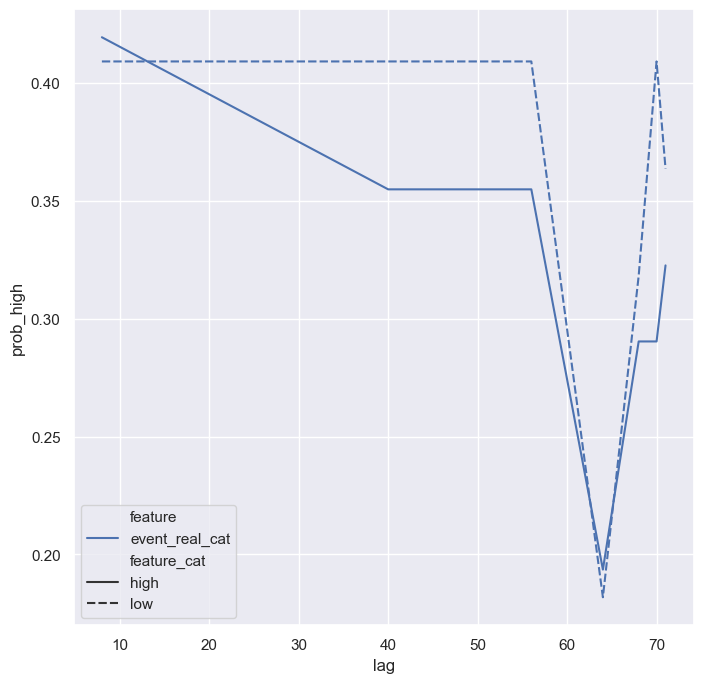

In [269]:
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
# plot through lag the prob high for each feature cat
sns.lineplot(
    data=df_prob[df_prob["feature"] == "event_real_cat"],
    x="lag",
    y="prob_high",
    hue="feature",
    style="feature_cat",
    ax=ax,
)

In [270]:
(72-8)*5 / 60

5.333333333333333

Here we can see that if the real event is positive around 5 hours before : 
- THEN the event target HIGH is 66% chance to happened 
- BE CAREFUL :  very low event number < 20

In [271]:
df_prob.sort_values(by=["delta_prob"], ascending=False).head(30)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
429,max_high_3_ETH_cat,low,70,7340,5852,0.27161,0.216548,335.679806
59,max_high_3_ETH_cat,low,71,7261,5784,0.270741,0.215668,334.462093
799,max_high_3_ETH_cat,low,68,7638,6157,0.273479,0.220452,317.993621
1169,max_high_3_ETH_cat,low,64,8267,6810,0.275677,0.227091,281.600982
1539,max_high_3_ETH_cat,low,56,9457,7950,0.278713,0.234299,260.935141
2273,max_high_2_ETH_cat,low,8,21560,19318,0.269288,0.241285,245.930036
2287,vwap_4h_ETH_cat,low,8,21808,19648,0.300229,0.270492,225.086839
2223,Open_ETH_cat,low,8,30578,28296,0.269184,0.249095,176.904032
1909,max_high_3_ETH_cat,low,40,11169,9820,0.276597,0.24319,173.405212
2227,Low_ETH_cat,low,8,31065,28797,0.272926,0.253,171.856069


In [272]:
list_feat_high = list(df_prob.sort_values(by=["delta_prob"], ascending=False)["feature"].unique()[:10])

In [273]:
df_prob.sort_values(by=["delta_prob"]).head(30)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
1898,min_low_1_ETH_cat,high,40,19489,22914,0.226485,0.266287,-553.29222
1904,min_low_2_ETH_cat,high,40,13980,16637,0.222672,0.264992,-461.158768
2268,min_low_1_ETH_cat,high,8,22891,26076,0.233258,0.265713,-414.329038
2262,min_low_0_ETH_cat,high,8,28346,31852,0.234514,0.263521,-408.386857
2226,Low_ETH_cat,high,8,28346,31852,0.234514,0.263521,-408.386857
1892,min_low_0_ETH_cat,high,40,27064,30355,0.233893,0.262335,-377.250771
1856,Low_ETH_cat,high,40,27064,30355,0.233893,0.262335,-377.250771
1910,min_low_3_ETH_cat,high,40,7794,9594,0.20942,0.257785,-372.670807
2222,Open_ETH_cat,high,8,26612,29845,0.244809,0.27455,-370.274333
60,min_low_3_ETH_cat,high,71,4732,6133,0.176442,0.228681,-361.307133


In [274]:
list_feat_low = list(df_prob.sort_values(by=["delta_prob"])["feature"].unique()[:10])

In [275]:

list_feat_prob = list(set(list_feat_low + list_feat_high))
list_feat_prob

['High_ETH_cat',
 'max_high_0_ETH_cat',
 'min_low_2_ETH_cat',
 'vwap_h_ETH_cat',
 'Low_ETH_cat',
 'max_high_2_ETH_cat',
 'ichi_tenkan_ETH_cat',
 'min_low_1_ETH_cat',
 'vwap_4h_ETH_cat',
 'min_low_0_ETH_cat',
 'max_high_3_ETH_cat',
 'ichi_kijun_ETH_cat',
 'ichi_tenkan_1_ETH_cat',
 'Open_ETH_cat',
 'min_low_3_ETH_cat']

<Axes: xlabel='lag', ylabel='delta_prob'>

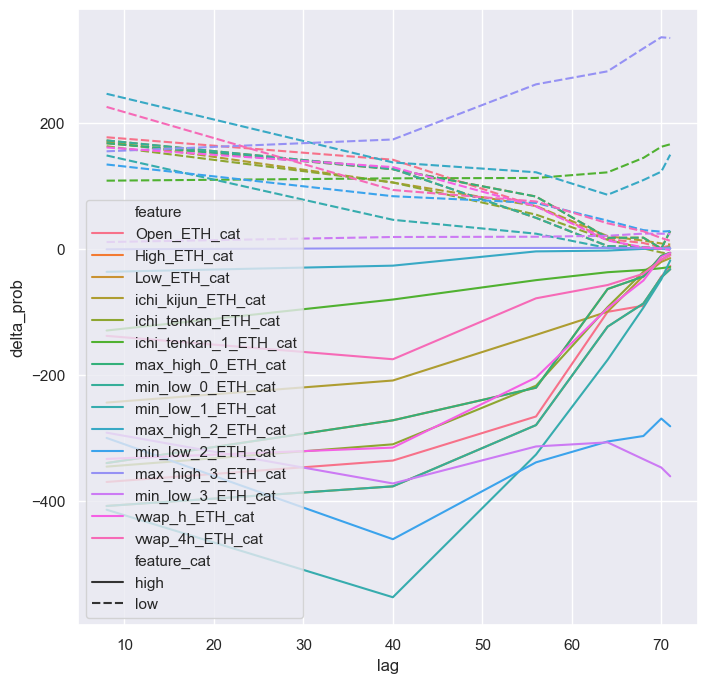

In [276]:
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
# plot through lag the prob high for each feature cat
sns.lineplot(
    data=df_prob[df_prob["feature"].isin(list_feat_prob)],
    x="lag",
    y="delta_prob",
    hue="feature",
    style="feature_cat",
    ax=ax,
)

<Axes: xlabel='lag', ylabel='prob_high'>

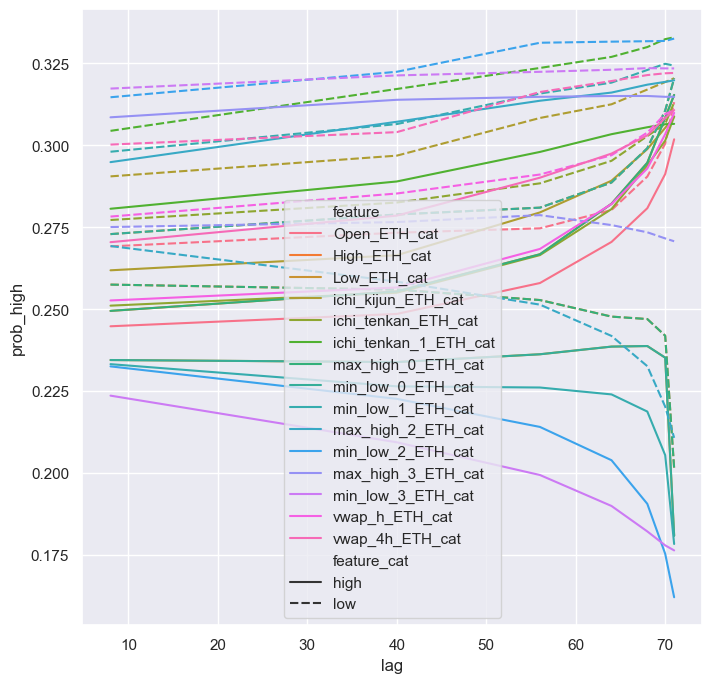

In [277]:
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
# plot through lag the prob high target for each feature cat
sns.lineplot(
    data=df_prob[df_prob["feature"].isin(list_feat_prob)],
    x="lag",
    y="prob_high",
    hue="feature",
    style="feature_cat",
    ax=ax,
)

In [278]:
df_prob[(df_prob["feature"] == "vwap_d_ETH_cat") & (df_prob["feature_cat"] == "high")].sort_values(by=["lag"])

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
2288,vwap_d_ETH_cat,high,8,11495,12329,0.292412,0.313627,-58.391202
1918,vwap_d_ETH_cat,high,40,10098,10570,0.300366,0.314406,-21.558351
1548,vwap_d_ETH_cat,high,56,9204,9532,0.303923,0.314754,-11.484202
1178,vwap_d_ETH_cat,high,64,8725,9038,0.30599,0.316967,-11.030682
808,vwap_d_ETH_cat,high,68,8445,8780,0.306111,0.318254,-13.030479
438,vwap_d_ETH_cat,high,70,8270,8632,0.305866,0.319254,-15.506331
68,vwap_d_ETH_cat,high,71,8199,8569,0.305716,0.319512,-16.328721


<Axes: xlabel='lag', ylabel='prob_low'>

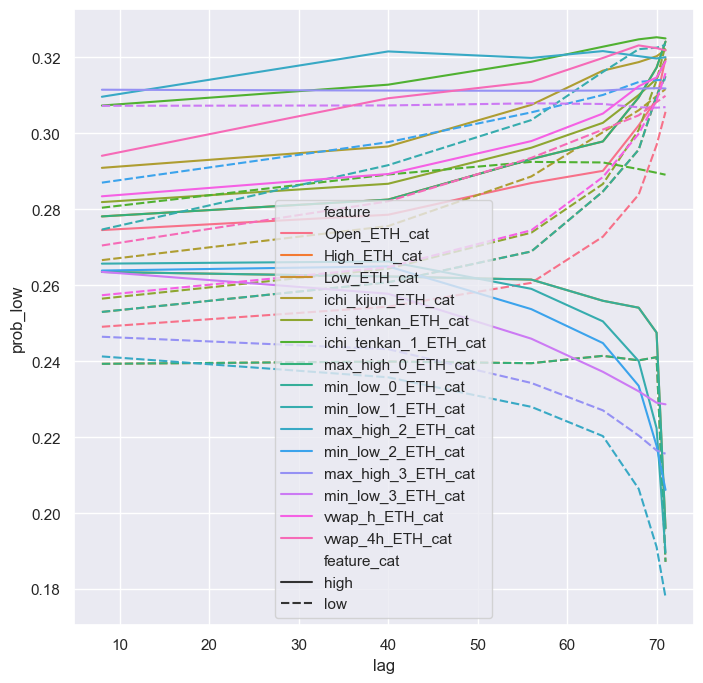

In [279]:
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
# plot through lag the prob low target for each feature cat
sns.lineplot(
    data=df_prob[df_prob["feature"].isin(list_feat_prob)],
    x="lag",
    y="prob_low",
    hue="feature",
    style="feature_cat",
    ax=ax,
)

In [280]:
len(list_df)

7

In [281]:
df = list_df[-1]

In [282]:
pd.crosstab(df['Volume_ETH_cat'], df['target_cat'], margins=True, normalize=True)

target_cat,high,low,neutral,All
Volume_ETH_cat,,,,
high,0.030665,0.028905,0.040371,0.099941
low,0.015187,0.015773,0.069168,0.100128
neutral,0.199599,0.205703,0.394630,0.799931
All,0.245451,0.250380,0.504169,1.000000


##### With Best Positive Corr Features

max_high_h_ETH & Volume_ETH are the best positive impact on price. 

In [283]:
df_prob[
    (df_prob["feature"] == "max_high_2_ETH_cat") & (df_prob["feature_cat"] == "high")
    ].sort_values(by="prob_high", ascending=False)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
52,max_high_2_ETH_cat,high,71,8578,8584,0.319836,0.32006,-0.004195
422,max_high_2_ETH_cat,high,70,8754,8764,0.319361,0.319726,-0.011417
792,max_high_2_ETH_cat,high,68,9082,9134,0.31851,0.320334,-0.296882
1162,max_high_2_ETH_cat,high,64,9702,9873,0.316098,0.321669,-2.987586
1532,max_high_2_ETH_cat,high,56,10822,11038,0.313608,0.319868,-4.268618
1902,max_high_2_ETH_cat,high,40,12560,13148,0.307196,0.321577,-26.897775
2272,max_high_2_ETH_cat,high,8,15020,15772,0.29488,0.309643,-36.730579


Correlation confirmed and good for strat 2

In [284]:
df_prob[
    (df_prob["feature"] == "Volume_ETH_cat") & (df_prob["feature_cat"] == "high")
    ].sort_values(by="prob_high", ascending=False)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
644,Volume_ETH_cat,high,70,8599,8361,0.320631,0.311757,6.679717
274,Volume_ETH_cat,high,71,8573,8453,0.319661,0.315187,1.691531
1014,Volume_ETH_cat,high,68,8481,8413,0.316231,0.313696,0.547413
2124,Volume_ETH_cat,high,40,8372,8154,0.312306,0.304174,5.751422
1384,Volume_ETH_cat,high,64,8363,8508,0.311843,0.31725,-2.492443
1754,Volume_ETH_cat,high,56,8305,8283,0.309726,0.308906,0.058355
2494,Volume_ETH_cat,high,8,8224,7752,0.306831,0.289221,27.889835


=> Correlation with less impact on strat 2

##### With Best Negative Corr Features
min_low_h_ETH & Close_ETH_raw are the best negative impact on price. 

In [285]:
##### On Best Negative Corr Features
df_prob[
    (df_prob["feature"] == "min_low_2_ETH_cat") & (df_prob["feature_cat"] == "high")
    ].sort_values(by="prob_low", ascending=False)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
1904,min_low_2_ETH_cat,high,40,13980,16637,0.222672,0.264992,-461.158768
2274,min_low_2_ETH_cat,high,8,17681,20062,0.232577,0.263897,-300.408606
1534,min_low_2_ETH_cat,high,56,10818,12820,0.214108,0.253731,-339.115323
1164,min_low_2_ETH_cat,high,64,8392,10073,0.203947,0.244799,-306.066721
794,min_low_2_ETH_cat,high,68,6532,8002,0.190649,0.233553,-297.357919
424,min_low_2_ETH_cat,high,70,5179,6430,0.175405,0.217774,-269.618572
54,min_low_2_ETH_cat,high,71,4349,5529,0.162155,0.206152,-281.919417


=> No clear conclusion

In [286]:
df_prob[
    (df_prob["feature"] == "Close_ETH_raw_cat") & (df_prob["feature_cat"] == "high")
    ].sort_values(by="prob_low", ascending=False)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
2588,Close_ETH_raw_cat,high,8,6918,7461,0.258559,0.278853,-41.011058
368,Close_ETH_raw_cat,high,71,6982,7469,0.260338,0.278497,-32.823888
738,Close_ETH_raw_cat,high,70,6987,7464,0.260534,0.278321,-31.489724
2218,Close_ETH_raw_cat,high,40,6941,7449,0.259109,0.278072,-35.86713
1478,Close_ETH_raw_cat,high,64,6987,7452,0.260592,0.277935,-29.950135
1108,Close_ETH_raw_cat,high,68,6991,7450,0.260703,0.277819,-29.178173
1848,Close_ETH_raw_cat,high,56,6982,7427,0.260484,0.277086,-27.486293


=> No clear conclusion

##### Sentiment

In [287]:
# sentiment
list_col_sent

['impact_index_ETH',
 'impact_index_ema_1h_ETH',
 'impact_index_ema_4h_ETH',
 'impact_index_ema_24h_ETH',
 'impact_index_BTC',
 'impact_index_ema_1h_BTC',
 'impact_index_ema_4h_BTC',
 'impact_index_ema_24h_BTC']

In [288]:
df_prob[df_prob["feature"].str.contains("impact_index")].sort_values(by="prob_high", ascending=False).head(60)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
1476,impact_index_ema_24h_BTC_cat,high,64,7798,7702,0.290385,0.28681,1.189161
366,impact_index_ema_24h_BTC_cat,high,71,7797,7707,0.290272,0.286922,1.044892
1106,impact_index_ema_24h_BTC_cat,high,68,7796,7712,0.290267,0.28714,0.909982
736,impact_index_ema_24h_BTC_cat,high,70,7796,7708,0.290246,0.286969,0.998968
1846,impact_index_ema_24h_BTC_cat,high,56,7781,7714,0.289838,0.287343,0.579413
2216,impact_index_ema_24h_BTC_cat,high,40,7730,7724,0.28811,0.287887,0.004659
2586,impact_index_ema_24h_BTC_cat,high,8,7695,7735,0.287148,0.288641,-0.207388
354,impact_index_ema_1h_ETH_cat,high,71,7668,7493,0.283287,0.276821,4.039971
724,impact_index_ema_1h_ETH_cat,high,70,7667,7491,0.28326,0.276758,4.087083
726,impact_index_ema_4h_ETH_cat,high,70,7587,7526,0.282802,0.280528,0.492424


##### VPOC

In [289]:
df_prob[df_prob["feature"].str.contains("vpoc")].sort_values(by="prob_high", ascending=False).head(30)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
1193,vp_vpoc_d_ETH_cat,low,64,8845,8349,0.321274,0.303258,28.616494
823,vp_vpoc_d_ETH_cat,low,68,8706,8215,0.321041,0.302935,28.494888
83,vp_vpoc_d_ETH_cat,low,71,8610,8130,0.321041,0.303143,27.526882
453,vp_vpoc_d_ETH_cat,low,70,8641,8158,0.320976,0.303035,27.774153
1563,vp_vpoc_d_ETH_cat,low,56,9084,8617,0.320197,0.303736,24.641433
1933,vp_vpoc_d_ETH_cat,low,40,9571,9029,0.319609,0.301509,31.587527
2303,vp_vpoc_d_ETH_cat,low,8,10252,9796,0.3103,0.296498,20.743815
1198,vp_vpoc_w_ETH_cat,high,64,8168,7612,0.303316,0.282669,39.180735
88,vp_vpoc_w_ETH_cat,high,71,8133,7590,0.303255,0.283008,37.505438
458,vp_vpoc_w_ETH_cat,high,70,8137,7592,0.303235,0.282925,37.767817


##### TPO

In [290]:
df_prob[df_prob["feature"].str.contains("tpo")].sort_values(by="prob_high", ascending=False).head(30)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
858,tp_tpo_m_ETH_cat,high,68,8315,7694,0.309868,0.286726,48.178025
1228,tp_tpo_m_ETH_cat,high,64,8321,7699,0.309861,0.286698,48.300125
1598,tp_tpo_m_ETH_cat,high,56,8333,7710,0.309846,0.286681,48.386087
488,tp_tpo_m_ETH_cat,high,70,8311,7693,0.309834,0.286795,47.728568
118,tp_tpo_m_ETH_cat,high,71,8309,7692,0.309818,0.286812,47.583151
2338,tp_tpo_m_ETH_cat,high,8,8402,7764,0.309648,0.286135,50.358035
1968,tp_tpo_m_ETH_cat,high,40,8352,7722,0.309631,0.286276,49.384099
1592,tp_tpo_w_ETH_cat,high,56,8331,7701,0.309415,0.286017,49.513473
2339,tp_tpo_m_ETH_cat,low,8,8351,8296,0.309308,0.307271,0.363429
1222,tp_tpo_w_ETH_cat,high,64,8305,7696,0.30915,0.28648,46.357228


#### First LAG (oldest)
I_past closest to 0 is the oldest

In [291]:
len(list_df)

7

In [292]:
list_past

[71, 70, 68, 64, 56, 40, 8]

In [293]:
min_I_list_past = np.argmin(list_past)
min_I_list_past

np.int64(6)

In [294]:
df = list_df[min_I_list_past]

In [295]:
f"chi2_{list_past[min_I_list_past]}"

'chi2_8'

Text(0.5, 1.0, 'Min Chi2 between FIRST Lag and Target cat')

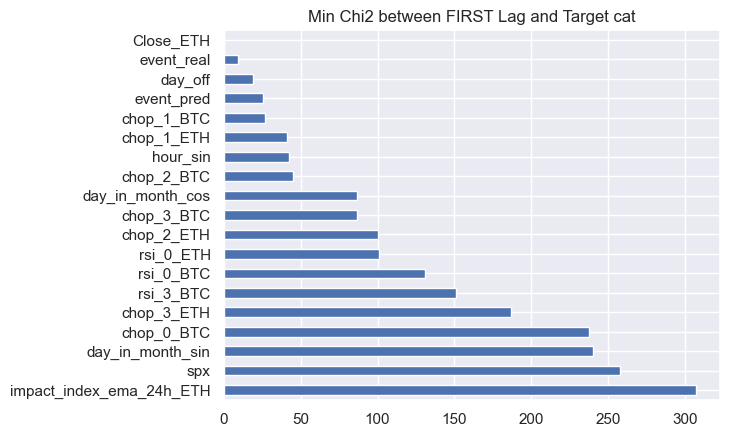

In [296]:
# find chi2_0 values in the 10% highest quantiles 
first_col_chi2 = f"chi2_{list_past[min_I_list_past]}"
min_quantile_chi2_10 = df_cont[first_col_chi2].quantile(0.10)
min_chi2_0 = df_cont[first_col_chi2].sort_values(ascending=False)
min_chi2_0[min_chi2_0.values<min_quantile_chi2_10].plot.barh()
# get current axis
ax = plt.gca()
# set y-axis label
ax.set_title("Min Chi2 between FIRST Lag and Target cat")


Results : We can see that some features have less impact on distrib :
- we are not going to study them
- we are going to study the features with the highest chi2

Text(0.5, 1.0, 'Max Chi2 between FIRST Lag and Target cat')

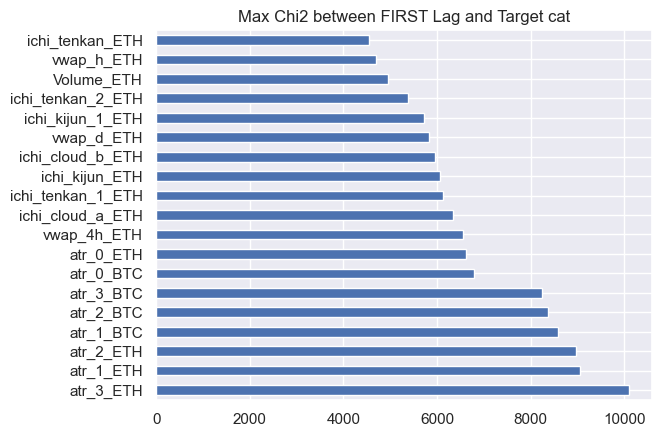

In [297]:
# find chi2_0 values in the 10% highest quantiles 
max_quantile_chi2_90 = df_cont[first_col_chi2].quantile(0.90)
max_chi2_0 = df_cont[first_col_chi2].sort_values(ascending=False)
max_chi2_0[max_chi2_0.values>max_quantile_chi2_90].plot.barh()
# get current axis
ax = plt.gca()
# set y-axis label
ax.set_title("Max Chi2 between FIRST Lag and Target cat")

expected:  [[  6580.78548257   6712.94703342  13517.267484  ]
 [  6573.421954     6705.43562352  13502.14242248]
 [ 52672.79256343  53730.61734306 108192.59009352]]
target_cat        high      low   neutral     Total
atr_3_ETH_cat                                      
high            8900.0   8687.0    9224.0   26811.0
low             3017.0   3321.0   20443.0   26781.0
neutral        53910.0  55141.0  105545.0  214596.0
total          65827.0  67149.0  135212.0  268188.0
xi_n =  10092.665569917699
chi2:  10092.665569917699
dof:  4
p:  0.0
We have we have a 0.0000% chance for H0 to be true.
H0 : independance of distributions
H1 : distribution are not independant : we reject H0


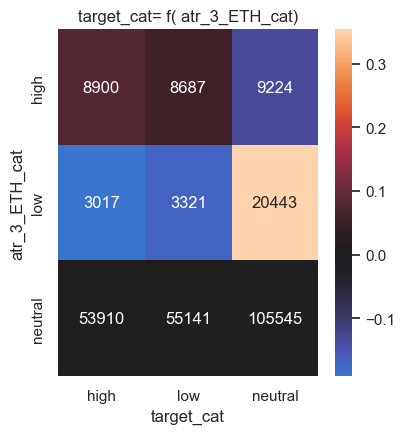

target_cat,high,low,neutral
atr_3_ETH_cat,,,
high,8900,8687,9224
low,3017,3321,20443
neutral,53910,55141,105545


In [298]:
feat_name_max = max_chi2_0.index[0]
# plot contingency table for the feature with the highest chi2
X = feat_name_max + "_cat"
Y = "target_cat"
I_past = 0
plot_cont(X=X, Y=Y, data=df)

In [299]:
Y

'target_cat'

In [300]:
len(list_col_select)

185

In [301]:
len(list_col_select)*(len(list_col_select)-1)*(len(list_col_select)-2)

6229320

In [302]:
3*3*3

27

In [303]:
# create contingency dataframe
col_name_0 = f"{max_chi2_0.index[0]}_cat"
col_name_1 = f"{max_chi2_0.index[1]}_cat"
col_name_2 = f"{max_chi2_0.index[2]}_cat"
df_cross = pd.crosstab([df[col_name_0], df[col_name_1], df[col_name_2]], df[Y], margins=False, dropna=False)
# get target names
target_cat_names = df_cross.columns.to_list()
print("target_cat_names: ", target_cat_names)
# get index lengths
nb_level_0 = len(df_cross.index.levels[0])
nb_level_1 = len(df_cross.index.levels[1])
nb_level_2 = len(df_cross.index.levels[2])  
nb_targets = df_cross.shape[1]
# create array contingency
arr_cont = np.empty((nb_level_0,nb_level_1,nb_level_2,nb_targets))
for I_0, level_0 in enumerate(df_cross.index.levels[0]):
    #print("#level_0: ", I_0)
    for I_1,level_1 in enumerate(df_cross.index.levels[1]):
        #print("#level_1: ", I_1)
        arr_cont[I_0, I_1] = df_cross.loc[(level_0, level_1)].values
print("arr_cont.shape : ", arr_cont.shape)
# add probs
df_cross["p_high"] = df_cross["high"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
df_cross["p_low"] = df_cross["low"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
df_cross["p_neutral"] = df_cross["neutral"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
# just calculate ratio :  sign * delta (H - L)^2 /  mean(H,L) 
df_cross["chi2_delta_high"] = np.sign(df_cross["high"] - df_cross["low"]) * (df_cross["high"] - df_cross["low"])**2 / ((df_cross["low"] + df_cross["high"])/2)
# calc chi2, p-value, expected frequencies
res = stats.chi2_contingency(arr_cont)
print("chi2: ", res.statistic)
print("p-value: ", res.pvalue)
# add expected frequencies to df_cross
arr_exp = res.expected_freq.reshape(nb_level_0*nb_level_1*nb_level_2, nb_targets)
for I, col in enumerate(target_cat_names):
        df_cross[f"exp_{col}"] = arr_exp[:,I]
# get sign of difference between observed and expected frequencies
arr_sign = np.sign(arr_cont - res.expected_freq)
# calc chi2 ratio and add to df_cross
arr_chi2_ratio = arr_sign*((arr_cont - res.expected_freq)**2/res.expected_freq)/res.statistic
arr_chi2_ration_reshape = arr_chi2_ratio.reshape(nb_level_0*nb_level_1*nb_level_2, nb_targets)
for I, col in enumerate(target_cat_names):
        df_cross[f"chi2_pc_{col}"] = 100*arr_chi2_ration_reshape[:,I]
df_cross

target_cat_names:  ['high', 'low', 'neutral']
arr_cont.shape :  (3, 3, 3, 3)
chi2:  2005123.7378038042
p-value:  0.0


target_cat                                  high    low  neutral    p_high  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                                    
high          high          high            4467   4285     4580  0.335059   
                            low                0      0        0       NaN   
                            neutral          194    195      179  0.341549   
              low           high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            0      0        0       NaN   
              neutral       high            1695   1454     1600  0.356917   
                            low                0      0        0       NaN   
                            neutral         2544   2753     2865  0.311688   
low           high          high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            6     10       20  0.166667   
              low           high               0      0        0       NaN   
                            low             1450   1773    12423  0.092675   
                            neutral           90    129      763  0.091650   
              neutral       high               0      0        0       NaN   
                            low              598    419     2492  0.170419   
                            neutral          873    990     4745  0.132113   
neutral       high          high            2085   1806     2205  0.342028   
                            low                0      0        0       NaN   
                            neutral         1978   2012     2771  0.292560   
              low           high               0      0        0       NaN   
                            low              817   1041     4030  0.138757   
                            neutral          588    730     3091  0.133364   
              neutral       high             860    694      975  0.340055   
                            low              425    331     1084  0.230978   
                            neutral        47157  48527    91389  0.252078   

target_cat                                    p_low  p_neutral  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                        
high          high          high           0.321407   0.343534   
                            low                 NaN        NaN   
                            neutral        0.343310   0.315141   
              low           high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral             NaN        NaN   
              neutral       high           0.306170   0.336913   
                            low                 NaN        NaN   
                            neutral        0.337295   0.351017   
low           high          high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral        0.277778   0.555556   
              low           high                NaN        NaN   
                            low            0.113320   0.794005   
                            neutral        0.131365   0.776986   
              neutral       high                NaN        NaN   
                            low            0.119407   0.710174   
                            neutral        0.149818   0.718069   
neutral       high          high           0.296260   0.361713   
                            low                 NaN        NaN   
                            neutral        0.297589   0.409851   
              low           high                NaN        NaN   
                            low            0.176800   0.684443   
                            neutral        0.165570   0.701066   
              neutral

In [304]:
# Threshold of prob 40%  : to have 15% to 30% of gains with nb trades per months on average :
# - 30 trades (with 2.5% cap risk) => 15% gains
# - to 300 trades (0.5 % capital risk)  => 30% gains
prob_tot = df_cross[["high", "neutral","low"]].sum(axis=0) / df_cross[["high", "neutral","low"]].sum().sum()
print("prob_tot: ", prob_tot)
#prob_target = 0.33
nb_per_sub_cat = df_cross[["high","low","neutral"]].sum(axis=1)
nb_per_sub_cat
#df_cross["exp_trigger_high"] = nb_per_sub_cat * prob_target
#df_cross["exp_trigger_low"] = nb_per_sub_cat * prob_target
#df_cross["exp_trigger_neutral"] = nb_per_sub_cat * prob_target


#df_cross["chi2_trigger_low"] = np.sign(df_cross["low"] - df_cross["exp_trigger_low"]) * (df_cross["low"] - df_cross["exp_trigger_low"])**2 / df_cross["exp_trigger_low"]
#df_cross["chi2_trigger_neutral"] = np.sign(df_cross["neutral"] - df_cross["exp_trigger_neutral"]) *  (df_cross["neutral"] - df_cross["exp_trigger_neutral"])**2 / df_cross["exp_trigger_neutral"]

df_cross.filter(["high","low","neutral","p_high","p_low","p_neutral","chi2_delta_high"])



prob_tot:  target_cat
high       0.245451
neutral    0.504169
low        0.250380
dtype: float64


high    low  neutral    p_high  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                                    
high          high          high            4467   4285     4580  0.335059   
                            low                0      0        0       NaN   
                            neutral          194    195      179  0.341549   
              low           high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            0      0        0       NaN   
              neutral       high            1695   1454     1600  0.356917   
                            low                0      0        0       NaN   
                            neutral         2544   2753     2865  0.311688   
low           high          high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            6     10       20  0.166667   
              low           high               0      0        0       NaN   
                            low             1450   1773    12423  0.092675   
                            neutral           90    129      763  0.091650   
              neutral       high               0      0        0       NaN   
                            low              598    419     2492  0.170419   
                            neutral          873    990     4745  0.132113   
neutral       high          high            2085   1806     2205  0.342028   
                            low                0      0        0       NaN   
                            neutral         1978   2012     2771  0.292560   
              low           high               0      0        0       NaN   
                            low              817   1041     4030  0.138757   
                            neutral          588    730     3091  0.133364   
              neutral       high             860    694      975  0.340055   
                            low              425    331     1084  0.230978   
                            neutral        47157  48527    91389  0.252078   

                                              p_low  p_neutral  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                        
high          high          high           0.321407   0.343534   
                            low                 NaN        NaN   
                            neutral        0.343310   0.315141   
              low           high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral             NaN        NaN   
              neutral       high           0.306170   0.336913   
                            low                 NaN        NaN   
                            neutral        0.337295   0.351017   
low           high          high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral        0.277778   0.555556   
              low           high                NaN        NaN   
                            low            0.113320   0.794005   
                            neutral        0.131365   0.776986   
              neutral       high                NaN        NaN   
                            low            0.119407   0.710174   
                            neutral        0.149818   0.718069   
neutral       high          high           0.296260   0.361713   
                            low                 NaN        NaN   
                            neutral        0.297589   0.409851   
              low           high                NaN        NaN   
                            low            0.176800   0.684443   
                            neutral        0.165570   0.701066   
              neutral       high           0.274417   0.385528   

In [305]:
df_cross.filter(["high","low","neutral","p_high","p_low","p_neutral","chi2_delta_high"]).loc[df_cross["chi2_delta_high"] > 10]

high   low  neutral    p_high  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                                  
high          neutral       high           1695  1454     1600  0.356917   
low           neutral       low             598   419     2492  0.170419   
neutral       high          high           2085  1806     2205  0.342028   
              neutral       high            860   694      975  0.340055   
                            low             425   331     1084  0.230978   

                                              p_low  p_neutral  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                        
high          neutral       high           0.306170   0.336913   
low           neutral       low            0.119407   0.710174   
neutral       high          high           0.296260   0.361713   
              neutral       high           0.274417   0.385528   
                            low            0.179891   0.589130   

                                           chi2_delta_high  
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                   
high          neutral       high                 36.888536  
low           neutral       low                  63.010816  
neutral       high          high                 40.010794  
              neutral       high                 35.464607  
                            low                  23.375661

In [306]:
df_cross.filter(["high","low","neutral","p_high","p_low","p_neutral","chi2_delta_high"]).loc[df_cross["chi2_delta_high"] > 10].sum().sum() / df_cross.filter(["high","low","neutral"]).sum().sum()

np.float64(0.0705726968214448)

In [307]:
df_cross.filter(["high","low","neutral","p_high","p_low","p_neutral","chi2_delta_high"]).loc[df_cross["chi2_delta_high"] < -10]

high    low  neutral    p_high  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                                    
high          neutral       neutral         2544   2753     2865  0.311688   
low           low           low             1450   1773    12423  0.092675   
                            neutral           90    129      763  0.091650   
              neutral       neutral          873    990     4745  0.132113   
neutral       low           low              817   1041     4030  0.138757   
                            neutral          588    730     3091  0.133364   
              neutral       neutral        47157  48527    91389  0.252078   

                                              p_low  p_neutral  \
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                        
high          neutral       neutral        0.337295   0.351017   
low           low           low            0.113320   0.794005   
                            neutral        0.131365   0.776986   
              neutral       neutral        0.149818   0.718069   
neutral       low           low            0.176800   0.684443   
                            neutral        0.165570   0.701066   
              neutral       neutral        0.259401   0.488521   

                                           chi2_delta_high  
atr_3_ETH_cat atr_1_ETH_cat atr_2_ETH_cat                   
high          neutral       neutral             -16.492732  
low           low           low                 -64.740304  
                            neutral             -13.890411  
              neutral       neutral             -14.695652  
neutral       low           low                 -54.010764  
                            neutral             -30.597876  
              neutral       neutral             -39.231219

In [308]:
df_cross.filter(["high","low","neutral","p_high","p_low","p_neutral","chi2_delta_high"]).loc[df_cross["chi2_delta_high"] < -10].sum().sum() / df_cross.filter(["high","low","neutral"]).sum().sum()

np.float64(0.852168408138341)

In [309]:
((2-1)**2) / 1


1.0

In [310]:
((2000-1000)**2) / 1000

1000.0

In [311]:
22000 / df.shape[0]

0.08203200739779558

In [312]:
100*5/60

8.333333333333334

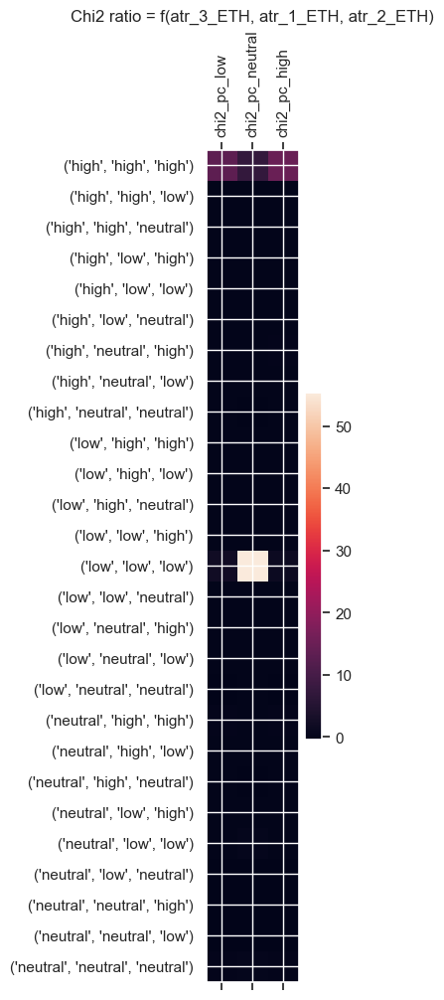

In [313]:
plot_corr(
    df_cross[["chi2_pc_low","chi2_pc_neutral","chi2_pc_high"]], 
    title = f"Chi2 ratio = f({max_chi2_0.index[0]}, {max_chi2_0.index[1]}, {max_chi2_0.index[2]})", 
    size=1.5,
)

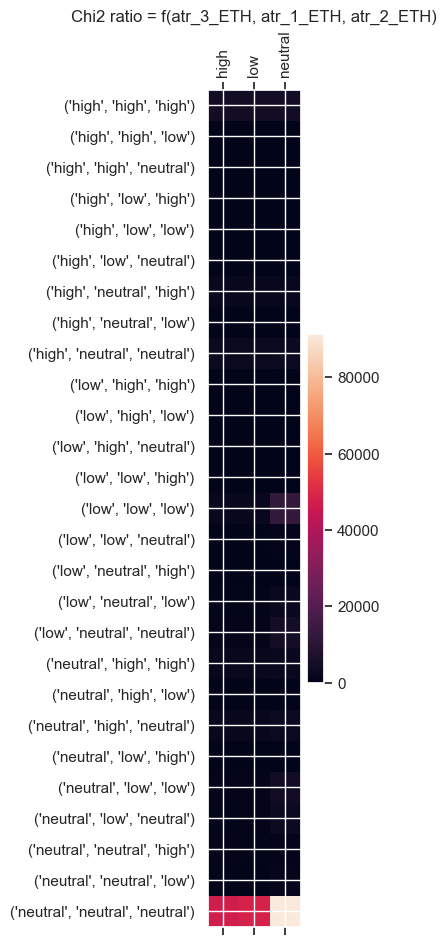

In [314]:
plot_corr(
    df_cross[["high","low","neutral"]], 
    title = f"Chi2 ratio = f({max_chi2_0.index[0]}, {max_chi2_0.index[1]}, {max_chi2_0.index[2]})", 
    size=1.5,
)

#### LAST Lag (newest)

In [315]:
list_past

[71, 70, 68, 64, 56, 40, 8]

In [316]:
df = list_df[0]

Text(0.5, 1.0, 'Min Chi2 between LAST Lag and LAST Target')

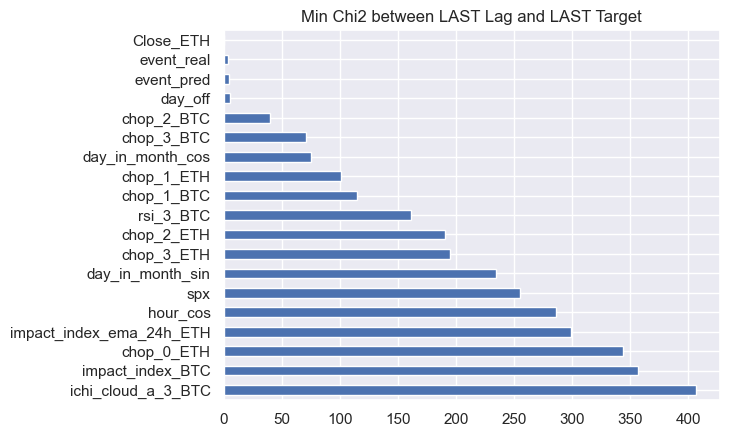

In [317]:
# find chi2_0 values in the 10% highest quantiles 
chi2_name = f"chi2_{list_past[0]}"
min_quantile_chi2_q10 = df_cont[chi2_name].quantile(0.10)
min_chi2_last = df_cont[chi2_name].sort_values(ascending=False)
min_chi2_last[min_chi2_last.values<min_quantile_chi2_q10].plot.barh()
# get current axis
ax = plt.gca()
# set y-axis label
ax.set_title("Min Chi2 between LAST Lag and LAST Target")

Text(0.5, 1.0, 'Max Chi2 between LAST Lag and Target cat')

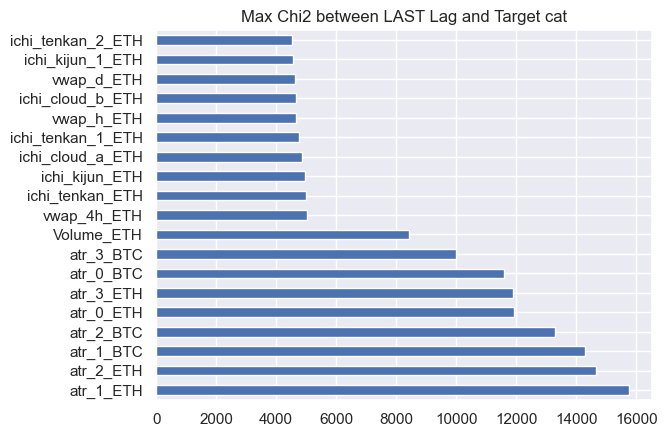

In [318]:
# find chi2_0 values in the 10% highest quantiles 
max_quantile_chi2_q90 = df_cont[chi2_name].quantile(0.90)
max_chi2_last = df_cont[chi2_name].sort_values(ascending=False)
max_chi2_last[max_chi2_last.values>max_quantile_chi2_q90].plot.barh()
# get current axis
ax = plt.gca()
# set y-axis label
ax.set_title("Max Chi2 between LAST Lag and Target cat")

expected:  [[  6582.74909019   6714.95007607  13521.30083374]
 [  6582.74909019   6714.95007607  13521.30083374]
 [ 52661.50181962  53719.09984787 108169.39833251]]
target_cat        high      low   neutral     Total
atr_1_ETH_cat                                      
high            8785.0   8802.0    9232.0   26819.0
low             2180.0   1946.0   22693.0   26819.0
neutral        54862.0  56401.0  103287.0  214550.0
total          65827.0  67149.0  135212.0  268188.0
xi_n =  15745.220753628855
chi2:  15745.220753628857
dof:  4
p:  0.0
We have we have a 0.0000% chance for H0 to be true.
H0 : independance of distributions
H1 : distribution are not independant : we reject H0


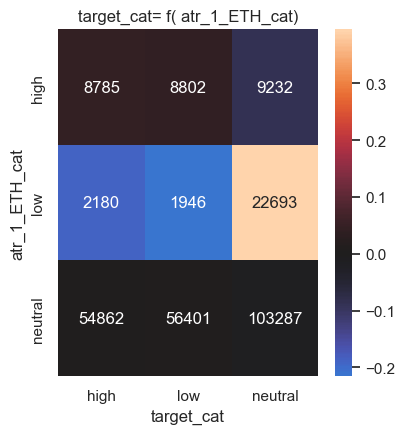

target_cat,high,low,neutral
atr_1_ETH_cat,,,
high,8785,8802,9232
low,2180,1946,22693
neutral,54862,56401,103287


In [319]:
feat_name_max = max_chi2_last.index[0]
# plot contingency table for the feature with the highest chi2
X = feat_name_max + "_cat"
Y = "target_cat"
plot_cont(X=X, Y=Y, data=df)

In [320]:
Y

'target_cat'

In [321]:
X

'atr_1_ETH_cat'

In [322]:
max_chi2_last.index[1]

'atr_2_ETH'

In [323]:
# create contingency dataframe
col_name_0 = f"{max_chi2_last.index[0]}_cat"
col_name_1 = f"{max_chi2_last.index[1]}_cat"
col_name_2 = f"{max_chi2_last.index[2]}_cat"
df_cross = pd.crosstab([df[col_name_0], df[col_name_1], df[col_name_2]], df[Y], margins=False, dropna=False)
# get target names
target_cat_names = df_cross.columns.to_list()
print("target_cat_names: ", target_cat_names)
# get index lengths
nb_level_0 = len(df_cross.index.levels[0])
nb_level_1 = len(df_cross.index.levels[1])
nb_level_2 = len(df_cross.index.levels[2])  
nb_targets = df_cross.shape[1]
# create array contingency
arr_cont = np.empty((nb_level_0,nb_level_1,nb_level_2,nb_targets))
for I_0, level_0 in enumerate(df_cross.index.levels[0]):
    #print("#level_0: ", I_0)
    for I_1,level_1 in enumerate(df_cross.index.levels[1]):
        #print("#level_1: ", I_1)
        arr_cont[I_0, I_1] = df_cross.loc[(level_0, level_1)].values
print("arr_cont.shape : ", arr_cont.shape)
# add probs
df_cross["p_high"] = df_cross["high"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
df_cross["p_low"] = df_cross["low"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
df_cross["p_neutral"] = df_cross["neutral"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
# just calculate ratio :  sign * delta (H - L)^2 /  mean(H,L) 
df_cross["chi2_delta_high"] = np.sign(df_cross["high"] - df_cross["low"]) * (df_cross["high"] - df_cross["low"])**2 / ((df_cross["low"] + df_cross["high"])/2)
# calc chi2, p-value, expected frequencies
res = stats.chi2_contingency(arr_cont)
print("chi2: ", res.statistic)
print("p-value: ", res.pvalue)
# add expected frequencies to df_cross
arr_exp = res.expected_freq.reshape(nb_level_0*nb_level_1*nb_level_2, nb_targets)
for I, col in enumerate(target_cat_names):
        df_cross[f"exp_{col}"] = arr_exp[:,I]
# get sign of difference between observed and expected frequencies
arr_sign = np.sign(arr_cont - res.expected_freq)
# calc chi2 ratio and add to df_cross
arr_chi2_ratio = arr_sign*((arr_cont - res.expected_freq)**2/res.expected_freq)/res.statistic
arr_chi2_ration_reshape = arr_chi2_ratio.reshape(nb_level_0*nb_level_1*nb_level_2, nb_targets)
for I, col in enumerate(target_cat_names):
        df_cross[f"chi2_pc_{col}"] = 100*arr_chi2_ration_reshape[:,I]
df_cross

target_cat_names:  ['high', 'low', 'neutral']
arr_cont.shape :  (3, 3, 3, 3)
chi2:  2859414.922715553
p-value:  0.0


target_cat                                  high    low  neutral    p_high  \
atr_1_ETH_cat atr_2_ETH_cat atr_1_BTC_cat                                    
high          high          high            4738   4783     5173  0.322445   
                            low                0      0        0       NaN   
                            neutral         1646   1563     1568  0.344568   
              low           high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            0      0        0       NaN   
              neutral       high            1075   1094     1117  0.327145   
                            low                0      0        0       NaN   
                            neutral         1326   1362     1374  0.326440   
low           high          high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            0      0        0       NaN   
              low           high               0      0        0       NaN   
                            low             1194   1075    16048  0.065185   
                            neutral          366    386     2418  0.115457   
              neutral       high               0      0        0       NaN   
                            low              302    160     1880  0.128950   
                            neutral          318    325     2347  0.106355   
neutral       high          high             724    666      757  0.337215   
                            low                0      0        0       NaN   
                            neutral         1804   1665     1732  0.346856   
              low           high               0      0        0       NaN   
                            low              176    253     1094  0.115561   
                            neutral          411    653     2745  0.107902   
              neutral       high            2266   2140     2286  0.338613   
                            low              796    642     3199  0.171663   
                            neutral        48685  50382    91474  0.255509   

target_cat                                    p_low  p_neutral  \
atr_1_ETH_cat atr_2_ETH_cat atr_1_BTC_cat                        
high          high          high           0.325507   0.352048   
                            low                 NaN        NaN   
                            neutral        0.327193   0.328239   
              low           high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral             NaN        NaN   
              neutral       high           0.332928   0.339927   
                            low                 NaN        NaN   
                            neutral        0.335303   0.338257   
low           high          high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral             NaN        NaN   
              low           high                NaN        NaN   
                            low            0.058689   0.876126   
                            neutral        0.121767   0.762776   
              neutral       high                NaN        NaN   
                            low            0.068318   0.802733   
                            neutral        0.108696   0.784950   
neutral       high          high           0.310200   0.352585   
                            low                 NaN        NaN   
                            neutral        0.320131   0.333013   
              low           high                NaN        NaN   
                            low            0.166120   0.718319   
                            neutral        0.171436   0.720662   
              neutral

In [324]:
# df_cross["p_high"] = df_cross["high"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
# df_cross["p_low"] = df_cross["low"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
# df_cross["p_neutral"] = df_cross["neutral"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
# df_cross

In [325]:
df_cross["high"] / df.shape[0]

atr_1_ETH_cat  atr_2_ETH_cat  atr_1_BTC_cat
high           high           high             0.017667
                              low              0.000000
                              neutral          0.006137
               low            high             0.000000
                              low              0.000000
                              neutral          0.000000
               neutral        high             0.004008
                              low              0.000000
                              neutral          0.004944
low            high           high             0.000000
                              low              0.000000
                              neutral          0.000000
               low            high             0.000000
                              low              0.004452
                              neutral          0.001365
               neutral        high             0.000000
                              low              0.001126
    

In [326]:
df_cross["high"].sum() / df_cross[["high", "neutral","low"]].sum().sum()

np.float64(0.24545095231703135)

In [327]:
df_cross["low"].sum() / df_cross[["high", "neutral","low"]].sum().sum()

np.float64(0.25038033021611705)

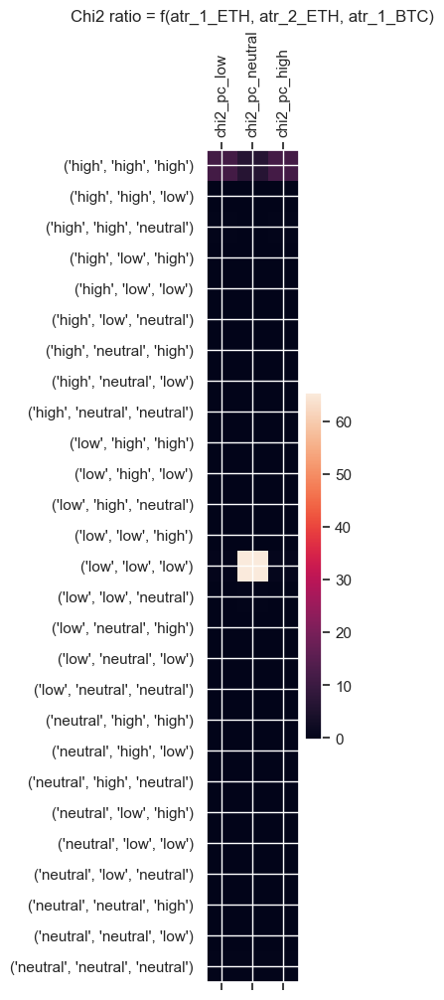

In [328]:
plot_corr(
    df_cross[["chi2_pc_low","chi2_pc_neutral","chi2_pc_high"]], 
    title = f"Chi2 ratio = f({max_chi2_last.index[0]}, {max_chi2_last.index[1]}, {max_chi2_last.index[2]})", 
    size=1.5,
)

In [329]:
list_len_levels = []
for I in range(len(df_cross.index.levels)): 
    list_len_levels.append(len(df_cross.index.levels[I]))
list_len_levels

[3, 3, 3]

In [330]:
df_cross.index.unique(level=2)

Index(['high', 'low', 'neutral'], dtype='object', name='atr_1_BTC_cat')

##### check on first LAG (oldest)
We keep the same Features to do the cross table, and apply cat using for the FIRST Lag (oldest)  
To detect if these features are still important with oldest time

In [331]:
list_past[-1]

8

In [332]:
df = list_df[-1]

In [333]:
# create contingency dataframe
col_name_0 = f"{max_chi2_last.index[0]}_cat"
col_name_1 = f"{max_chi2_last.index[1]}_cat"
col_name_2 = f"{max_chi2_last.index[2]}_cat"
df_cross = pd.crosstab([df[col_name_0], df[col_name_1], df[col_name_2]], df[Y], margins=False, dropna=False)
# get target names
target_cat_names = df_cross.columns.to_list()
print("target_cat_names: ", target_cat_names)
# get index lengths
nb_level_0 = len(df_cross.index.levels[0])
nb_level_1 = len(df_cross.index.levels[1])
nb_level_2 = len(df_cross.index.levels[2])  
nb_targets = df_cross.shape[1]
# create array contingency
arr_cont = np.empty((nb_level_0,nb_level_1,nb_level_2,nb_targets))
for I_0, level_0 in enumerate(df_cross.index.levels[0]):
    #print("#level_0: ", I_0)
    for I_1,level_1 in enumerate(df_cross.index.levels[1]):
        #print("#level_1: ", I_1)
        arr_cont[I_0, I_1] = df_cross.loc[(level_0, level_1)].values
print("arr_cont.shape : ", arr_cont.shape)
# add probs
df_cross["p_high"] = df_cross["high"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
df_cross["p_low"] = df_cross["low"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
df_cross["p_neutral"] = df_cross["neutral"] / (df_cross["high"] + df_cross["low"]+ df_cross["neutral"])
# just calculate ratio :  sign * delta (H - L)^2 /  mean(H,L) 
df_cross["chi2_delta_high"] = np.sign(df_cross["high"] - df_cross["low"]) * (df_cross["high"] - df_cross["low"])**2 / ((df_cross["low"] + df_cross["high"])/2)
# calc chi2, p-value, expected frequencies
res = stats.chi2_contingency(arr_cont)
print("chi2: ", res.statistic)
print("p-value: ", res.pvalue)
# add expected frequencies to df_cross
arr_exp = res.expected_freq.reshape(nb_level_0*nb_level_1*nb_level_2, nb_targets)
for I, col in enumerate(target_cat_names):
        df_cross[f"exp_{col}"] = arr_exp[:,I]
# get sign of difference between observed and expected frequencies
arr_sign = np.sign(arr_cont - res.expected_freq)
# calc chi2 ratio and add to df_cross
arr_chi2_ratio = arr_sign*((arr_cont - res.expected_freq)**2/res.expected_freq)/res.statistic
arr_chi2_ration_reshape = arr_chi2_ratio.reshape(nb_level_0*nb_level_1*nb_level_2, nb_targets)
for I, col in enumerate(target_cat_names):
        df_cross[f"chi2_pc_{col}"] = 100*arr_chi2_ration_reshape[:,I]
df_cross

target_cat_names:  ['high', 'low', 'neutral']
arr_cont.shape :  (3, 3, 3, 3)
chi2:  2543431.5978230108
p-value:  0.0


target_cat                                  high    low  neutral    p_high  \
atr_1_ETH_cat atr_2_ETH_cat atr_1_BTC_cat                                    
high          high          high            4960   4551     5164  0.337990   
                            low                0      0        0       NaN   
                            neutral         1592   1540     1621  0.334946   
              low           high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            0      0        0       NaN   
              neutral       high            1005   1016     1292  0.303350   
                            low                0      0        0       NaN   
                            neutral         1173   1201     1678  0.289487   
low           high          high               0      0        0       NaN   
                            low                0      0        0       NaN   
                            neutral            0      0        0       NaN   
              low           high               0      0        0       NaN   
                            low             1741   2340    14318  0.094625   
                            neutral          526    474     2135  0.167783   
              neutral       high               0      0        0       NaN   
                            low              265    373     1711  0.112814   
                            neutral          413    486     2143  0.135766   
neutral       high          high             714    685      721  0.336792   
                            low                0      0        0       NaN   
                            neutral         1841   1463     1854  0.356921   
              low           high               0      0        0       NaN   
                            low              335    178     1032  0.216828   
                            neutral          688    572     2544  0.180862   
              neutral       high            2056   2144     2518  0.306043   
                            low              871    771     3006  0.187392   
                            neutral        47647  49355    93475  0.250146   

target_cat                                    p_low  p_neutral  \
atr_1_ETH_cat atr_2_ETH_cat atr_1_BTC_cat                        
high          high          high           0.310119   0.351891   
                            low                 NaN        NaN   
                            neutral        0.324006   0.341048   
              low           high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral             NaN        NaN   
              neutral       high           0.306671   0.389979   
                            low                 NaN        NaN   
                            neutral        0.296397   0.414116   
low           high          high                NaN        NaN   
                            low                 NaN        NaN   
                            neutral             NaN        NaN   
              low           high                NaN        NaN   
                            low            0.127181   0.778194   
                            neutral        0.151196   0.681021   
              neutral       high                NaN        NaN   
                            low            0.158791   0.728395   
                            neutral        0.159763   0.704471   
neutral       high          high           0.323113   0.340094   
                            low                 NaN        NaN   
                            neutral        0.283637   0.359442   
              low           high                NaN        NaN   
                            low            0.115210   0.667961   
                            neutral        0.150368   0.668770   
              neutral

Results : same rank for chi-2  as for last lag, but smaller values: time between have impact => less direct impact

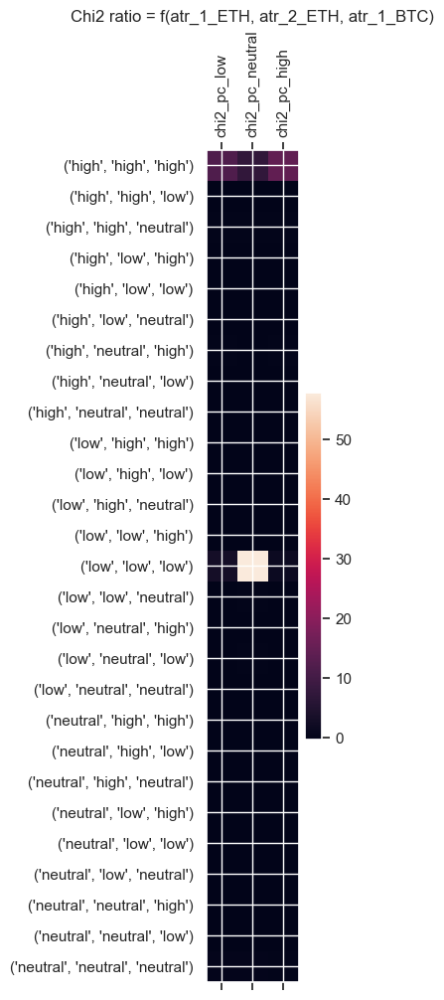

In [334]:
plot_corr(
    df_cross[["chi2_pc_low","chi2_pc_neutral","chi2_pc_high"]], 
    title = f"Chi2 ratio = f({max_chi2_last.index[0]}, {max_chi2_last.index[1]}, {max_chi2_last.index[2]})", 
    size=1.5,
)

expected:  [[  6576.36736543   6708.44018748  13508.19244709]
 [  6608.76689114   6741.49039107  13574.74271779]
 [ 52641.86574343  53699.06942145 108129.06483512]]
target_cat        high      low   neutral     Total
atr_1_ETH_cat                                      
high            8730.0   8308.0    9755.0   26793.0
low             2945.0   3673.0   20307.0   26925.0
neutral        54152.0  55168.0  105150.0  214470.0
total          65827.0  67149.0  135212.0  268188.0
xi_n =  9061.64283596768
chi2:  9061.642835967681
dof:  4
p:  0.0
We have we have a 0.0000% chance for H0 to be true.
H0 : independance of distributions
H1 : distribution are not independant : we reject H0


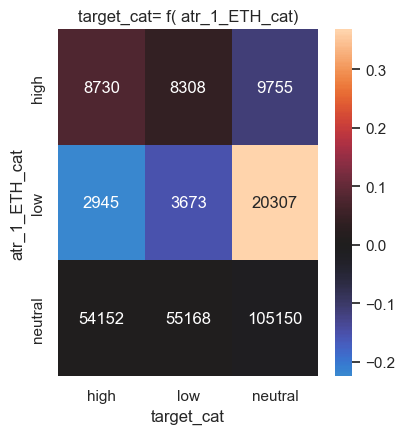

target_cat,high,low,neutral
atr_1_ETH_cat,,,
high,8730,8308,9755
low,2945,3673,20307
neutral,54152,55168,105150


In [335]:
X = feat_name_max + "_cat"
Y = "target_cat"
plot_cont(X=X, Y=Y, data=df)

## Prob study

In [336]:
list_past

[71, 70, 68, 64, 56, 40, 8]

In [337]:

def get_index_combinations(n_elements, k_selection):
    """
    Generates all combinations of indices for selecting k elements from a list of n.

    Args:
        n_elements (int): The total number of elements in the list.
        k_selection (int): The number of elements to choose in each combination.

    Returns:
        list: A list of tuples, where each tuple is a combination of indices.
    """
    # Create a list of indices from 0 to n_elements - 1
    indices = range(n_elements)

    # Generate the combinations
    combinations = list(itertools.combinations(indices, k_selection))
    
    return combinations

#### On Highest delta_prob
delta prob between high and low

##### Per feature, per lag

In [338]:
df_prob.sort_values(by=["delta_prob"], ascending=False).head(7)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
429,max_high_3_ETH_cat,low,70,7340,5852,0.27161,0.216548,335.679806
59,max_high_3_ETH_cat,low,71,7261,5784,0.270741,0.215668,334.462093
799,max_high_3_ETH_cat,low,68,7638,6157,0.273479,0.220452,317.993621
1169,max_high_3_ETH_cat,low,64,8267,6810,0.275677,0.227091,281.600982
1539,max_high_3_ETH_cat,low,56,9457,7950,0.278713,0.234299,260.935141
2273,max_high_2_ETH_cat,low,8,21560,19318,0.269288,0.241285,245.930036
2287,vwap_4h_ETH_cat,low,8,21808,19648,0.300229,0.270492,225.086839


In [339]:
df_prob.sort_values(by=["delta_prob"], ascending=True).head(7)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
1898,min_low_1_ETH_cat,high,40,19489,22914,0.226485,0.266287,-553.29222
1904,min_low_2_ETH_cat,high,40,13980,16637,0.222672,0.264992,-461.158768
2268,min_low_1_ETH_cat,high,8,22891,26076,0.233258,0.265713,-414.329038
2262,min_low_0_ETH_cat,high,8,28346,31852,0.234514,0.263521,-408.386857
2226,Low_ETH_cat,high,8,28346,31852,0.234514,0.263521,-408.386857
1892,min_low_0_ETH_cat,high,40,27064,30355,0.233893,0.262335,-377.250771
1856,Low_ETH_cat,high,40,27064,30355,0.233893,0.262335,-377.250771


In [340]:
# check with best linear correlation features
# compare best correlation tuples (feat, lag) and the best delta_prob tuple (feat, lag)

##### Per combinaison of 3 tuples of feature/lag

In [341]:
# algo check new data : 
# - hash input of function : hash of df_prob
# - compare with input hash file on disk : path_prob_hash
# - if same, load df_prob_comb : path_df_prob_comb

# hash input
hash_df_prob_comb_inputs =(get_data_hash(df_prob) + get_data_hash(df_targets))
# load df_prob file hash
path_prob_comb_inputs_hash = os.path.join(path_data, 'df_prob_comb_inputs_hash.txt')
hash_df_prob_comb_inputs_old = load_hash(path_prob_comb_inputs_hash)

# compare hash
if hash_df_prob_comb_inputs == hash_df_prob_comb_inputs_old:
    print("hash match: mode LOAD df_prob_comb")
    # load df_prob_comb
    df_prob_comb = pd.read_csv(path_df_prob_comb)
    mode_do_comb = False
else:
    print("hash not match : mode REDO comb")
    mode_do_comb = True

hash match: mode LOAD df_prob_comb


Feature selection :  limited to 30th first ones => 219240 combinaisons of 3 singles events

In [342]:
1500*30*29

1305000

In [343]:
df_prob.shape

(2590, 8)

In [344]:
(4060)*(3*3*3)*2

219240

In [345]:
len(get_index_combinations(30,3))

4060

###### Old Comb 1

In [346]:
mode_do_comb = False

In [347]:
nb_best_feat = 30

In [348]:
# Probability  of target high or low for Combination of best features (highest and lowest delta_prob) 
# Combinaison of 3 features (1 feat = 1 feature on one lag)

df_prob_high = df_prob.sort_values(by=["delta_prob"], ascending=False).head(nb_best_feat)
df_prob_low = df_prob.sort_values(by=["delta_prob"], ascending=True).head(nb_best_feat)
list_study_feat_high = df_prob_high["feature"].values
list_study_lag_high = df_prob_high["lag"].values
list_study_I_past_high = [np.argmax(np.array(list_past) == x) for x in list_study_lag_high]
list_study_feat_low = df_prob_low["feature"].values
list_study_lag_low = df_prob_low["lag"].values
list_study_I_past_low = [np.argmax(np.array(list_past) == x) for x in list_study_lag_low]
for I in range(len(list_study_feat_high)):
    print(list_study_feat_high[I], list_study_lag_high[I])
for I in range(len(list_study_feat_low)):
    print(list_study_feat_low[I], list_study_lag_low[I])

# Target cat = High
# get all combinaisons
list_comb_high = get_index_combinations(len(list_study_feat_high), 3)
print("Cross Table Computaton nb : len(list_comb_high) : ", len(list_comb_high))
# Target cat = Low
# get all combinaisons
list_comb_low = get_index_combinations(len(list_study_feat_low), 3)
print("Cross Table Computaton nb : len(list_comb_low) : ", len(list_comb_low))

if mode_do_comb :
    list_cross = []
    df_prob_comb = pd.DataFrame()
    # HIGH
    for comb in list_comb_high:
        col_name_0 = list_study_feat_high[comb[0]]
        col_name_1 = list_study_feat_high[comb[1]]
        col_name_2 = list_study_feat_high[comb[2]]
        I_past_0 = list_study_I_past_high[comb[0]]
        I_past_1 = list_study_I_past_high[comb[1]]
        I_past_2 = list_study_I_past_high[comb[2]]
        lag_0 = list_study_lag_high[comb[0]]
        lag_1 = list_study_lag_high[comb[1]]
        lag_2 = list_study_lag_high[comb[2]]
        df_cross_comb = pd.crosstab(
            [
                list_df[I_past_0][col_name_0],
                list_df[I_past_1][col_name_1], 
                list_df[I_past_2][col_name_2],
            ],
            df_targets["target_cat"], 
            margins=False, 
            dropna=False
        )
        # add probs
        df_cross_comb["p_high"] = df_cross_comb["high"] / (df_cross_comb["high"] + df_cross_comb["low"]+ df_cross_comb["neutral"])
        df_cross_comb["p_low"] = df_cross_comb["low"] / (df_cross_comb["high"] + df_cross_comb["low"]+ df_cross_comb["neutral"])
        # just calculate ratio :  sign * delta (H - L)^2 /  mean(H,L) 
        df_cross_comb["delta_prob"] = np.sign(
            df_cross_comb["high"] - df_cross_comb["low"]) * (
                df_cross_comb["high"] - df_cross_comb["low"])**2 / (
                    (df_cross_comb["low"] + df_cross_comb["high"])/2)
        list_cross.append(df_cross_comb)
        df_cross_comb = df_cross_comb.reset_index(allow_duplicates=True)
        df_cross_comb["feat_0"] = df_cross_comb.columns[0]
        df_cross_comb["feat_0_cat"] = df_cross_comb.values[:,0]
        df_cross_comb["lag_0"] = lag_0
        df_cross_comb["feat_1"] = df_cross_comb.columns[1]
        df_cross_comb["feat_1_cat"] = df_cross_comb.values[:,1]
        df_cross_comb["lag_1"] = lag_1
        df_cross_comb["feat_2"] = df_cross_comb.columns[2]
        df_cross_comb["feat_2_cat"] = df_cross_comb.values[:,2]
        df_cross_comb["lag_2"] = lag_2
        df_cross_comb.drop(columns=[col_name_0, col_name_1, col_name_2], inplace=True)
        if df_prob_comb.shape[0] == 0:
            df_prob_comb = df_cross_comb
        else:
            #pd.concat([df_prob, ser_prob_curr.to_frame().T], ignore_index=True)
            df_prob_comb = pd.concat([df_prob_comb, df_cross_comb], ignore_index=True)
    print(" ")
    print("Cross Table Computed nb : len(list_cross) : ", len(list_cross))

    # LOW
    for comb in list_comb_low:
        col_name_0 = list_study_feat_low[comb[0]]
        col_name_1 = list_study_feat_low[comb[1]]
        col_name_2 = list_study_feat_low[comb[2]]
        I_past_0 = list_study_I_past_low[comb[0]]
        I_past_1 = list_study_I_past_low[comb[1]]
        I_past_2 = list_study_I_past_low[comb[2]]
        lag_0 = list_study_lag_low[comb[0]]
        lag_1 = list_study_lag_low[comb[1]]
        lag_2 = list_study_lag_low[comb[2]]
        df_cross_comb = pd.crosstab(
            [
                list_df[I_past_0][col_name_0],
                list_df[I_past_1][col_name_1], 
                list_df[I_past_2][col_name_2]
            ],
            df_targets["target_cat"], 
            margins=False, 
            dropna=False
        )
        # add probs
        df_cross_comb["p_high"] = df_cross_comb["high"] / (df_cross_comb["high"] + df_cross_comb["low"]+ df_cross_comb["neutral"])
        df_cross_comb["p_low"] = df_cross_comb["low"] / (df_cross_comb["high"] + df_cross_comb["low"]+ df_cross_comb["neutral"])
        # just calculate ratio :  sign * delta (H - L)^2 /  mean(H,L) 
        df_cross_comb["delta_prob"] = np.sign(
            df_cross_comb["high"] - df_cross_comb["low"]) * (
                df_cross_comb["high"] - df_cross_comb["low"])**2 / (
                    (df_cross_comb["low"] + df_cross_comb["high"])/2)
        list_cross.append(df_cross_comb)
        df_cross_comb = df_cross_comb.reset_index(allow_duplicates=True)
        df_cross_comb["feat_0"] = df_cross_comb.columns[0]
        df_cross_comb["feat_0_cat"] = df_cross_comb.values[:,0]
        df_cross_comb["lag_0"] = lag_0
        df_cross_comb["feat_1"] = df_cross_comb.columns[1]
        df_cross_comb["feat_1_cat"] = df_cross_comb.values[:,1]
        df_cross_comb["lag_1"] = lag_1
        df_cross_comb["feat_2"] = df_cross_comb.columns[2]
        df_cross_comb["feat_2_cat"] = df_cross_comb.values[:,2]
        df_cross_comb["lag_2"] = lag_2
        df_cross_comb.drop(columns=[col_name_0, col_name_1, col_name_2], inplace=True)
        if df_prob_comb.shape[0] == 0:
            df_prob_comb = df_cross_comb
        else:
            #pd.concat([df_prob, ser_prob_curr.to_frame().T], ignore_index=True)
            df_prob_comb = pd.concat([df_prob_comb, df_cross_comb], ignore_index=True)

    # save CSV
    df_prob_comb.to_csv(path_df_prob_comb, index=False)
    # save hash inputs
    with open(path_prob_comb_inputs_hash, 'w') as file:
        file.write(hash_df_prob_comb_inputs)
df_prob_comb.sort_values(by=["delta_prob"], ascending=False)


max_high_3_ETH_cat 70
max_high_3_ETH_cat 71
max_high_3_ETH_cat 68
max_high_3_ETH_cat 64
max_high_3_ETH_cat 56
max_high_2_ETH_cat 8
vwap_4h_ETH_cat 8
Open_ETH_cat 8
max_high_3_ETH_cat 40
Low_ETH_cat 8
min_low_0_ETH_cat 8
ichi_kijun_ETH_cat 8
High_ETH_cat 8
max_high_0_ETH_cat 8
ichi_tenkan_1_ETH_cat 71
ichi_tenkan_ETH_cat 8
ichi_tenkan_1_ETH_cat 70
vwap_h_ETH_cat 8
max_high_1_ETH_cat 8
max_high_3_ETH_cat 8
ichi_cloud_b_ETH_cat 40
ichi_cloud_a_ETH_cat 8
max_high_2_ETH_cat 71
min_low_1_ETH_cat 8
ichi_tenkan_1_ETH_cat 68
Open_ETH_cat 40
max_high_2_ETH_cat 40
min_low_2_ETH_cat 8
vwap_h_ETH_cat 40
min_low_0_ETH_cat 40
min_low_1_ETH_cat 40
min_low_2_ETH_cat 40
min_low_1_ETH_cat 8
min_low_0_ETH_cat 8
Low_ETH_cat 8
min_low_0_ETH_cat 40
Low_ETH_cat 40
min_low_3_ETH_cat 40
Open_ETH_cat 8
min_low_3_ETH_cat 71
min_low_3_ETH_cat 70
ichi_tenkan_ETH_cat 8
High_ETH_cat 8
max_high_0_ETH_cat 8
min_low_2_ETH_cat 56
Open_ETH_cat 40
min_low_3_ETH_cat 68
vwap_h_ETH_cat 8
min_low_1_ETH_cat 56
vwap_h_ETH_cat 40

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
662,1816,1036,4202,0.257443,0.146867,426.647966,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,71,max_high_2_ETH_cat,neutral,40
1391,1803,1033,4177,0.257094,0.147298,418.124118,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,68,max_high_2_ETH_cat,neutral,40
11597,1792,1028,4173,0.256256,0.147004,413.968794,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68,max_high_2_ETH_cat,neutral,40
9653,1539,841,3434,0.264706,0.144651,409.415126,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,8,max_high_2_ETH_cat,neutral,40
29336,1573,867,3469,0.266204,0.146725,408.554098,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,8,max_high_2_ETH_cat,neutral,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219233,0,0,0,NaN,NaN,NaN,min_low_2_ETH_cat,neutral,71,min_low_0_ETH_cat,high,56,Low_ETH_cat,neutral,56
219234,0,0,0,NaN,NaN,NaN,min_low_2_ETH_cat,neutral,71,min_low_0_ETH_cat,low,56,Low_ETH_cat,high,56
219236,0,0,0,NaN,NaN,NaN,min_low_2_ETH_cat,neutral,71,min_low_0_ETH_cat,low,56,Low_ETH_cat,neutral,56
219237,0,0,0,NaN,NaN,NaN,min_low_2_ETH_cat,neutral,71,min_low_0_ETH_cat,neutral,56,Low_ETH_cat,high,56


In [349]:
df_prob.sort_values(by=["prob_high"], ascending=False).head(50)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
2568,event_pred_cat,high,8,17,6,0.653846,0.230769,10.521739
1829,event_pred_cat,low,56,12,8,0.444444,0.296296,1.6
2570,event_real_cat,high,8,13,8,0.419355,0.258065,2.380952
721,event_real_cat,low,70,9,3,0.409091,0.136364,6.0
2571,event_real_cat,low,8,9,4,0.409091,0.181818,3.846154
2201,event_real_cat,low,40,9,6,0.409091,0.272727,1.2
1831,event_real_cat,low,56,9,6,0.409091,0.272727,1.2
349,event_pred_cat,low,71,11,4,0.407407,0.148148,6.533333
2198,event_pred_cat,high,40,10,10,0.384615,0.384615,0.0
719,event_pred_cat,low,70,10,6,0.37037,0.222222,2.0


###### NEW selection : comb 2 (not used)

In [350]:
# comb 2 

df_prob[
    (df_prob["delta_prob"] > 10) & (df_prob["prob_high"] > 0.315)
    ].sort_values(by="prob_high", ascending=False).head(50)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
2568,event_pred_cat,high,8,17,6,0.653846,0.230769,10.521739
2276,atr_2_ETH_cat,high,8,9107,8239,0.34101,0.308507,86.870056
1906,atr_2_ETH_cat,high,40,9011,8512,0.336332,0.317707,28.419905
1166,atr_2_ETH_cat,high,64,8982,8621,0.335049,0.321583,14.806681
2034,atr_2_BTC_cat,high,40,8993,8403,0.334536,0.312588,40.020694
1536,atr_2_ETH_cat,high,56,8969,8620,0.334352,0.321342,13.849679
2404,atr_2_BTC_cat,high,8,8939,8198,0.33306,0.305451,64.081344
1530,atr_1_ETH_cat,high,56,8938,8620,0.333035,0.321186,11.518852
23,ichi_tenkan_1_ETH_cat,low,71,8930,7754,0.332973,0.289123,165.784704
55,min_low_2_ETH_cat,low,71,8919,8426,0.332563,0.31418,28.025252


In [351]:
df_prob[
    (df_prob["delta_prob"] > 10) & (df_prob["prob_high"] > 0.315)
    ].sort_values(by="prob_high", ascending=False).tail(50)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
437,vwap_4h_ETH_cat,low,70,9113,8724,0.32198,0.308236,16.967091
751,ichi_cloud_b_ETH_cat,low,68,9150,8651,0.321741,0.304195,27.976069
749,ichi_cloud_a_ETH_cat,low,68,9364,8951,0.321654,0.307468,18.626153
1141,ichi_tenkan_2_ETH_cat,low,64,9043,8638,0.321506,0.307107,18.553815
807,vwap_4h_ETH_cat,low,68,10004,9485,0.321434,0.304759,27.642362
1911,min_low_3_ETH_cat,low,40,9613,9195,0.321333,0.307361,18.579753
1193,vp_vpoc_d_ETH_cat,low,64,8845,8349,0.321274,0.303258,28.616494
823,vp_vpoc_d_ETH_cat,low,68,8706,8215,0.321041,0.302935,28.494888
83,vp_vpoc_d_ETH_cat,low,71,8610,8130,0.321041,0.303143,27.526882
453,vp_vpoc_d_ETH_cat,low,70,8641,8158,0.320976,0.303035,27.774153


In [352]:
df_prob[
    (df_prob["delta_prob"] < -10) & (df_prob["prob_low"] > 0.308)
    ].sort_values(by="prob_high", ascending=False).shape

(99, 8)

In [353]:
# nb_best_feat_2 = 100
delta_prob_high_min = 10
prob_high_min = 0.315
b_high_best_feat = (df_prob["delta_prob"] > delta_prob_high_min) & (df_prob["prob_high"] > prob_high_min)
print("nb high feat: ", df_prob[b_high_best_feat].shape[0])
df_prob[b_high_best_feat]["feature"].unique()


nb high feat:  100


array(['ichi_cloud_a_ETH_cat', 'ichi_cloud_b_ETH_cat',
       'ichi_kijun_1_ETH_cat', 'ichi_tenkan_1_ETH_cat',
       'ichi_tenkan_2_ETH_cat', 'min_low_2_ETH_cat', 'min_low_3_ETH_cat',
       'vwap_4h_ETH_cat', 'vwap_d_ETH_cat', 'vp_vpoc_d_ETH_cat',
       'vp_vah_w_ETH_cat', 'tp_vah_d_ETH_cat', 'tp_vah_w_ETH_cat',
       'atr_3_BTC_cat', 'rsi_1_ETH_cat', 'ichi_kijun_ETH_cat',
       'atr_2_ETH_cat', 'ichi_cloud_b_1_ETH_cat', 'min_low_1_ETH_cat',
       'atr_1_ETH_cat', 'atr_2_BTC_cat', 'atr_0_ETH_cat', 'day_off_cat',
       'atr_0_BTC_cat', 'atr_1_BTC_cat', 'event_pred_cat'], dtype=object)

In [354]:
delta_prob_low_min = -10
prob_low_min = 0.308
b_low_best_feat = (df_prob["delta_prob"] < delta_prob_low_min) & (df_prob["prob_low"] > prob_low_min)
print("nb low feat: ", df_prob[b_low_best_feat].shape[0])
df_prob[b_low_best_feat]["feature"].unique()

nb low feat:  99


array(['Open_ETH_cat', 'ichi_cloud_a_ETH_cat', 'ichi_cloud_b_ETH_cat',
       'ichi_kijun_ETH_cat', 'ichi_cloud_b_1_ETH_cat',
       'ichi_tenkan_1_ETH_cat', 'ichi_cloud_b_3_ETH_cat',
       'vwap_4h_ETH_cat', 'vwap_d_ETH_cat', 'vp_val_d_ETH_cat',
       'vp_vpoc_d_ETH_cat', 'tp_val_d_ETH_cat', 'nupl_BTC_cat',
       'fear_greed_cat', 'High_ETH_cat', 'ichi_tenkan_ETH_cat',
       'max_high_0_ETH_cat', 'vwap_h_ETH_cat', 'tp_tpo_d_ETH_cat',
       'max_high_1_ETH_cat', 'ichi_kijun_1_ETH_cat', 'max_high_2_ETH_cat',
       'ichi_tenkan_2_ETH_cat'], dtype=object)

In [355]:
df_prob

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
0,Close_ETH_cat,high,71,NaN,NaN,NaN,NaN,NaN
1,Close_ETH_cat,low,71,NaN,NaN,NaN,NaN,NaN
2,Open_ETH_cat,high,71,8096,8574,0.301842,0.319663,-27.412597
3,Open_ETH_cat,low,71,8399,8198,0.313173,0.305679,4.86847
4,High_ETH_cat,high,71,8458,8694,0.315373,0.324173,-6.494403
...,...,...,...,...,...,...,...,...
2585,impact_index_ema_4h_BTC_cat,low,8,5343,5165,0.19861,0.191993,6.030453
2586,impact_index_ema_24h_BTC_cat,high,8,7695,7735,0.287148,0.288641,-0.207388
2587,impact_index_ema_24h_BTC_cat,low,8,5039,4869,0.186602,0.180307,5.83367
2588,Close_ETH_raw_cat,high,8,6918,7461,0.258559,0.278853,-41.011058


In [356]:
list_df[0]

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real_cat,impact_index_ETH_cat,impact_index_ema_1h_ETH_cat,impact_index_ema_4h_ETH_cat,impact_index_ema_24h_ETH_cat,impact_index_BTC_cat,impact_index_ema_1h_BTC_cat,impact_index_ema_4h_BTC_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat
0,1.0,0.999782,1.000109,0.999774,0.999171,0.999736,0.998393,0.999464,2.180438,2.176148,...,neutral,neutral,low,low,low,neutral,low,low,low,low
1,1.0,0.999548,1.000008,0.999540,0.998785,0.999276,0.998113,0.999184,2.179435,2.175147,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2,1.0,1.000084,1.000193,0.999841,0.998860,0.999351,0.998243,0.999477,2.179599,2.175311,...,neutral,neutral,low,low,low,neutral,low,low,low,low
3,1.0,1.000770,1.000770,0.999900,0.999669,1.000113,0.999003,1.000239,2.181260,2.176969,...,neutral,neutral,low,low,low,neutral,low,low,low,low
4,1.0,0.999330,1.000025,0.999330,0.999178,0.999443,0.998335,0.999569,2.179799,2.175511,...,neutral,neutral,low,low,low,neutral,low,low,low,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268183,1.0,1.000300,1.001526,0.999087,0.991569,0.989072,1.000620,1.001795,0.963267,0.946999,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
268184,1.0,0.999746,1.000370,0.999198,0.991601,0.988821,1.000366,1.001541,0.963022,0.946759,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
268185,1.0,1.000451,1.000916,0.999241,0.992160,0.989378,1.000839,1.001990,0.963454,0.947184,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
268186,1.0,1.000354,1.001276,0.999370,0.993068,0.990115,1.001436,1.001496,0.963793,0.947516,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high


In [357]:
df[df['Volume_ETH_cat']== "high"]['Volume_ETH_cat']

293       high
326       high
366       high
367       high
368       high
          ... 
268163    high
268164    high
268165    high
268166    high
268173    high
Name: Volume_ETH_cat, Length: 26803, dtype: object

In [358]:
df[(df['Volume_ETH_cat']== "high")&(df["impact_index_ema_24h_BTC_cat"] == "high")&(df["Close_ETH_raw_cat"] == "high")]

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real_cat,impact_index_ETH_cat,impact_index_ema_1h_ETH_cat,impact_index_ema_4h_ETH_cat,impact_index_ema_24h_ETH_cat,impact_index_BTC_cat,impact_index_ema_1h_BTC_cat,impact_index_ema_4h_BTC_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat
122201,1.009112,1.006414,1.009447,1.004757,0.996054,0.992561,1.003850,1.004463,0.939142,0.914478,...,neutral,neutral,neutral,neutral,neutral,neutral,high,high,high,high
122202,1.010386,1.009322,1.011584,1.007323,0.996262,0.992768,1.004466,1.005636,0.939337,0.914668,...,neutral,neutral,neutral,neutral,neutral,neutral,high,high,high,high
122203,1.007447,1.005634,1.007531,1.004399,0.992482,0.988101,1.000095,1.001817,0.934921,0.910368,...,neutral,neutral,neutral,neutral,neutral,neutral,high,high,high,high
122242,1.024958,1.016799,1.026611,1.015172,1.013111,1.010460,1.015218,1.018468,0.955985,0.929693,...,neutral,neutral,neutral,neutral,neutral,neutral,high,high,high,high
122243,1.021986,1.021681,1.023951,1.019065,1.009292,1.007226,1.012282,1.015521,0.953786,0.927578,...,neutral,neutral,neutral,neutral,neutral,neutral,high,high,high,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268163,0.986186,0.981943,0.989239,0.981865,0.972353,0.966939,0.979923,0.981557,0.960522,0.942595,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
268164,0.995071,0.986349,0.997468,0.986165,0.972545,0.967101,0.984119,0.985753,0.960683,0.942753,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
268165,0.989433,0.993159,0.993674,0.987862,0.971012,0.965241,0.982226,0.983857,0.958835,0.940939,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
268166,0.986665,0.987491,0.988219,0.984748,0.969398,0.963374,0.980297,0.981926,0.956953,0.939092,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high


In [359]:
b_test = (df['Volume_ETH_cat']== "high") & (df["impact_index_ema_24h_BTC_cat"] == "high") & (df["Close_ETH_raw_cat"] == "high")
pd.crosstab([
    df[b_test]['Volume_ETH_cat'], 
    df[b_test]['impact_index_ema_24h_BTC_cat'],
    df[b_test]["Close_ETH_raw_cat"],
    ], 
    df[b_test]['target_cat'], margins=True, normalize=True
)

,,target_cat,high,low,neutral,All
Volume_ETH_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat,,,,
high,high,high,0.313835,0.337047,0.349118,1.0
All,,,0.313835,0.337047,0.349118,1.0


In [360]:
b_test = (list_df[0]['Volume_ETH_cat']== "high") & (list_df[1]["impact_index_ema_24h_BTC_cat"] == "high") & (list_df[3]["Close_ETH_raw_cat"] == "high")
df_test_ = pd.crosstab([
    list_df[0][b_test]['Volume_ETH_cat'], 
    list_df[1][b_test]['impact_index_ema_24h_BTC_cat'],
    list_df[3][b_test]["Close_ETH_raw_cat"],
    ], 
    list_df[0][b_test]['target_cat'], margins=False, normalize=False)
df_test_

,,target_cat,high,low,neutral
Volume_ETH_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat,,,
high,high,high,340,377,369


In [361]:
df_test_ = df_test_.reset_index(allow_duplicates=True)
df_test_

target_cat,Volume_ETH_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat,high,low,neutral
0,high,high,high,340,377,369


In [362]:
pd.crosstab(df['Volume_ETH_cat'], df['target_cat'], margins=False, normalize=False).reset_index(allow_duplicates=True)

target_cat,Volume_ETH_cat,high,low,neutral
0,high,8224,7752,10827
1,low,4073,4230,18550
2,neutral,53530,55167,105835


###### Comb 1bis
- without useless crossprob of all feat cat : only best feat cat

In [363]:
nb_best_feat = 100

In [370]:
# algo check new data : 
# - hash input of function : hash of df_prob
# - compare with input hash file on disk : path_prob_hash
# - if same, load df_prob_comb : path_df_prob_comb

# hash input
hash_df_prob_comb_1b_inputs = (get_data_hash(df_prob) + get_data_hash(df_targets) + get_data_hash(nb_best_feat))
# load df_prob file hash
path_prob_comb_1b_inputs_hash = os.path.join(path_data, 'df_prob_comb_1b_inputs_hash.txt')
hash_df_prob_comb_1b_inputs_old = load_hash(path_prob_comb_1b_inputs_hash)

# compare hash
if hash_df_prob_comb_1b_inputs == hash_df_prob_comb_1b_inputs_old:
    print("hash match: mode LOAD df_prob_comb_1b (new)")
    # load df_prob_comb
    df_prob_comb = pd.read_csv(path_df_prob_comb_1b)
    mode_do_comb_1b = False
else:
    print("hash not match : mode REDO comb (new)")
    mode_do_comb_1b = True

hash match: mode LOAD df_prob_comb_1b (new)


In [365]:
nb_best_feat = 100

In [575]:
df_prob.sort_values(by=["delta_prob"], ascending=False).head(nb_best_feat).sort_values(by=["prob_high"], ascending=False).head(60)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
2276,atr_2_ETH_cat,high,8,9107,8239,0.34101,0.308507,86.870056
2404,atr_2_BTC_cat,high,8,8939,8198,0.33306,0.305451,64.081344
23,ichi_tenkan_1_ETH_cat,low,71,8930,7754,0.332973,0.289123,165.784704
393,ichi_tenkan_1_ETH_cat,low,70,9150,7973,0.332389,0.289632,161.809146
1535,min_low_2_ETH_cat,low,56,11548,10650,0.331296,0.305534,72.655555
763,ichi_tenkan_1_ETH_cat,low,68,9519,8383,0.329982,0.290602,144.173388
1133,ichi_tenkan_1_ETH_cat,low,64,10234,9150,0.326986,0.292351,121.239785
1503,ichi_tenkan_1_ETH_cat,low,56,11567,10455,0.323607,0.292497,112.30079
1905,min_low_2_ETH_cat,low,40,13600,12556,0.322443,0.297691,83.341184
1861,ichi_cloud_b_ETH_cat,low,40,13142,11761,0.317862,0.28446,153.167169


In [372]:
# Probability of target high or low for Combination of best features (highest and lowest delta_prob) 
# Combinaison of 3 features (1 feat = 1 feature on one lag)
df_prob_high = df_prob.sort_values(by=["delta_prob"], ascending=False).head(nb_best_feat)
df_prob_low = df_prob.sort_values(by=["delta_prob"], ascending=True).head(nb_best_feat)

#df_prob_high = df_prob[b_high_best_feat]
#df_prob_low = df_prob[b_low_best_feat]
list_study_feat_high = df_prob_high["feature"].values
list_study_lag_high = df_prob_high["lag"].values
list_study_feat_cat_high = df_prob_high["feature_cat"].values
list_study_I_past_high = [np.argmax(np.array(list_past) == x) for x in list_study_lag_high]
list_study_feat_low = df_prob_low["feature"].values
list_study_lag_low = df_prob_low["lag"].values
list_study_feat_cat_low = df_prob_low["feature_cat"].values
list_study_I_past_low = [np.argmax(np.array(list_past) == x) for x in list_study_lag_low]
for I in range(len(list_study_feat_high)):
    print(list_study_feat_high[I], list_study_lag_high[I])
for I in range(len(list_study_feat_low)):
    print(list_study_feat_low[I], list_study_lag_low[I])

# Target cat = High
# get all combinaisons
list_comb_high = get_index_combinations(len(list_study_feat_high), 3)
print("Cross Table Computaton nb : len(list_comb_high) : ", len(list_comb_high))
# Target cat = Low
# get all combinaisons
list_comb_low = get_index_combinations(len(list_study_feat_low), 3)
print("Cross Table Computaton nb : len(list_comb_low) : ", len(list_comb_low))


if mode_do_comb_1b :
    list_cross = []
    df_prob_comb = pd.DataFrame() # high	low	neutral	p_high	p_low	delta_prob
    # HIGH
    for comb in list_comb_high:
        col_name_0 = list_study_feat_high[comb[0]]
        col_name_1 = list_study_feat_high[comb[1]]
        col_name_2 = list_study_feat_high[comb[2]]
        I_past_0 = list_study_I_past_high[comb[0]]
        I_past_1 = list_study_I_past_high[comb[1]]
        I_past_2 = list_study_I_past_high[comb[2]]
        lag_0 = list_study_lag_high[comb[0]]
        lag_1 = list_study_lag_high[comb[1]]
        lag_2 = list_study_lag_high[comb[2]]
        cat_0 = list_study_feat_cat_high[comb[0]]
        cat_1 = list_study_feat_cat_high[comb[1]]
        cat_2 = list_study_feat_cat_high[comb[2]]
        b_select = (
            (list_df[I_past_0][col_name_0] == cat_0) & 
            (list_df[I_past_1][col_name_1] == cat_1) & 
            (list_df[I_past_2][col_name_2] == cat_2)
        )     
        df_cross_comb = pd.crosstab(
            [
                list_df[I_past_0][b_select][col_name_0],
                list_df[I_past_1][b_select][col_name_1], 
                list_df[I_past_2][b_select][col_name_2],
            ],
            list_df[0][b_select]['target_cat'], 
            margins=False, 
            dropna=False
        )
        # add probs

        if not("high" in df_cross_comb.columns):
            df_cross_comb["high"] = 0
        if not("low" in df_cross_comb.columns):
            df_cross_comb["low"] = 0  
        if not("neutral" in df_cross_comb.columns):
            df_cross_comb["neutral"] = 0                    
        df_cross_comb["p_high"] = df_cross_comb["high"] / (df_cross_comb["high"] + df_cross_comb["low"]+ df_cross_comb["neutral"])
        df_cross_comb["p_low"] = df_cross_comb["low"] / (df_cross_comb["high"] + df_cross_comb["low"]+ df_cross_comb["neutral"])
        # just calculate ratio :  sign * delta (H - L)^2 /  mean(H,L) 
        df_cross_comb["delta_prob"] = np.sign(
            df_cross_comb["high"] - df_cross_comb["low"]) * (
                df_cross_comb["high"] - df_cross_comb["low"])**2 / (
                    (df_cross_comb["low"] + df_cross_comb["high"])/2)
        list_cross.append(df_cross_comb)
        df_cross_comb = df_cross_comb.reset_index(allow_duplicates=True)
        df_cross_comb["feat_0"] = df_cross_comb.columns[0]
        df_cross_comb["feat_0_cat"] = cat_0 #df_cross_comb.values[:,0]
        df_cross_comb["lag_0"] = lag_0
        df_cross_comb["feat_1"] = df_cross_comb.columns[1]
        df_cross_comb["feat_1_cat"] = cat_1 #df_cross_comb.values[:,1]
        df_cross_comb["lag_1"] = lag_1
        df_cross_comb["feat_2"] = df_cross_comb.columns[2]
        df_cross_comb["feat_2_cat"] = cat_2 #df_cross_comb.values[:,2]
        df_cross_comb["lag_2"] = lag_2
        df_cross_comb.drop(columns=[col_name_0, col_name_1, col_name_2], inplace=True)
        if df_prob_comb.shape[0] == 0:
            df_prob_comb = df_cross_comb
        else:
            #pd.concat([df_prob, ser_prob_curr.to_frame().T], ignore_index=True)
            df_prob_comb = pd.concat([df_prob_comb, df_cross_comb], ignore_index=True)
    print(" ")
    print("Cross Table Computed nb : len(list_cross) : ", len(list_cross))

    # save CSV
    df_prob_comb.to_csv(path_df_prob_comb_1b, index=False)
    # save hash inputs
    with open(path_prob_comb_1b_inputs_hash, 'w') as file:
        file.write(hash_df_prob_comb_1b_inputs)
df_prob_comb.sort_values(by=["delta_prob"], ascending=False)


max_high_3_ETH_cat 70
max_high_3_ETH_cat 71
max_high_3_ETH_cat 68
max_high_3_ETH_cat 64
max_high_3_ETH_cat 56
max_high_2_ETH_cat 8
vwap_4h_ETH_cat 8
Open_ETH_cat 8
max_high_3_ETH_cat 40
Low_ETH_cat 8
min_low_0_ETH_cat 8
ichi_kijun_ETH_cat 8
High_ETH_cat 8
max_high_0_ETH_cat 8
ichi_tenkan_1_ETH_cat 71
ichi_tenkan_ETH_cat 8
ichi_tenkan_1_ETH_cat 70
vwap_h_ETH_cat 8
max_high_1_ETH_cat 8
max_high_3_ETH_cat 8
ichi_cloud_b_ETH_cat 40
ichi_cloud_a_ETH_cat 8
max_high_2_ETH_cat 71
min_low_1_ETH_cat 8
ichi_tenkan_1_ETH_cat 68
Open_ETH_cat 40
max_high_2_ETH_cat 40
min_low_2_ETH_cat 8
vwap_h_ETH_cat 40
min_low_0_ETH_cat 40
Low_ETH_cat 40
High_ETH_cat 40
max_high_0_ETH_cat 40
rsi_1_ETH_cat 71
max_high_1_ETH_cat 40
max_high_2_ETH_cat 70
max_high_2_ETH_cat 56
ichi_tenkan_1_ETH_cat 64
ichi_kijun_3_ETH_cat 40
ichi_kijun_3_ETH_cat 56
ichi_kijun_3_ETH_cat 71
ichi_kijun_3_ETH_cat 70
rsi_1_ETH_cat 70
ichi_kijun_3_ETH_cat 68
ichi_kijun_3_ETH_cat 64
ichi_cloud_b_ETH_cat 8
ichi_tenkan_1_ETH_cat 56
ichi_tenkan

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
0,7178,5725,13620,0.270633,0.215850,327.243122,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68
98,7168,5738,13537,0.271074,0.216995,316.891368,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,64
1,7062,5652,13429,0.270130,0.216196,312.741859,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,64
4851,7062,5652,13429,0.270130,0.216196,312.741859,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,64
195,6987,5603,13186,0.271066,0.217373,304.282129,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,64,max_high_3_ETH_cat,low,56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160987,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,atr_2_BTC_cat,high,8,ichi_cloud_a_3_ETH_cat,high,56
160942,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,ichi_cloud_a_3_ETH_cat,high,71,atr_2_BTC_cat,high,8
4203,45,99,86,0.195652,0.430435,-40.500000,max_high_3_ETH_cat,low,70,atr_2_ETH_cat,high,8,rsi_1_BTC_cat,high,40
4208,56,115,100,0.206642,0.424354,-40.713450,max_high_3_ETH_cat,low,70,atr_2_ETH_cat,high,8,rsi_1_BTC_cat,high,64


In [375]:
df_prob_comb.sort_values(by=["p_high"], ascending=False).head(60)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
129021,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,71,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
143106,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,8,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
127310,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,56,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
125540,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,40,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
135295,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,64,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
133810,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,68,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
130674,69,12,40,0.570248,0.099174,80.222222,ichi_kijun_3_ETH_cat,high,70,max_high_1_ETH_cat,low,56,rsi_2_BTC_cat,high,68
125391,61,9,37,0.570093,0.084112,77.257143,ichi_kijun_3_ETH_cat,high,40,rsi_2_BTC_cat,high,64,max_high_1_ETH_cat,low,56
130525,61,9,37,0.570093,0.084112,77.257143,ichi_kijun_3_ETH_cat,high,70,rsi_2_BTC_cat,high,64,max_high_1_ETH_cat,low,56
128872,61,9,37,0.570093,0.084112,77.257143,ichi_kijun_3_ETH_cat,high,71,rsi_2_BTC_cat,high,64,max_high_1_ETH_cat,low,56


In [376]:
df_prob_high

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
429,max_high_3_ETH_cat,low,70,7340,5852,0.27161,0.216548,335.679806
59,max_high_3_ETH_cat,low,71,7261,5784,0.270741,0.215668,334.462093
799,max_high_3_ETH_cat,low,68,7638,6157,0.273479,0.220452,317.993621
1169,max_high_3_ETH_cat,low,64,8267,6810,0.275677,0.227091,281.600982
1539,max_high_3_ETH_cat,low,56,9457,7950,0.278713,0.234299,260.935141
...,...,...,...,...,...,...,...,...
1142,ichi_cloud_a_3_ETH_cat,high,64,7763,7079,0.289222,0.263738,63.044873
1036,rsi_1_BTC_cat,high,68,8081,7384,0.301305,0.275317,62.826899
1849,Close_ETH_raw_cat,low,56,5814,5234,0.216641,0.195029,60.8979
1512,ichi_cloud_a_3_ETH_cat,high,56,7771,7107,0.28911,0.264407,59.268181


In [377]:
(4060)*(3*3*3)*2

219240

In [378]:
df_prob_comb.sort_values(by=["delta_prob"], ascending=False).head(20)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
0,7178,5725,13620,0.270633,0.215850,327.243122,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68
98,7168,5738,13537,0.271074,0.216995,316.891368,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,64
1,7062,5652,13429,0.270130,0.216196,312.741859,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,64
4851,7062,5652,13429,0.270130,0.216196,312.741859,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,64
195,6987,5603,13186,0.271066,0.217373,304.282129,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,64,max_high_3_ETH_cat,low,56
99,6987,5603,13186,0.271066,0.217373,304.282129,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,56
4852,6885,5517,13078,0.270212,0.216523,301.793904,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68,max_high_3_ETH_cat,low,56
2,6885,5517,13078,0.270212,0.216523,301.793904,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,56
4948,6885,5517,13078,0.270212,0.216523,301.793904,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,64,max_high_3_ETH_cat,low,56
1023,6985,5630,12031,0.283413,0.228435,291.086009,max_high_3_ETH_cat,low,70,High_ETH_cat,low,8,max_high_0_ETH_cat,low,8


In [379]:
df_prob.sort_values(by=["delta_prob"], ascending=False).head(20)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
429,max_high_3_ETH_cat,low,70,7340,5852,0.27161,0.216548,335.679806
59,max_high_3_ETH_cat,low,71,7261,5784,0.270741,0.215668,334.462093
799,max_high_3_ETH_cat,low,68,7638,6157,0.273479,0.220452,317.993621
1169,max_high_3_ETH_cat,low,64,8267,6810,0.275677,0.227091,281.600982
1539,max_high_3_ETH_cat,low,56,9457,7950,0.278713,0.234299,260.935141
2273,max_high_2_ETH_cat,low,8,21560,19318,0.269288,0.241285,245.930036
2287,vwap_4h_ETH_cat,low,8,21808,19648,0.300229,0.270492,225.086839
2223,Open_ETH_cat,low,8,30578,28296,0.269184,0.249095,176.904032
1909,max_high_3_ETH_cat,low,40,11169,9820,0.276597,0.24319,173.405212
2227,Low_ETH_cat,low,8,31065,28797,0.272926,0.253,171.856069


In [380]:
df_prob_comb.sort_values(by=["delta_prob"], ascending=True).head(20)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
140097,446,598,609,0.269812,0.361766,-44.260536,max_high_2_ETH_cat,low,68,ichi_cloud_a_ETH_cat,low,40,atr_2_ETH_cat,high,8
4208,56,115,100,0.206642,0.424354,-40.713450,max_high_3_ETH_cat,low,70,atr_2_ETH_cat,high,8,rsi_1_BTC_cat,high,64
4203,45,99,86,0.195652,0.430435,-40.500000,max_high_3_ETH_cat,low,70,atr_2_ETH_cat,high,8,rsi_1_BTC_cat,high,40
160969,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,ichi_cloud_a_3_ETH_cat,high,68,atr_2_BTC_cat,high,8
160942,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,ichi_cloud_a_3_ETH_cat,high,71,atr_2_BTC_cat,high,8
160984,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,atr_2_BTC_cat,high,8,ichi_cloud_a_3_ETH_cat,high,64
160987,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,atr_2_BTC_cat,high,8,ichi_cloud_a_3_ETH_cat,high,56
160961,129,212,208,0.234973,0.386157,-40.404692,rsi_1_BTC_cat,high,40,ichi_cloud_a_3_ETH_cat,high,70,atr_2_BTC_cat,high,8
8961,54,110,91,0.211765,0.431373,-38.243902,max_high_3_ETH_cat,low,71,atr_2_ETH_cat,high,8,rsi_1_BTC_cat,high,64
8956,43,94,79,0.199074,0.435185,-37.970803,max_high_3_ETH_cat,low,71,atr_2_ETH_cat,high,8,rsi_1_BTC_cat,high,40


In [381]:
df_prob_comb[df_prob_comb["low"] > 200].sort_values(by=["p_low"], ascending=False).head(20)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
7422,133,211,165,0.261297,0.414538,-35.372093,max_high_3_ETH_cat,low,71,rsi_1_ETH_cat,high,71,atr_2_ETH_cat,high,8
3218,131,206,171,0.257874,0.405512,-33.382789,max_high_3_ETH_cat,low,70,rsi_1_ETH_cat,high,70,atr_2_ETH_cat,high,8
2669,142,221,182,0.260550,0.405505,-34.385675,max_high_3_ETH_cat,low,70,rsi_1_ETH_cat,high,71,atr_2_ETH_cat,high,8
5196,215,286,221,0.297784,0.396122,-20.123752,max_high_3_ETH_cat,low,71,max_high_2_ETH_cat,low,8,atr_2_ETH_cat,high,8
13188,140,219,197,0.251799,0.393885,-34.768802,max_high_3_ETH_cat,low,68,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,high,8
12078,168,254,227,0.258860,0.391371,-35.052133,max_high_3_ETH_cat,low,68,rsi_1_ETH_cat,high,71,atr_2_ETH_cat,high,8
8826,222,293,235,0.296000,0.390667,-19.576699,max_high_3_ETH_cat,low,71,ichi_cloud_a_ETH_cat,low,40,atr_2_ETH_cat,high,8
6939,211,276,223,0.297183,0.388732,-17.351129,max_high_3_ETH_cat,low,71,max_high_2_ETH_cat,low,40,atr_2_ETH_cat,high,8
6564,242,305,239,0.307888,0.388041,-14.511883,max_high_3_ETH_cat,low,71,ichi_cloud_a_ETH_cat,low,8,atr_2_ETH_cat,high,8
6327,230,296,237,0.301442,0.387942,-16.562738,max_high_3_ETH_cat,low,71,max_high_1_ETH_cat,low,8,atr_2_ETH_cat,high,8


In [382]:
df_prob.sort_values(by=["delta_prob"], ascending=True).head(20)

,feature,feature_cat,lag,nb_high,nb_low,prob_high,prob_low,delta_prob
1898,min_low_1_ETH_cat,high,40,19489,22914,0.226485,0.266287,-553.29222
1904,min_low_2_ETH_cat,high,40,13980,16637,0.222672,0.264992,-461.158768
2268,min_low_1_ETH_cat,high,8,22891,26076,0.233258,0.265713,-414.329038
2262,min_low_0_ETH_cat,high,8,28346,31852,0.234514,0.263521,-408.386857
2226,Low_ETH_cat,high,8,28346,31852,0.234514,0.263521,-408.386857
1892,min_low_0_ETH_cat,high,40,27064,30355,0.233893,0.262335,-377.250771
1856,Low_ETH_cat,high,40,27064,30355,0.233893,0.262335,-377.250771
1910,min_low_3_ETH_cat,high,40,7794,9594,0.20942,0.257785,-372.670807
2222,Open_ETH_cat,high,8,26612,29845,0.244809,0.27455,-370.274333
60,min_low_3_ETH_cat,high,71,4732,6133,0.176442,0.228681,-361.307133


In [383]:
df_prob_comb.loc[(df_prob_comb["high"] > 1000) & (df_prob_comb["p_high"] > 0.353)].sort_values(by=["p_high"], ascending=False)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
23014,1524,1036,1425,0.382434,0.259975,186.050000,max_high_3_ETH_cat,low,56,rsi_2_BTC_cat,high,40,rsi_1_BTC_cat,high,40
141442,1074,822,919,0.381528,0.292007,66.987342,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,68
141441,1071,825,920,0.380327,0.292969,63.835443,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,70
141435,1063,815,919,0.380050,0.291384,65.499468,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,64
23143,1715,1177,1626,0.379593,0.260514,200.168741,max_high_3_ETH_cat,low,56,rsi_1_BTC_cat,high,40,rsi_2_BTC_cat,high,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18506,1513,1256,1517,0.353010,0.293047,47.706031,max_high_3_ETH_cat,low,64,rsi_2_BTC_cat,high,64,vwap_h_ETH_cat,low,56
144433,2883,2306,2978,0.353006,0.282356,128.321064,ichi_kijun_ETH_cat,low,40,rsi_1_ETH_cat,high,68,rsi_2_BTC_cat,high,68
59153,2656,2254,2614,0.353004,0.299575,65.826477,max_high_0_ETH_cat,low,8,min_low_2_ETH_cat,low,56,rsi_2_BTC_cat,high,68
55498,2656,2254,2614,0.353004,0.299575,65.826477,High_ETH_cat,low,8,min_low_2_ETH_cat,low,56,rsi_2_BTC_cat,high,68


## Temporal Distribution

### Update index lags

In [384]:
len(list_df)

7

In [385]:
PAST_HISTORY

72

In [386]:
list_past

[71, 70, 68, 64, 56, 40, 8]

#### For Train

In [387]:
# 1st lag : 
print(list_past[0])
start = 0
end = - list_past[0] - 1 - FUTURE_TARGET
print("first lag : ", start, end)
print(pd.to_datetime(df_feat[df_feat["train"]].iloc[start:end]["date_ETH"]))
# 2nd lag : 
start = list_past[0] - list_past[1]
end = - list_past[1] - 1 - FUTURE_TARGET
print("second lag : ", start, end)
print(pd.to_datetime(df_feat[df_feat["train"]].iloc[start:end]["date_ETH"]))
# 3nd lag : 
start = list_past[0] - list_past[2]
end = - list_past[2] - 1 - FUTURE_TARGET
print("third lag : ", start, end)
print(pd.to_datetime(df_feat[df_feat["train"]].iloc[start:end]["date_ETH"]))

71
first lag :  0 -87
0        2023-01-01 00:00:00
1        2023-01-01 00:05:00
2        2023-01-01 00:10:00
3        2023-01-01 00:15:00
4        2023-01-01 00:20:00
                 ...        
268183   2025-07-20 04:30:00
268184   2025-07-20 04:35:00
268185   2025-07-20 04:40:00
268186   2025-07-20 04:45:00
268187   2025-07-20 04:50:00
Name: date_ETH, Length: 268188, dtype: datetime64[ns]
second lag :  1 -86
1        2023-01-01 00:05:00
2        2023-01-01 00:10:00
3        2023-01-01 00:15:00
4        2023-01-01 00:20:00
5        2023-01-01 00:25:00
                 ...        
268184   2025-07-20 04:35:00
268185   2025-07-20 04:40:00
268186   2025-07-20 04:45:00
268187   2025-07-20 04:50:00
268188   2025-07-20 04:55:00
Name: date_ETH, Length: 268188, dtype: datetime64[ns]
third lag :  3 -84
3        2023-01-01 00:15:00
4        2023-01-01 00:20:00
5        2023-01-01 00:25:00
6        2023-01-01 00:30:00
7        2023-01-01 00:35:00
                 ...        
268186   2025-07-20

In [388]:
# 1st lag : 
print(list_past[0])
start = 0
end = - list_past[0] - 1 - FUTURE_TARGET
print("first lag : ", start, end)
index_first_lag = pd.to_datetime(df_feat[df_feat["train"]].iloc[start:end]["date_ETH"])
print(index_first_lag)

for I in range(len(list_df)):
    list_df[I].set_index(index_first_lag, inplace=True)

print(list_df[0].head(2))
print(list_df[-1].head(2))

71
first lag :  0 -87
0        2023-01-01 00:00:00
1        2023-01-01 00:05:00
2        2023-01-01 00:10:00
3        2023-01-01 00:15:00
4        2023-01-01 00:20:00
                 ...        
268183   2025-07-20 04:30:00
268184   2025-07-20 04:35:00
268185   2025-07-20 04:40:00
268186   2025-07-20 04:45:00
268187   2025-07-20 04:50:00
Name: date_ETH, Length: 268188, dtype: datetime64[ns]
                     Close_ETH  Open_ETH  High_ETH   Low_ETH  \
date_ETH                                                       
2023-01-01 00:00:00        1.0  0.999782  1.000109  0.999774   
2023-01-01 00:05:00        1.0  0.999548  1.000008  0.999540   

                     ichi_cloud_a_ETH  ichi_cloud_b_ETH  ichi_kijun_ETH  \
date_ETH                                                                  
2023-01-01 00:00:00          0.999171          0.999736        0.998393   
2023-01-01 00:05:00          0.998785          0.999276        0.998113   

                     ichi_tenkan_ETH  ichi_clou

#### For Test

In [389]:
# 1st lag : 
print(list_past[0])
start = 0
end = - list_past[0] - 1 - FUTURE_TARGET
print("first lag : ", start, end)
index_first_lag = pd.to_datetime(df_feat[df_feat["train"] == False].iloc[start:end]["date_ETH"])
print(index_first_lag)

for I in range(len(list_df_test)):
    list_df_test[I].set_index(index_first_lag, inplace=True)

print(list_df_test[0].head(2))
print(list_df_test[-1].head(2))

71
first lag :  0 -87
268275   2025-07-20 12:10:00
268276   2025-07-20 12:15:00
268277   2025-07-20 12:20:00
268278   2025-07-20 12:25:00
268279   2025-07-20 12:30:00
                 ...        
297990   2025-10-31 16:25:00
297991   2025-10-31 16:30:00
297992   2025-10-31 16:35:00
297993   2025-10-31 16:40:00
297994   2025-10-31 16:45:00
Name: date_ETH, Length: 29720, dtype: datetime64[ns]
                     Close_ETH  Open_ETH  High_ETH   Low_ETH  \
date_ETH                                                       
2025-07-20 12:10:00        1.0  1.000427  1.002051  0.999523   
2025-07-20 12:15:00        1.0  1.000830  1.001398  0.998804   

                     ichi_cloud_a_ETH  ichi_cloud_b_ETH  ichi_kijun_ETH  \
date_ETH                                                                  
2025-07-20 12:10:00          1.003845          1.001453        1.007373   
2025-07-20 12:15:00          1.005302          1.003451        1.008207   

                     ichi_tenkan_ETH  ichi_cloud

In [390]:
""" 
assessment of temporal homogeneity of proba for each feature in 
count the numbers of days/weeks/months with minimum one event 
use list_df and update df_prob_comb with this new insights, knowing that :
- list_df is a list of all lags timeseries dataframe
- same index == target
- an event is a 3 tuples of (features/lags) 
- each row is one event
- 1 group by days and count days with at minimum one event
- feature names are in df_prob_comb : 
- each row in df_prob_comb is an event : 
   e.g. : each line is the definition of intersection of 3 sub-events : 
     - (feat_0 ,feat_0_cat, lag_0 ) & (feat_1, feat_1_cat, lag_1) & (feat_2, feat_2_cat, lag_2)  
- You need to find the lag values in list_past 
- knowing that list_df is a list dataframe for each lag in list_past. 
- Find if an event exist in dataframe in list_df on each period (day/week/month) for each event in df_prob_comb.
 """

def assess_temporal_homogeneity(df_prob_comb, list_df, list_past):
    """
    Assesses the temporal homogeneity of events defined in df_prob_comb.

    Counts the number of unique days, weeks, and months where each event occurs.
    An event is a combination of conditions on different features at different lags.

    Args:
        df_prob_comb (pd.DataFrame): DataFrame where each row defines a complex event.
            Expected columns: 'feat_0', 'feat_0_cat', 'lag_0',
                              'feat_1', 'feat_1_cat', 'lag_1',
                              'feat_2', 'feat_2_cat', 'lag_2'.
        list_df (list of pd.DataFrame): List of timeseries DataFrames, one for each lag.
                                        All DataFrames must share the same DatetimeIndex.
        list_past (list): List of lags corresponding to the DataFrames in list_df.

    Returns:
        pd.DataFrame: The input df_prob_comb with added columns:
                      'days_with_event', 'weeks_with_event', 'months_with_event'.
    """
    # Create a mapping from lag value to its corresponding DataFrame for quick lookup
    if len(list_df) != len(list_past):
        raise ValueError("list_df and list_past must have the same length.")
    lag_to_df = {lag: df for lag, df in zip(list_past, list_df)}

    # Ensure all dataframes have a datetime index
    for lag, df in lag_to_df.items():
        if not isinstance(df.index, pd.DatetimeIndex):
            raise TypeError(f"DataFrame for lag {lag} does not have a DatetimeIndex.")

    # List to store the results for each event (row)
    temporal_counts = []
    df_combined_condition = pd.DataFrame(index=list_df[0].index)
    list_combined_condition = []
    global_combined_condition = pd.Series(False, index=list_df[0].index)
    # Iterate over each event defined in df_prob_comb
    for index, event_row in df_prob_comb.iterrows():
        # Extract the 3 sub-events
        sub_events = [
            {'feat': event_row['feat_0'], 'cat': event_row['feat_0_cat'], 'lag': event_row['lag_0']},
            {'feat': event_row['feat_1'], 'cat': event_row['feat_1_cat'], 'lag': event_row['lag_1']},
            {'feat': event_row['feat_2'], 'cat': event_row['feat_2_cat'], 'lag': event_row['lag_2']},
        ]

        # --- Build the combined boolean condition ---
        # Start with a Series of all True values, with the correct index
        # Assuming all DFs in list_df have the same index, we can pick the first one.
        combined_condition = pd.Series(
            True, 
            index=list_df[0].index,
            name=index,
        )

        for sub_event in sub_events:
            lag, feat, cat = sub_event['lag'], sub_event['feat'], sub_event['cat']

            if lag not in lag_to_df:
                raise KeyError(f"Lag '{lag}' from event {index} not found in list_past.")
            df_for_lag = lag_to_df[lag]

            if feat not in df_for_lag.columns:
                raise KeyError(f"Feature '{feat}' from event {index} not found in DataFrame for lag {lag}.")

            # Create the boolean condition for this sub-event and AND it
            combined_condition &= (df_for_lag[feat] == cat)
        #df_combined_condition[f"event_{index}"] = combined_condition
        #df_combined_condition.insert(0, f"event_{index}", combined_condition)
        list_combined_condition.append(combined_condition)
        # --- Count periods with at least one event ---
        event_timestamps = combined_condition[combined_condition].index
        
        days_count = len(event_timestamps.normalize().unique())
        weeks_count = len(event_timestamps.to_period('W').unique())
        months_count = len(event_timestamps.to_period('M').unique())

        all_days_count = len(combined_condition.index.normalize().unique()) 
        all_weeks_count = len(combined_condition.index.to_period('W').unique())
        all_months_count = len(combined_condition.index.to_period('M').unique())

        temporal_counts.append({
            'days_with_event': days_count,
            'weeks_with_event': weeks_count,
            'months_with_event': months_count,
            'ratio_days_with_event': days_count / all_days_count,
            'ratio_weeks_with_event': weeks_count / all_weeks_count,
            'ratio_months_with_event': months_count / all_months_count,
        })

        # global event 
        global_combined_condition |= combined_condition

    # concat combined conditions
    df_combined_condition = pd.concat(list_combined_condition, axis=1)
    # sum of global event for each day
    global_event_by_day = global_combined_condition.groupby(global_combined_condition.index.normalize()).sum()

    # Convert results to a DataFrame and join with the original
    counts_df = pd.DataFrame(temporal_counts, index=df_prob_comb.index)
    df_prob_comb_updated = df_prob_comb.join(counts_df)

    return df_prob_comb_updated, global_event_by_day, df_combined_condition



### Selection Comb Events 
- Strat 2 : 27000 3-events-comb, nb_event_min = 8000, prob_min = 0.4
- Strat 3 :  1163 3-events-comb, nb_event_min = 1000, prob_min = 0.333

In [391]:
list_df[0].shape

(268188, 392)

In [576]:
df_prob_comb.shape

(161684, 15)

In [392]:
prob_min = 0.35 #0.34
# 1 event / 7 days : : nb_event
nb_one_days = 1
nb_event_min = list_df[0].shape[0]/(24*60/DT_PAST*nb_one_days)
print("nb_event_min: ", nb_event_min)
print("prob_min: ", prob_min)

nb_event_min:  931.2083333333334
prob_min:  0.35


In [393]:
df_prob_comb.loc[
    (df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)
    ].shape

(5712, 15)

<Axes: >

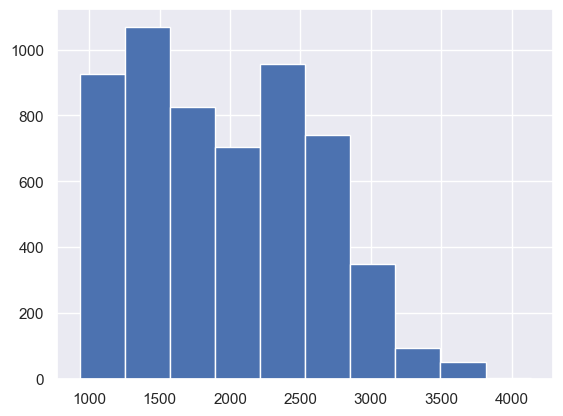

In [394]:
(df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)])["high"].hist()

<Axes: >

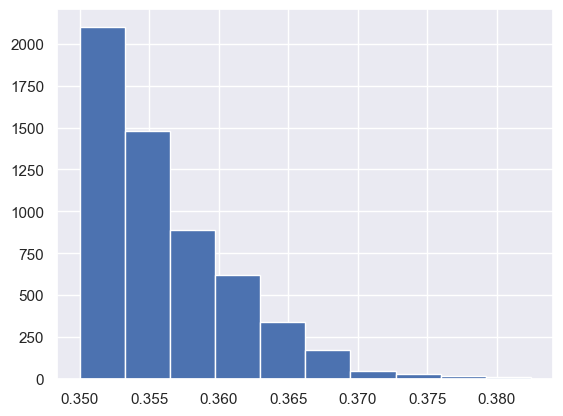

In [395]:
(df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)])["p_high"].hist()

In [396]:
df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)].sort_values(by="p_high", ascending=False).head(60)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
23014,1524,1036,1425,0.382434,0.259975,186.050000,max_high_3_ETH_cat,low,56,rsi_2_BTC_cat,high,40,rsi_1_BTC_cat,high,40
141442,1074,822,919,0.381528,0.292007,66.987342,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,68
145862,962,751,809,0.381443,0.297780,51.980152,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,68
153987,970,749,828,0.380840,0.294071,56.824898,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,64,rsi_1_ETH_cat,high,56
154197,965,746,823,0.380821,0.294396,56.061952,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,68,rsi_1_ETH_cat,high,56
141441,1071,825,920,0.380327,0.292969,63.835443,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,70
154170,959,744,819,0.380254,0.295004,54.286553,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,70,rsi_1_ETH_cat,high,56
141435,1063,815,919,0.380050,0.291384,65.499468,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,64
145861,952,750,804,0.379888,0.299282,47.948296,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,70
145855,949,746,804,0.379752,0.298519,48.624189,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,high,64


In [397]:
df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)].sort_values(by="p_high", ascending=False).tail(60)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
3452,2694,2355,2646,0.350097,0.306043,45.522282,max_high_3_ETH_cat,low,70,ichi_tenkan_1_ETH_cat,low,56,min_low_2_ETH_cat,low,56
5957,2910,2508,2894,0.350096,0.301732,59.654485,max_high_3_ETH_cat,low,71,ichi_tenkan_1_ETH_cat,low,71,min_low_1_ETH_cat,low,8
1256,1643,1402,1648,0.350096,0.298743,38.148440,max_high_3_ETH_cat,low,70,ichi_tenkan_1_ETH_cat,low,71,rsi_1_BTC_cat,high,71
25004,2256,1795,2393,0.350093,0.278554,104.922735,max_high_2_ETH_cat,low,8,max_high_2_ETH_cat,low,40,rsi_2_BTC_cat,high,40
9118,2646,2318,2594,0.350093,0.306695,43.345689,max_high_3_ETH_cat,low,71,min_low_2_ETH_cat,low,40,min_low_2_ETH_cat,low,56
92555,2096,1641,2250,0.350092,0.274094,110.797431,ichi_tenkan_1_ETH_cat,low,68,rsi_1_ETH_cat,high,70,rsi_2_BTC_cat,high,40
69242,2103,1842,2062,0.350092,0.306642,34.535361,ichi_tenkan_1_ETH_cat,low,70,rsi_2_ETH_cat,high,64,ichi_kijun_ETH_cat,low,56
8205,2619,2299,2563,0.350087,0.307312,41.642944,max_high_3_ETH_cat,low,71,ichi_tenkan_1_ETH_cat,low,56,min_low_2_ETH_cat,low,56
89732,1498,1170,1611,0.350082,0.273428,80.647676,min_low_1_ETH_cat,low,8,ichi_kijun_3_ETH_cat,high,70,Open_ETH_cat,low,56
89674,1498,1170,1611,0.350082,0.273428,80.647676,min_low_1_ETH_cat,low,8,ichi_kijun_3_ETH_cat,high,71,Open_ETH_cat,low,56


List of best prob Feature type in events : 

In [398]:
np.unique(np.concatenate((
    df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)]["feat_0"].unique(), 
    df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)]["feat_1"].unique(), 
    df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)]["feat_2"].unique()
)))

array(['Close_ETH_raw_cat', 'High_ETH_cat', 'Low_ETH_cat', 'Open_ETH_cat',
       'atr_2_BTC_cat', 'atr_2_ETH_cat', 'chop_3_ETH_cat',
       'ichi_cloud_a_3_ETH_cat', 'ichi_cloud_a_ETH_cat',
       'ichi_cloud_b_ETH_cat', 'ichi_kijun_3_ETH_cat',
       'ichi_kijun_ETH_cat', 'ichi_tenkan_1_ETH_cat',
       'ichi_tenkan_ETH_cat', 'max_high_0_ETH_cat', 'max_high_1_ETH_cat',
       'max_high_2_ETH_cat', 'max_high_3_ETH_cat', 'min_low_0_ETH_cat',
       'min_low_1_ETH_cat', 'min_low_2_ETH_cat', 'rsi_1_BTC_cat',
       'rsi_1_ETH_cat', 'rsi_2_BTC_cat', 'rsi_2_ETH_cat',
       'vwap_4h_ETH_cat', 'vwap_h_ETH_cat'], dtype=object)

In [399]:
path_hash_temporal = os.path.join(path_data, 'temporal_inputs_hash.txt')
path_df_prob_comb_high_event = os.path.join(path_data, 'df_prob_comb_high_event.pkl')
path_global_event_by_day = os.path.join(path_data, 'global_event_by_day.pkl')
path_df_combined_condition = os.path.join(path_data, 'df_combined_condition.pkl')
mode_redo_temporal, hash_temporal = check_hash_inputs(
     (df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)], 
      list_past), 
      path_hash_temporal,
)


if mode_redo_temporal: # 20 min ?
    
    df_prob_comb_high_event, global_event_by_day, df_combined_condition = assess_temporal_homogeneity(
        df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)], 
        list_df, 
        list_past,
    )
    # save results
    df_prob_comb_high_event.to_pickle(path_df_prob_comb_high_event)
    global_event_by_day.to_pickle(path_global_event_by_day) 
    df_combined_condition.to_pickle(path_df_combined_condition)
    # save hash
    save_hash(path_hash_temporal, hash_temporal)
else:
    # load results
    df_prob_comb_high_event = pd.read_pickle(path_df_prob_comb_high_event)
    global_event_by_day = pd.read_pickle(path_global_event_by_day)
    df_combined_condition = pd.read_pickle(path_df_combined_condition)


hash not match : mode REDO


In [400]:
df_prob_comb_high_event.shape

(5712, 21)

In [401]:
df_combined_condition.shape

(268188, 5712)

In [402]:
df_prob_comb_high_event_test, global_event_by_day_test, df_combined_condition_test = assess_temporal_homogeneity(
        df_prob_comb.loc[(df_prob_comb["high"] > nb_event_min) & (df_prob_comb["p_high"] > prob_min)], 
        list_df_test, 
        list_past,
)

In [403]:
df_combined_condition_test.shape

(29720, 5712)

In [404]:
df_prob_comb_high_event.sort_values(by=["p_high"], ascending=False).head(20)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
23014,1524,1036,1425,0.382434,0.259975,186.050000,max_high_3_ETH_cat,low,56,rsi_2_BTC_cat,...,40,rsi_1_BTC_cat,high,40,123,63,29,0.131974,0.470149,0.935484
141442,1074,822,919,0.381528,0.292007,66.987342,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,51,25,17,0.054721,0.186567,0.548387
145862,962,751,809,0.381443,0.297780,51.980152,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,49,25,17,0.052575,0.186567,0.548387
153987,970,749,828,0.380840,0.294071,56.824898,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,64,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
154197,965,746,823,0.380821,0.294396,56.061952,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,68,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
141441,1071,825,920,0.380327,0.292969,63.835443,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,52,25,17,0.055794,0.186567,0.548387
154170,959,744,819,0.380254,0.295004,54.286553,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,70,rsi_1_ETH_cat,high,56,47,24,17,0.050429,0.179104,0.548387
141435,1063,815,919,0.380050,0.291384,65.499468,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,51,25,17,0.054721,0.186567,0.548387
145861,952,750,804,0.379888,0.299282,47.948296,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,50,25,17,0.053648,0.186567,0.548387
145855,949,746,804,0.379752,0.298519,48.624189,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,49,25,17,0.052575,0.186567,0.548387


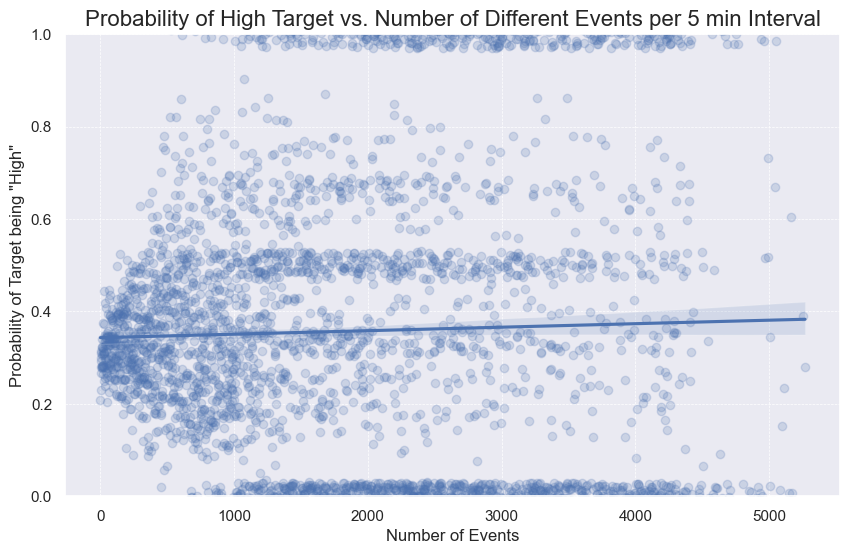

In [405]:
df_stat_nb_event = pd.concat([df_combined_condition.sum(axis=1), list_df[0]["target_cat"] == "high"], axis=1)
df_stat_nb_event.rename(columns={0: "nb_event"}, inplace=True)
# 1. Calculate the probability for each number of events
prob_df = df_stat_nb_event.groupby('nb_event')['target_cat'].mean().reset_index()
prob_df.rename(columns={'target_cat': 'probability_high'}, inplace=True)

""" # --- Seaborn Visualization ---
plt.figure(figsize=(12, 7))

# 2. Create the bar plot from the aggregated data
sns.scatterplot(x='nb_event', y='probability_high', data=prob_df, palette='viridis')

# --- Formatting the Plot ---
plt.title('Probability of High Target vs. Number of Concurrent Events', fontsize=16)
plt.xlabel('Number of Events', fontsize=12)
plt.ylabel('Probability of Target being "High"', fontsize=12)
plt.ylim(0, 1)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show() """

plt.figure(figsize=(10, 6))

# Use regplot with logistic=True to fit and plot a logistic regression model.
# y_jitter adds a small amount of vertical noise to the points for better visibility.
sns.regplot(x='nb_event', y='probability_high', data=prob_df,
            ci=95, # Show 95% confidence interval
            y_jitter=.03, # Add jitter to see density of points at 0 and 1
            scatter_kws={'alpha': 0.2}) # Make scatter points transparent

# --- Formatting the Plot ---
plt.title('Probability of High Target vs. Number of Different Events per 5 min Interval', fontsize=16)
plt.xlabel('Number of Events', fontsize=12)
plt.ylabel('Probability of Target being "High"', fontsize=12)
plt.ylim(0, 1) # Give a little space around the 0 and 1 lines
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.show()

=>
- Mean probability is increasing with number of different event per 5 min interval
- With a selection of Events with p_min = 0.4, we increase the mean prob by 0.03 (+3%) 

In [406]:
prob_df

,nb_event,probability_high
0,0,0.221975
1,1,0.256091
2,2,0.281207
3,3,0.250000
4,4,0.284761
...,...,...
3554,5149,0.000000
3555,5166,0.600000
3556,5172,0.000000
3557,5252,0.400000


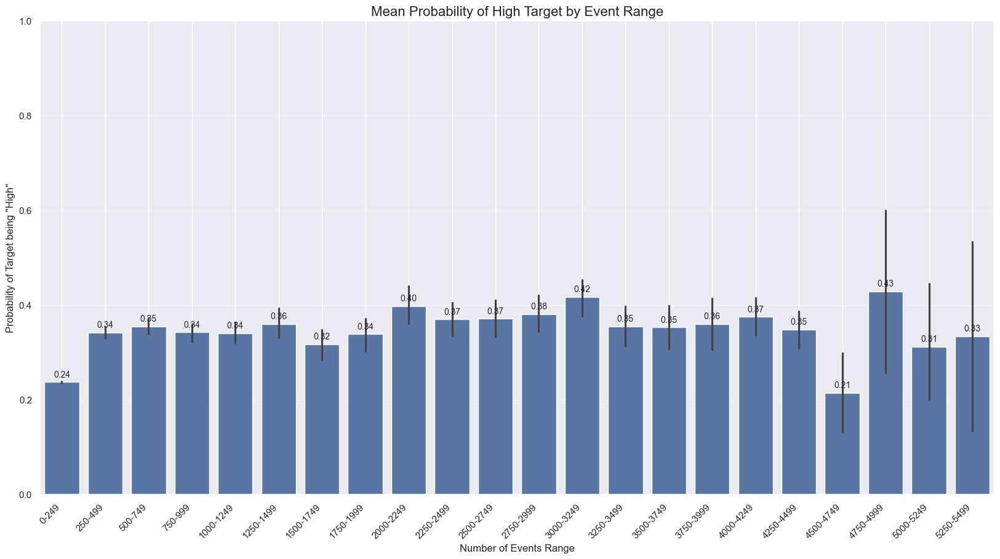

In [407]:
# 1. Define the bins for the number of events.
# We'll create bins of size 500, from 0 up to the maximum value.
max_events = df_stat_nb_event['nb_event'].max()
# Create bins like [0, 500, 1000, 1500, ...]
bins = np.arange(0, max_events + 250, 250)
# Create clear labels for the plot, like '0-499', '500-999', etc.
labels = [f'{int(bins[i])}-{int(bins[i+1]-1)}' for i in range(len(bins)-1)]


# 2. Use pandas.cut to segment the 'nb_event' column into these ranges.
df_stat_nb_event['event_range'] = pd.cut(df_stat_nb_event['nb_event'],
                                         bins=bins,
                                         labels=labels,
                                         right=False, # Makes intervals [0, 500), [500, 1000), etc.
                                         include_lowest=True) # Ensures 0 is included in the first bin

plt.figure(figsize=(20, 10))
ax = sns.barplot(data=df_stat_nb_event, y="target_cat", x="event_range")
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                fontsize=10,
                xytext=(0, 9),
                textcoords='offset points')
# --- Formatting the Plot ---
plt.title('Mean Probability of High Target by Event Range', fontsize=16)
plt.xlabel('Number of Events Range', fontsize=12)
plt.ylabel('Probability of Target being "High"', fontsize=12)
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', linewidth=0.5)
#plt.tight_layout() # Adjust plot to make sure labels don't get cut off
plt.xticks(rotation=45, ha='right')
ax = plt.gca()
ax.grid(True, 'both')
plt.show()

In [408]:
df_stat_nb_event

,nb_event,target_cat,event_range
date_ETH,,,
2023-01-01 00:00:00,0,False,0-249
2023-01-01 00:05:00,0,False,0-249
2023-01-01 00:10:00,0,False,0-249
2023-01-01 00:15:00,0,False,0-249
2023-01-01 00:20:00,0,False,0-249
...,...,...,...
2025-07-20 04:30:00,73,True,0-249
2025-07-20 04:35:00,73,True,0-249
2025-07-20 04:40:00,73,True,0-249


In [409]:
# nb_event for one day trade
list_df[0].shape[0]/(24*60/DT_PAST*1)


931.2083333333334

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/307806000.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


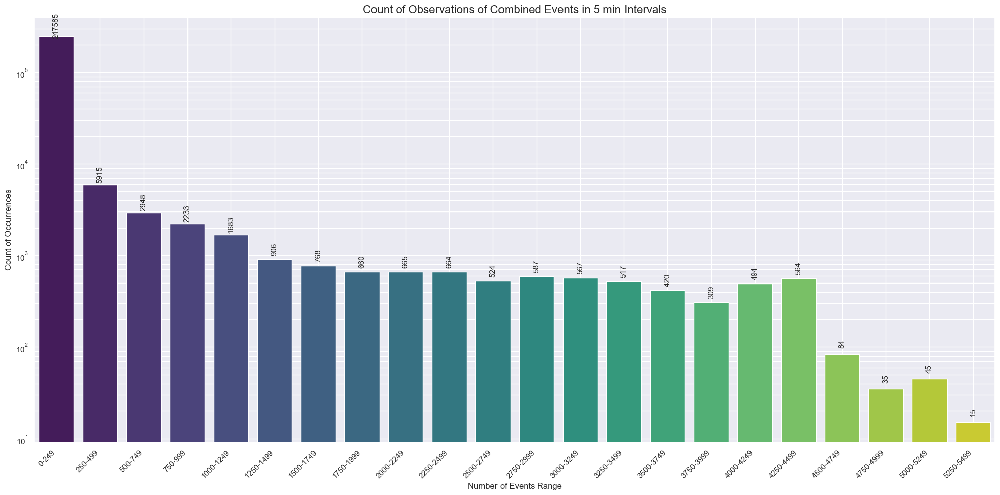

In [410]:
# --- Create the bar plot using seaborn.countplot ---
plt.figure(figsize=(20, 10))

# sns.countplot is the ideal function for this task.
# We use order to ensure the ranges are plotted in numerical order.
ax = sns.countplot(
    x='event_range',
    data=df_stat_nb_event,
    palette='viridis',
    order=labels # Use the generated labels to ensure correct sorting
)
ax.set_yscale('log')
# --- Add count labels on top of each bar for clarity ---
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                fontsize=11,
                xytext=(0, 15),
                rotation=90,
                textcoords='offset points')

# --- Formatting the Plot ---
plt.title('Count of Observations of Combined Events in 5 min Intervals', fontsize=16)
plt.xlabel('Number of Events Range', fontsize=12)
plt.ylabel('Count of Occurrences', fontsize=12)
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.tight_layout()
ax.grid(True, 'both')
plt.show()

with : nb_event_min = 8000 & prob_min = 0.4:
- Low or high number of events in time range of 5 min is very low represented so not useful : prob to happened is low
- Most represented : Around 5600-5800 events lead to 40+4% proba = 44% to be high

In [411]:
df_stat_nb_event

,nb_event,target_cat,event_range
date_ETH,,,
2023-01-01 00:00:00,0,False,0-249
2023-01-01 00:05:00,0,False,0-249
2023-01-01 00:10:00,0,False,0-249
2023-01-01 00:15:00,0,False,0-249
2023-01-01 00:20:00,0,False,0-249
...,...,...,...
2025-07-20 04:30:00,73,True,0-249
2025-07-20 04:35:00,73,True,0-249
2025-07-20 04:40:00,73,True,0-249


In [412]:
list_local_features = df_combined_condition.loc[
    df_stat_nb_event[
        (df_stat_nb_event["event_range"] == "800-999") &
        (df_stat_nb_event["target_cat"] == True)
    ].index.values
].sum(axis=0).sort_values(ascending=False).head(20)
print(list_local_features)
event_0 = list_local_features.index[0]

print(f"\nevent : {event_0}")
print(df_prob_comb_high_event.loc[event_0])
print('prob to appear : ', df_combined_condition[event_0].sum(axis=0) / df_combined_condition.shape[0])
print("nb events :", df_combined_condition[event_0].sum(axis=0))

event_1 = list_local_features.index[1]
print(f"\nevent : {event_1}")
print(df_prob_comb_high_event.loc[event_1])
print('prob to appear : ', df_combined_condition[event_1].sum(axis=0) / df_combined_condition.shape[0])
print("nb events :", df_combined_condition[event_1].sum(axis=0))

72       0
94124    0
95256    0
95216    0
95186    0
95158    0
95128    0
95099    0
95069    0
95039    0
95009    0
94979    0
94974    0
94968    0
94967    0
94961    0
94959    0
94707    0
94302    0
94296    0
dtype: int64

event : 72
high                                     1454
low                                      1124
neutral                                  1435
p_high                               0.362322
p_low                                 0.28009
delta_prob                          84.484096
feat_0                     max_high_3_ETH_cat
feat_0_cat                                low
lag_0                                      70
feat_1                     max_high_3_ETH_cat
feat_1_cat                                low
lag_1                                      71
feat_2                          rsi_2_BTC_cat
feat_2_cat                               high
lag_2                                      64
days_with_event                           170
weeks_with_event   

In [413]:
list_local_features.index.values

array([   72, 94124, 95256, 95216, 95186, 95158, 95128, 95099, 95069,
       95039, 95009, 94979, 94974, 94968, 94967, 94961, 94959, 94707,
       94302, 94296])

In [414]:
df_prob_comb_high_event.shape

(5712, 21)

In [415]:
df_prob_comb_high_event.loc[list_local_features.index.values].T

,72,94124,95256,95216,95186,95158,95128,95099,95069,95039,95009,94979,94974,94968,94967,94961,94959,94707,94302,94296
high,1454,2828,2448,1603,1304,1603,1304,1604,1305,1610,1310,2573,2608,2496,2311,1977,2379,2478,2781,2481
low,1124,2306,1949,1336,1150,1336,1150,1330,1142,1333,1145,2125,2145,2087,1780,1579,1953,1963,2170,2017
neutral,1435,2925,2588,1584,1244,1584,1244,1587,1247,1590,1249,2572,2601,2514,2434,1956,2414,2601,2979,2523
p_high,0.362322,0.350912,0.350465,0.354411,0.352623,0.354411,0.352623,0.354789,0.353276,0.355173,0.353672,0.35392,0.354637,0.351698,0.354176,0.358672,0.352653,0.351889,0.350694,0.353368
p_low,0.28009,0.28614,0.279026,0.295379,0.310979,0.295379,0.310979,0.294183,0.30915,0.294066,0.309125,0.292297,0.291678,0.294068,0.272797,0.286466,0.289505,0.278756,0.273644,0.287281
delta_prob,84.484096,106.148812,113.259495,48.512419,19.328443,48.512419,19.328443,51.176551,21.71557,52.143391,22.179226,85.442316,90.203661,73.000655,137.844537,89.091114,83.783934,119.443819,150.806302,95.729658
feat_0,max_high_3_ETH_cat,ichi_tenkan_1_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat,Open_ETH_cat
feat_0_cat,low,low,low,low,low,low,low,low,low,low,low,low,low,low,low,low,low,low,low,low
lag_0,70,68,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40,40
feat_1,max_high_3_ETH_cat,rsi_2_BTC_cat,rsi_1_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_kijun_3_ETH_cat,ichi_tenkan_1_ETH_cat,ichi_tenkan_1_ETH_cat,ichi_tenkan_1_ETH_cat,ichi_tenkan_1_ETH_cat,ichi_tenkan_1_ETH_cat,ichi_tenkan_1_ETH_cat,rsi_1_ETH_cat,min_low_2_ETH_cat,min_low_2_ETH_cat


### Per Day

In [416]:
global_event_by_day.describe()

count    932.000000
mean      64.912017
std       75.921244
min        0.000000
25%        1.000000
50%       35.000000
75%      104.000000
max      288.000000
dtype: float64

In [417]:
global_event_by_day.index.max()

Timestamp('2025-07-20 00:00:00')

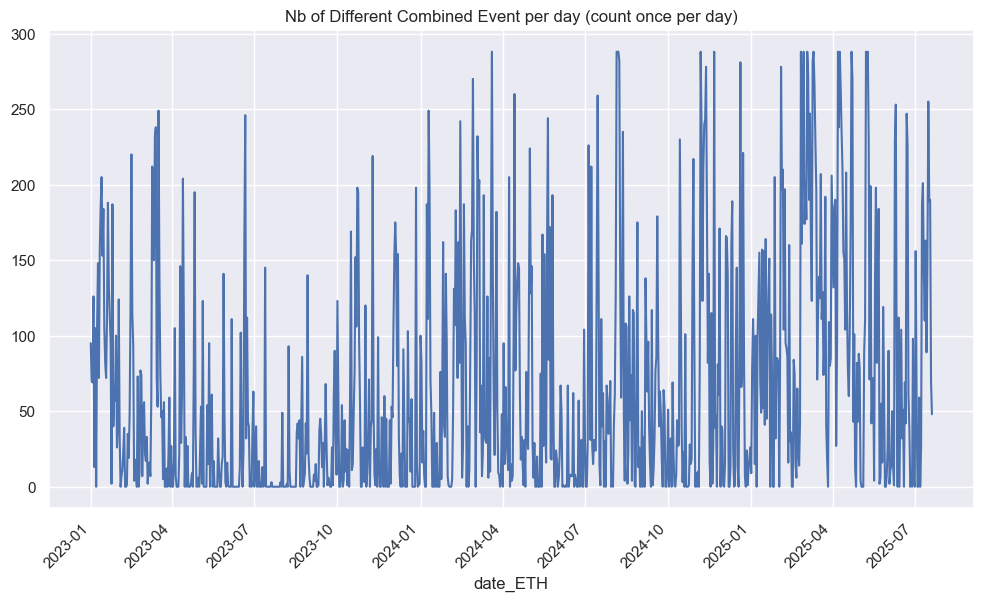

In [418]:
fig = plt.figure(figsize=(10, 6))

sns.lineplot(global_event_by_day, markers="o")
# change x axis ticker format at 45°
# Rotate the x-axis tick labels to 45 degrees.
# Using ha='right' aligns the end of the label with the tick, which often looks better.
plt.xticks(rotation=45, ha='right')

# Adjust plot to make sure labels don't get cut off
plt.tight_layout()

# title
plt.title("Nb of Different Combined Event per day (count once per day)")
# Display the plot
plt.show()

Text(0.5, 1.0, 'Distribution of Number of Events per Day')

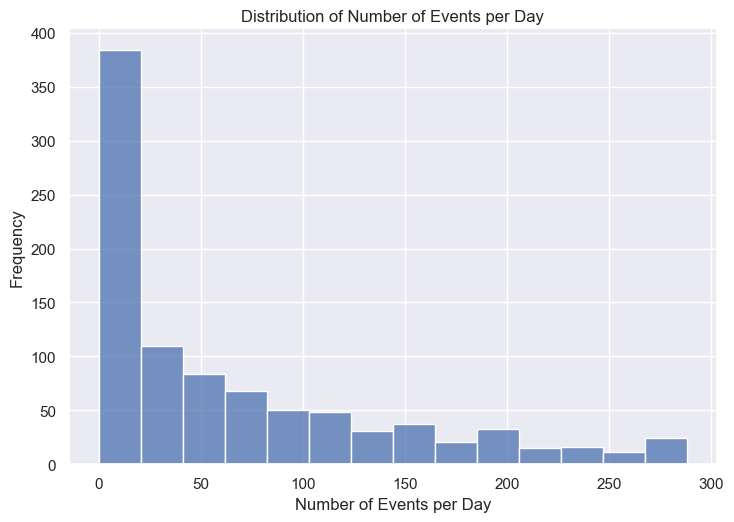

In [419]:

sns.displot(global_event_by_day, height=5, aspect=1.5)
fig = plt.gcf()
ax = fig.gca()
ax.set_xlabel("Number of Events per Day")
ax.set_ylabel("Frequency")
plt.title("Distribution of Number of Events per Day")

In [420]:
df_prob_comb_high_event

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
72,1454,1124,1435,0.362322,0.280090,84.484096,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,64,170,76,30,0.182403,0.567164,0.967742
74,1166,891,1104,0.368871,0.281873,73.529412,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,40,136,62,29,0.145923,0.462687,0.935484
77,2691,2339,2638,0.350939,0.305034,49.266004,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,min_low_2_ETH_cat,low,56,434,128,31,0.465665,0.955224,1.000000
81,1570,1220,1523,0.364016,0.282866,87.813620,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,68,186,79,30,0.199571,0.589552,0.967742
87,1683,1307,1629,0.364365,0.282962,94.565886,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,71,197,83,30,0.211373,0.619403,0.967742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161157,2355,1923,2372,0.354135,0.289173,87.248247,ichi_kijun_ETH_cat,low,56,rsi_1_BTC_cat,...,64,rsi_2_BTC_cat,high,70,197,89,30,0.211373,0.664179,0.967742
161176,1797,1462,1797,0.355419,0.289161,68.870819,ichi_kijun_ETH_cat,low,56,rsi_2_BTC_cat,...,71,rsi_1_ETH_cat,high,56,160,80,30,0.171674,0.597015,0.967742
161180,2488,2027,2516,0.353861,0.288295,94.139978,ichi_kijun_ETH_cat,low,56,rsi_2_BTC_cat,...,71,rsi_1_BTC_cat,high,68,207,91,30,0.222103,0.679104,0.967742
161202,1789,1459,1788,0.355242,0.289714,67.056650,ichi_kijun_ETH_cat,low,56,rsi_1_ETH_cat,...,56,rsi_2_BTC_cat,high,70,160,79,30,0.171674,0.589552,0.967742


In [421]:
list_df[0]

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real_cat,impact_index_ETH_cat,impact_index_ema_1h_ETH_cat,impact_index_ema_4h_ETH_cat,impact_index_ema_24h_ETH_cat,impact_index_BTC_cat,impact_index_ema_1h_BTC_cat,impact_index_ema_4h_BTC_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat
date_ETH,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,1.0,0.999782,1.000109,0.999774,0.999171,0.999736,0.998393,0.999464,2.180438,2.176148,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:05:00,1.0,0.999548,1.000008,0.999540,0.998785,0.999276,0.998113,0.999184,2.179435,2.175147,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:10:00,1.0,1.000084,1.000193,0.999841,0.998860,0.999351,0.998243,0.999477,2.179599,2.175311,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:15:00,1.0,1.000770,1.000770,0.999900,0.999669,1.000113,0.999003,1.000239,2.181260,2.176969,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:20:00,1.0,0.999330,1.000025,0.999330,0.999178,0.999443,0.998335,0.999569,2.179799,2.175511,...,neutral,neutral,low,low,low,neutral,low,low,low,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-20 04:30:00,1.0,1.000300,1.001526,0.999087,0.991569,0.989072,1.000620,1.001795,0.963267,0.946999,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
2025-07-20 04:35:00,1.0,0.999746,1.000370,0.999198,0.991601,0.988821,1.000366,1.001541,0.963022,0.946759,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
2025-07-20 04:40:00,1.0,1.000451,1.000916,0.999241,0.992160,0.989378,1.000839,1.001990,0.963454,0.947184,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high


In [422]:
df_combined_condition

,72,74,77,81,87,92,169,171,174,178,...,160895,161006,161011,161015,161152,161157,161176,161180,161202,161215
date_ETH,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2023-01-01 00:05:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2023-01-01 00:10:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2023-01-01 00:15:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2023-01-01 00:20:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-20 04:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 04:35:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 04:40:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [423]:
df_prob_comb_high_event.sort_values(by=["p_high"], ascending=False).head(20)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
23014,1524,1036,1425,0.382434,0.259975,186.050000,max_high_3_ETH_cat,low,56,rsi_2_BTC_cat,...,40,rsi_1_BTC_cat,high,40,123,63,29,0.131974,0.470149,0.935484
141442,1074,822,919,0.381528,0.292007,66.987342,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,51,25,17,0.054721,0.186567,0.548387
145862,962,751,809,0.381443,0.297780,51.980152,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,49,25,17,0.052575,0.186567,0.548387
153987,970,749,828,0.380840,0.294071,56.824898,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,64,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
154197,965,746,823,0.380821,0.294396,56.061952,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,68,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
141441,1071,825,920,0.380327,0.292969,63.835443,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,52,25,17,0.055794,0.186567,0.548387
154170,959,744,819,0.380254,0.295004,54.286553,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,70,rsi_1_ETH_cat,high,56,47,24,17,0.050429,0.179104,0.548387
141435,1063,815,919,0.380050,0.291384,65.499468,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,51,25,17,0.054721,0.186567,0.548387
145861,952,750,804,0.379888,0.299282,47.948296,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,50,25,17,0.053648,0.186567,0.548387
145855,949,746,804,0.379752,0.298519,48.624189,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,49,25,17,0.052575,0.186567,0.548387


In [424]:
df_prob_comb_high_event.high.describe()

count    5712.000000
mean     1955.600665
std       642.200566
min       932.000000
25%      1408.000000
50%      1915.000000
75%      2464.000000
max      4136.000000
Name: high, dtype: float64

## ML Models on 3-events-comb

### Find ML model to improve prob

In [425]:
# X train : df_combined_condition train
# X test: df_combined_condition_test

# Y train : high trade or not
y_comb = (list_df[0]["target_cat"] == "high")
# Y test 
y_comb_test = df_targets_test["target_cat"] == "high"

#### RandomForest : Cross-Validation

In [426]:
# train time : 133min 
# param_dist = {
#     "max_depth": [3, None],
#     "max_features": randint(1, 6),
#     "min_samples_split": randint(2, 11),
#     "bootstrap": [True, False],
#     "criterion": ["gini", "entropy"],
# }

# train time 255 min
# param_dist = {
#     "max_depth": randint(2, 5),
#     "max_features": randint(8, 12),
#     "min_samples_split": randint(8, 12),
# }

In [427]:
df_combined_condition.shape

(268188, 5712)

In [428]:
        # random_state=42,
        # n_jobs=-1,
        # #criterion="entropy",
        # max_features=9,#"sqrt", # "sqrt", # default
        # max_samples=0.6,
        # min_samples_split=11,
        # n_estimators=100,
        # max_depth=4,
        # class_weight={True: 1.841, False: 1},#"balanced"

In [429]:
df_combined_condition_test

,72,74,77,81,87,92,169,171,174,178,...,160895,161006,161011,161015,161152,161157,161176,161180,161202,161215
date_ETH,,,,,,,,,,,,,,,,,,,,,
2025-07-20 12:10:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:15:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:20:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:25:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-10-31 16:25:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-10-31 16:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-10-31 16:35:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [430]:
y_comb

date_ETH
2023-01-01 00:00:00    False
2023-01-01 00:05:00    False
2023-01-01 00:10:00    False
2023-01-01 00:15:00    False
2023-01-01 00:20:00    False
                       ...  
2025-07-20 04:30:00     True
2025-07-20 04:35:00     True
2025-07-20 04:40:00     True
2025-07-20 04:45:00     True
2025-07-20 04:50:00     True
Name: target_cat, Length: 268188, dtype: bool

In [431]:
from scipy.stats import uniform
uniform(loc=4, scale=8-4).rvs(10)

array([6.40470317, 7.18584988, 7.21185726, 5.1490892 , 4.42958455,
       6.43454559, 6.83993213, 5.87484953, 5.21189014, 5.8572577 ])

In [432]:
randint(7, 11).rvs(10)

array([ 9,  9,  8,  9,  7,  9,  9,  7, 10,  9])

In [433]:
1000*2**8

256000

In [434]:
2**8

256

In [435]:
(2**(8-4))

16

In [ ]:
mode_cv_rf = True

if mode_cv_rf: # 467min !

    #rng = np.random.RandomState(42)
    
    tscv = TimeSeriesSplit(n_splits=5)

    for i, (train_index, test_index) in enumerate(tscv.split(df_combined_condition)):
        print(f"Fold {i}:")
        print(f"  Train: index={train_index}")
        print(f"  Test:  index={test_index}")


    rf = RandomForestClassifier(
        random_state=42,
        n_jobs=-1,
        #criterion="entropy",
        max_features="sqrt",#"sqrt", # "sqrt", # default
        #max_samples=0.6,
        #min_samples_split=10,
        n_estimators=100,
        #max_depth=3,
        class_weight="balanced"
        #oob_score=precision_score,
    )
    
    param_dist = {
        "max_samples": uniform(loc=0.5, scale=0.8-0.5),
        "max_depth": randint(1, 3),
        #"max_features": randint(7, 11),
        "min_samples_split": randint(80, 800),
    }

    rsh = HalvingRandomSearchCV(
        estimator=rf,
        random_state=42,
        n_jobs=-1,
        cv=tscv,
        factor=2,
        param_distributions=param_dist, 
        scoring="precision",
        min_resources=500,
    )

    rsh.fit(df_combined_condition, y_comb)

    # save 

    rsh_rf_prob_filename = os.path.join(path_data, 'rsh_rf_prob_model.joblib')
    joblib.dump(rsh, rsh_rf_prob_filename)

else:
    # load
    rsh_rf_prob_filename = os.path.join(path_data, 'rsh_rf_prob_model.joblib')
    rsh = joblib.load(rsh_rf_prob_filename)
    rsh


In [737]:
rsh.best_params_

{'max_depth': 2,
 'max_samples': np.float64(0.7719063155284208),
 'min_samples_split': 118}

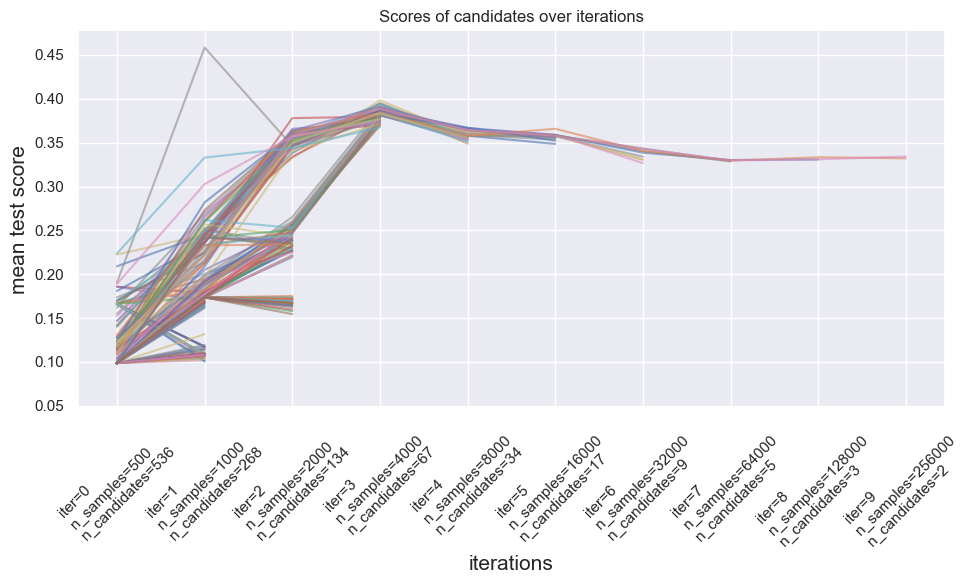

In [738]:
results = pd.DataFrame(rsh.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={rsh.n_resources_[i]}\nn_candidates={rsh.n_candidates_[i]}"
    for i in range(rsh.n_iterations_)
]

ax.set_xticks(range(rsh.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("Scores of candidates over iterations")
ax.set_ylabel("mean test score", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
plt.gcf().set_size_inches((10, 6))
plt.tight_layout()
plt.show()

In [739]:
rf_model = rsh.best_estimator_

In [741]:
rf_model.get_params()["max_depth"]

2

In [742]:
rf_model.get_params()["max_features"]

'sqrt'

In [743]:
rf_model.get_params()["max_samples"]

np.float64(0.7719063155284208)

In [744]:
rf_model.get_params()["min_samples_split"]

118

Model trained.
on Train data : 
Accuracy on training data: 0.7112286903217147
precision: 0.346
% possible trades : 14.05
nb trade per day : 40
on Test data : 
Accuracy on test data: 0.6738559892328398
precision: 0.313
% possible trades : 12.409
nb trade per day : 35.738


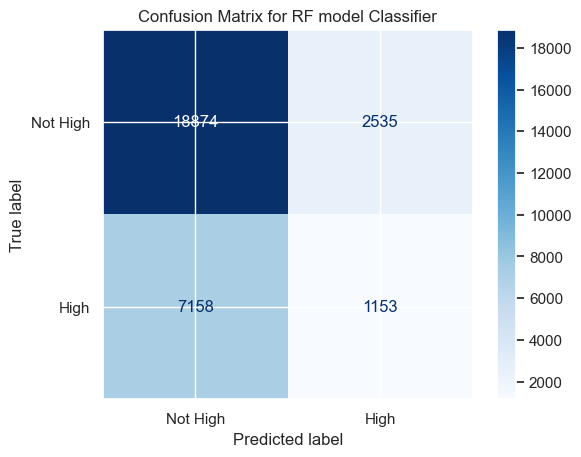

In [740]:
rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=100,
    max_depth=rf_model.get_params()["max_depth"],
    max_features=rf_model.get_params()["max_features"],
    max_samples=rf_model.get_params()["max_samples"],
    min_samples_split=rf_model.get_params()["min_samples_split"],
    class_weight="balanced",
)
rf.fit(df_combined_condition, y_comb)
print("Model trained.")
arr_mdl_pred_train = rf.predict(df_combined_condition)
print("on Train data : ")
print("Accuracy on training data:", rf.score(df_combined_condition, y_comb))
print(f"precision: {precision_score(y_comb, arr_mdl_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred_train) / arr_mdl_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]:.0f}")
arr_mdl_pred = rf.predict(df_combined_condition_test)
print("on Test data : ")
print("Accuracy on test data:", rf.score(df_combined_condition_test, y_comb_test))
print(f"precision: {precision_score(y_comb_test, arr_mdl_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred) / arr_mdl_pred.shape[0]:.3f}")
print(f"nb trade per day : {288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]:.3f}")
cm = confusion_matrix(y_comb_test, arr_mdl_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RF model Classifier")
plt.show()


In [745]:
results[results["iter"].max() == results["iter"]].filter(
    items=['split0_test_score', 'split1_test_score', 'split2_test_score',
       'split3_test_score', 'split4_test_score', 'mean_test_score',
       'std_test_score', 'rank_test_score', 'split0_train_score',
       'split1_train_score', 'split2_train_score', 'split3_train_score',
       'split4_train_score', 'mean_train_score', 'std_train_score',
       'params_str'] )

,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score,params_str
1073,0.319765,0.322051,0.331673,0.344144,0.353696,0.334266,0.012972,172,0.354065,0.348305,0.337594,0.343518,0.340422,0.344781,0.005846,"{'max_depth': 2, 'max_samples': np.float64(0.7..."
1074,0.319034,0.319348,0.325902,0.343140,0.353510,0.332187,0.013798,178,0.351556,0.342439,0.337512,0.344265,0.339584,0.343071,0.004835,"{'max_depth': 2, 'max_samples': np.float64(0.6..."



Feature Importances (most predictive individual events):
66185     0.019286
29341     0.014989
129267    0.013893
31637     0.013688
156898    0.013288
            ...   
36468     0.000000
36463     0.000000
36457     0.000000
36450     0.000000
161215    0.000000
Length: 5712, dtype: float64


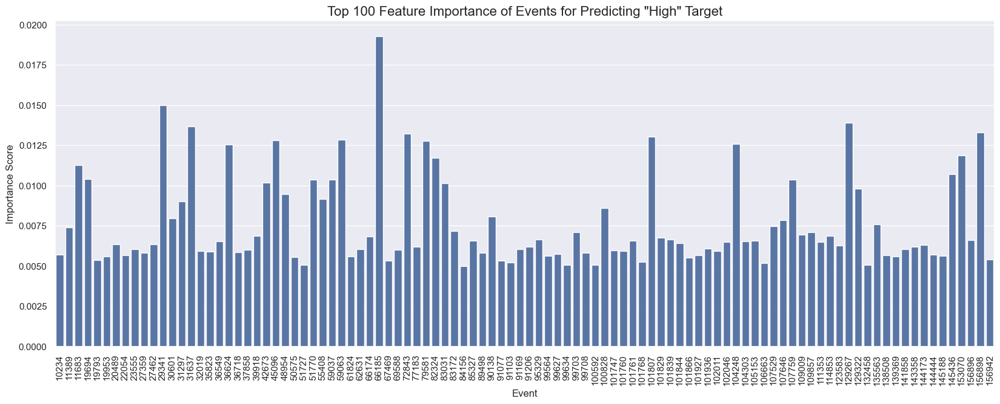

In [746]:

# Get and plot feature importances
importances = pd.Series(rf_model.feature_importances_, index=df_combined_condition.columns).sort_values(ascending=False)
print("\nFeature Importances (most predictive individual events):")
print(importances)
# Plot the importances of the top 100 features
plt.figure(figsize=(20, 7))
sns.barplot(y=importances.head(100).values, x=importances.head(100).index)
plt.title('Top 100 Feature Importance of Events for Predicting "High" Target', fontsize=16)
plt.ylabel('Importance Score', fontsize=12)
plt.xlabel('Event', fontsize=12)
plt.xticks(rotation=90, ha='center')
plt.show()

In [747]:
df_prob_comb_high_event.loc[importances.head(4).index.values].T

,66185,29341,129267,31637
high,3609,3845,2958,3630
low,2948,3277,2522,2944
neutral,3739,3849,2955,3736
p_high,0.350524,0.350469,0.350682,0.352085
p_low,0.286325,0.298697,0.298992,0.285548
delta_prob,133.268568,90.59927,69.378102,143.168847
feat_0,ichi_tenkan_ETH_cat,vwap_4h_ETH_cat,ichi_kijun_3_ETH_cat,vwap_4h_ETH_cat
feat_0_cat,low,low,high,low
lag_0,8,8,70,8
feat_1,rsi_1_BTC_cat,min_low_2_ETH_cat,ichi_kijun_3_ETH_cat,rsi_1_BTC_cat


In [748]:
# OLD df_prob_comb : 
# TRAIN accurracy: 0.696
# TRAIN precision: 0.332
# TEST accurracy: 0.634
# TEST precision: 0.298

arr_mdl_pred = rf_model.predict(df_combined_condition)
arr_mdl_pred_test = rf_model.predict(df_combined_condition_test)
print(f"TRAIN accurracy: {rf_model.score(df_combined_condition, y_comb):.3f}") 
print(f"TRAIN precision: {precision_score(y_comb, arr_mdl_pred):.3f}") 
print(f"TEST accurracy: {rf_model.score(df_combined_condition_test, y_comb_test):.3f}") 
print(f"TEST precision: {precision_score(y_comb_test, arr_mdl_pred_test):.3f}")

TRAIN accurracy: 0.711
TRAIN precision: 0.346
TEST accurracy: 0.674
TEST precision: 0.313


In [469]:
if mode_cv_rf:
# find best class weight
    res_df_0 = pd.DataFrame(columns=["weight_high","precision train"])
    for i, weight_high in enumerate(np.arange(1.690, 2.500, 0.005)):
        rf = RandomForestClassifier(
            random_state=42,
            n_jobs=-1,
            n_estimators=100,
            max_depth=rf_model.get_params()["max_depth"],
            max_features=rf_model.get_params()["max_features"],
            max_samples=rf_model.get_params()["max_samples"],
            min_samples_split=rf_model.get_params()["min_samples_split"],
            class_weight={True: weight_high, False: 1},
        )
        rf.fit(df_combined_condition, y_comb)
        arr_mdl_pred_train = rf.predict(df_combined_condition)
        arr_mdl_pred = rf.predict(df_combined_condition_test)
        res_df_0.loc[i, "weight_high"] = weight_high
        res_df_0.loc[i, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
        res_df_0.loc[i, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
        res_df_0.loc[i, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
        res_df_0.loc[i, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
    # save res_df_0
    res_df_0.to_csv(os.path.join(path_data, "res_df_0.csv"), index=False)
else:
    res_df_0 = pd.read_csv(os.path.join(path_data, "res_df_0.csv"))

In [444]:
# if mode_cv_rf:
#     i_start = res_df_0.shape[0]
#     for i, weight_high in enumerate(np.arange(1.790, 1.834, 0.001)):#for class_ weight_true in range(1.7, 2, 0.01):
#         rf = RandomForestClassifier(
#             random_state=42,
#             n_jobs=-1,
#             max_depth=5,
#             max_features=10,
#             max_samples=0.7,
#             min_samples_split=12,
#             n_estimators=100,
#             class_weight={True: weight_high, False: 1},
#         )
#         rf.fit(df_combined_condition, y_comb)
#         arr_mdl_pred_train = rf.predict(df_combined_condition)
#         arr_mdl_pred = rf.predict(df_combined_condition_test)
#         idx = i_start + i
#         res_df_0.loc[idx, "weight_high"] = weight_high
#         res_df_0.loc[idx, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
#         res_df_0.loc[idx, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
#         res_df_0.loc[idx, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
#         res_df_0.loc[idx, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
#     res_df_0.sort_values(by="weight_high", inplace=True)
#     # save res_df_0
#     res_df_0.to_csv(os.path.join(path_data, "res_df_0.csv"), index=False)

In [445]:
# if mode_cv_rf:
#     i_start = res_df_0.shape[0]
#     for i, weight_high in enumerate(np.arange(1.700, 1.785, 0.005)):#for class_ weight_true in range(1.7, 2, 0.01):
#         rf = RandomForestClassifier(
#             random_state=42,
#             n_jobs=-1,
#             max_depth=5,
#             max_features=10,
#             max_samples=0.7,
#             min_samples_split=12,
#             n_estimators=100,
#             class_weight={True: weight_high, False: 1},
#         )
#         rf.fit(df_combined_condition, y_comb)
#         arr_mdl_pred_train = rf.predict(df_combined_condition)
#         arr_mdl_pred = rf.predict(df_combined_condition_test)
#         idx = i_start + i
#         res_df_0.loc[idx, "weight_high"] = weight_high
#         res_df_0.loc[idx, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
#         res_df_0.loc[idx, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
#         res_df_0.loc[idx, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
#         res_df_0.loc[idx, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
#     res_df_0.sort_values(by="weight_high", inplace=True)
#     # save res_df_0
#     res_df_0.to_csv(os.path.join(path_data, "res_df_0.csv"), index=False)

In [446]:
# if mode_cv_rf:
#     i_start = res_df_0.shape[0]
#     for i, weight_high in enumerate(np.arange(1.86, 1.9, 0.005)):#for class_ weight_true in range(1.7, 2, 0.01):
#         rf = RandomForestClassifier(
#             random_state=42,
#             n_jobs=-1,
#             max_depth=5,
#             max_features=10,
#             max_samples=0.7,
#             min_samples_split=12,
#             n_estimators=100,
#             class_weight={True: weight_high, False: 1},
#         )
#         rf.fit(df_combined_condition, y_comb)
#         arr_mdl_pred_train = rf.predict(df_combined_condition)
#         arr_mdl_pred = rf.predict(df_combined_condition_test)
#         idx = i_start + i
#         res_df_0.loc[idx, "weight_high"] = weight_high
#         res_df_0.loc[idx, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
#         res_df_0.loc[idx, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
#         res_df_0.loc[idx, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
#         res_df_0.loc[idx, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
#     res_df_0.sort_values(by="weight_high", inplace=True)
#     # save res_df_0
#     res_df_0.to_csv(os.path.join(path_data, "res_df_0.csv"), index=False)

In [470]:
res_df_0

,weight_high,precision train,nb trades per day train,precision test,nb trades per day test
0,1.69,0.475032,0.838695,0.333333,0.058143
1,1.695,0.472661,0.883798,0.333333,0.058143
2,1.7,0.465831,0.942861,0.428571,0.067833
3,1.705,0.461059,1.034140,0.500000,0.077524
4,1.71,0.46146,1.058839,0.500000,0.077524
...,...,...,...,...,...
157,2.475,0.357966,13.979686,0.309331,9.554778
158,2.48,0.358135,14.072039,0.310415,9.583849
159,2.485,0.358516,14.185870,0.309237,9.651682
160,2.49,0.358755,14.278223,0.310000,9.690444


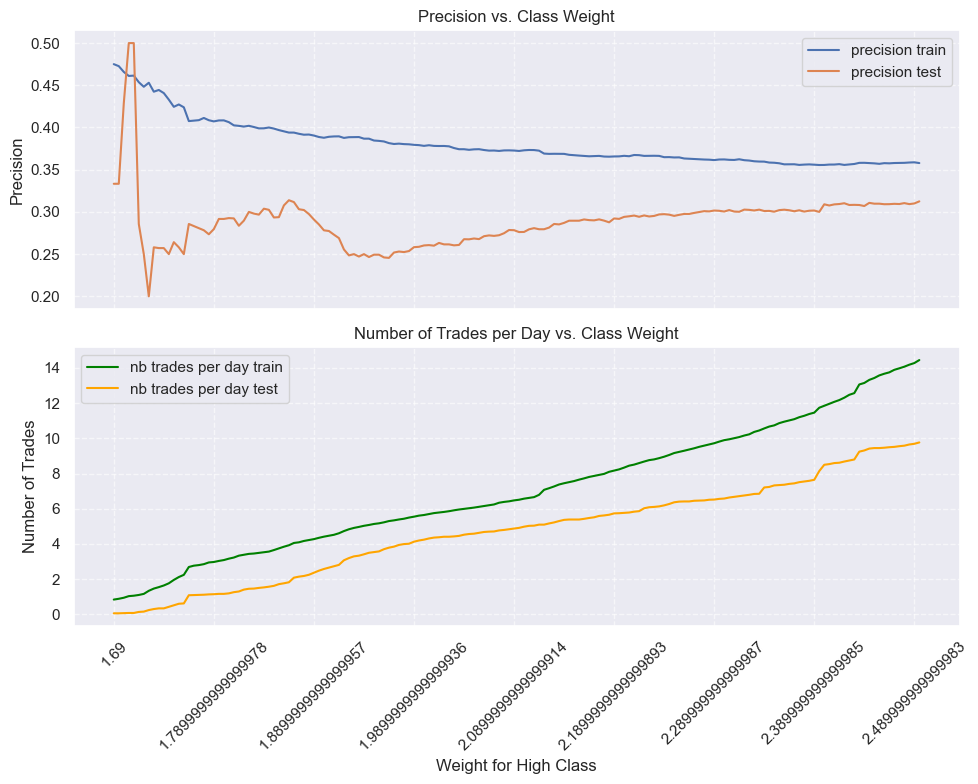

In [471]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)
# --- First Subplot: Precision ---
res_df_0.plot(x="weight_high", y=["precision train", "precision test"], kind="line", ax=axes[0])
axes[0].set_title("Precision vs. Class Weight")
axes[0].set_ylabel("Precision")
axes[0].grid(True, linestyle='--', alpha=0.6)
# --- Second Subplot: Number of Trades ---
res_df_0.plot(x="weight_high", y=["nb trades per day train", "nb trades per day test"], kind="line", ax=axes[1], color=['green', 'orange'])
axes[1].set_title("Number of Trades per Day vs. Class Weight")
axes[1].set_ylabel("Number of Trades")
axes[1].set_xlabel("Weight for High Class")
axes[1].grid(True, linestyle='--', alpha=0.6)
# Rotate the x-axis labels on the bottom plot for better readability
plt.xticks(rotation=45, ha='center')
# Adjust layout to prevent labels from overlapping
plt.tight_layout()
plt.show()

In [472]:
res_df_0[res_df_0["precision test"] == res_df_0["precision test"].max()]

,weight_high,precision train,nb trades per day train,precision test,nb trades per day test
3,1.705,0.461059,1.034140,0.5,0.077524
4,1.71,0.46146,1.058839,0.5,0.077524


In [473]:
weight_high = res_df_0.loc[res_df_0["precision test"] == res_df_0["precision test"].max(),"weight_high"].values[0]

In [474]:
weight_high

np.float64(1.7049999999999996)

Model trained.
on Train data : 
Accuracy on training data: 0.7542693931122944
precision: 0.461
% possible trades : 0.36
nb trade per day : 1
on Test data : 
Accuracy on test data: 0.7203566621803499
precision: 0.500
% possible trades : 0.027
nb trade per day : 0.078


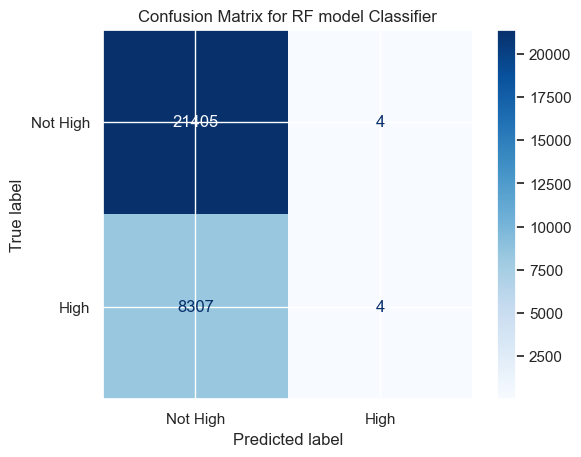

In [519]:
rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=100,
    max_depth=rf_model.get_params()["max_depth"],
    max_features=rf_model.get_params()["max_features"],
    max_samples=rf_model.get_params()["max_samples"],
    min_samples_split=rf_model.get_params()["min_samples_split"],
    class_weight={True: weight_high, False: 1},
)
rf.fit(df_combined_condition, y_comb)
print("Model trained.")
arr_mdl_pred_train = rf.predict(df_combined_condition)
print("on Train data : ")
print("Accuracy on training data:", rf.score(df_combined_condition, y_comb))
print(f"precision: {precision_score(y_comb, arr_mdl_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred_train) / arr_mdl_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]:.0f}")
arr_mdl_pred = rf.predict(df_combined_condition_test)
print("on Test data : ")
print("Accuracy on test data:", rf.score(df_combined_condition_test, y_comb_test))
print(f"precision: {precision_score(y_comb_test, arr_mdl_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred) / arr_mdl_pred.shape[0]:.3f}")
print(f"nb trade per day : {288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]:.3f}")
cm = confusion_matrix(y_comb_test, arr_mdl_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RF model Classifier")
plt.show()


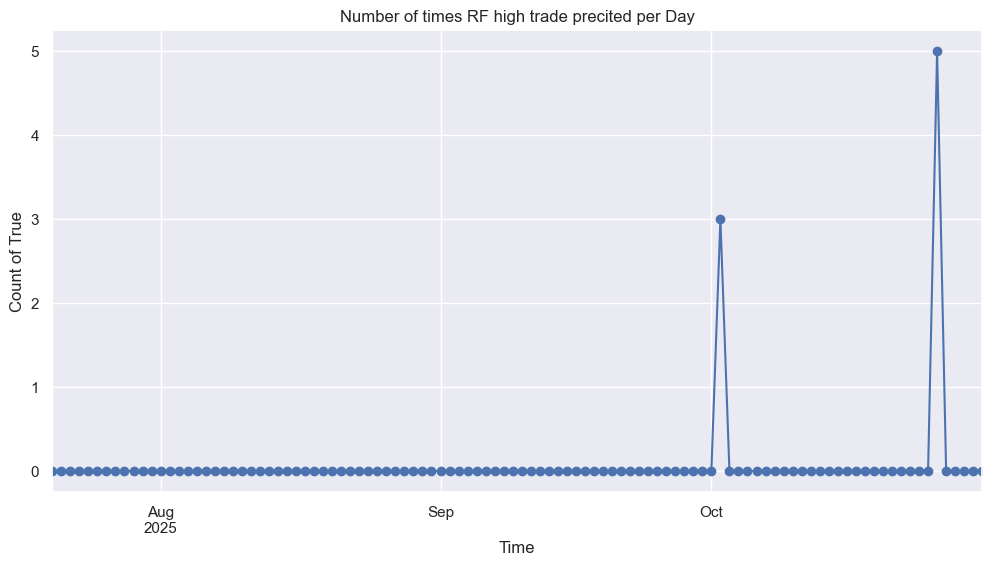

In [497]:
ser_rf_pred = pd.Series(arr_mdl_pred, index=df_combined_condition_test.index)
ser_rf_pred.resample("D").sum().plot(figsize=(12, 6), marker="o")
plt.title("Number of times RF high trade precited per Day")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)

In [532]:
(100-24.5)/24.5

3.0816326530612246

In [535]:
np.bincount(y_comb)

array([202361,  65827])

In [537]:
y_comb.shape[0] / (2*np.bincount(y_comb))

array([0.66264745, 2.03706686])

In [538]:
2/0.66

3.0303030303030303

Model trained.
on Train data : 
Accuracy on training data: 0.7202149238593822
precision: 0.352
% possible trades : 11.58
nb trade per day : 33
on Test data : 
Accuracy on test data: 0.6867429340511441
precision: 0.316
% possible trades : 9.115
nb trade per day : 26.251


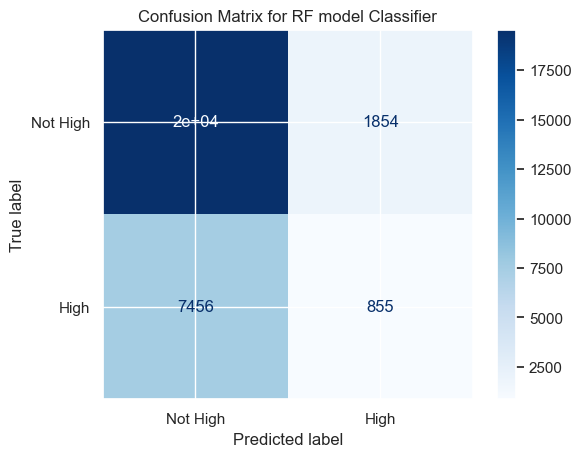

In [552]:
rf = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    n_estimators=100,
    max_depth=rf_model.get_params()["max_depth"],
    max_features=rf_model.get_params()["max_features"],
    max_samples=rf_model.get_params()["max_samples"],
    min_samples_split=rf_model.get_params()["min_samples_split"],
    class_weight={True: 3, False: 1},
)
rf.fit(df_combined_condition, y_comb)
print("Model trained.")
arr_mdl_pred_train = rf.predict(df_combined_condition)
print("on Train data : ")
print("Accuracy on training data:", rf.score(df_combined_condition, y_comb))
print(f"precision: {precision_score(y_comb, arr_mdl_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred_train) / arr_mdl_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]:.0f}")
arr_mdl_pred = rf.predict(df_combined_condition_test)
print("on Test data : ")
print("Accuracy on test data:", rf.score(df_combined_condition_test, y_comb_test))
print(f"precision: {precision_score(y_comb_test, arr_mdl_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred) / arr_mdl_pred.shape[0]:.3f}")
print(f"nb trade per day : {288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]:.3f}")
cm = confusion_matrix(y_comb_test, arr_mdl_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RF model Classifier")
plt.show()


on Train data : 
Accuracy on training data: 0.7272323892195027
precision: 0.355
% possible trades : 9.41
nb trade per day : 27.11
on Test data : 
Accuracy on test data: 0.6943808882907133
precision: 0.327
% possible trades : 7.51
nb trade per day : 21.63


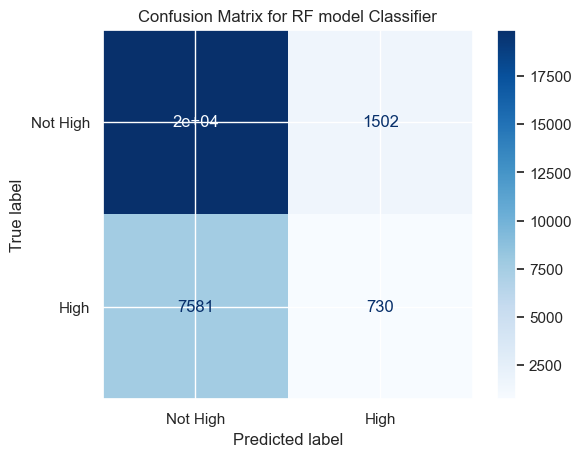

In [556]:
rf_prob_min = 0.51
arr_rf_prob_pred_train = rf.predict_proba(df_combined_condition)[:, 1] > rf_prob_min
arr_rf_prob_pred_test = rf.predict_proba(df_combined_condition_test)[:, 1] > rf_prob_min

print("on Train data : ")
print("Accuracy on training data:", accuracy_score(y_comb, arr_rf_prob_pred_train))
print(f"precision: {precision_score(y_comb, arr_rf_prob_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_rf_prob_pred_train) / arr_rf_prob_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_rf_prob_pred_train.sum() / arr_rf_prob_pred_train.shape[0]:.2f}")

print("on Test data : ")
print("Accuracy on test data:", accuracy_score(y_comb_test, arr_rf_prob_pred_test))
print(f"precision: {precision_score(y_comb_test, arr_rf_prob_pred_test):.3f}")
print(f"% possible trades : {100*np.sum(arr_rf_prob_pred_test) / arr_rf_prob_pred_test.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_rf_prob_pred_test.sum() / arr_rf_prob_pred_test.shape[0]:.2f}")

cm = confusion_matrix(y_comb_test, arr_rf_prob_pred_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RF model Classifier")
plt.show()

In [ ]:
# if mode_cv_rf:
#     # find best class weight
#     res_df = pd.DataFrame(columns=["weight_high","precision train"])
#     for i, weight_high in enumerate(np.arange(1.84, 1.88, 0.001)):#for class_ weight_true in range(1.7, 2, 0.01):
#         #for j in range(1, 10):
#         rf = RandomForestClassifier(
#             random_state=42,
#             n_jobs=-1,
#             max_depth=4,
#             max_features=9,
#             max_samples=0.6,
#             min_samples_split=11,
#             n_estimators=100,
#             class_weight={True: weight_high, False: 1},#"balanced",
#             #oob_score=precision_score,
#         )
#         rf.fit(df_combined_condition, y_comb)
#         arr_mdl_pred_train = rf.predict(df_combined_condition)
#         arr_mdl_pred = rf.predict(df_combined_condition_test)
#         res_df.loc[i, "weight_high"] = weight_high
#         res_df.loc[i, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
#         res_df.loc[i, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
#         res_df.loc[i, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
#         res_df.loc[i, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
#     res_df.to_csv(os.path.join(path_data, "res_df.csv"))
# else:
#     res_df = pd.read_csv(os.path.join(path_data, "res_df.csv"))



In [ ]:
# if mode_cv_rf:
#     i_start = res_df.shape[0]
#     for i, weight_high in enumerate(np.arange(1.881, 1.900, 0.001)):#for class_ weight_true in range(1.7, 2, 0.01):
#         #for j in range(1, 10):
#         rf = RandomForestClassifier(
#             random_state=42,
#             n_jobs=-1,
#             #criterion="entropy",
#             max_features=9,#"sqrt", # "sqrt", # default
#             max_samples=0.6,
#             min_samples_split=11,
#             n_estimators=100,
#             max_depth=4,
#             class_weight={True: weight_high, False: 1},#"balanced",
#             #oob_score=precision_score,
#         )
#         rf.fit(df_combined_condition, y_comb)
#         arr_mdl_pred_train = rf.predict(df_combined_condition)
#         arr_mdl_pred = rf.predict(df_combined_condition_test)
#         idx = i_start + i
#         res_df.loc[idx, "weight_high"] = weight_high
#         res_df.loc[idx, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
#         res_df.loc[idx, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
#         res_df.loc[idx, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
#         res_df.loc[idx, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
#     res_df.sort_values(by="weight_high", inplace=True)

In [ ]:
# if mode_cv_rf:
#     i_start = res_df.shape[0]
#     for i, weight_high in enumerate(np.arange(1.80, 1.81, 0.001)):#for class_ weight_true in range(1.7, 2, 0.01):
#         #for j in range(1, 10):
#         rf = RandomForestClassifier(
#             random_state=42,
#             n_jobs=-1,
#             #criterion="entropy",
#             max_features=9,#"sqrt", # "sqrt", # default
#             max_samples=0.6,
#             min_samples_split=11,
#             n_estimators=100,
#             max_depth=4,
#             class_weight={True: weight_high, False: 1},#"balanced",
#             #oob_score=precision_score,
#         )
#         rf.fit(df_combined_condition, y_comb)
#         arr_mdl_pred_train = rf.predict(df_combined_condition)
#         arr_mdl_pred = rf.predict(df_combined_condition_test)
#         idx = i_start + i
#         res_df.loc[idx, "weight_high"] = weight_high
#         res_df.loc[idx, "precision train"] = precision_score(y_comb, arr_mdl_pred_train)
#         res_df.loc[idx, "nb trades per day train"] =  288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]
#         res_df.loc[idx, "precision test"] = precision_score(y_comb_test, arr_mdl_pred)
#         res_df.loc[idx, "nb trades per day test"] =  288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]
#     res_df.sort_values(by="weight_high", inplace=True)

In [457]:
# res_df.head(60)

In [458]:
# res_df.tail(60)

In [459]:
# fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)
# # --- First Subplot: Precision ---
# res_df.plot(x="weight_high", y=["precision train", "precision test"], kind="line", ax=axes[0])
# axes[0].set_title("Precision vs. Class Weight")
# axes[0].set_ylabel("Precision")
# axes[0].grid(True, linestyle='--', alpha=0.6)
# # --- Second Subplot: Number of Trades ---
# res_df.plot(x="weight_high", y=["nb trades per day train", "nb trades per day test"], kind="line", ax=axes[1], color=['green', 'orange'])
# axes[1].set_title("Number of Trades per Day vs. Class Weight")
# axes[1].set_ylabel("Number of Trades")
# axes[1].set_xlabel("Weight for High Class")
# axes[1].grid(True, linestyle='--', alpha=0.6)
# # Rotate the x-axis labels on the bottom plot for better readability
# plt.xticks(rotation=45, ha='center')
# # Adjust layout to prevent labels from overlapping
# plt.tight_layout()
# plt.show()


In [460]:
# # Best model on test
# rf = RandomForestClassifier(
#         random_state=42,
#         n_jobs=-1,
#         n_estimators=100,
#         max_depth=4,
#         max_features=9,
#         max_samples=0.6,
#         min_samples_split=11,
#         class_weight={True: 1.841, False: 1},
# )
# rf.fit(df_combined_condition, y_comb)
# print("Model trained.")
# arr_mdl_pred_train = rf.predict(df_combined_condition)
# print("on Train data : ")
# print("Accuracy on training data:", rf.score(df_combined_condition, y_comb))
# print(f"precision: {precision_score(y_comb, arr_mdl_pred_train):.3f}")
# print(f"% possible trades : {100*np.sum(arr_mdl_pred_train) / arr_mdl_pred_train.shape[0]:.2f}")
# # per day 
# print(f"nb trade per day : {288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]:.0f}")
# arr_mdl_pred = rf.predict(df_combined_condition_test)
# print("on Test data : ")
# print("Accuracy on test data:", rf.score(df_combined_condition_test, y_comb_test))
# print(f"precision: {precision_score(y_comb_test, arr_mdl_pred):.3f}")
# print(f"% possible trades : {100*np.sum(arr_mdl_pred) / arr_mdl_pred.shape[0]:.3f}")
# # per day 
# print(f"nb trade per day : {288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]:.3f}")

# cm = confusion_matrix(y_comb_test, arr_mdl_pred, labels=[False, True])
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
# disp.plot(cmap=plt.cm.Blues)
# plt.title("Confusion Matrix for RF model Classifier")
# plt.show()

#### SGDClassifier

In [482]:
from sklearn.linear_model import SGDClassifier
from scipy.stats import loguniform
from scipy.stats import uniform

In [483]:
uniform(loc=0,scale=1).rvs(size=10)

array([0.50404963, 0.06319967, 0.46326664, 0.17902308, 0.52248358,
       0.94725642, 0.72941321, 0.18233997, 0.90722619, 0.14617127])

In [484]:
loguniform(a=1e-5, b=1e-3).rvs(size=10)

array([5.30457010e-05, 1.11776683e-05, 1.63403814e-04, 2.59439684e-05,
       2.31321302e-04, 4.09218063e-04, 7.34016916e-05, 2.16778051e-05,
       8.16756896e-04, 2.02164140e-04])

In [ ]:
mode_cv_sgdc = True

if mode_cv_sgdc: # min !

    #rng = np.random.RandomState(42)
    
    tscv = TimeSeriesSplit(n_splits=5)
    for i, (train_index, test_index) in enumerate(tscv.split(df_combined_condition)):
        print(f"Fold {i}:")
        print(f"  Train: index={train_index}")
        print(f"  Test:  index={test_index}")

        sgdc = SGDClassifier(
            random_state=42,
            n_jobs=-1,
            max_iter=1000,
            tol=1e-3,
            penalty="elasticnet",
            class_weight={True: 1.841, False: 1},
            #loss="log_loss",
            #alpha=1e-4,
            #l1_ratio=0.15,
        )
    
    param_dist = {
        "loss": [
            "hinge",
            "log_loss",
            "modified_huber",
            "squared_hinge",
            "perceptron",
        ],
        "alpha": loguniform(a=1e-5, b=1e-3) ,# default : 1e-4,
        "l1_ratio": uniform(loc=0, scale=1),# default :0.15,
    }

    rsh_sgdc = HalvingRandomSearchCV(
        estimator=sgdc, 
        param_distributions=param_dist, 
        factor=2, 
        random_state=42,
        cv=tscv,
        scoring="precision",
    )

    rsh_sgdc.fit(df_combined_condition, y_comb)

    # save 
    joblib.dump(rsh_sgdc, os.path.join(path_data, 'rsh_sgdc_prob_model.joblib'))

else:
    # load
    rsh_sgdc = joblib.load(os.path.join(path_data, 'rsh_sgdc_prob_model.joblib'))
    rsh_sgdc
    
rsh_sgdc.best_params_

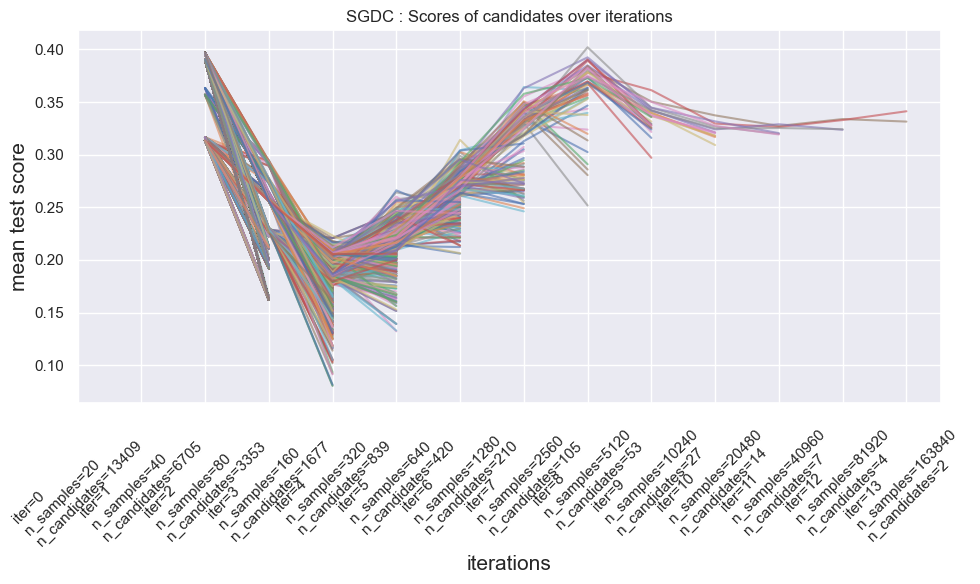

In [ ]:
results = pd.DataFrame(rsh_sgdc.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={rsh_sgdc.n_resources_[i]}\nn_candidates={rsh_sgdc.n_candidates_[i]}"
    for i in range(rsh_sgdc.n_iterations_)
]

ax.set_xticks(range(rsh_sgdc.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("SGDC : Scores of candidates over iterations")
ax.set_ylabel("mean test score", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
plt.gcf().set_size_inches((10, 6))
plt.tight_layout()
plt.show()

In [487]:
sgdc_model = rsh_sgdc.best_estimator_
arr_mdl_pred = sgdc_model.predict(df_combined_condition)
arr_mdl_pred_test = sgdc_model.predict(df_combined_condition_test)
print(f"TRAIN accurracy: {sgdc_model.score(df_combined_condition, y_comb):.3f}") 
print(f"TRAIN precision: {precision_score(y_comb, arr_mdl_pred):.3f}") 
print(f"TEST accurracy: {sgdc_model.score(df_combined_condition_test, y_comb_test):.3f}") 
print(f"TEST precision: {precision_score(y_comb_test, arr_mdl_pred_test):.3f}")

TRAIN accurracy: 0.749
TRAIN precision: 0.405
TEST accurracy: 0.714
TEST precision: 0.307


In [488]:
rsh_sgdc.best_params_

{'alpha': np.float64(0.0002667424287901258),
 'l1_ratio': np.float64(0.6663854135782065),
 'loss': 'hinge'}

Model trained.
on Train data : 
Accuracy on training data: 0.7012916312437544
precision: 0.344
% possible trades : 17.08
nb trade per day : 49
on Test data : 
Accuracy on test data: 0.6595222072678331
precision: 0.312
% possible trades : 16.198
nb trade per day : 46.650


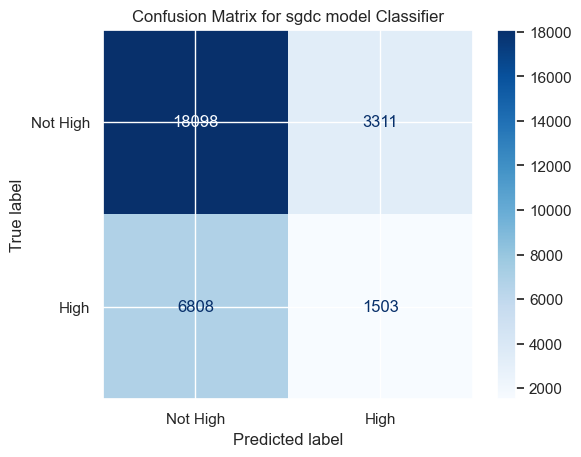

In [561]:

# with: 
# class_weight={True: 1.841, False: 1},
# {'alpha': np.float64(0.0002667424287901258),
#  'l1_ratio': np.float64(0.6663854135782065),
#  'loss': 'hinge'} : 
# on Train data : 
# Accuracy on training data: 0.7518084328903605
# precision: 0.410
# % possible trades : 1.52
# nb trade per day : 4
# on Test data : 
# Accuracy on test data: 0.718135935397039
# precision: 0.337
# % possible trades : 0.680
# nb trade per day : 1.957 


# Best model
sgdc = SGDClassifier(
    random_state=42,
    n_jobs=-1,
    max_iter=1000,
    tol=1e-3,
    penalty="elasticnet",
    class_weight="balanced",
    loss="log_loss", #rsh_sgdc.best_params_["loss"],
    alpha=rsh_sgdc.best_params_["alpha"],
    l1_ratio=rsh_sgdc.best_params_["l1_ratio"],
    early_stopping=True,
)
sgdc.fit(df_combined_condition, y_comb)
print("Model trained.")
arr_mdl_pred_train = sgdc.predict(df_combined_condition)
print("on Train data : ")
print("Accuracy on training data:", sgdc.score(df_combined_condition, y_comb))
print(f"precision: {precision_score(y_comb, arr_mdl_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred_train) / arr_mdl_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]:.0f}")
arr_mdl_pred = sgdc.predict(df_combined_condition_test)
print("on Test data : ")
print("Accuracy on test data:", sgdc.score(df_combined_condition_test, y_comb_test))
print(f"precision: {precision_score(y_comb_test, arr_mdl_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_mdl_pred) / arr_mdl_pred.shape[0]:.3f}")
print(f"nb trade per day : {288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]:.3f}")
cm = confusion_matrix(y_comb_test, arr_mdl_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for sgdc model Classifier")
plt.show()

Model trained.
on Train data : 
Accuracy on training data: 0.7370687726520202
precision: 0.391
% possible trades : 8.04
nb trade per day : 23
on Test data : 
Accuracy on test data: 0.692900403768506
precision: 0.315
% possible trades : 7.416
nb trade per day : 21.358


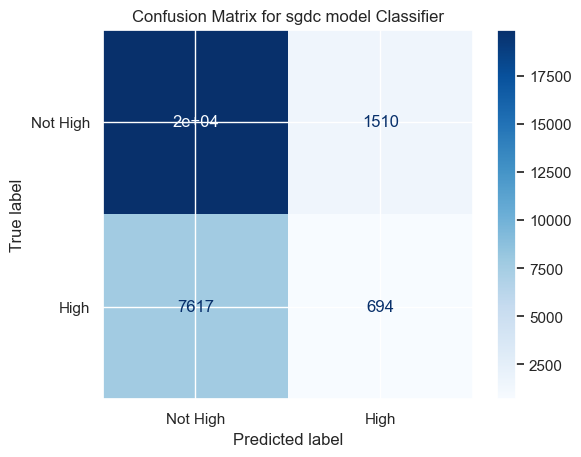

In [ ]:
# # Another hyperparameter tuning model
# sgdc = SGDClassifier(
#     random_state=42,
#     n_jobs=-1,
#     max_iter=100,
#     tol=1e-3,
#     penalty="elasticnet",
#     class_weight={True: 1.841, False: 1},
#     loss="log_loss",
#     alpha=1e-4,
#     l1_ratio=0.15,
#     early_stopping=True,
# )
# sgdc.fit(df_combined_condition, y_comb)
# print("Model trained.")
# arr_mdl_pred_train = sgdc.predict(df_combined_condition)
# print("on Train data : ")
# print("Accuracy on training data:", sgdc.score(df_combined_condition, y_comb))
# print(f"precision: {precision_score(y_comb, arr_mdl_pred_train):.3f}")
# print(f"% possible trades : {100*np.sum(arr_mdl_pred_train) / arr_mdl_pred_train.shape[0]:.2f}")
# # per day 
# print(f"nb trade per day : {288*arr_mdl_pred_train.sum() / arr_mdl_pred_train.shape[0]:.0f}")
# arr_mdl_pred = sgdc.predict(df_combined_condition_test)
# print("on Test data : ")
# print("Accuracy on test data:", sgdc.score(df_combined_condition_test, y_comb_test))
# print(f"precision: {precision_score(y_comb_test, arr_mdl_pred):.3f}")
# print(f"% possible trades : {100*np.sum(arr_mdl_pred) / arr_mdl_pred.shape[0]:.3f}")
# # per day 
# print(f"nb trade per day : {288*arr_mdl_pred.sum() / arr_mdl_pred.shape[0]:.3f}")

# cm = confusion_matrix(y_comb_test, arr_mdl_pred, labels=[False, True])
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
# disp.plot(cmap=plt.cm.Blues)
# plt.title("Confusion Matrix for sgdc model Classifier")
# plt.show()

In [567]:
sgdc_prob_min = 0.7
arr_sgdc_prob_pred_train = sgdc.predict_proba(df_combined_condition)[:, 1] > sgdc_prob_min
arr_sgdc_prob_pred_test = sgdc.predict_proba(df_combined_condition_test)[:, 1] > sgdc_prob_min

print("on Train data : ")
print("Accuracy on training data:", accuracy_score(y_comb, arr_sgdc_prob_pred_train))
print(f"precision: {precision_score(y_comb, arr_sgdc_prob_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_sgdc_prob_pred_train) / arr_sgdc_prob_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_sgdc_prob_pred_train.sum() / arr_sgdc_prob_pred_train.shape[0]:.2f}")

print("on Test data : ")
print("Accuracy on test data:", accuracy_score(y_comb_test, arr_sgdc_prob_pred_test))
print(f"precision: {precision_score(y_comb_test, arr_sgdc_prob_pred_test):.3f}")
print(f"% possible trades : {100*np.sum(arr_sgdc_prob_pred_test) / arr_sgdc_prob_pred_test.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_sgdc_prob_pred_test.sum() / arr_sgdc_prob_pred_test.shape[0]:.2f}")

on Train data : 
Accuracy on training data: 0.7534751741315794
precision: 0.388
% possible trades : 0.48
nb trade per day : 1.39
on Test data : 
Accuracy on test data: 0.7195154777927322
precision: 0.195
% possible trades : 0.14
nb trade per day : 0.40


In [ ]:
# # precision: 0.51
# # % possible trades : 0.48
# # nb trade per day : 1
# sgdc = SGDClassifier(
#     loss="log_loss",
#     penalty="l1",  # ou "elasticnet" si besoin de L1+L2
#     alpha=1e-3,
#     max_iter=1000,
#     tol=1e-3,
#     early_stopping=True,
#     class_weight={True: 1.9, False: 1},
#     random_state=42
# )

# precision: 0.40
# % possible trades : 3.21
# nb trade per day : 9
# sgdc = SGDClassifier(
#     loss="log_loss",
#     penalty="elasticnet",  # ou "elasticnet" si besoin de L1+L2
#     alpha=2e-3,
#     max_iter=10000,
#     tol=1e-4,
#     early_stopping=True,
#     class_weight={True: 1.9, False: 1},
#     random_state=42
# )

# precision: 0.48
# % possible trades : 0.53
# nb trade per day : 1.54
# sgdc = SGDClassifier(
#     loss="log_loss",
#     penalty="l1",  # ou "elasticnet" si besoin de L1+L2
#     alpha=9e-4,
#     max_iter=1000,
#     tol=1e-3,
#     early_stopping=True,
#     class_weight={True: 1.9, False: 1},
#     random_state=42
# )


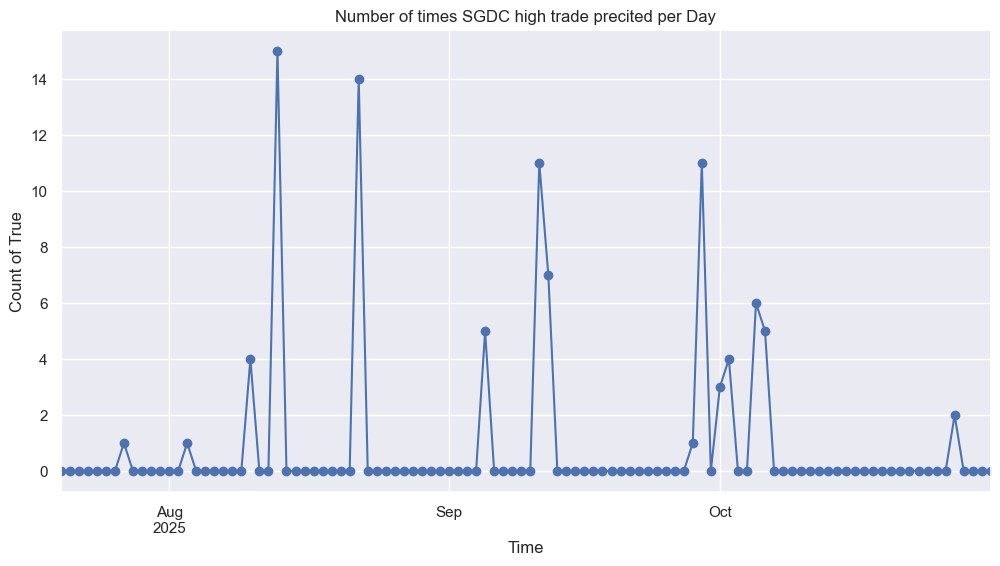

In [492]:
ser_sgdc_pred = pd.Series(arr_sgdc_prob_pred_test, index=df_combined_condition_test.index)
ser_sgdc_pred.resample("D").sum().plot(figsize=(12, 6), marker="o")
plt.title("Number of times SGDC high trade precited per Day")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)

In [493]:
print("On Test Data: ")
b_high_sl_before_test = (
        (y_high_test.max(axis=1) >= 1+target_level) & (y_low_test.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_test >= 1+target_level), axis=1) > np.argmax(y_low_test <= 1-target_level/R, axis=1))
)

print(f"nb TP touched: {np.sum((y_high_test.max(axis=1) >= 1+target_level))}")
print(f"- SL touched before TP:\n nb: {np.sum(b_high_sl_before_test)}")
print(f" {100*np.sum(b_high_sl_before_test) / y_high_test.shape[0]:.2f} % of total")
print(f" {100*np.sum(b_high_sl_before_test) / np.sum((y_high_test.max(axis=1) >= 1+target_level)):.2f} % of TP touched")
b_high_tp_sl_same_test = (
        (y_high_test.max(axis=1) >= 1+target_level) & (y_low_test.min(axis=1) <= 1-target_level/R) &
        (np.argmax((y_high_test >= 1+target_level), axis=1) == np.argmax(y_low_test <= 1-target_level/R, axis=1))
)

print(f"- TP & SL touched at same time:\n nb: {np.sum(b_high_tp_sl_same_test)}")
print(f" {100*np.sum(b_high_tp_sl_same_test) / y_high_test.shape[0]:.2f} % of total")
print(f" {100*np.sum(b_high_tp_sl_same_test) / np.sum((y_high_test.max(axis=1) >= 1+target_level)):.2f} % of TP touched")

b_high_not_tp_sl_test = (
        (y_high_test.max(axis=1) < 1+target_level) & (y_low_test.min(axis=1) > 1-target_level/R) 
)
print(f"- TP & SL not touched:\n nb: {np.sum(b_high_not_tp_sl_test)}")
print(f" {100*np.sum(b_high_not_tp_sl_test) / y_high_test.shape[0]:.2f} % of total")

b_high_sl_not_tp_test = (
        (y_high_test.max(axis=1) < 1+target_level) & (y_low_test.min(axis=1) <= 1-target_level/R) 
)
print(f"- SL touched but not TP:\n nb: {np.sum(b_high_sl_not_tp_test)}")
print(f" {100*np.sum(b_high_sl_not_tp_test) / y_high_test.shape[0]:.2f} % of total")
print(" ")
print("Model Prediction with Test Data: ")
# nb pred high arr_sgdc_prob_pred_test
nb_pred_high = np.sum((arr_sgdc_prob_pred_test))
print(f"nb pred high: {nb_pred_high}")
# nb false true high : bad high prediction
nb_false_true_high = np.sum((arr_sgdc_prob_pred_test & (~y_comb_test)))
print(f"nb false true high: {nb_false_true_high}")
# nb false true high because SL touched before
nb_false_true_high_sl_before = np.sum(arr_sgdc_prob_pred_test & (~y_comb_test) & b_high_sl_before_test)

# nb false true high because TP & SL at the same time
nb_false_true_high_tp_sl_same = np.sum(arr_sgdc_prob_pred_test & (~y_comb_test) & b_high_tp_sl_same_test)

# nb false true high because TP & SL not touched
nb_false_true_high_not_tp_not_sl = np.sum(arr_sgdc_prob_pred_test & (~y_comb_test) & b_high_not_tp_sl_test) 

# nb false true high because SL touched not not TP
nb_false_true_high_sl_not_tp = np.sum(arr_sgdc_prob_pred_test & (~y_comb_test) & b_high_sl_not_tp_test)  

# --- Print Section ---
print(f"nb false true high because SL touched before: {nb_false_true_high_sl_before}")
print(f"nb false true high because TP & SL at the same time: {nb_false_true_high_tp_sl_same}")
print(f"nb false true high because TP & SL not touched: {nb_false_true_high_not_tp_not_sl}")
print(f"nb false true high because SL touched but not TP: {nb_false_true_high_sl_not_tp}")

# check total of false true high
#213 = 113+2+4+94
assert nb_false_true_high == (
    nb_false_true_high_sl_before + 
    nb_false_true_high_tp_sl_same + 
    nb_false_true_high_not_tp_not_sl +
    nb_false_true_high_sl_not_tp
)
print(" ")
print("On high trade lost:")
print(f"- SL touched: {100*(nb_false_true_high_sl_before + nb_false_true_high_sl_not_tp)/nb_false_true_high:.2f} % at mimimum")

On Test Data: 
nb TP touched: 12430
- SL touched before TP:
 nb: 4000
 13.46 % of total
 32.18 % of TP touched
- TP & SL touched at same time:
 nb: 119
 0.40 % of total
 0.96 % of TP touched
- TP & SL not touched:
 nb: 3270
 11.00 % of total
- SL touched but not TP:
 nb: 14020
 47.17 % of total
 
Model Prediction with Test Data: 
nb pred high: 90
nb false true high: 57
nb false true high because SL touched before: 19
nb false true high because TP & SL at the same time: 0
nb false true high because TP & SL not touched: 5
nb false true high because SL touched but not TP: 33
 
On high trade lost:
- SL touched: 91.23 % at mimimum


In [494]:
113/407

0.27764127764127766

In [495]:
94/407

0.23095823095823095

#### XGBoost

In [ ]:
# params = {
#     "objective": "binary:logistic",
#     "max_depth": 2,
#     "learning_rate": 0.3,
#     "subsample": 0.33,
#     "colsample_bytree": 0.33,
#     "reg_alpha": 0.1,
#     "reg_lambda": 0.1,
#     "scale_pos_weight": 1,  # ajuster si classes déséquilibrées
#     "early_stopping_rounds": 20,
# }

#Accuracy on training data: 0.7783897326733231
# Accuracy on test data: 0.7066908441080626
# For Model XGBoost: 
# precision: 0.396
# % possible trades : 0.90
# nb trade per day : 2.59
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:logistic",
#     max_depth=20,
#     learning_rate=0.7,
#     subsample=0.33,
#     colsample_bytree=0.33,
#     reg_alpha=0.1,
#     reg_lambda=0.1,
#     scale_pos_weight=0.85,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=1000,
#     n_estimators=20,
#     #class_weight={True: 1.9, False: 1},
#     random_state=42,
# )

# Accuracy on training data: 0.7780574749539626
# Accuracy on test data: 0.7086618311783874
# For Model XGBoost: 
# precision TRAIN: 0.870
# precision TEST: 0.613
# % possible trades : 0.04
# nb trade per day : 0.12
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:logistic",
#     max_depth=5,
#     learning_rate=0.7,
#     subsample=0.7,
#     colsample_bytree=0.1,
#     reg_alpha=0.1,
#     reg_lambda=0.1,
#     scale_pos_weight=0.85,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=1000,
#     n_estimators=20,
#     #class_weight={True: 1.9, False: 1},
#     random_state=42,
# )

# Accuracy on training data: 0.7779730026524303
# Accuracy on test data: 0.7086355513507832
# For Model XGBoost: 
# precision TRAIN: 0.512
# % possible trades : 0.05
# nb trade per day : 0.14
# precision TEST: 0.551
# % possible trades : 0.06
# nb trade per day : 0.19
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     max_depth=3,
#     learning_rate=0.6,
#     subsample=0.5,
#     colsample_bytree=0.1,
#     reg_alpha=0.1,
#     reg_lambda=0.1,
#     #scale_pos_weight=0.85,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=100,
#     n_estimators=200,
#     random_state=42,
# )

# Accuracy on training data: 0.7783784696997854
# Accuracy on test data: 0.7079522758330705
# For Model XGBoost: 
# precision TRAIN: 0.623
# % possible trades : 0.17
# nb trade per day : 0.49
# precision TEST: 0.390
# % possible trades : 0.28
# nb trade per day : 0.81
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     max_depth=5,
#     learning_rate=0.05,
#     subsample=0.8,
#     colsample_bytree=0.3,
#     reg_alpha=4,
#     reg_lambda=4,
#     min_split_loss=0.5, # def. 0
#     min_child_weight=0.9, # default 1
#     #max_cat_threshold=30, # useless
#     #scale_pos_weight=0.85,  # ajuster si classes déséquilibrées
#     #class_weight={True: 1.9, False: 1},
#     base_score=0.33, # def. 0.5
#     early_stopping_rounds=30,
#     n_estimators=500,
#     random_state=42,
# )

# Accuracy on training data: 0.7823148789511919
# Accuracy on test data: 0.7053111531588353
# For Model XGBoost: 
# precision TRAIN: 0.835
# % possible trades : 0.65
# nb trade per day : 1.87
# precision TEST: 0.368
# % possible trades : 1.23
# nb trade per day : 3.55
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
# )


# Accuracy on training data: 0.7823148789511919
# Accuracy on test data: 0.7053111531588353
# For Model XGBoost: 
# precision TRAIN: 0.835
# % possible trades : 0.65
# nb trade per day : 1.87
# precision TEST: 0.368
# % possible trades : 1.23
# nb trade per day : 3.55
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
# )

In [801]:
scale_pos_weight = (y_comb.shape[0] - y_comb.sum()) / y_comb.sum()
scale_pos_weight

np.float64(3.0741337141294607)

[0]	validation_0-error:0.27964
[1]	validation_0-error:0.27964
[2]	validation_0-error:0.27964
[3]	validation_0-error:0.27964
[4]	validation_0-error:0.27971
[5]	validation_0-error:0.27964
[6]	validation_0-error:0.27971
[7]	validation_0-error:0.27964
[8]	validation_0-error:0.27964
[9]	validation_0-error:0.27998
[10]	validation_0-error:0.27964
[11]	validation_0-error:0.27964
[12]	validation_0-error:0.28112
[13]	validation_0-error:0.27964
[14]	validation_0-error:0.28069
[15]	validation_0-error:0.27974
[16]	validation_0-error:0.27961
[17]	validation_0-error:0.28203
[18]	validation_0-error:0.27964
[19]	validation_0-error:0.27964
[20]	validation_0-error:0.28072
[21]	validation_0-error:0.27985
[22]	validation_0-error:0.28085
[23]	validation_0-error:0.28045
[24]	validation_0-error:0.27995
[25]	validation_0-error:0.28069
[26]	validation_0-error:0.27995
[27]	validation_0-error:0.27998
[28]	validation_0-error:0.28048
[29]	validation_0-error:0.27991
[30]	validation_0-error:0.28059
[31]	validation_0-

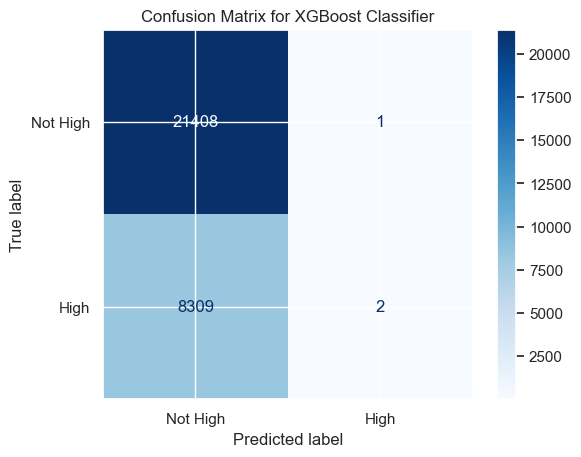

In [ ]:
import xgboost as xgb
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:logistic",
#     max_depth=3,
#     learning_rate=0.6,
#     subsample=0.5,
#     colsample_bytree=0.1,
#     reg_alpha=0.1,
#     reg_lambda=0.1,
#     scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     #early_stopping_rounds=100,
#     n_estimators=200,
#     random_state=42,
# )

xgb_mdl = xgb.XGBClassifier(
    objective="binary:hinge",
    max_depth=3,
    learning_rate=0.6,
    subsample=0.5,
    colsample_bytree=0.1,
    reg_alpha=0.1,
    reg_lambda=0.1,
    #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
    early_stopping_rounds=20,
    n_estimators=100,
    random_state=42,
)
xgb_mdl.fit(df_combined_condition, y_comb, eval_set=[(df_combined_condition_test, y_comb_test)])
#xgb_mdl.fit(df_combined_condition, y_comb)
print("Model trained.")
print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [820]:
#loguniform(a=20, b=200).rvs(size=10)

In [813]:
xgb_prob_min = 0.55
arr_xgb_prob_pred_train = xgb_mdl.predict_proba(df_combined_condition)[:, 1] > xgb_prob_min
arr_xgb_prob_pred_test = xgb_mdl.predict_proba(df_combined_condition_test)[:, 1] > xgb_prob_min

print("on Train data : ")
print("Accuracy on training data:", accuracy_score(y_comb, arr_xgb_prob_pred_train))
print(f"precision: {precision_score(y_comb, arr_xgb_prob_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_prob_pred_train) / arr_xgb_prob_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_prob_pred_train.sum() / arr_xgb_prob_pred_train.shape[0]:.2f}")

print("on Test data : ")
print("Accuracy on test data:", accuracy_score(y_comb_test, arr_xgb_prob_pred_test))
print(f"precision: {precision_score(y_comb_test, arr_xgb_prob_pred_test):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_prob_pred_test) / arr_xgb_prob_pred_test.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_prob_pred_test.sum() / arr_xgb_prob_pred_test.shape[0]:.2f}")

on Train data : 
Accuracy on training data: 0.7545788775038406
precision: 0.541
% possible trades : 0.04
nb trade per day : 0.11
on Test data : 
Accuracy on test data: 0.7203903095558546
precision: 0.667
% possible trades : 0.01
nb trade per day : 0.03


In [842]:
# import numpy as np
# import xgboost as xgb
# from sklearn.model_selection import TimeSeriesSplit, HalvingRandomSearchCV
# from sklearn.metrics import make_scorer, accuracy_score
# from scipy.stats import uniform, randint

# --- 1. Data Preparation (Replace with your actual data) ---
# For demonstration, we create synthetic time-series data.
# In your case, you would use:
# X = df_combined_condition
# y = y_comb
# print("Generating synthetic time-series data for demonstration...")
# n_samples = 2000
# n_features = 15
# X = np.random.rand(n_samples, n_features)
# # Create a target that has some dependency on previous values to simulate a time series
# y = np.zeros(n_samples, dtype=int)
# for i in range(1, n_samples):
#     # A simple rule to create some pattern
#     if X[i, 0] + 0.5 * X[i-1, 1] > 0.85:
#         y[i] = 1
#     else:
#         y[i] = 0

# print(f"Data shapes: X={X.shape}, y={y.shape}\n")


# # --- 2. Define the Cross-Validation Strategy ---
# # Use your existing TimeSeriesSplit
# tscv = TimeSeriesSplit(n_splits=5)


# --- 3. Define the Base Model ---
# Note: 'n_estimators' is controlled by the search, so we don't set it here.
# 'early_stopping_rounds' is not used directly with HalvingRandomSearchCV.
xgb_mdl = xgb.XGBClassifier(
    objective="binary:hinge",
    random_state=42,
    #use_label_encoder=False, # Recommended to avoid a future warning
    eval_metric='logloss' # A common metric for binary classification
)

# --- 4. Define the Hyperparameter Search Space ---
# We define distributions for Randomized Search to sample from.
# These ranges are wider than your fixed parameters to allow the search to explore.
param_dist = {
    'max_depth': randint(1, 4),             # Search depths from 2 to 4
    'learning_rate': uniform(0.01, 1),   # Search from 0.05 up to 0.6
    'subsample': uniform(0.2, 0.9),         # Search between 0.4 and 0.9
    'colsample_bytree': uniform(0.1, 0.7),  # Search between 0.1 and 0.6
    'reg_alpha': uniform(0.0, 1),         # Search L1 regularization
    'reg_lambda': uniform(0.0, 1),        # Search L2 regularization
    #'early_stopping_rounds': randint(20, 200),
}

# --- 5. Set up and Run HalvingRandomSearchCV ---
# This search will iteratively find the best parameters by allocating more
# 'n_estimators' (the resource) to the most promising candidates.
halving_search = HalvingRandomSearchCV(
    n_jobs=-1,                # Use all available CPU cores
    random_state=42,
    verbose=1,                # Set to 1 or 2 to see the progress
    cv=tscv,
    factor=2,  # Keep the top 1/3 of candidates in each iteration
    estimator=xgb_mdl,
    param_distributions=param_dist,
    #resource='n_estimators',  # The resource to increase is the number of trees
    #max_resources=150,        # The maximum n_estimators to use for the final model
    min_resources=500,         # The initial n_estimators to start with
    scoring='precision',       # Metric for evaluation, since hinge loss gives 0/1
)

print("Starting HalvingRandomSearchCV...")
# Fit the model to the data
halving_search.fit(df_combined_condition, y_comb)
print("\nSearch complete!")


# --- 6. Display the Results ---
print("\n--- Cross-Validation Results ---")
print(f"Best Score (Accuracy): {halving_search.best_score_:.4f}")
print("\nBest Parameters Found:")
# Using a loop for cleaner printing
for param, value in halving_search.best_params_.items():
    if isinstance(value, float):
        print(f"  {param}: {value:.4f}")
    else:
        print(f"  {param}: {value}")

# The best_estimator_ is a fully trained model on the entire dataset
# using the best parameters found.
best_model = halving_search.best_estimator_
print("\nBest model is now trained and ready to be used for predictions.")

# Example of using the best model for prediction
# predictions = best_model.predict(df_combined_condition_test)


Starting HalvingRandomSearchCV...
n_iterations: 10
n_required_iterations: 10
n_possible_iterations: 10
min_resources_: 500
max_resources_: 268188
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 536
n_resources: 500
Fitting 5 folds for each of 536 candidates, totalling 2680 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capital

----------
iter: 1
n_candidates: 268
n_resources: 1000
Fitting 5 folds for each of 268 candidates, totalling 1340 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capital

----------
iter: 2
n_candidates: 134
n_resources: 2000
Fitting 5 folds for each of 134 candidates, totalling 670 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capital

----------
iter: 3
n_candidates: 67
n_resources: 4000
Fitting 5 folds for each of 67 candidates, totalling 335 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capital

----------
iter: 4
n_candidates: 34
n_resources: 8000
Fitting 5 folds for each of 34 candidates, totalling 170 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.125      0.13333333 0.26285714]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.36       0.36363636 0.88351648]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: P

----------
iter: 5
n_candidates: 17
n_resources: 16000
Fitting 5 folds for each of 17 candidates, totalling 85 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.2375     0.08888889 0.125     ]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.77409314 0.72712551 0.56363636]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: P

----------
iter: 6
n_candidates: 9
n_resources: 32000
Fitting 5 folds for each of 9 candidates, totalling 45 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.36576169 0.18021978 0.38333333]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.647516   0.87895016 0.8920795 ]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: P

----------
iter: 7
n_candidates: 5
n_resources: 64000
Fitting 5 folds for each of 5 candidates, totalling 25 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.37367424 0.15428571 0.43698925]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.60557584 0.70576923 0.7169697 ]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: P

----------
iter: 8
n_candidates: 3
n_resources: 128000
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.31746469 0.23540011 0.13428571]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.67292566 0.56872861 0.64015152]
  warnings.warn(


----------
iter: 9
n_candidates: 2
n_resources: 256000
Fitting 5 folds for each of 2 candidates, totalling 10 fits


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.33315411 0.32168878 0.30832331]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.72743413 0.58689486 0.62158131]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the test scores are non-finite: [0.26982456 0.15857143 0.08571429 ... 0.30832331 0.34507128 0.32137007]
  warnings.warn(
/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/model_selection/_search.py:1135: UserWarning: One or more of the train scores are non-finite: [0.99230769 0.83454715 1.         ... 0.6215813


Search complete!

--- Cross-Validation Results ---
Best Score (Accuracy): 0.3451

Best Parameters Found:
  colsample_bytree: 0.4145
  learning_rate: 0.5959
  max_depth: 2
  reg_alpha: 0.0718
  reg_lambda: 0.6826
  subsample: 0.4177

Best model is now trained and ready to be used for predictions.


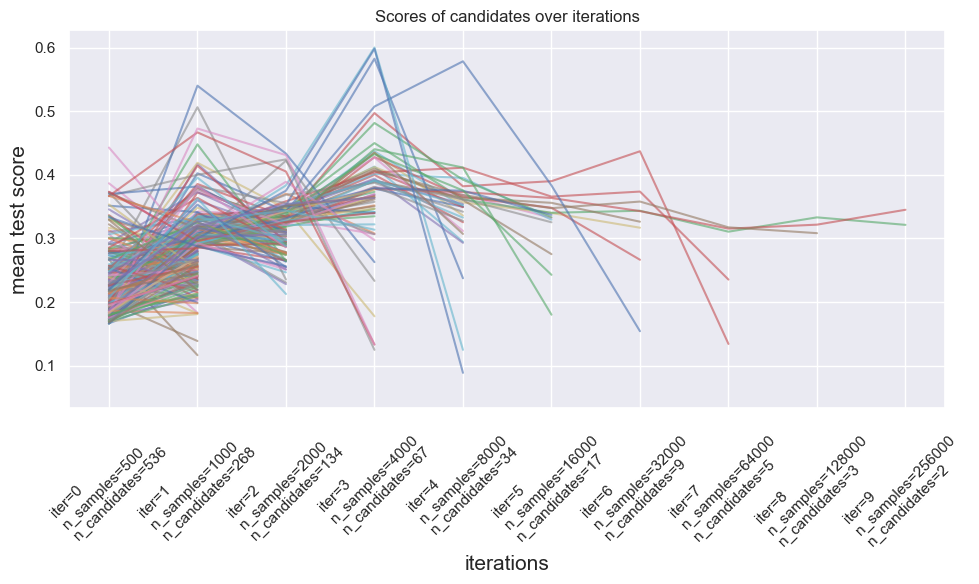

In [843]:
results = pd.DataFrame(halving_search.cv_results_)
results["params_str"] = results.params.apply(str)
results.drop_duplicates(subset=("params_str", "iter"), inplace=True)
mean_scores = results.pivot(
    index="iter", columns="params_str", values="mean_test_score"
)
ax = mean_scores.plot(legend=False, alpha=0.6)

labels = [
    f"iter={i}\nn_samples={halving_search.n_resources_[i]}\nn_candidates={halving_search.n_candidates_[i]}"
    for i in range(halving_search.n_iterations_)
]

ax.set_xticks(range(halving_search.n_iterations_))
ax.set_xticklabels(labels, rotation=45, multialignment="left")
ax.set_title("Scores of candidates over iterations")
ax.set_ylabel("mean test score", fontsize=15)
ax.set_xlabel("iterations", fontsize=15)
plt.gcf().set_size_inches((10, 6))
plt.tight_layout()
plt.show()

Model trained.
Accuracy on training data: 0.7532961952063478
Accuracy on test data: 0.7192462987886945
For Model XGBoost: 
precision TRAIN: 0.390
% possible trades : 0.57
nb trade per day : 1.64
precision TEST: 0.408
% possible trades : 0.60
nb trade per day : 1.73


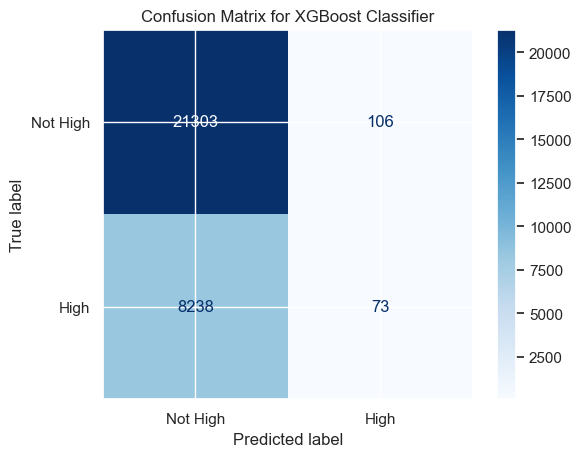

In [844]:
# {'colsample_bytree': np.float64(0.34507192784241925),
#  'learning_rate': np.float64(0.3181508136098512),
#  'max_depth': 3,
#  'reg_alpha': np.float64(0.7234201136885849),
#  'reg_lambda': np.float64(0.4958757350787708),
#  'subsample': np.float64(0.3729415943168831)}
# Model trained.
# Accuracy on training data: 0.7546348084179755
# Accuracy on test data: 0.7203230148048452
# For Model XGBoost: 
# precision TRAIN: 0.612
# % possible trades : 0.04
# nb trade per day : 0.11
# precision TEST: 0.429
# % possible trades : 0.02
# nb trade per day : 0.07

print("Model trained.")
print("Accuracy on training data:", best_model.score(df_combined_condition, y_comb))
print("Accuracy on test data:", best_model.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = best_model.predict(df_combined_condition)
arr_xgb_pred = best_model.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [845]:
halving_search.best_params_

{'colsample_bytree': np.float64(0.41454481942774946),
 'learning_rate': np.float64(0.5958647884535192),
 'max_depth': 2,
 'reg_alpha': np.float64(0.07177580622651303),
 'reg_lambda': np.float64(0.6826172212234024),
 'subsample': np.float64(0.4177385122839766)}

In [847]:
best_model

,objective,'binary:hinge'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,np.float64(0....4481942774946)
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,'logloss'


In [ ]:
# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
#     n_jobs=-1,
#     #use_label_encoder=False, # Recommended to avoid a future warning
#     eval_metric="auc",#'logloss', # A common metric for binary classification
#     max_depth=halving_search.best_params_["max_depth"],
#     learning_rate=halving_search.best_params_["learning_rate"],
#     subsample=halving_search.best_params_["subsample"],
#     colsample_bytree=halving_search.best_params_["colsample_bytree"],
#     reg_alpha=halving_search.best_params_["reg_alpha"],
#     reg_lambda=halving_search.best_params_["reg_lambda"],
#     #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     #early_stopping_rounds=100,
#     n_estimators=100,
# )
# Model trained.
# Accuracy on training data: 0.7532961952063478
# Accuracy on test data: 0.7192462987886945
# For Model XGBoost: 
# precision TRAIN: 0.390
# % possible trades : 0.57
# nb trade per day : 1.64
# precision TEST: 0.408
# % possible trades : 0.60
# nb trade per day : 1.73


# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
#     n_jobs=-1,
#     #use_label_encoder=False, # Recommended to avoid a future warning
#     eval_metric="auc",#'logloss', # A common metric for binary classification
#     max_depth=halving_search.best_params_["max_depth"],
#     learning_rate=halving_search.best_params_["learning_rate"],
#     subsample=halving_search.best_params_["subsample"],
#     colsample_bytree=halving_search.best_params_["colsample_bytree"],
#     reg_alpha=halving_search.best_params_["reg_alpha"],
#     reg_lambda=halving_search.best_params_["reg_lambda"],
#     #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=100,
#     n_estimators=200,
# )
# Model trained.
# Accuracy on training data: 0.7534117857622264
# Accuracy on test data: 0.7195491251682369
# For Model XGBoost: 
# precision TRAIN: 0.404
# % possible trades : 0.59
# nb trade per day : 1.70
# precision TEST: 0.433
# % possible trades : 0.60
# nb trade per day : 1.72


# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
#     #use_label_encoder=False, # Recommended to avoid a future warning
#     eval_metric="auc",#'logloss', # A common metric for binary classification
#     max_depth=halving_search.best_params_["max_depth"],
#     learning_rate=halving_search.best_params_["learning_rate"],
#     subsample=halving_search.best_params_["subsample"],
#     colsample_bytree=halving_search.best_params_["colsample_bytree"],
#     reg_alpha=halving_search.best_params_["reg_alpha"],
#     reg_lambda=halving_search.best_params_["reg_lambda"],
#     #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=100,
#     n_estimators=100,
# )
# Model trained.
# Accuracy on training data: 0.7538816054409593
# Accuracy on test data: 0.7200538358008075
# For Model XGBoost: 
# precision TRAIN: 0.401
# % possible trades : 0.34
# nb trade per day : 0.97
# precision TEST: 0.464
# % possible trades : 0.42
# nb trade per day : 1.21


# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
#     n_jobs=-1,
#     #use_label_encoder=False, # Recommended to avoid a future warning
#     eval_metric="auc",#'logloss', # A common metric for binary classification
#     max_depth=halving_search.best_params_["max_depth"],
#     learning_rate=halving_search.best_params_["learning_rate"],
#     subsample=halving_search.best_params_["subsample"],
#     colsample_bytree=halving_search.best_params_["colsample_bytree"],
#     reg_alpha=halving_search.best_params_["reg_alpha"],
#     reg_lambda=halving_search.best_params_["reg_lambda"],
#     #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=100, # or 100
#     n_estimators=110, # or 100
# )
# Model trained.
# Accuracy on training data: 0.7538816054409593
# Accuracy on test data: 0.7200538358008075
# For Model XGBoost: 
# precision TRAIN: 0.401
# % possible trades : 0.34
# nb trade per day : 0.97
# precision TEST: 0.464
# % possible trades : 0.42
# nb trade per day : 1.21

# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
#     n_jobs=-1,
#     #use_label_encoder=False, # Recommended to avoid a future warning
#     eval_metric="auc",#'logloss', # A common metric for binary classification
#     max_depth=halving_search.best_params_["max_depth"],
#     learning_rate=halving_search.best_params_["learning_rate"],
#     subsample=halving_search.best_params_["subsample"],
#     colsample_bytree=halving_search.best_params_["colsample_bytree"],
#     reg_alpha=halving_search.best_params_["reg_alpha"],
#     reg_lambda=halving_search.best_params_["reg_lambda"],
#     #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=1000,
#     n_estimators=1000,
# )
# Model trained.
# Accuracy on training data: 0.7534528017659254
# Accuracy on test data: 0.720222072678331
# For Model XGBoost: 
# precision TRAIN: 0.420
# % possible trades : 0.68
# nb trade per day : 1.97
# precision TEST: 0.489
# % possible trades : 0.59
# nb trade per day : 1.71


# xgb_mdl = xgb.XGBClassifier(
#     objective="binary:hinge",
#     random_state=42,
#     n_jobs=-1,
#     #use_label_encoder=False, # Recommended to avoid a future warning
#     eval_metric="auc",#'logloss', # A common metric for binary classification
#     max_depth=halving_search.best_params_["max_depth"],
#     learning_rate=halving_search.best_params_["learning_rate"],
#     subsample=halving_search.best_params_["subsample"],
#     colsample_bytree=halving_search.best_params_["colsample_bytree"],
#     reg_alpha=halving_search.best_params_["reg_alpha"],
#     reg_lambda=halving_search.best_params_["reg_lambda"],
#     #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
#     early_stopping_rounds=3000,
#     n_estimators=3000,
# )
# Model trained.
# Accuracy on training data: 0.753605679597894
# Accuracy on test data: 0.7187752355316286
# For Model XGBoost: 
# precision TRAIN: 0.462
# % possible trades : 1.25
# nb trade per day : 3.60
# precision TEST: 0.426
# % possible trades : 1.07
# nb trade per day : 3.09


#     early_stopping_rounds=1500,
#     n_estimators=1500,
# Model trained.
# Accuracy on training data: 0.753605679597894
# Accuracy on test data: 0.7187752355316286
# For Model XGBoost: 
# precision TRAIN: 0.462
# % possible trades : 1.25
# nb trade per day : 3.60
# precision TEST: 0.426
# % possible trades : 1.07
# nb trade per day : 3.09

[0]	validation_0-auc:0.50000
[1]	validation_0-auc:0.50000
[2]	validation_0-auc:0.50000
[3]	validation_0-auc:0.50000
[4]	validation_0-auc:0.50000
[5]	validation_0-auc:0.50000
[6]	validation_0-auc:0.50005
[7]	validation_0-auc:0.50000
[8]	validation_0-auc:0.50000
[9]	validation_0-auc:0.49998
[10]	validation_0-auc:0.50000
[11]	validation_0-auc:0.50000
[12]	validation_0-auc:0.50018
[13]	validation_0-auc:0.50000
[14]	validation_0-auc:0.50000
[15]	validation_0-auc:0.50011
[16]	validation_0-auc:0.50000
[17]	validation_0-auc:0.50019
[18]	validation_0-auc:0.50019
[19]	validation_0-auc:0.49998
[20]	validation_0-auc:0.50034
[21]	validation_0-auc:0.50000
[22]	validation_0-auc:0.50000
[23]	validation_0-auc:0.50013
[24]	validation_0-auc:0.50012
[25]	validation_0-auc:0.50114
[26]	validation_0-auc:0.50005
[27]	validation_0-auc:0.50000
[28]	validation_0-auc:0.50041
[29]	validation_0-auc:0.50010
[30]	validation_0-auc:0.50000
[31]	validation_0-auc:0.50044
[32]	validation_0-auc:0.50034
[33]	validation_0-au

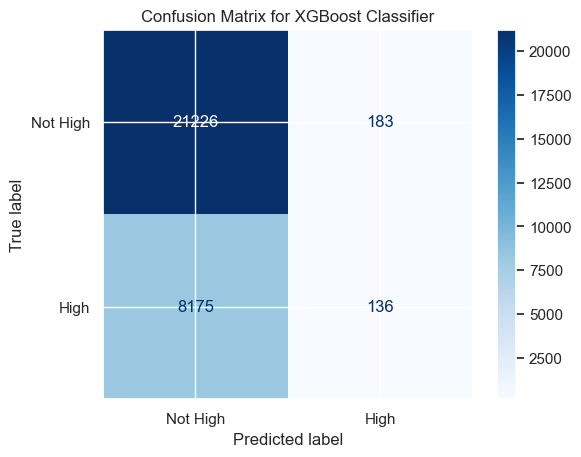

In [926]:
# by default : 
# n_estimators = 100 
# use "logloss" and eval_metric="auc" is different if earlystop
# If earlystop is used, the best on evalset is the best estimator and not the last one.
xgb_mdl = xgb.XGBClassifier(
    objective="binary:hinge",
    random_state=42,
    n_jobs=-1,
    #use_label_encoder=False, # Recommended to avoid a future warning
    eval_metric="auc", #'logloss', # A common metric for binary classification
    max_depth=halving_search.best_params_["max_depth"],
    learning_rate=halving_search.best_params_["learning_rate"],
    subsample=halving_search.best_params_["subsample"],
    colsample_bytree=halving_search.best_params_["colsample_bytree"],
    reg_alpha=halving_search.best_params_["reg_alpha"],
    reg_lambda=halving_search.best_params_["reg_lambda"],
    #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
    early_stopping_rounds=1500,
    n_estimators=1500,
)
xgb_mdl.fit(df_combined_condition, y_comb, eval_set=[(df_combined_condition_test, y_comb_test)])
#xgb_mdl.fit(df_combined_condition, y_comb)
print("Model trained.")
print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

[0]	validation_0-auc:0.50000
[1]	validation_0-auc:0.50000
[2]	validation_0-auc:0.50000
[3]	validation_0-auc:0.50000
[4]	validation_0-auc:0.50000
[5]	validation_0-auc:0.50000
[6]	validation_0-auc:0.50005
[7]	validation_0-auc:0.50000
[8]	validation_0-auc:0.50000
[9]	validation_0-auc:0.49998
[10]	validation_0-auc:0.50000
[11]	validation_0-auc:0.50000
[12]	validation_0-auc:0.50018
[13]	validation_0-auc:0.50000
[14]	validation_0-auc:0.50000
[15]	validation_0-auc:0.50011
[16]	validation_0-auc:0.50000
[17]	validation_0-auc:0.50019
[18]	validation_0-auc:0.50019
[19]	validation_0-auc:0.49998
[20]	validation_0-auc:0.50034
[21]	validation_0-auc:0.50000
[22]	validation_0-auc:0.50000
[23]	validation_0-auc:0.50013
[24]	validation_0-auc:0.50012
[25]	validation_0-auc:0.50114
[26]	validation_0-auc:0.50005
[27]	validation_0-auc:0.50000
[28]	validation_0-auc:0.50041
[29]	validation_0-auc:0.50010
[30]	validation_0-auc:0.50000
[31]	validation_0-auc:0.50044
[32]	validation_0-auc:0.50034
[33]	validation_0-au

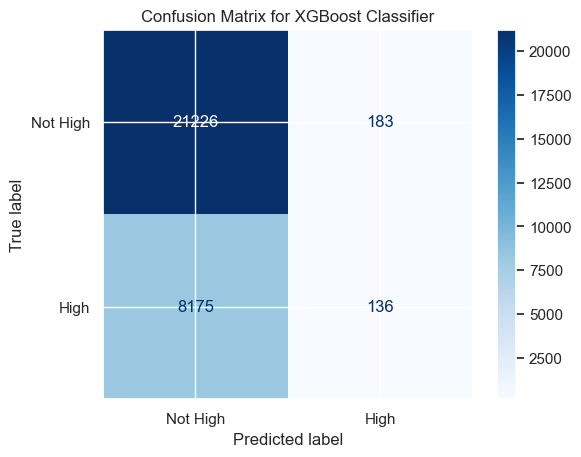

In [927]:
xgb_mdl = xgb.XGBClassifier(
    objective="binary:hinge",
    random_state=42,
    n_jobs=-1,
    #use_label_encoder=False, # Recommended to avoid a future warning
    eval_metric="auc", #'logloss', # A common metric for binary classification
    max_depth=halving_search.best_params_["max_depth"],
    learning_rate=halving_search.best_params_["learning_rate"],
    subsample=halving_search.best_params_["subsample"],
    colsample_bytree=halving_search.best_params_["colsample_bytree"],
    reg_alpha=halving_search.best_params_["reg_alpha"],
    reg_lambda=halving_search.best_params_["reg_lambda"],
    #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
    early_stopping_rounds=2000,
    n_estimators=2000,
)
xgb_mdl.fit(df_combined_condition, y_comb, eval_set=[(df_combined_condition_test, y_comb_test)])
#xgb_mdl.fit(df_combined_condition, y_comb)
print("Model trained.")
print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

[0]	validation_0-auc:0.50000
[1]	validation_0-auc:0.50000
[2]	validation_0-auc:0.50000
[3]	validation_0-auc:0.50000
[4]	validation_0-auc:0.50000
[5]	validation_0-auc:0.50000
[6]	validation_0-auc:0.50005
[7]	validation_0-auc:0.50000
[8]	validation_0-auc:0.50000
[9]	validation_0-auc:0.49998
[10]	validation_0-auc:0.50000
[11]	validation_0-auc:0.50000
[12]	validation_0-auc:0.50018
[13]	validation_0-auc:0.50000
[14]	validation_0-auc:0.50000
[15]	validation_0-auc:0.50011
[16]	validation_0-auc:0.50000
[17]	validation_0-auc:0.50019
[18]	validation_0-auc:0.50019
[19]	validation_0-auc:0.49998
[20]	validation_0-auc:0.50034
[21]	validation_0-auc:0.50000
[22]	validation_0-auc:0.50000
[23]	validation_0-auc:0.50013
[24]	validation_0-auc:0.50012
[25]	validation_0-auc:0.50114
[26]	validation_0-auc:0.50005
[27]	validation_0-auc:0.50000
[28]	validation_0-auc:0.50041
[29]	validation_0-auc:0.50010
[30]	validation_0-auc:0.50000
[31]	validation_0-auc:0.50044
[32]	validation_0-auc:0.50034
[33]	validation_0-au

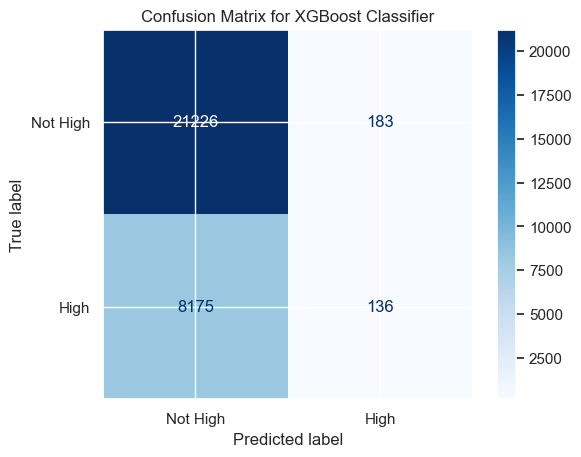

In [928]:
xgb_mdl = xgb.XGBClassifier(
    objective="binary:hinge",
    random_state=42,
    n_jobs=-1,
    #use_label_encoder=False, # Recommended to avoid a future warning
    eval_metric="auc", #'logloss', # A common metric for binary classification
    max_depth=halving_search.best_params_["max_depth"],
    learning_rate=halving_search.best_params_["learning_rate"],
    subsample=halving_search.best_params_["subsample"],
    colsample_bytree=halving_search.best_params_["colsample_bytree"],
    reg_alpha=halving_search.best_params_["reg_alpha"],
    reg_lambda=halving_search.best_params_["reg_lambda"],
    #scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
    early_stopping_rounds=2500,
    n_estimators=2500,
)
xgb_mdl.fit(df_combined_condition, y_comb, eval_set=[(df_combined_condition_test, y_comb_test)])
#xgb_mdl.fit(df_combined_condition, y_comb)
print("Model trained.")
print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [933]:
scale_pos_weight

np.float64(3.0741337141294607)

In [ ]:
# test NOK on 1st 100 rounds: eval_metric: f1_score, precision_score

In [949]:
# transform True to 1 and False to 0: 
y_comb = y_comb.astype(int)
y_comb_test = y_comb_test.astype(int)

Model trained.
Accuracy on training data: 0.7026451593658181
Accuracy on test data: 0.6591184387617766
For Model XGBoost: 
precision TRAIN: 0.351
% possible trades : 17.46
nb trade per day : 50.29
precision TEST: 0.310
% possible trades : 16.14
nb trade per day : 46.48


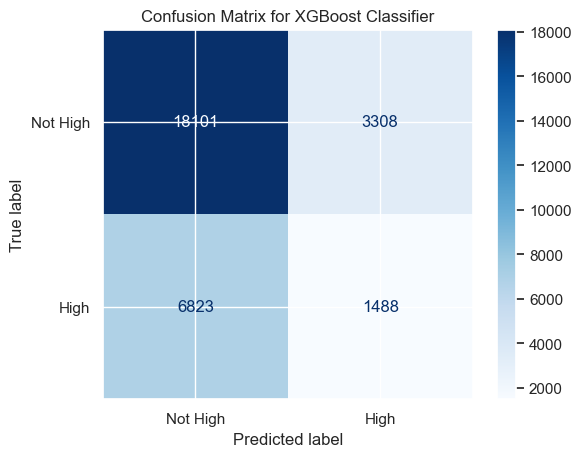

In [ ]:
xgb_mdl = xgb.XGBClassifier(
    verbosity=0,
    objective="binary:logistic",
    random_state=42,
    n_jobs=-1,
    use_label_encoder=False, # Recommended to avoid a future warning
    eval_metric="logloss", #'logloss', # A common metric for binary classification
    max_depth=halving_search.best_params_["max_depth"],
    learning_rate=halving_search.best_params_["learning_rate"],
    subsample=halving_search.best_params_["subsample"],
    colsample_bytree=halving_search.best_params_["colsample_bytree"],
    reg_alpha=halving_search.best_params_["reg_alpha"],
    reg_lambda=halving_search.best_params_["reg_lambda"],
    scale_pos_weight=scale_pos_weight,  # ajuster si classes déséquilibrées
    early_stopping_rounds=1000,
    n_estimators=1000,
)
xgb_mdl.fit(
    df_combined_condition, 
    y_comb, 
    eval_set=[(df_combined_condition_test, y_comb_test)],
    verbose=0,
)
#xgb_mdl.fit(df_combined_condition, y_comb)
print("Model trained.")
print("Accuracy on training data:", xgb_mdl.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

In [959]:
xgb_mdl.evals_result_

{'validation_0': OrderedDict([('logloss',
               [0.6930230539267028,
                0.6906979924556705,
                0.6900548104853601,
                0.6898484907693369,
                0.6895381495055729,
                0.6877666356906916,
                0.6883109312258852,
                0.6888427841771659,
                0.6874377326601125,
                0.6883783385413291,
                0.6871578991162424,
                0.6886548125527268,
                0.688912722246764,
                0.6884257795617565,
                0.6879808663504642,
                0.6883912638637011,
                0.6885812985173064,
                0.6888007987802034,
                0.6893778960770786,
                0.6892774333277388,
                0.6908938787762241,
                0.68986737700643,
                0.6899174770959534,
                0.690244725195147,
                0.6891169805957122,
                0.6882402695675317,
                0.68699935

In [962]:
np.argmax(np.array(xgb_mdl.evals_result_["validation_0"]["logloss"]))

np.int64(552)

In [963]:
xgb_mdl.get_num_boosting_rounds()

1000

In [1009]:
def sum_upfront_1h(arr_in):
    """
    Calculates the number of rising edges in a pandas Series for one hour limited to 1

    A rising edge is defined as a transition from 0 to 1.

    Args:
        ser_in: A pandas Series containing numerical data (presumably 0s and 1s).

    Returns:
        The total count of rising edges (0 to 1 transitions).
    """

    previous_values = arr_in.shift(1, fill_value=0)

    rising_edges = (arr_in == 1) & (previous_values == 0)

    if rising_edges.sum() >= 1:
        return 1
    else:
      return 0


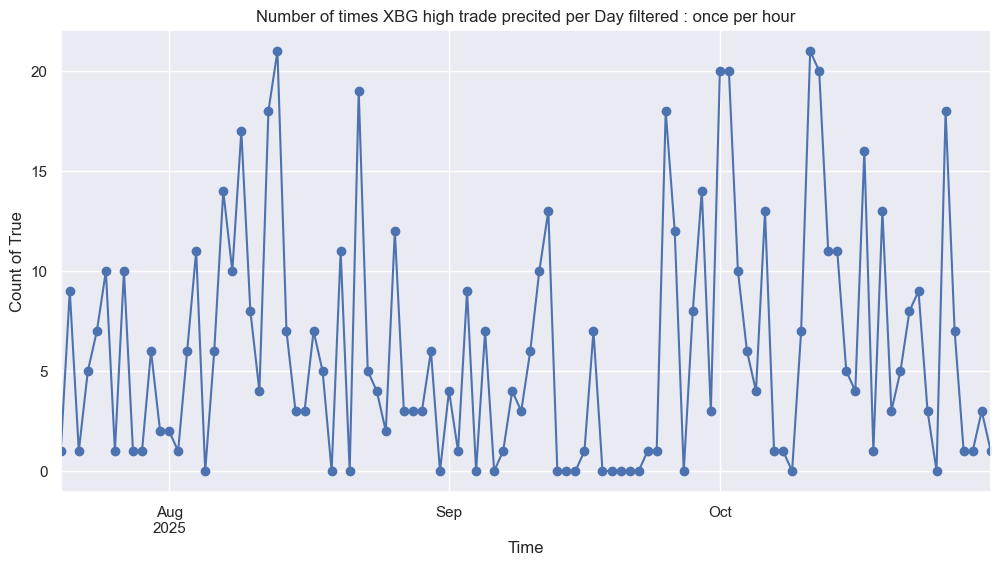

In [1016]:
ser_xgb_pred = pd.Series(arr_xgb_pred, index=df_combined_condition_test.index)
ser_xgb_pred.resample("h").apply(sum_upfront_1h).resample("D").sum().plot(figsize=(12, 6), marker="o")
plt.title("Number of times XBG high trade precited per Day filtered : once per hour")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)

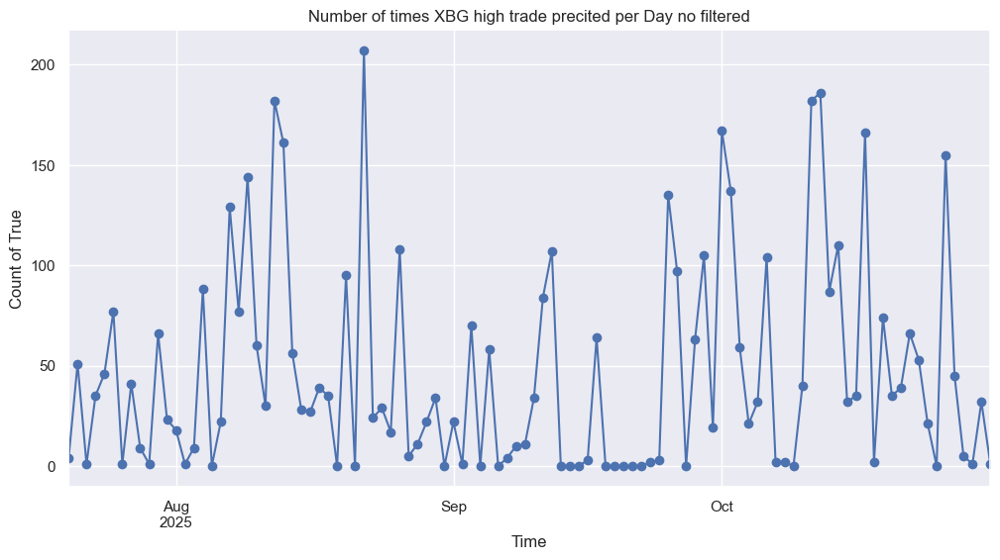

In [1017]:
#ser_xgb_pred = pd.Series(arr_xgb_pred, index=df_combined_condition_test.index)
ser_xgb_pred.resample("D").sum().plot(figsize=(12, 6), marker="o")
plt.title("Number of times XBG high trade precited per Day no filtered")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)

In [966]:
ser_xgb_pred.value_counts()

0    24924
1     4796
Name: count, dtype: int64

In [1010]:
ser_xgb_pred.resample("h").apply(sum_upfront_1h)

date_ETH
2025-07-20 12:00:00    0
2025-07-20 13:00:00    1
2025-07-20 14:00:00    0
2025-07-20 15:00:00    0
2025-07-20 16:00:00    0
                      ..
2025-10-31 12:00:00    0
2025-10-31 13:00:00    1
2025-10-31 14:00:00    0
2025-10-31 15:00:00    0
2025-10-31 16:00:00    0
Freq: h, Length: 2477, dtype: int64

<Axes: xlabel='date_ETH'>

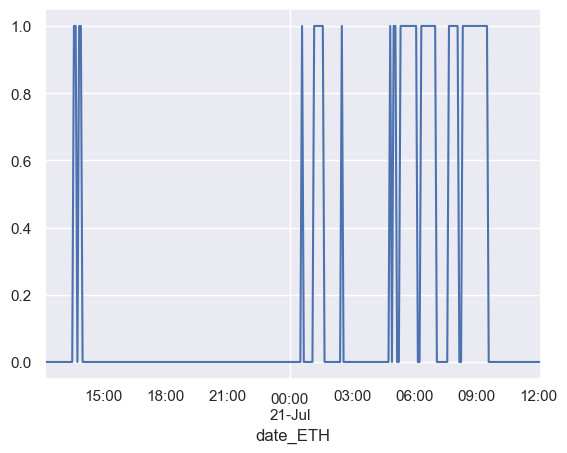

In [1011]:
ser_xgb_pred.iloc[:288].plot()

In [1014]:
ser_xgb_pred.resample("D").sum()

date_ETH
2025-07-20     4
2025-07-21    51
2025-07-22     1
2025-07-23    35
2025-07-24    46
              ..
2025-10-27    45
2025-10-28     5
2025-10-29     1
2025-10-30    32
2025-10-31     1
Freq: D, Length: 104, dtype: int64

In [1013]:
ser_xgb_pred.resample("h").apply(sum_upfront_1h).resample("D").sum()

date_ETH
2025-07-20    1
2025-07-21    9
2025-07-22    1
2025-07-23    5
2025-07-24    7
             ..
2025-10-27    7
2025-10-28    1
2025-10-29    1
2025-10-30    3
2025-10-31    1
Freq: D, Length: 104, dtype: int64

<Axes: xlabel='date_ETH'>

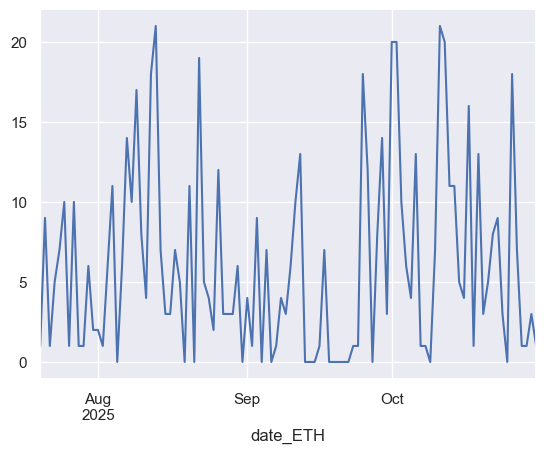

In [1012]:
ser_xgb_pred.resample("h").apply(sum_upfront_1h).resample("D").sum().plot()

In [975]:
ser_xgb_pred.resample("D").sum_upfront().plot(figsize=(12, 6), marker="o")

AttributeError: 'DatetimeIndexResampler' object has no attribute 'sum_upfront'

#### Multi-class

In [581]:
y_comb_multi = list_df[0]["target_cat"].values
y_comb_multi
# _, _, y_multi_rf_train, y_multi_rf_test = train_test_split(
#     df_combined_condition,
#     y_comb_multi,
#     test_size=0.3,
#     shuffle=False
# )

array(['neutral', 'neutral', 'neutral', ..., 'high', 'high', 'high'],
      shape=(268188,), dtype=object)

In [582]:
y_comb_multi_test = df_targets_test["target_cat"].values
y_comb_multi_test

array(['low', 'neutral', 'high', ..., 'neutral', 'neutral', 'neutral'],
      shape=(29720,), dtype=object)

In [583]:

# Accuracy on training data: 0.5469131005276703
# Accuracy on test data: 0.4116997792494481
# For Model SGDC: 
# precision:
# ['high', 'low', 'neutral']
# [0.35153392 0.         0.42149897]
# % possible trades : 14.01
# nb trade per day : 40
# sgdc_multi = SGDClassifier(
#     loss="hinge",
#     alpha=5e-4,
#     max_iter=1000,
#     tol=1e-3,
#     #class_weight="balanced",  # plus de poids sur 'high'
#     class_weight={"high": 1.9, "low": 1, "neutral": 1},
#     penalty="l1",  # ou "elasticnet" si besoin de L1+L2
#     early_stopping=True,
#     random_state=42
# )

# Accuracy on training data: 0.5475100381251654
# Accuracy on test data: 0.4118705981288763
# For Model SGDC: 
# precision:
# ['high', 'low', 'neutral']
# [0.35702944 0.         0.41848138]
# % possible trades : 10.76
# nb trade per day : 31
# sgdc_multi = SGDClassifier(
#     loss="hinge",
#     class_weight={"high": 1.9, "low": 1, "neutral": 1},
#     penalty="l1",  # ou "elasticnet" si besoin de L1+L2
#     alpha=1e-3,
#     max_iter=1000,
#     tol=1e-3,
#     early_stopping=True,
#     random_state=42
# )

Model trained.
Accuracy on training data: 0.5050673408206183
Accuracy on test data: 0.4294751009421265
For Model SGDC: 
precision:
['high', 'low', 'neutral']
[0.31883194 0.288      0.43675896]
% possible trades : 5.65
nb trade per day : 16


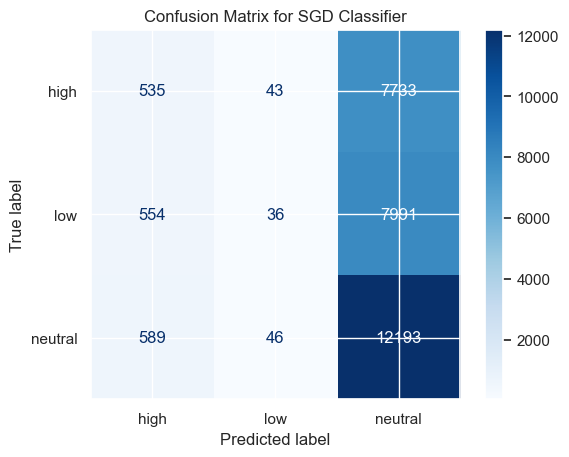

In [584]:
sgdc_multi = SGDClassifier(
    loss="hinge",
    class_weight={"high": 2, "low": 2, "neutral": 1},
    penalty="l1",  # ou "elasticnet" si besoin de L1+L2
    alpha=1e-3,
    max_iter=1000,
    tol=1e-3,
    early_stopping=True,
    random_state=42
)

sgdc_multi.fit(df_combined_condition, y_comb_multi)
print("Model trained.")
print("Accuracy on training data:", sgdc_multi.score(df_combined_condition, y_comb_multi))
print("Accuracy on test data:", sgdc_multi.score(df_combined_condition_test, y_comb_multi_test))
arr_sgdc_multi_pred = sgdc_multi.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_multi_test, arr_sgdc_multi_pred, labels=target_cat_names)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=target_cat_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for SGD Classifier")

print("For Model SGDC: ")
print("precision:")
print(target_cat_names)
print(precision_score(y_comb_multi_test, arr_sgdc_multi_pred, labels=target_cat_names, average=None))
print(f"% possible trades : {100*np.sum(arr_sgdc_multi_pred == "high") / arr_sgdc_multi_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*np.sum(arr_sgdc_multi_pred == "high") / arr_sgdc_multi_pred.shape[0]:.0f}")
plt.show()


## Probability Mdl

### Comb Prob Improvement 

#### Best Comb
We use only one single best prob event to detect high trades

In [585]:
# test add a event one by one to check if prob is better
df_prob_comb_high_event.sort_values(by="p_high", ascending=False).head(10)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
23014,1524,1036,1425,0.382434,0.259975,186.050000,max_high_3_ETH_cat,low,56,rsi_2_BTC_cat,...,40,rsi_1_BTC_cat,high,40,123,63,29,0.131974,0.470149,0.935484
141442,1074,822,919,0.381528,0.292007,66.987342,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,51,25,17,0.054721,0.186567,0.548387
145862,962,751,809,0.381443,0.297780,51.980152,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,49,25,17,0.052575,0.186567,0.548387
153987,970,749,828,0.380840,0.294071,56.824898,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,64,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
154197,965,746,823,0.380821,0.294396,56.061952,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,68,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
141441,1071,825,920,0.380327,0.292969,63.835443,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,52,25,17,0.055794,0.186567,0.548387
154170,959,744,819,0.380254,0.295004,54.286553,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,70,rsi_1_ETH_cat,high,56,47,24,17,0.050429,0.179104,0.548387
141435,1063,815,919,0.380050,0.291384,65.499468,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,51,25,17,0.054721,0.186567,0.548387
145861,952,750,804,0.379888,0.299282,47.948296,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,50,25,17,0.053648,0.186567,0.548387
145855,949,746,804,0.379752,0.298519,48.624189,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,49,25,17,0.052575,0.186567,0.548387


In [586]:
idx_best_event = df_prob_comb_high_event.sort_values(by="p_high", ascending=False).index[0]
print(idx_best_event)

23014


In [587]:
df_prob_comb_high_event.loc[idx_best_event]

high                                     1524
low                                      1036
neutral                                  1425
p_high                               0.382434
p_low                                0.259975
delta_prob                             186.05
feat_0                     max_high_3_ETH_cat
feat_0_cat                                low
lag_0                                      56
feat_1                          rsi_2_BTC_cat
feat_1_cat                               high
lag_1                                      40
feat_2                          rsi_1_BTC_cat
feat_2_cat                               high
lag_2                                      40
days_with_event                           123
weeks_with_event                           63
months_with_event                          29
ratio_days_with_event                0.131974
ratio_weeks_with_event               0.470149
ratio_months_with_event              0.935484
Name: 23014, dtype: object

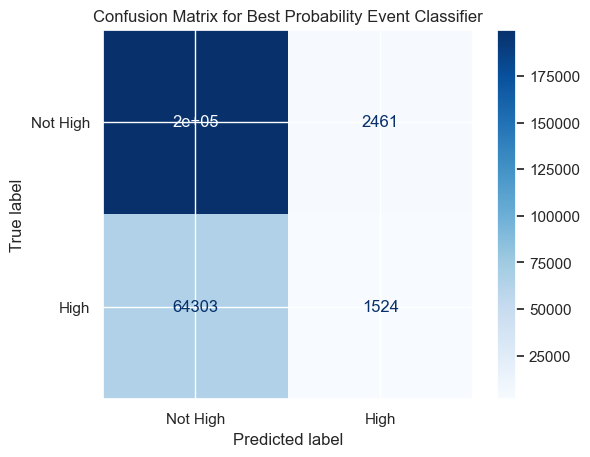

In [588]:
y_pred_best_prob_train = df_combined_condition[idx_best_event]
cm = confusion_matrix(y_comb, y_pred_best_prob_train, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best Probability Event Classifier")
plt.show()

In [589]:
# MDL prob
y_pred_best_prob_test = df_combined_condition_test[idx_best_event]
y_pred_best_prob_test

date_ETH
2025-07-20 12:10:00    False
2025-07-20 12:15:00    False
2025-07-20 12:20:00    False
2025-07-20 12:25:00    False
2025-07-20 12:30:00    False
                       ...  
2025-10-31 16:25:00    False
2025-10-31 16:30:00    False
2025-10-31 16:35:00    False
2025-10-31 16:40:00    False
2025-10-31 16:45:00    False
Name: 23014, Length: 29720, dtype: bool

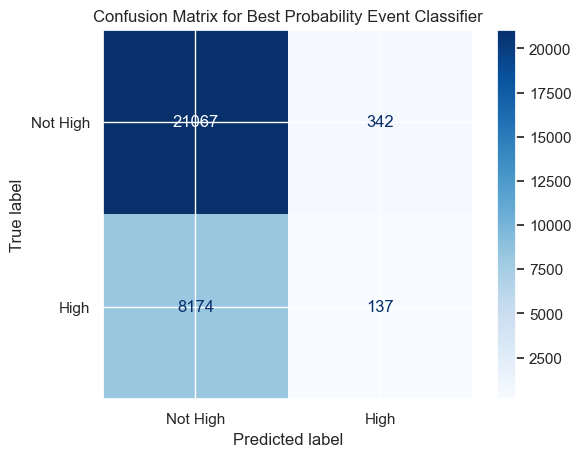

In [590]:
cm = confusion_matrix(y_comb_test, y_pred_best_prob_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best Probability Event Classifier")
plt.show()

In [591]:
print(f"precision: {precision_score(y_comb_test, y_pred_best_prob_test):.2f}")
print(f"% possible trades : {100*y_pred_best_prob_test.sum() / y_pred_best_prob_test.shape[0]:.2f}%")
# per day
print(f"nb trade per day : {288*y_pred_best_prob_test.sum() / y_pred_best_prob_test.shape[0]:.2f}")

precision: 0.29
% possible trades : 1.61%
nb trade per day : 4.64


#### Best Comb + single event
We add a event one by one to check if model is better

In [592]:
# --- Optimized Code ---

# 1. Find the best single event and its probability more directly
# .idxmax() is more efficient than sorting the entire DataFrame.
best_event_name = df_prob_comb_high_event['p_high'].idxmax()
best_prob_0 = df_prob_comb_high_event['p_high'].max()

# Store the best combination found so far. Start with the best single event.
best_combination = (best_event_name,)

print(f"Initial best event: '{best_event_name}' with probability: {best_prob_0:.4f}")

# 2. Pre-calculate the boolean mask for "high" targets for efficiency
# This avoids recalculating it on each iteration of the loop.
is_high_target = (list_df[0]["target_cat"] == "high")
min_support = 1000
list_second_event_name = []
# 3. Iterate through all events to find a better PAIR
print("\nSearching for a better two-event combination...")
for second_event_name in df_combined_condition.columns:
    # Don't combine an event with itself
    if second_event_name == best_event_name:
        continue

    # 4. Create a boolean mask for the event combination
    # This correctly uses the event names (strings) to index the DataFrame columns.
    combination_mask = df_combined_condition[best_event_name] & df_combined_condition[second_event_name]

    # 5. Check if the combination has enough data points (support)
    support = combination_mask.sum()
    if support < min_support:
        continue

    # 6. Calculate the probability for this new combination
    # Slicing the pre-calculated 'is_high_target' series is much faster.
    high_targets_in_combination = is_high_target[combination_mask].sum()
    current_prob = high_targets_in_combination / support

    # 7. If the new combination is better, update the tracking variables
    if current_prob > best_prob_0:
        best_prob_0 = current_prob
        best_combination = (best_event_name, second_event_name)
        list_second_event_name.append(second_event_name)
        print("\n--- New Best Combination Found ---")
        print(f"Combination: {best_combination}")
        print(f"New best probability: {best_prob_0:.4f}")
        print(f"Support (Highs / Total): {high_targets_in_combination} / {support}")

print("\n--- Search Complete ---")
print(f"The best combination found is: {best_combination}")
print(f"With a probability of: {best_prob_0:.4f}")


Initial best event: '23014' with probability: 0.3824

Searching for a better two-event combination...

--- New Best Combination Found ---
Combination: (np.int64(23014), 18888)
New best probability: 0.3840
Support (Highs / Total): 1364 / 3552

--- New Best Combination Found ---
Combination: (np.int64(23014), 18890)
New best probability: 0.3852
Support (Highs / Total): 1414 / 3671

--- New Best Combination Found ---
Combination: (np.int64(23014), 18897)
New best probability: 0.3854
Support (Highs / Total): 1371 / 3557

--- New Best Combination Found ---
Combination: (np.int64(23014), 18908)
New best probability: 0.3858
Support (Highs / Total): 1377 / 3569

--- New Best Combination Found ---
Combination: (np.int64(23014), 18981)
New best probability: 0.3867
Support (Highs / Total): 1430 / 3698

--- New Best Combination Found ---
Combination: (np.int64(23014), 18983)
New best probability: 0.3871
Support (Highs / Total): 1478 / 3818

--- New Best Combination Found ---
Combination: (np.int64

- What is the combined events exactly ?


In [593]:
list_second_event_name

[18888, 18890, 18897, 18908, 18981, 18983, 18990, 19001, 27833]

In [594]:
df_prob_comb_high_event.loc[[best_combination[0], best_combination[1]]].T

,23014,27833
high,1524,3089
low,1036,2470
neutral,1425,3160
p_high,0.382434,0.354284
p_low,0.259975,0.283289
delta_prob,186.05,137.852491
feat_0,max_high_3_ETH_cat,vwap_4h_ETH_cat
feat_0_cat,low,low
lag_0,56,8
feat_1,rsi_2_BTC_cat,max_high_3_ETH_cat


In [595]:
# MDL prob
y_pred_best_1_prob_test = df_combined_condition_test[best_combination[0]] & df_combined_condition_test[best_combination[1]]
y_pred_best_1_prob_test

date_ETH
2025-07-20 12:10:00    False
2025-07-20 12:15:00    False
2025-07-20 12:20:00    False
2025-07-20 12:25:00    False
2025-07-20 12:30:00    False
                       ...  
2025-10-31 16:25:00    False
2025-10-31 16:30:00    False
2025-10-31 16:35:00    False
2025-10-31 16:40:00    False
2025-10-31 16:45:00    False
Length: 29720, dtype: bool

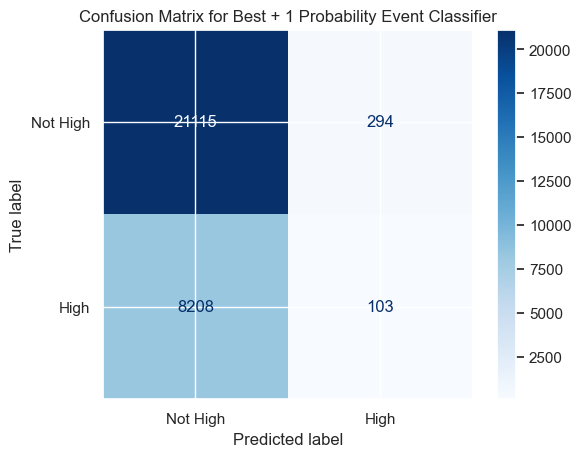

In [596]:

cm = confusion_matrix(y_comb_test, y_pred_best_1_prob_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + 1 Probability Event Classifier")
plt.show()

In [597]:
print(f"precision: {precision_score(y_comb_test, y_pred_best_1_prob_test):.2f}")
print(f"% possible trades : {100*y_pred_best_1_prob_test.sum() / y_pred_best_1_prob_test.shape[0]:.2f}%")
# per day 
print(f"nb trade per day : {288*y_pred_best_1_prob_test.sum() / y_pred_best_1_prob_test.shape[0]:.0f}")


precision: 0.26
% possible trades : 1.34%
nb trade per day : 4


##### Best prob + OR best multi single event
- Best event with at least one another best event

In [598]:
if len(list_second_event_name) > 1:
    print(list_second_event_name)


[18888, 18890, 18897, 18908, 18981, 18983, 18990, 19001, 27833]


In [599]:
# MDL prob
y_pred_best_multi_prob_test = df_combined_condition_test[best_combination[0]] & (
    (df_combined_condition_test[best_combination[1]]) | 
    (df_combined_condition_test[list_second_event_name[-2]] | 
     df_combined_condition_test[list_second_event_name[-3]] | 
     df_combined_condition_test[list_second_event_name[-4]] 
     )
)
y_pred_best_multi_prob_test

date_ETH
2025-07-20 12:10:00    False
2025-07-20 12:15:00    False
2025-07-20 12:20:00    False
2025-07-20 12:25:00    False
2025-07-20 12:30:00    False
                       ...  
2025-10-31 16:25:00    False
2025-10-31 16:30:00    False
2025-10-31 16:35:00    False
2025-10-31 16:40:00    False
2025-10-31 16:45:00    False
Length: 29720, dtype: bool

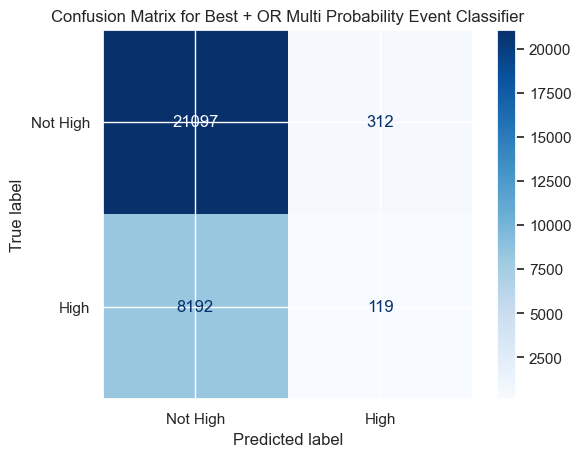

In [600]:

cm = confusion_matrix(y_comb_test, y_pred_best_multi_prob_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + OR Multi Probability Event Classifier")
plt.show()

In [601]:
print(f"precision: {precision_score(y_comb_test, y_pred_best_multi_prob_test):.2f}")
print(f"% possible trades : {100*y_pred_best_multi_prob_test.sum() / y_pred_best_multi_prob_test.shape[0]:.2f}%")
# per day 
print(f"nb trade per day : {288*y_pred_best_multi_prob_test.sum() / y_pred_best_multi_prob_test.shape[0]:.0f}")


precision: 0.28
% possible trades : 1.45%
nb trade per day : 4


#### All high prob event + 1 event
To test if adding an event (from 27000 events) to 57 best events, can improve high probability ? 

In [602]:
df_combined_condition.shape

(268188, 5712)

In [603]:
df_prob_comb_high_event[df_prob_comb_high_event["p_high"] > 0.372].sort_values(by="high", ascending=False)

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
19166,1874,1387,1763,0.373010,0.276075,145.457835,max_high_3_ETH_cat,low,56,max_high_3_ETH_cat,...,40,rsi_2_BTC_cat,high,40,145,63,29,0.155579,0.470149,0.935484
20101,1855,1370,1750,0.372864,0.275377,145.875969,max_high_3_ETH_cat,low,56,max_high_3_ETH_cat,...,8,rsi_2_BTC_cat,high,40,143,63,29,0.153433,0.470149,0.935484
19606,1842,1378,1715,0.373252,0.279230,133.724224,max_high_3_ETH_cat,low,56,max_high_0_ETH_cat,...,8,rsi_2_BTC_cat,high,40,145,63,29,0.155579,0.470149,0.935484
19520,1842,1378,1715,0.373252,0.279230,133.724224,max_high_3_ETH_cat,low,56,High_ETH_cat,...,8,rsi_2_BTC_cat,high,40,145,63,29,0.155579,0.470149,0.935484
19345,1831,1376,1706,0.372685,0.280073,129.108201,max_high_3_ETH_cat,low,56,min_low_0_ETH_cat,...,8,rsi_2_BTC_cat,high,40,145,63,29,0.155579,0.470149,0.935484
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115282,940,739,803,0.378727,0.297744,48.125074,rsi_1_ETH_cat,high,71,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,49,25,17,0.052575,0.186567,0.548387
31275,939,750,831,0.372619,0.297619,42.298401,vwap_4h_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,70,54,24,16,0.057940,0.179104,0.516129
115277,939,750,805,0.376504,0.300722,42.298401,rsi_1_ETH_cat,high,71,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,71,50,25,17,0.053648,0.186567,0.548387
131775,937,741,795,0.378892,0.299636,45.787843,rsi_1_ETH_cat,high,70,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,64,49,25,17,0.052575,0.186567,0.548387


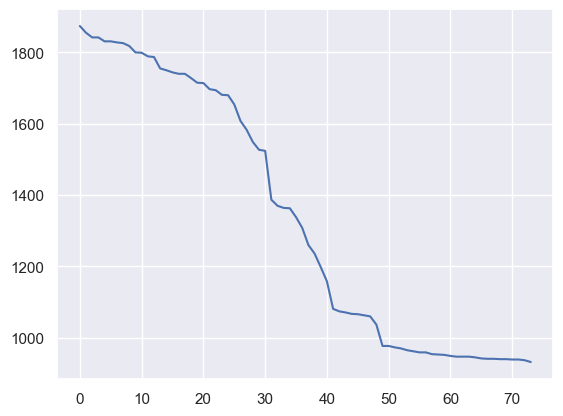

In [604]:
plt.plot(df_prob_comb_high_event[df_prob_comb_high_event["p_high"] > 0.372].sort_values(by="high", ascending=False).high.values)

In [605]:
min_support = 200 # min number of occurrences of this new combination
p_min = 0.372 # min prob for events

# check hash
path_hash_comb_improvement = os.path.join(path_data, 'comb_improvement_inputs_hash.txt')
path_df_probability_filtered = os.path.join(path_data, 'df_probability_filtered.pkl')
mode_redo_comb, hash_comb = check_hash_inputs(
     (df_combined_condition, 
      min_support, 
      p_min,
     ),
     path_hash_comb_improvement,
)

hash not match : mode REDO


In [606]:
# compute time : 15 min : for 57 best events * 27000 events

if mode_redo_comb:
    # --- Setup: Assuming these DataFrames are pre-loaded ---
    # df_combined_condition: (n_samples, n_events) boolean DataFrame
    # list_df: A list containing the DataFrame with the target
    # df_prob_comb_high_event: (n_events, 1) DataFrame with single-event probabilities ('p_high')

    # --- Optimized Code using Targeted Matrix Multiplication ---

    # 1. Prepare the data
    # Using boolean arrays is memory-efficient. We'll convert to int just before matmul.
    X = df_combined_condition.values
    is_high_target = (list_df[0]["target_cat"] == "high").values
    event_names = df_combined_condition.columns
    n_events = len(event_names)
    print("--- Starting targeted search for best event combination ---")

    # 2. Find the best single event from the pre-calculated DataFrame
    # This is fast and doesn't require a large matrix operation.
    best_single_prob = df_prob_comb_high_event['p_high'].max()
    best_single_name = df_prob_comb_high_event['p_high'].idxmax()

    # Initialize the best result with the best single event
    best_prob = best_single_prob
    best_combination = (best_single_name,)
    print(f"Initial best single event: '{best_single_name}' with probability: {best_prob:.4f}")

    # 3. Identify the high-probability events to form pairs with
    high_prob_event_names = df_prob_comb_high_event[df_prob_comb_high_event["p_high"] > p_min].index

    if high_prob_event_names.empty:
        print(f"\nNo single events with p_high > {p_min}. The best combination is the single event found above.")
    else:
        print(f"\nFound {len(high_prob_event_names)} events with p_high > {p_min} to form pairs with.")
        
        # Get the integer indices for these high-probability events
        name_to_idx = {name: i for i, name in enumerate(event_names)}
        high_prob_indices = [name_to_idx[name] for name in high_prob_event_names]

        # 4. Create the sub-matrix for high-prob events (k columns)
        X_h = X[:, high_prob_indices].astype(np.int32)

        # 5. Calculate support and high-counts for the targeted pairs ONLY
        # This creates a (k, N) matrix, which is much smaller than (N, N)
        print("5.Calculating support and high-counts for the targeted pairs...")
        support_filtered = X_h.T @ X.astype(np.int32)
        
        # Create a version of X where rows are zeroed out if the target was not "high"
        X_high = X * is_high_target[:, np.newaxis]
        X_h_high = X_high[:, high_prob_indices].astype(np.int32)
        print("Create a version of X where rows are zeroed out if the target was not 'high'.")
        high_count_filtered = X_h_high.T @ X.astype(np.int32)

        # 6. Calculate the probability matrix for the targeted pairs
        print("6.Calculating the probability matrix for the targeted pairs...")
        with np.errstate(divide='ignore', invalid='ignore'):
            probability_filtered = high_count_filtered / support_filtered
        probability_filtered = np.nan_to_num(probability_filtered)

        # 7. Apply filters to the (k, N) matrix
        # Minimum support filter
        print("7.Apply filters to the (k, N) matrix...")
        probability_filtered[support_filtered < min_support] = 0
        
        # Filter out pairs of an event with itself
        for i, original_idx in enumerate(high_prob_indices):
            if original_idx < n_events:
                probability_filtered[i, original_idx] = 0
        
        # Create a DataFrame with the filtered probabilities
        df_probability_filtered = pd.DataFrame(
        probability_filtered, 
        columns=event_names, 
        index=high_prob_event_names,
        )
        # save
        df_probability_filtered.to_pickle(path_df_probability_filtered)
        # hash
        save_hash(path_hash_comb_improvement, hash_comb)

        # 8. Find the best PAIR from the filtered results
        print("8.Find the best PAIR from the filtered results...")
        best_pair_prob = probability_filtered.max()
        
        if best_pair_prob > best_prob:
            # Find the row/col index in the (k, N) matrix
            idx_flat = np.argmax(probability_filtered)
            idx_pair_filtered = np.unravel_index(idx_flat, probability_filtered.shape)
            
            # Map indices back to original event names
            event1_name = high_prob_event_names[idx_pair_filtered[0]]
            event2_name = event_names[idx_pair_filtered[1]]
            
            best_prob = best_pair_prob
            best_combination = (event1_name, event2_name)

    # 9. Display the final result
    print("\n--- Search Complete ---")
    print(f"The best combination found is: {best_combination}")
    print(f"With a probability of: {best_prob:.4f}")

    # Retrieve support and high count for the final best combination for reporting
    if len(best_combination) == 1:
        event_mask = df_combined_condition[best_combination[0]]
        support = event_mask.sum()
        high_count = (event_mask & is_high_target).sum()
    else:
        # For a pair, we can retrieve the values we already calculated
        e1, e2 = best_combination
        if e1 in high_prob_event_names:
            idx_h = high_prob_event_names.get_loc(e1)
            idx_a = event_names.get_loc(e2)
            support = support_filtered[idx_h, idx_a]
            high_count = high_count_filtered[idx_h, idx_a]
        else: # The other event must be the high-probability one
            idx_h = high_prob_event_names.get_loc(e2)
            idx_a = event_names.get_loc(e1)
            support = support_filtered[idx_h, idx_a]
            high_count = high_count_filtered[idx_h, idx_a]

    print(f"Support (Highs / Total): {high_count} / {support}")
else:
    df_probability_filtered = pd.read_pickle(path_df_probability_filtered)
    best_prob = df_probability_filtered.max().max()
    print(f"The best probability found is: {best_prob:.4f}")
    
    #best_combination = df_probability_filtered.idxmax().values

# get 100 best comb : 

df_probability_filtered


--- Starting targeted search for best event combination ---
Initial best single event: '23014' with probability: 0.3824

Found 74 events with p_high > 0.372 to form pairs with.
5.Calculating support and high-counts for the targeted pairs...
Create a version of X where rows are zeroed out if the target was not 'high'.
6.Calculating the probability matrix for the targeted pairs...
7.Apply filters to the (k, N) matrix...
8.Find the best PAIR from the filtered results...

--- Search Complete ---
The best combination found is: (np.int64(23143), np.int64(76178))
With a probability of: 0.5099
Support (Highs / Total): 129 / 253


,72,74,77,81,87,92,169,171,174,178,...,160895,161006,161011,161015,161152,161157,161176,161180,161202,161215
4709,0.372837,0.374071,0.377934,0.373450,0.373972,0.374956,0.370873,0.371325,0.374717,0.371530,...,0.352372,0.351648,0.344424,0.351714,0.351843,0.352827,0.343502,0.351707,0.343636,0.352372
9451,0.372320,0.373339,0.377897,0.373425,0.372492,0.373450,0.372084,0.373079,0.377897,0.373199,...,0.352613,0.353061,0.349086,0.352613,0.352577,0.353941,0.348379,0.352127,0.349206,0.353665
9457,0.371622,0.372218,0.376313,0.372492,0.372858,0.373972,0.371386,0.371959,0.376313,0.372263,...,0.352912,0.352577,0.348379,0.352127,0.353701,0.354283,0.346749,0.352912,0.348428,0.353978
9462,0.372837,0.374071,0.377934,0.373450,0.373972,0.374956,0.372601,0.373812,0.377934,0.373221,...,0.354645,0.353941,0.349206,0.353665,0.354283,0.355276,0.348428,0.353978,0.348532,0.354645
18502,0.370534,0.370247,0.372347,0.371891,0.371192,0.372409,0.368894,0.367821,0.369654,0.370180,...,0.356005,0.356349,0.350195,0.357002,0.356094,0.358333,0.348951,0.356889,0.351048,0.359116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154000,0.000000,0.000000,0.281787,0.000000,0.000000,0.000000,0.213930,0.000000,0.272436,0.000000,...,0.338710,0.332110,0.340764,0.336364,0.329068,0.329670,0.332803,0.333333,0.333863,0.333333
154052,0.000000,0.000000,0.295374,0.000000,0.000000,0.000000,0.000000,0.000000,0.284768,0.000000,...,0.340471,0.330020,0.339450,0.331384,0.327381,0.327381,0.331804,0.328794,0.332824,0.328155
154170,0.000000,0.000000,0.295374,0.000000,0.000000,0.000000,0.000000,0.000000,0.284768,0.000000,...,0.340471,0.330020,0.339450,0.331384,0.327381,0.327381,0.331804,0.328794,0.332824,0.328155
154197,0.000000,0.000000,0.294964,0.000000,0.000000,0.000000,0.000000,0.000000,0.284281,0.000000,...,0.341935,0.330661,0.340000,0.332681,0.328000,0.328000,0.332308,0.330078,0.333333,0.329435


In [607]:
ind_sort = np.unravel_index(
    np.argsort(
        df_probability_filtered.values, 
        axis=None,
    ), 
    df_probability_filtered.shape,
)
# create a dataframe with the best 100 combinations
df_best_comb = pd.DataFrame(
    df_probability_filtered.values[(ind_sort[0][-100:], ind_sort[1][-100:])],
    columns=["prob"])

df_best_comb["event_p_high"] = df_probability_filtered.index[ind_sort[0][-100:]]
df_best_comb["event_1"] = df_probability_filtered.columns[ind_sort[1][-100:]]
#df_probability_filtered.columns[ind_sort[1][-100:]]

df_best_comb.sort_values(by="prob", ascending=False, inplace=True)
df_best_comb.head(30)

,prob,event_p_high,event_1
99,0.509881,23143,76185
98,0.509881,23143,76178
97,0.509881,23143,76180
96,0.509881,23143,76181
95,0.509881,23143,76188
94,0.508621,23132,29969
93,0.508621,23132,29971
92,0.508621,23132,29972
91,0.508621,23132,29976
90,0.508621,23132,29979


In [608]:
best_comb_1 = (df_best_comb["event_p_high"].iloc[0], df_best_comb["event_1"].iloc[0])

df_prob_comb_high_event.loc[[best_comb_1[0], best_comb_1[1]]].T

,23143,76185
high,1715,1283
low,1177,1092
neutral,1626,1282
p_high,0.379593,0.350834
p_low,0.260514,0.298605
delta_prob,200.168741,30.720842
feat_0,max_high_3_ETH_cat,max_high_1_ETH_cat
feat_0_cat,low,low
lag_0,56,8
feat_1,rsi_1_BTC_cat,min_low_2_ETH_cat


In [609]:
nb_occ_best_comb_1 = (df_combined_condition[best_comb_1[0]] & df_combined_condition[best_comb_1[1]]).sum()
print("On Train : ")
print(f"nb occurrences : {nb_occ_best_comb_1}")
print(f"{100 * nb_occ_best_comb_1 / df_combined_condition.shape[0]:.2f}% of the data matches this combination of events.")
print(f"to be compared to one day = {100*288/ df_combined_condition.shape[0]:.2f} % of the data")

On Train : 
nb occurrences : 253
0.09% of the data matches this combination of events.
to be compared to one day = 0.11 % of the data


In [610]:
# MDL prob
y_pred_best_comb_prob_test = df_combined_condition_test[best_comb_1[0]] & df_combined_condition_test[best_comb_1[1]]
y_pred_best_comb_prob_test

date_ETH
2025-07-20 12:10:00    False
2025-07-20 12:15:00    False
2025-07-20 12:20:00    False
2025-07-20 12:25:00    False
2025-07-20 12:30:00    False
                       ...  
2025-10-31 16:25:00    False
2025-10-31 16:30:00    False
2025-10-31 16:35:00    False
2025-10-31 16:40:00    False
2025-10-31 16:45:00    False
Length: 29720, dtype: bool

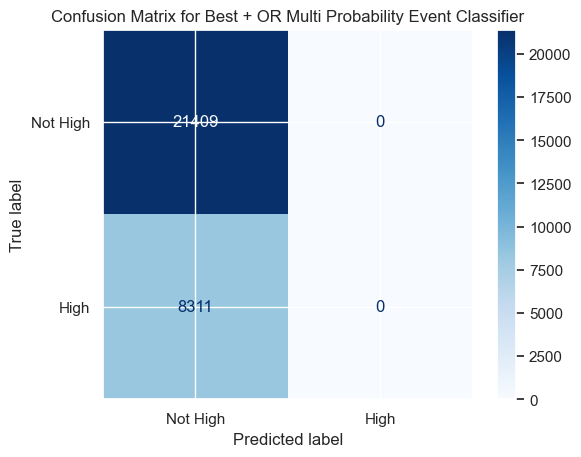

In [611]:
cm = confusion_matrix(y_comb_test, y_pred_best_comb_prob_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + OR Multi Probability Event Classifier")
plt.show()

In [612]:
print(f"precision: {precision_score(y_comb_test, y_pred_best_comb_prob_test):.3f}")
print(f"% possible trades : {100*y_pred_best_comb_prob_test.sum() / y_pred_best_comb_prob_test.shape[0]:.2f}%")
# per day 
print(f"nb trade per day : {288*y_pred_best_comb_prob_test.sum() / y_pred_best_comb_prob_test.shape[0]:.2f}")


precision: 0.000
% possible trades : 0.00%
nb trade per day : 0.00


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


- these 2 Combined events gives a good precision = 0.57 (2 trades/day)
- compared best comb precsion = 0.55 (2 trades/day)  
- ML Model precision on Test data : 0.51 (33 trades/day)

CONCLUSION : 
- ML model can be enough for global prediction but maybe too low win rate ?
- These best 2 combined event give a very good precision but not enough possible trades ?

##### Best comb2 + OR multi comb2

In [613]:
import functools
import operator

In [614]:
df_best_comb["event_p_high"].unique()

array([23143, 23132])

In [615]:
set(list(df_best_comb["event_p_high"].unique()) + list(df_best_comb["event_1"].unique()))

{np.int64(23132),
 np.int64(23143),
 np.int64(27454),
 np.int64(27456),
 np.int64(27457),
 np.int64(27461),
 np.int64(27464),
 np.int64(29969),
 np.int64(29971),
 np.int64(29972),
 np.int64(29976),
 np.int64(29979),
 np.int64(31732),
 np.int64(31734),
 np.int64(31735),
 np.int64(31739),
 np.int64(31742),
 np.int64(35918),
 np.int64(35920),
 np.int64(35928),
 np.int64(44018),
 np.int64(44025),
 np.int64(47941),
 np.int64(55505),
 np.int64(55506),
 np.int64(55510),
 np.int64(59158),
 np.int64(59160),
 np.int64(59161),
 np.int64(59165),
 np.int64(59168),
 np.int64(66214),
 np.int64(66216),
 np.int64(66217),
 np.int64(66221),
 np.int64(66224),
 np.int64(72938),
 np.int64(72940),
 np.int64(72941),
 np.int64(72945),
 np.int64(72948),
 np.int64(76178),
 np.int64(76180),
 np.int64(76181),
 np.int64(76185),
 np.int64(76188),
 np.int64(82419),
 np.int64(82421),
 np.int64(82422),
 np.int64(82426),
 np.int64(85422),
 np.int64(85424),
 np.int64(85425),
 np.int64(85429),
 np.int64(91198),
 np.int64(

In [616]:
df_best_comb.iloc[-1]["event_p_high"]

np.float64(23143.0)

In [617]:
print(df_combined_condition[df_best_comb.iloc[1]["event_p_high"]].sum())
print(df_combined_condition[df_best_comb.iloc[1]["event_1"]].sum())
print(
    (df_combined_condition[df_best_comb.iloc[1]["event_1"]] & 
    df_combined_condition[df_best_comb.iloc[1]["event_p_high"]]).sum()
)

4518
3651
253


In [618]:
print(df_combined_condition_test[df_best_comb.iloc[1]["event_p_high"]].sum())
print(df_combined_condition_test[df_best_comb.iloc[1]["event_1"]].sum())
print(
    (df_combined_condition_test[df_best_comb.iloc[1]["event_1"]] & 
    df_combined_condition_test[df_best_comb.iloc[1]["event_p_high"]]).sum()
)

513
0
0


In [619]:
nb_or_event = 100

TRAIN precision:  0.5064935064935064


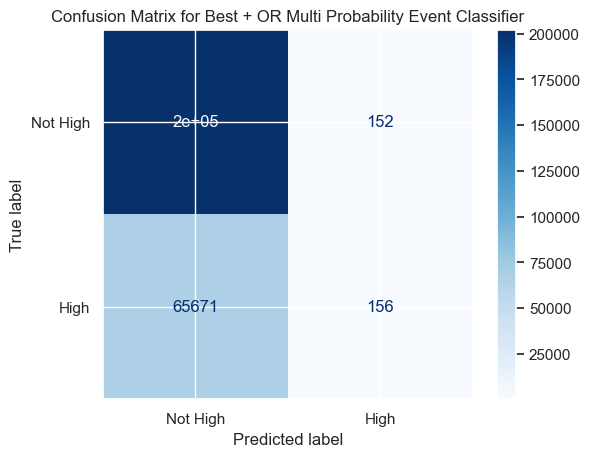

In [620]:
# 1. Create a generator expression that yields the result of the AND
#    operation for each pair of columns from df_best_comb.
and_results_generator = (
    df_combined_condition[row.event_p_high] & df_combined_condition[row.event_1]
    for row in df_best_comb.head(nb_or_event).itertuples()
)
y_pred_best_comb_or_prob = functools.reduce(operator.or_, and_results_generator)
cm = confusion_matrix(y_comb, y_pred_best_comb_or_prob, labels=[False, True])
print("TRAIN precision: ", cm[1][1]/(cm[0][1]+cm[1][1]))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + OR Multi Probability Event Classifier")
plt.show()

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/2836078962.py:11: RuntimeWarning: invalid value encountered in scalar divide
  print("TEST precision: ", cm[1][1]/(cm[0][1]+cm[1][1]))


TEST precision:  nan


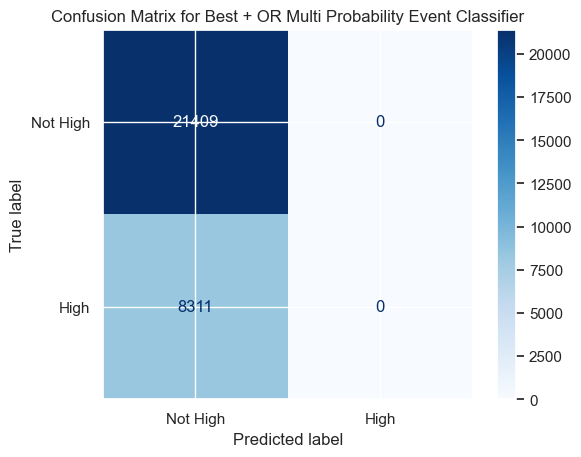

In [621]:
# 1. Create a generator expression that yields the result of the AND
#    operation for each pair of columns from df_best_comb.
and_results_generator = (
    df_combined_condition_test[row.event_p_high] & df_combined_condition_test[row.event_1]
    for row in df_best_comb.head(nb_or_event).itertuples()
)
y_pred_best_comb_or_prob_test = functools.reduce(operator.or_, and_results_generator)
# The variable `y_pred_best_comb_or_prob_test` now holds the final result.

cm = confusion_matrix(y_comb_test, y_pred_best_comb_or_prob_test, labels=[False, True])
print("TEST precision: ", cm[1][1]/(cm[0][1]+cm[1][1]))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + OR Multi Probability Event Classifier")
plt.show()

##### All Best comb2 Max

In [622]:

df_best_comb

,prob,event_p_high,event_1
99,0.509881,23143,76185
98,0.509881,23143,76178
97,0.509881,23143,76180
96,0.509881,23143,76181
95,0.509881,23143,76188
...,...,...,...
30,0.505882,23143,72948
29,0.505882,23143,82421
28,0.505882,23143,59158
27,0.505882,23143,156996


In [623]:
df_combined_condition_test

,72,74,77,81,87,92,169,171,174,178,...,160895,161006,161011,161015,161152,161157,161176,161180,161202,161215
date_ETH,,,,,,,,,,,,,,,,,,,,,
2025-07-20 12:10:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:15:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:20:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:25:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-10-31 16:25:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-10-31 16:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-10-31 16:35:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


On TRAIN:
precision: 0.506
% possible trades : 0.115%
nb trade per day : 0.33
On TEST:
precision: 0.000
% possible trades : 0.000%
nb trade per day : 0.00


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


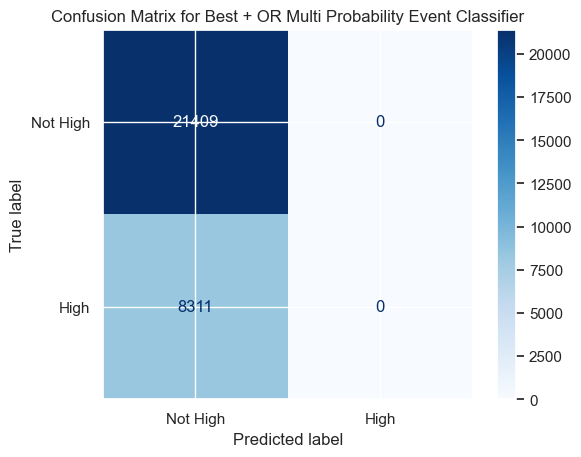

In [624]:
# create a new dataframe to have each double event
# for each double event (event_p_high and event_1), check if double event in df_best_comb is in X_rf_test
# instead of have true or false, give the value of df_best_comb.prob
prob_mdl_min = 0.33
# on TRAIN:
df_best_comb_events_in_train = pd.DataFrame(index=df_combined_condition.index)
for i, row in df_best_comb.iterrows():
    event_p_high = row["event_p_high"]
    event_1 = row["event_1"]
    df_best_comb_events_in_train[f"comb_{i}"] = (df_combined_condition[event_p_high] & df_combined_condition[event_1]) * row["prob"]
y_pred_max_comb2_train = df_best_comb_events_in_train.max(axis=1) > prob_mdl_min
# on TEST:
df_best_comb_events_in_test = pd.DataFrame(index=df_combined_condition_test.index)
for i, row in df_best_comb.iterrows():
    event_p_high = row["event_p_high"]
    event_1 = row["event_1"]
    df_best_comb_events_in_test[f"comb_{i}"] = (df_combined_condition_test[event_p_high] & df_combined_condition_test[event_1]) * row["prob"]
y_pred_max_comb2_test = df_best_comb_events_in_test.max(axis=1) > prob_mdl_min

cm = confusion_matrix(y_comb_test, y_pred_max_comb2_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + OR Multi Probability Event Classifier")
print("On TRAIN:")
print(f"precision: {precision_score(y_comb, y_pred_max_comb2_train):.3f}")
print(f"% possible trades : {100*y_pred_max_comb2_train.sum() / y_pred_max_comb2_train.shape[0]:.3f}%")
# per day
print(f"nb trade per day : {288*y_pred_max_comb2_train.sum() / y_pred_max_comb2_train.shape[0]:.2f}")
print("On TEST:")
print(f"precision: {precision_score(y_comb_test, y_pred_max_comb2_test):.3f}")
print(f"% possible trades : {100*y_pred_max_comb2_test.sum() / y_pred_max_comb2_test.shape[0]:.3f}%")
# per day
print(f"nb trade per day : {288*y_pred_max_comb2_test.sum() / y_pred_max_comb2_test.shape[0]:.2f}")

plt.show()

=> Not better than "Best comb2 + OR multi comb2"

##### All Best comb2 Mean

In [625]:
(df_best_comb_events_in_test > 0).sum(axis=1)

date_ETH
2025-07-20 12:10:00    0
2025-07-20 12:15:00    0
2025-07-20 12:20:00    0
2025-07-20 12:25:00    0
2025-07-20 12:30:00    0
                      ..
2025-10-31 16:25:00    0
2025-10-31 16:30:00    0
2025-10-31 16:35:00    0
2025-10-31 16:40:00    0
2025-10-31 16:45:00    0
Length: 29720, dtype: int64

precision: 0.000
% possible trades : 0.000%
nb trade per day : 0.00


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


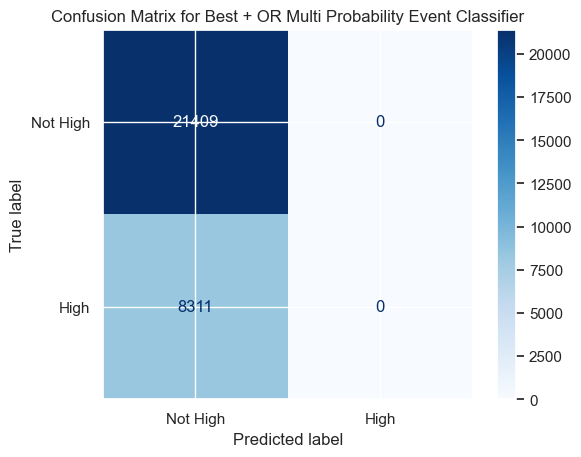

In [626]:

y_pred_mean_comb2_test = df_best_comb_events_in_test.sum(axis=1) / (df_best_comb_events_in_test > 0).sum(axis=1) > 0.4

cm = confusion_matrix(y_comb_test, y_pred_mean_comb2_test, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Best + OR Multi Probability Event Classifier")

print(f"precision: {precision_score(y_comb_test, y_pred_mean_comb2_test):.3f}")
print(f"% possible trades : {100*y_pred_mean_comb2_test.sum() / y_pred_mean_comb2_test.shape[0]:.3f}%")
# per day
print(f"nb trade per day : {288*y_pred_mean_comb2_test.sum() / y_pred_mean_comb2_test.shape[0]:.2f}")

plt.show()

=> Same as multi comb2 OR  == BEST RESULT

### Max Prob Model
We take the max prob of all 3-events-comb 

- 27000 events (nb occ>8000 and p_high > 0.4) 


In [627]:
df_prob_comb_high_event

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
72,1454,1124,1435,0.362322,0.280090,84.484096,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,64,170,76,30,0.182403,0.567164,0.967742
74,1166,891,1104,0.368871,0.281873,73.529412,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,40,136,62,29,0.145923,0.462687,0.935484
77,2691,2339,2638,0.350939,0.305034,49.266004,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,min_low_2_ETH_cat,low,56,434,128,31,0.465665,0.955224,1.000000
81,1570,1220,1523,0.364016,0.282866,87.813620,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,68,186,79,30,0.199571,0.589552,0.967742
87,1683,1307,1629,0.364365,0.282962,94.565886,max_high_3_ETH_cat,low,70,max_high_3_ETH_cat,...,71,rsi_2_BTC_cat,high,71,197,83,30,0.211373,0.619403,0.967742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161157,2355,1923,2372,0.354135,0.289173,87.248247,ichi_kijun_ETH_cat,low,56,rsi_1_BTC_cat,...,64,rsi_2_BTC_cat,high,70,197,89,30,0.211373,0.664179,0.967742
161176,1797,1462,1797,0.355419,0.289161,68.870819,ichi_kijun_ETH_cat,low,56,rsi_2_BTC_cat,...,71,rsi_1_ETH_cat,high,56,160,80,30,0.171674,0.597015,0.967742
161180,2488,2027,2516,0.353861,0.288295,94.139978,ichi_kijun_ETH_cat,low,56,rsi_2_BTC_cat,...,71,rsi_1_BTC_cat,high,68,207,91,30,0.222103,0.679104,0.967742
161202,1789,1459,1788,0.355242,0.289714,67.056650,ichi_kijun_ETH_cat,low,56,rsi_1_ETH_cat,...,56,rsi_2_BTC_cat,high,70,160,79,30,0.171674,0.589552,0.967742


In [628]:
# For each rows == dates in df_combined_condition index, get the max prob of events occuring using df_prob_comb_high_event.p_high probability
# knowing that : df_prob_comb_high_event have as rows the event indexes == columns of df_combined_condition

df_event_probs = df_combined_condition_test.multiply(df_prob_comb_high_event['p_high'], axis='columns')
max_prob_test = df_event_probs.max(axis=1)
max_prob_test


date_ETH
2025-07-20 12:10:00    0.0
2025-07-20 12:15:00    0.0
2025-07-20 12:20:00    0.0
2025-07-20 12:25:00    0.0
2025-07-20 12:30:00    0.0
                      ... 
2025-10-31 16:25:00    0.0
2025-10-31 16:30:00    0.0
2025-10-31 16:35:00    0.0
2025-10-31 16:40:00    0.0
2025-10-31 16:45:00    0.0
Length: 29720, dtype: float64

In [629]:
max_prob_test.describe()

count    29720.000000
mean         0.077276
std          0.148227
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          0.382434
dtype: float64

In [630]:
df_event_probs = 0

precision: 0.284
% possible trades : 2.04%
nb trade per day : 6


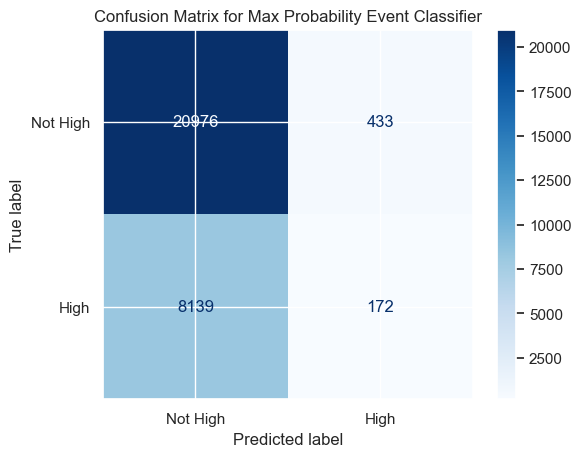

In [631]:
y_pred_max_prob = max_prob_test > 0.38

cm = confusion_matrix(y_comb_test, y_pred_max_prob, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Max Probability Event Classifier")

print(f"precision: {precision_score(y_comb_test, y_pred_max_prob):.3f}")
print(f"% possible trades : {100*y_pred_max_prob.sum() / y_pred_max_prob.shape[0]:.2f}%")
# per day 
print(f"nb trade per day : {288*y_pred_max_prob.sum() / y_pred_max_prob.shape[0]:.0f}")


plt.show()


#### On 100 best prob

In [632]:
idx_best = df_prob_comb_high_event["p_high"].sort_values(ascending=False).head(100).index.values
idx_best

array([ 23014, 141442, 145862, 153987, 154197, 141441, 154170, 141435,
       145861, 145855,  23143,  22967, 145857, 131782, 141437, 131775,
       154052, 115282, 115275, 131781,  23132, 115281,  23138, 131777,
       154000, 115277, 153999, 153961,  18678,  20705,  23024,   9462,
       136231, 153995,  18549,  18890, 136238,  18502,  18667, 141462,
        31276,  19940,   9451,  19606,  19520,  19858, 136237,  18983,
        18673,   4709,  19166,  23028,  20101,  19876,   9457,  19256,
        19345,  23077,  19709,  31275,  20846,  20915,  23015,  22961,
        19075,  20021,  19698,  19775,  19689,  19856,  19691,  19865,
        19871, 159664,  23026,  19433,   4698,  31271,  19704,  20486,
        22796, 136233,  21116,  23019,  20560,   4580,  20504,  21883,
        23011,   9286,  23021,   4704,  20499,  14118,  20493,  20484,
        22226, 141028,  22802,  36788])

In [633]:
df_prob_comb_high_event.loc[idx_best]

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,...,lag_1,feat_2,feat_2_cat,lag_2,days_with_event,weeks_with_event,months_with_event,ratio_days_with_event,ratio_weeks_with_event,ratio_months_with_event
23014,1524,1036,1425,0.382434,0.259975,186.050000,max_high_3_ETH_cat,low,56,rsi_2_BTC_cat,...,40,rsi_1_BTC_cat,high,40,123,63,29,0.131974,0.470149,0.935484
141442,1074,822,919,0.381528,0.292007,66.987342,ichi_tenkan_1_ETH_cat,low,8,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,51,25,17,0.054721,0.186567,0.548387
145862,962,751,809,0.381443,0.297780,51.980152,rsi_1_ETH_cat,high,68,atr_2_ETH_cat,...,8,rsi_2_ETH_cat,high,68,49,25,17,0.052575,0.186567,0.548387
153987,970,749,828,0.380840,0.294071,56.824898,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,64,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
154197,965,746,823,0.380821,0.294396,56.061952,atr_2_ETH_cat,high,8,rsi_2_ETH_cat,...,68,rsi_1_ETH_cat,high,56,48,25,17,0.051502,0.186567,0.548387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20484,1650,1246,1562,0.370121,0.279498,112.718232,max_high_3_ETH_cat,low,56,ichi_tenkan_1_ETH_cat,...,68,rsi_2_BTC_cat,high,64,161,75,30,0.172747,0.559701,0.967742
22226,1583,1165,1530,0.370033,0.272324,127.164483,max_high_3_ETH_cat,low,56,rsi_1_ETH_cat,...,68,rsi_2_BTC_cat,high,40,133,63,29,0.142704,0.470149,0.935484
141028,1163,944,1036,0.370029,0.300350,45.525392,ichi_tenkan_1_ETH_cat,low,8,rsi_1_ETH_cat,...,68,atr_2_ETH_cat,high,8,76,42,24,0.081545,0.313433,0.774194
22802,1637,1197,1590,0.370027,0.270570,136.626676,max_high_3_ETH_cat,low,56,min_low_2_ETH_cat,...,40,rsi_1_BTC_cat,high,40,184,103,30,0.197425,0.768657,0.967742


In [634]:
df_combined_condition_test[idx_best]

,23014,141442,145862,153987,154197,141441,154170,141435,145861,145855,...,23021,4704,20499,14118,20493,20484,22226,141028,22802,36788
date_ETH,,,,,,,,,,,,,,,,,,,,,
2025-07-20 12:10:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:15:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:20:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:25:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-07-20 12:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-10-31 16:25:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-10-31 16:30:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2025-10-31 16:35:00,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [635]:
df_event_best_probs = df_combined_condition_test[idx_best].multiply(df_prob_comb_high_event.loc[idx_best]['p_high'], axis='columns')
df_event_best_probs

,23014,141442,145862,153987,154197,141441,154170,141435,145861,145855,...,23021,4704,20499,14118,20493,20484,22226,141028,22802,36788
date_ETH,,,,,,,,,,,,,,,,,,,,,
2025-07-20 12:10:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-07-20 12:15:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-07-20 12:20:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-07-20 12:25:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-07-20 12:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-10-31 16:25:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-10-31 16:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2025-10-31 16:35:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [636]:
max_best_prob_test = df_event_best_probs.max(axis=1)
max_best_prob_test

date_ETH
2025-07-20 12:10:00    0.0
2025-07-20 12:15:00    0.0
2025-07-20 12:20:00    0.0
2025-07-20 12:25:00    0.0
2025-07-20 12:30:00    0.0
                      ... 
2025-10-31 16:25:00    0.0
2025-10-31 16:30:00    0.0
2025-10-31 16:35:00    0.0
2025-10-31 16:40:00    0.0
2025-10-31 16:45:00    0.0
Length: 29720, dtype: float64

precision: 0.284
% possible trades : 2.04%
nb trade per day : 5.86


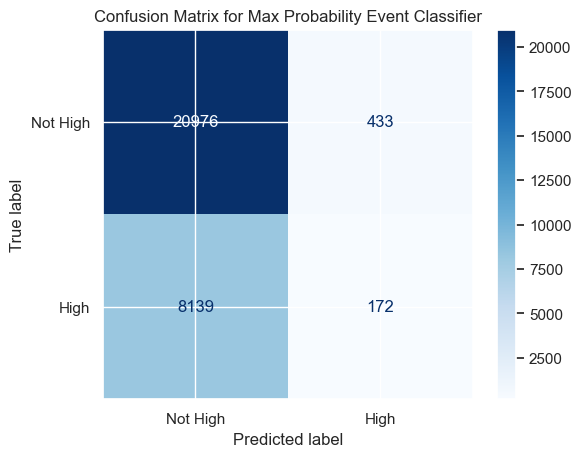

In [637]:
y_pred_max_best_prob = max_best_prob_test > 0.38

cm = confusion_matrix(y_comb_test, y_pred_max_best_prob, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Max Probability Event Classifier")

print(f"precision: {precision_score(y_comb_test, y_pred_max_best_prob):.3f}")
print(f"% possible trades : {100*y_pred_max_best_prob.sum() / y_pred_max_best_prob.shape[0]:.2f}%")
# per day 
print(f"nb trade per day : {288*y_pred_max_best_prob.sum() / y_pred_max_best_prob.shape[0]:.2f}")

plt.show()

Exact same than All max prob : logical

### Mean Prob Model

In [638]:
df_event_probs = df_combined_condition_test.multiply(df_prob_comb_high_event['p_high'], axis='columns')

df_prob_comb_high_event["p_high"]

72        0.362322
74        0.368871
77        0.350939
81        0.364016
87        0.364365
            ...   
161157    0.354135
161176    0.355419
161180    0.353861
161202    0.355242
161215    0.352933
Name: p_high, Length: 5712, dtype: float64

In [639]:
df_combined_condition_test.shape

(29720, 5712)

In [640]:
arr_sum = (df_combined_condition_test.values) @ (df_prob_comb_high_event["p_high"].values)


In [641]:
nb_true = df_combined_condition_test.sum(axis=1).values


In [642]:
arr_mean_prob = arr_sum / nb_true

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/1357966142.py:1: RuntimeWarning: invalid value encountered in divide
  arr_mean_prob = arr_sum / nb_true


precision: 0.312
% possible trades : 21.39%
nb trade per day : 61.59


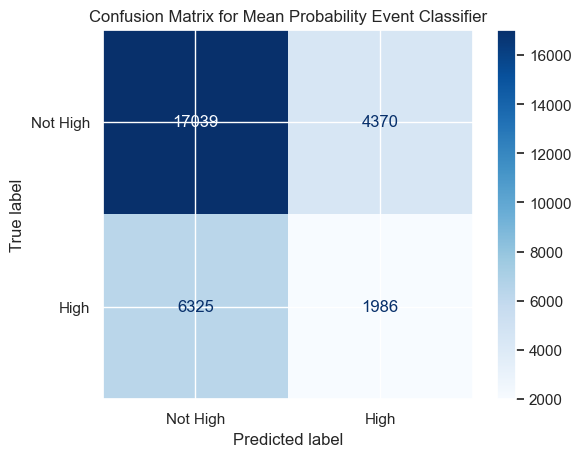

In [643]:
y_pred_mean_prob = arr_mean_prob >  0.35

cm = confusion_matrix(y_comb_test, y_pred_mean_prob, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Mean Probability Event Classifier")

print(f"precision: {precision_score(y_comb_test, y_pred_mean_prob):.3f}")
print(f"% possible trades : {100*y_pred_mean_prob.sum() / y_pred_mean_prob.shape[0]:.2f}%")
# per day
print(f"nb trade per day : {288*y_pred_mean_prob.sum() / y_pred_mean_prob.shape[0]:.2f}")

plt.show()

Better precision with mean prob model
- close to Best event : precision = 0.518

#### On 100 best prob

In [644]:
arr_best_sum = (df_combined_condition_test[idx_best].values) @ (df_prob_comb_high_event.loc[idx_best]["p_high"].values)

In [645]:
nb_best_true = df_combined_condition_test[idx_best].sum(axis=1).values

In [646]:
arr_mean_best_prob = arr_best_sum / nb_best_true

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/2913283874.py:1: RuntimeWarning: invalid value encountered in divide
  arr_mean_best_prob = arr_best_sum / nb_best_true


In [647]:
arr_mean_best_prob

array([nan, nan, nan, ..., nan, nan, nan], shape=(29720,))

precision: 0.310
% possible trades : 4.49%
nb trade per day : 12.92


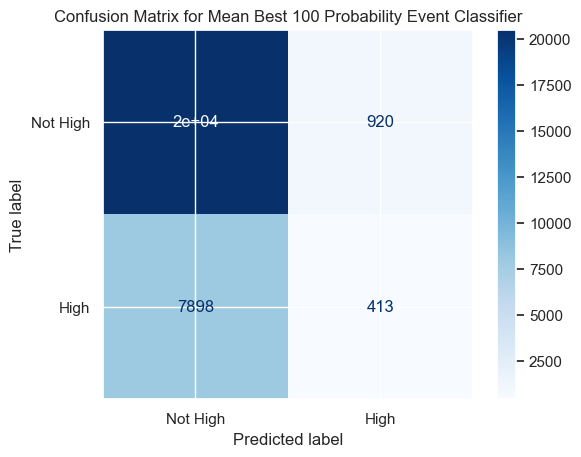

In [648]:
y_pred_mean_best_prob = arr_mean_best_prob > 0.36

cm = confusion_matrix(y_comb_test, y_pred_mean_best_prob, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Mean Best 100 Probability Event Classifier")

print(f"precision: {precision_score(y_comb_test, y_pred_mean_best_prob):.3f}")
print(f"% possible trades : {100*y_pred_mean_best_prob.sum() / y_pred_mean_best_prob.shape[0]:.2f}%")
# per day
print(f"nb trade per day : {288*y_pred_mean_best_prob.sum() / y_pred_mean_best_prob.shape[0]:.2f}")


plt.show()

Not better than all mean prob

## ML Simple features

### Last 5 min features

In [649]:
df = list_df[0]

In [650]:
df

,Close_ETH,Open_ETH,High_ETH,Low_ETH,ichi_cloud_a_ETH,ichi_cloud_b_ETH,ichi_kijun_ETH,ichi_tenkan_ETH,ichi_cloud_a_1_ETH,ichi_cloud_b_1_ETH,...,event_real_cat,impact_index_ETH_cat,impact_index_ema_1h_ETH_cat,impact_index_ema_4h_ETH_cat,impact_index_ema_24h_ETH_cat,impact_index_BTC_cat,impact_index_ema_1h_BTC_cat,impact_index_ema_4h_BTC_cat,impact_index_ema_24h_BTC_cat,Close_ETH_raw_cat
date_ETH,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,1.0,0.999782,1.000109,0.999774,0.999171,0.999736,0.998393,0.999464,2.180438,2.176148,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:05:00,1.0,0.999548,1.000008,0.999540,0.998785,0.999276,0.998113,0.999184,2.179435,2.175147,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:10:00,1.0,1.000084,1.000193,0.999841,0.998860,0.999351,0.998243,0.999477,2.179599,2.175311,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:15:00,1.0,1.000770,1.000770,0.999900,0.999669,1.000113,0.999003,1.000239,2.181260,2.176969,...,neutral,neutral,low,low,low,neutral,low,low,low,low
2023-01-01 00:20:00,1.0,0.999330,1.000025,0.999330,0.999178,0.999443,0.998335,0.999569,2.179799,2.175511,...,neutral,neutral,low,low,low,neutral,low,low,low,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-20 04:30:00,1.0,1.000300,1.001526,0.999087,0.991569,0.989072,1.000620,1.001795,0.963267,0.946999,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
2025-07-20 04:35:00,1.0,0.999746,1.000370,0.999198,0.991601,0.988821,1.000366,1.001541,0.963022,0.946759,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high
2025-07-20 04:40:00,1.0,1.000451,1.000916,0.999241,0.992160,0.989378,1.000839,1.001990,0.963454,0.947184,...,neutral,neutral,high,high,high,high,neutral,neutral,high,high


In [651]:
df["target_cat"]

date_ETH
2023-01-01 00:00:00    neutral
2023-01-01 00:05:00    neutral
2023-01-01 00:10:00    neutral
2023-01-01 00:15:00    neutral
2023-01-01 00:20:00    neutral
                        ...   
2025-07-20 04:30:00       high
2025-07-20 04:35:00       high
2025-07-20 04:40:00       high
2025-07-20 04:45:00       high
2025-07-20 04:50:00       high
Name: target_cat, Length: 268188, dtype: object

In [652]:
y_target = (df["target_cat"] == "high")

In [653]:
df_test = list_df_test[0]
y_target_test = (df_test["target_cat"] == "high")

In [654]:
X_train_sca_dat[:,-1,:].shape

(268188, 185)

In [655]:
# X_simple_train, X_simple_test, y_simple_train, y_simple_test = train_test_split(
#     X_train_sca_dat[:,-1,:],
#     y_target,
#     test_size=0.3,
#     shuffle=False
# )

In [656]:
y_target

date_ETH
2023-01-01 00:00:00    False
2023-01-01 00:05:00    False
2023-01-01 00:10:00    False
2023-01-01 00:15:00    False
2023-01-01 00:20:00    False
                       ...  
2025-07-20 04:30:00     True
2025-07-20 04:35:00     True
2025-07-20 04:40:00     True
2025-07-20 04:45:00     True
2025-07-20 04:50:00     True
Name: target_cat, Length: 268188, dtype: bool

In [657]:
y_target_test

date_ETH
2025-07-20 12:10:00    False
2025-07-20 12:15:00    False
2025-07-20 12:20:00     True
2025-07-20 12:25:00     True
2025-07-20 12:30:00    False
                       ...  
2025-10-31 16:25:00    False
2025-10-31 16:30:00    False
2025-10-31 16:35:00    False
2025-10-31 16:40:00    False
2025-10-31 16:45:00    False
Name: target_cat, Length: 29720, dtype: bool

In [658]:
X_test_sca[:,-1,:].shape

(29720, 185)

Model trained.
Accuracy on training data: 0.7545676913210136
Accuracy on test data: 0.7203566621803499
For Model RF feature simple: 
TRAIN:
precision: 0.593
% possible trades : 0.010
nb trade per day : 0.029
TEST:
precision: 0.000
% possible trades : 0.000
nb trade per day : 0.000


/Users/gregory/miniforge3/envs/openbb_02/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1706: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


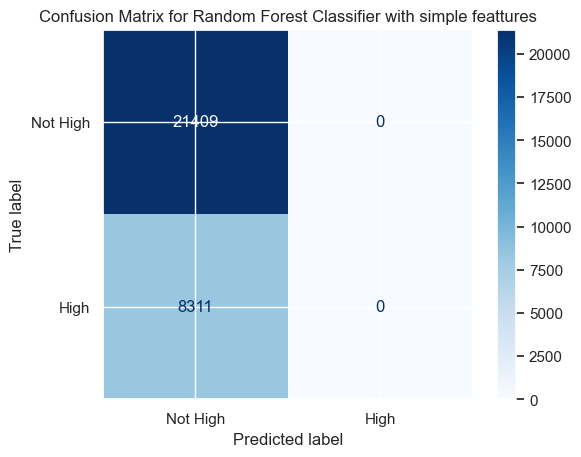

In [659]:
rf_simple = RandomForestClassifier(
        random_state=42,
        n_jobs=-1,
        n_estimators=100,
        max_depth=4,
        max_features=9,
        max_samples=0.6,
        min_samples_split=11,
        class_weight={True: 1.841, False: 1},
)
rf_simple.fit(X_train_sca_dat[:,-1,:], y_target)
print("Model trained.")
print("Accuracy on training data:", rf_simple.score(X_train_sca_dat[:,-1,:], y_target))
arr_rf_simple_pred_train = rf_simple.predict(X_train_sca_dat[:,-1,:])
print("Accuracy on test data:", rf_simple.score(X_test_sca[:,-1,:], y_target_test))
arr_rf_simple_pred = rf_simple.predict(X_test_sca[:,-1,:])
cm = confusion_matrix(y_target_test, arr_rf_simple_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Random Forest Classifier with simple feattures")

print("For Model RF feature simple: ")
print("TRAIN:")
print(f"precision: {precision_score(y_target, arr_rf_simple_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_rf_simple_pred_train) / arr_rf_simple_pred_train.shape[0]:.3f}")
print(f"nb trade per day : {288*arr_rf_simple_pred_train.sum() / arr_rf_simple_pred_train.shape[0]:.3f}")
print("TEST:")
print(f"precision: {precision_score(y_target_test, arr_rf_simple_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_rf_simple_pred) / arr_rf_simple_pred.shape[0]:.3f}")
print(f"nb trade per day : {288*arr_rf_simple_pred.sum() / arr_rf_simple_pred.shape[0]:.3f}")
plt.show()

In [660]:
# sgdc_1 = SGDClassifier(
#     loss="log_loss",
#     penalty="elasticnet",  # ou "elasticnet" si besoin de L1+L2
#     alpha=5e-2,
#     max_iter=1000,
#     tol=1e-3,
#     early_stopping=True,
#     random_state=42
# )

# sgdc_1.fit(X_simple_train, y_simple_train)
# print("Model trained.")
# print("Accuracy on training data:", sgdc_1.score(X_simple_train, y_simple_train))
# print("Accuracy on test data:", sgdc_1.score(X_simple_test, y_simple_test))


In [661]:
# arr_sgdc_1_pred = sgdc_1.predict(X_simple_test)
# cm = confusion_matrix(y_simple_test, arr_sgdc_1_pred, labels=[False, True])
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
# disp.plot(cmap=plt.cm.Blues)
# plt.title("Confusion Matrix for SGD Classifier")

# print("For Model SGDC: ")
# print(f"precision: {precision_score(y_simple_test, arr_sgdc_1_pred):.2f}")
# print(f"% possible trades : {100*np.sum(arr_sgdc_1_pred) / arr_sgdc_1_pred.shape[0]:.2f}")
# # per day
# print(f"nb trade per day : {288*arr_sgdc_1_pred.sum() / arr_sgdc_1_pred.shape[0]:.0f}")
# plt.show()

Conclusion : With only the last 5 min as features and the normal feature, the result is not better than with event cat

## Clustering
- Clustering is done with selected combined events (1160 for strat 3) (from df_combined)

In [662]:
n_components = 666 # 666 comp => 110 Go Memory !!!!
random_state = 42


In [663]:
# check hash pca
# check hash
#path_df_probability_filtered = os.path.join(path_data, 'df_probability_filtered.pkl')
mode_redo_pca, hash_pca = check_hash_inputs(
     (df_combined_condition, 
      n_components, 
      random_state,
     ),
     path_hash_pca,
)

hash not match : mode REDO


In [664]:
df_combined_condition.shape

(268188, 5712)

In [665]:
from sklearn.decomposition import PCA
from sklearn.cluster import MiniBatchKMeans
if mode_redo_pca:
    print("PCA fitting...")
    pca = PCA(n_components=n_components, random_state=random_state)
    # X_rf_train, X_rf_test, y_rf_train, y_rf_test
    pca.fit(df_combined_condition)
    save_hash(path_hash_pca, hash_pca)
    joblib.dump(pca, path_pca)
    print("PCA saved.")
else:
    # load PCA
    print("Load PCA")
    pca = joblib.load(path_pca)


PCA fitting...
PCA saved.


In [666]:
pca

,n_components,666
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,42


Variance cumulée par nombre de composantes :


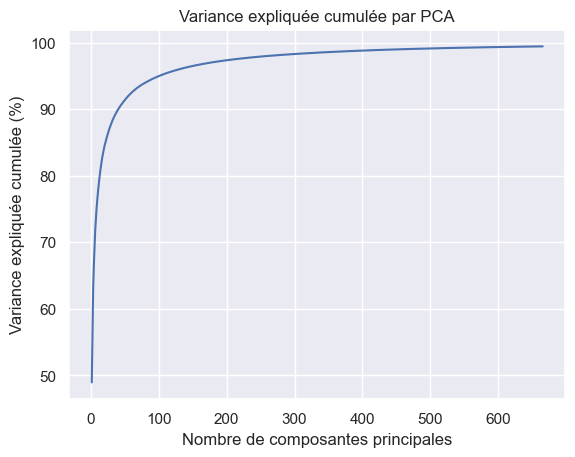

In [667]:

# Affichage de la variance cumulée en pourcentage
cum_var = np.cumsum(pca.explained_variance_ratio_) * 100
print("Variance cumulée par nombre de composantes :")

# Graphique optionnel de la variance expliquée
plt.plot(range(1, len(cum_var)+1), cum_var)
plt.xlabel("Nombre de composantes principales")
plt.ylabel("Variance expliquée cumulée (%)")
plt.title("Variance expliquée cumulée par PCA")
plt.grid(True)
plt.show()

In [668]:
cum_var

array([48.93361917, 56.54709376, 62.96985528, 66.43566953, 69.10150401,
       71.73135827, 73.47545415, 75.01975029, 76.28901732, 77.45645448,
       78.53395504, 79.44349145, 80.30497838, 81.08923284, 81.86170324,
       82.50795723, 83.07970556, 83.60493973, 84.10473975, 84.56437455,
       84.96009865, 85.34965719, 85.72571903, 86.08739453, 86.44526119,
       86.76914387, 87.07947451, 87.37229675, 87.65086304, 87.92216824,
       88.17532182, 88.41351076, 88.64484822, 88.86765685, 89.08192527,
       89.27572534, 89.46522312, 89.65294306, 89.83283981, 89.99804255,
       90.16028922, 90.31703323, 90.46764629, 90.61432036, 90.75644638,
       90.89478345, 91.03052784, 91.16350313, 91.29455129, 91.42158059,
       91.54524587, 91.66550578, 91.7832514 , 91.89992105, 92.01192247,
       92.12061986, 92.22432945, 92.32504938, 92.42481265, 92.52308774,
       92.61864891, 92.70978864, 92.79974986, 92.88576656, 92.97024881,
       93.05218479, 93.13213981, 93.20877762, 93.28337025, 93.35

In [669]:
# 3. Choix du nombre de composantes correspondant à x% de variance expliquée
print(f"Choix de {n_components} composantes permet d atteindre {cum_var[n_components-1]}% de variance expliquée.")

X_pca = pca.transform(df_combined_condition)

Choix de 666 composantes permet d atteindre 99.44290323812866% de variance expliquée.


In [670]:

#kmeans = MiniBatchKMeans(n_clusters=5, random_state=42)

#from sklearn.cluster import KMeans 
kmeans = MiniBatchKMeans(n_clusters=5, random_state=42)

kmeans.fit(X_pca)

,n_clusters,5
,init,'k-means++'
,max_iter,100
,batch_size,1024
,verbose,0
,compute_labels,True
,random_state,42
,tol,0.0
,max_no_improvement,10
,init_size,None
,n_init,'auto'


In [671]:
arr_labels = kmeans.labels_
X_pca_test = pca.transform(df_combined_condition_test)
arr_labels_test = kmeans.predict(X_pca_test)
df_comb_cluster = df_combined_condition.copy()

df_comb_cluster["cluster"] = arr_labels
df_comb_cluster_test = df_combined_condition_test.copy()                                      
df_comb_cluster_test["cluster"] = arr_labels_test
# # add train columns
# df_combined_condition["Train"] = [True]*df_combined_condition.shape[0] + [False]*df_combined_condition_test.shape[0]
# df_combined_condition

In [672]:
# Calculate prob of target "high" for each cluster on Train
nb_train = df_comb_cluster.shape[0]
df_cluster_prob = df_comb_cluster.groupby("cluster").apply(
    lambda g: pd.Series({
        "p_high": ((list_df[0]["target_cat"] == "high")[g.index]).mean(),
        "count": g.shape[0],
        "percentage": 100 * g.shape[0] / nb_train,
    })
).reset_index()
df_cluster_prob

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/3131942354.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_cluster_prob = df_comb_cluster.groupby("cluster").apply(


,cluster,p_high,count,percentage
0,0,0.340381,20101.0,7.495115
1,1,0.315930,17238.0,6.427581
2,2,0.360011,6997.0,2.608991
3,3,0.225537,220086.0,82.064074
4,4,0.366968,3766.0,1.404239


n_comp = 264, n_clusters = 20, p_high = 0.518, occ = 11806, percent occ = 6.64 %  
n_comp = 200, n_clusters = 20, p_high = 0.517, occ = 12900, percent occ = 7.26 %


In [673]:
# same for Test
nb_test = df_comb_cluster_test.shape[0]
df_cluster_prob_test = df_comb_cluster_test.groupby("cluster").apply(
    lambda g: pd.Series({
        "p_high": ((list_df_test[0]["target_cat"] == "high")[g.index]).mean(),
        "count": g.shape[0],
        "percentage": 100 * g.shape[0] / nb_test,
    })
).reset_index()
df_cluster_prob_test

/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_3366/3350268261.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_cluster_prob_test = df_comb_cluster_test.groupby("cluster").apply(


,cluster,p_high,count,percentage
0,0,0.325252,2186.0,7.355316
1,1,0.305556,2016.0,6.783311
2,2,0.300654,612.0,2.059219
3,3,0.273027,24906.0,83.802153


In [674]:
from sklearn.metrics import calinski_harabasz_score
calinski_harabasz_score(X_pca, arr_labels)

66539.88183162211

In [675]:
from sklearn.metrics import davies_bouldin_score
davies_bouldin_score(X_pca, arr_labels)

3.0740427063856948

In [751]:
# redo kmeans with n clusters to prepare find the best n_clusters
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
nb_clusters_min = 5
nb_clusters_max = 200
nb_cluster_step = 5
list_ser_cluster = []
list_ser_cluster_test = []
list_silhouette_score = []
list_ch_score = []
list_db_score = []
for n_clusters in range(nb_clusters_min, nb_clusters_max, nb_cluster_step):
    kmeans = MiniBatchKMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X_pca)
    arr_labels = kmeans.labels_
    #silh_score = silhouette_score(X_pca, arr_labels)
    #ch_score = calinski_harabasz_score(X_pca, arr_labels)
    #list_silhouette_score.append(silh_score)
    #list_ch_score.append(ch_score)
    db_score = davies_bouldin_score(X_pca, arr_labels)
    list_db_score.append(db_score)
    print(f"k means on n_clusters = {n_clusters} / davies_bouldin_score: {db_score}")
    arr_labels_test = kmeans.predict(X_pca_test)

    list_ser_cluster.append(
        pd.Series(
            arr_labels, 
            index=df_comb_cluster.index,
            name=f"cluster_{n_clusters}",
        )
    )
    list_ser_cluster_test.append(
        pd.Series(
            arr_labels_test, 
            index=df_comb_cluster_test.index,
            name=f"cluster_{n_clusters}",
        )
    )


print("Adding clusters to df_comb_cluster")
#  concat only on columns not in list_ser_cluster
columns_to_keep = df_comb_cluster.columns.difference(
    [ser.name for ser in list_ser_cluster]
)
df_comb_cluster = pd.concat(
    [df_comb_cluster.filter(columns_to_keep, axis=1)] + list_ser_cluster, axis=1)

columns_to_keep = df_comb_cluster_test.columns.difference(
    [ser.name for ser in list_ser_cluster_test]
)
df_comb_cluster_test = pd.concat(
    [df_comb_cluster_test.filter(columns_to_keep, axis=1)] + list_ser_cluster_test, axis=1)

k means on n_clusters = 5 / davies_bouldin_score: 3.0740427063856948
k means on n_clusters = 10 / davies_bouldin_score: 2.481350612715633
k means on n_clusters = 15 / davies_bouldin_score: 3.5581395808652077
k means on n_clusters = 20 / davies_bouldin_score: 4.284932799639323
k means on n_clusters = 25 / davies_bouldin_score: 3.1736720077535825
k means on n_clusters = 30 / davies_bouldin_score: 3.281399884642663
k means on n_clusters = 35 / davies_bouldin_score: 3.1691668114919094
k means on n_clusters = 40 / davies_bouldin_score: 3.23961975873681
k means on n_clusters = 45 / davies_bouldin_score: 3.0497283747624135
k means on n_clusters = 50 / davies_bouldin_score: 3.102596828917525
k means on n_clusters = 55 / davies_bouldin_score: 3.0986877769604155
k means on n_clusters = 60 / davies_bouldin_score: 3.243940503558629
k means on n_clusters = 65 / davies_bouldin_score: 3.0910729102145114
k means on n_clusters = 70 / davies_bouldin_score: 2.94601644532501
k means on n_clusters = 75 / d

In [752]:
# b_train = df_combined_condition["Train"]
ser_high_train = list_df[0]["target_cat"] == "high"

# b_test = ~df_combined_condition["Train"]
ser_high_test = list_df_test[0]["target_cat"] == "high"


In [773]:
df_comb_cluster.shape[0]*1/3/288

310.40277777777777

In [778]:
# find best nb cluster with p_high > p_high_min & count > nb_count_min:
p_high_min = 0.4
nb_count_min = 300
best_cluster_tot = None

for n_clusters in range(nb_clusters_min, nb_clusters_max, nb_cluster_step):
    #df_combined_condition[f"cluster_{n_clusters}"] = np.concatenate([arr_labels, arr_labels_test])
    # Calculate prob of target "high" for each cluster on Train
    df_cluster_prob_train = df_comb_cluster.copy().groupby(f"cluster_{n_clusters}").apply(
        lambda g: pd.Series({
            "p_high": ((ser_high_train)[g.index]).mean(),
            "count": g.shape[0],
            "percentage": 100 * g.shape[0] / nb_train,
        })
    , include_groups=False).reset_index()
    # filter even rare trades: if p_high > p_high_min and count > nb_clusters_min
    best_cluster = df_cluster_prob_train.copy()[(df_cluster_prob_train["p_high"] > p_high_min) & (df_cluster_prob_train["count"] > nb_count_min)]
    if best_cluster.shape[0] > 0:
        best_cluster.loc[:, "nb_clusters"] = n_clusters * np.ones(best_cluster.shape[0], dtype=int)
        # rename col
        best_cluster.rename(
            columns={
                "nb_clusters":"nb_clusters",
                "cluster_"+str(n_clusters): "cluster", 
                "p_high": "p_high", 
                "count": "count", 
                "percentage": "percentage"
            }, inplace=True
        )
        # append to a dataframe
        if best_cluster_tot is None:
            best_cluster_tot = best_cluster.copy()
        else:
            best_cluster_tot = pd.concat([best_cluster_tot, best_cluster.copy()], axis=0)
        print(f"n_clusters: {n_clusters} : \n {best_cluster}")
best_cluster_tot

n_clusters: 50 : 
     cluster   p_high   count  percentage  nb_clusters
23       24  0.40231  1039.0    0.387415           50
n_clusters: 65 : 
     cluster    p_high   count  percentage  nb_clusters
10       10  0.410387   982.0    0.366161           65
53       58  0.408755  1622.0    0.604800           65
n_clusters: 70 : 
     cluster    p_high   count  percentage  nb_clusters
6         7  0.402616  1376.0    0.513073           70
49       67  0.409351  1048.0    0.390771           70
n_clusters: 75 : 
     cluster    p_high   count  percentage  nb_clusters
25       25  0.406305   571.0    0.212910           75
55       71  0.402290  1310.0    0.488463           75
n_clusters: 100 : 
    cluster    p_high   count  percentage  nb_clusters
5        5  0.400596  1006.0     0.37511          100
n_clusters: 110 : 
     cluster    p_high  count  percentage  nb_clusters
10       10  0.401429  700.0    0.261011          110
19       20  0.403491  974.0    0.363178          110
n_clusters:

,cluster,p_high,count,percentage,nb_clusters
23,24,0.402310,1039.0,0.387415,50
10,10,0.410387,982.0,0.366161,65
53,58,0.408755,1622.0,0.604800,65
6,7,0.402616,1376.0,0.513073,70
49,67,0.409351,1048.0,0.390771,70
25,25,0.406305,571.0,0.212910,75
55,71,0.402290,1310.0,0.488463,75
5,5,0.400596,1006.0,0.375110,100
10,10,0.401429,700.0,0.261011,110
19,20,0.403491,974.0,0.363178,110


In [754]:
#df_comb_cluster_test = df_combined_condition_test.copy()

In [779]:
# calculate p_high_test on each cluster_{nb_clusters}, n_cluster for best_cluster_tot
best_cluster_test = None
best_cluster_tot_test = best_cluster_tot.copy()
for n_clusters in best_cluster_tot["nb_clusters"].unique():
    #b_n_cluster = df_combined_condition[f"cluster_{n_clusters}"] == n_clusters
    list_cluster_in = best_cluster_tot[best_cluster_tot["nb_clusters"] == n_clusters]["cluster"].unique()
    b_n_cluster = df_comb_cluster_test[f"cluster_{n_clusters}"].isin(list_cluster_in)
    # Calculate prob of target "high" for each cluster on Test
    df_cluster_prob_test = df_comb_cluster_test.copy().loc[b_n_cluster].groupby(f"cluster_{n_clusters}").apply(
        lambda g: pd.Series({
            "p_high_test": ((ser_high_test)[g.index]).mean(),
            "count_test": g.shape[0],
            "percentage_test": 100 * g.shape[0] / nb_test,
        })
    , include_groups=False).reset_index()
    df_cluster_prob_test.loc[:, "nb_clusters"] = n_clusters * np.ones(df_cluster_prob_test.shape[0], dtype=int)
    df_cluster_prob_test.rename(
            columns={
                "cluster_"+str(n_clusters): "cluster", 
            }, inplace=True
    )
    #print("test :")
    #print(df_cluster_prob_test)
    # concat best_cluster_tot_test with df_cluster_prob_test on nb_clusters and cluster
    # append to a dataframe
    if best_cluster_test is None:
         best_cluster_test = df_cluster_prob_test.copy()
    else:
        best_cluster_test = pd.concat([best_cluster_test, df_cluster_prob_test], axis=0)
# merge with best_cluster_tot
best_cluster_tot_test = best_cluster_tot_test.merge(
    best_cluster_test,
    left_on=["nb_clusters", "cluster"],
    right_on=["nb_clusters", "cluster"],
    how="left",
)

best_cluster_tot = best_cluster_tot_test.copy()
best_cluster_tot

,cluster,p_high,count,percentage,nb_clusters,p_high_test,count_test,percentage_test
0,24,0.402310,1039.0,0.387415,50,0.345455,55.0,0.185061
1,10,0.410387,982.0,0.366161,65,0.340000,50.0,0.168237
2,58,0.408755,1622.0,0.604800,65,0.194030,67.0,0.225437
3,7,0.402616,1376.0,0.513073,70,0.184211,76.0,0.255720
4,67,0.409351,1048.0,0.390771,70,0.360656,61.0,0.205249
5,25,0.406305,571.0,0.212910,75,0.511628,86.0,0.289367
6,71,0.402290,1310.0,0.488463,75,NaN,NaN,NaN
7,5,0.400596,1006.0,0.375110,100,0.369863,73.0,0.245626
8,10,0.401429,700.0,0.261011,110,0.222857,175.0,0.588829
9,20,0.403491,974.0,0.363178,110,0.340426,47.0,0.158143


In [780]:
best_cluster_tot.sort_values(by="p_high", ascending=False).head(60)

,cluster,p_high,count,percentage,nb_clusters,p_high_test,count_test,percentage_test
36,164,0.450450,444.0,0.165556,185,NaN,NaN,NaN
34,116,0.414141,594.0,0.221486,185,0.185185,27.0,0.090848
33,21,0.414091,809.0,0.301654,185,0.387097,62.0,0.208614
37,135,0.413015,753.0,0.280773,190,0.190476,42.0,0.141319
27,68,0.411667,600.0,0.223724,165,0.178571,28.0,0.094213
24,155,0.411405,982.0,0.366161,160,0.375000,56.0,0.188425
18,139,0.410689,711.0,0.265113,140,0.230769,195.0,0.656124
12,96,0.410602,1113.0,0.415007,120,0.362319,69.0,0.232167
20,141,0.410473,1184.0,0.441481,145,0.210526,38.0,0.127860
1,10,0.410387,982.0,0.366161,65,0.340000,50.0,0.168237


In [781]:
best_cluster_tot.sort_values(by="p_high_test", ascending=False).head(60)

,cluster,p_high,count,percentage,nb_clusters,p_high_test,count_test,percentage_test
22,121,0.405650,885.0,0.329992,160,1.000000,2.0,0.006729
5,25,0.406305,571.0,0.212910,75,0.511628,86.0,0.289367
14,119,0.407895,912.0,0.340060,130,0.391304,69.0,0.232167
33,21,0.414091,809.0,0.301654,185,0.387097,62.0,0.208614
24,155,0.411405,982.0,0.366161,160,0.375000,56.0,0.188425
7,5,0.400596,1006.0,0.375110,100,0.369863,73.0,0.245626
10,7,0.403116,1027.0,0.382940,115,0.363636,66.0,0.222073
12,96,0.410602,1113.0,0.415007,120,0.362319,69.0,0.232167
4,67,0.409351,1048.0,0.390771,70,0.360656,61.0,0.205249
17,51,0.405702,912.0,0.340060,140,0.358491,53.0,0.178331


### Model from clustering
- Select only best clusters with a minimum prob p_high_cluster_best
- Calculate the mean prob per group "nb_clusters"
- Calculate count for "high" target per group "nb_clusters"
- Select only group with count  > ratio_trades_cluster_best * nb_test

In [782]:
p_high_min

0.4

In [783]:
p_high_cluster_best = 0.4 # min prob high for each cluster to filter best clusters
ratio_trades_cluster_best = 1/288 # ratio trades per day per group "nb_clusters" of best prob clusters

best_cluster_tot["prod_prob"] = best_cluster_tot["p_high"] * best_cluster_tot["count"]
best_cluster_tot["prod_prob_test"] = best_cluster_tot["p_high_test"] * best_cluster_tot["count_test"]
# sumup count & prod_prob in cluster with prob > p_high_cluster_best group by nb_clusters :
best_count = best_cluster_tot[best_cluster_tot["p_high"] > p_high_cluster_best].filter(
    ["nb_clusters", "count", "prod_prob", "count_test", "prod_prob_test"]
    ).groupby("nb_clusters").sum()
best_count["prob"] = best_count["prod_prob"] / best_count["count"]
best_count["prob_test"] = best_count["prod_prob_test"] / best_count["count_test"]
# select only count > ratio_trades_cluster_best trades per days
best_count_final = best_count[best_count["count"] > nb_train*ratio_trades_cluster_best].sort_values(by="prob", ascending=False)
# take the first one
nb_cluster_best = best_count_final.index[0]
print(f"nb_cluster_best: {nb_cluster_best}")    # nb_cluster_best

best_count_final

nb_cluster_best: 185


,count,prod_prob,count_test,prod_prob_test,prob,prob_test
nb_clusters,,,,,,
185,2509.0,1047.0,265.0,68.0,0.417298,0.256604
120,1113.0,457.0,69.0,25.0,0.410602,0.362319
65,2604.0,1066.0,117.0,30.0,0.409370,0.256410
140,1623.0,662.0,248.0,64.0,0.407887,0.258065
135,1400.0,571.0,32.0,7.0,0.407857,0.218750
145,2262.0,921.0,115.0,33.0,0.407162,0.286957
165,1935.0,787.0,149.0,44.0,0.406718,0.295302
180,3062.0,1243.0,232.0,72.0,0.405944,0.310345
160,3572.0,1450.0,123.0,34.0,0.405935,0.276423


In [784]:
# select only the best clusters with p_high > p_high_cluster_best 
# and in group "nb_clusters" with count > nb_test*ratio_trades_cluster_best trades per day
best_cluster_select = best_cluster_tot[
    (best_cluster_tot["p_high"] > p_high_cluster_best) & 
    (best_cluster_tot["nb_clusters"].isin(
        best_count[best_count["count"] > nb_test*ratio_trades_cluster_best].index.tolist()))
]
best_cluster_select.sort_values(by="p_high", ascending=False)

,cluster,p_high,count,percentage,nb_clusters,p_high_test,count_test,percentage_test,prod_prob,prod_prob_test
36,164,0.450450,444.0,0.165556,185,NaN,NaN,NaN,200.0,NaN
34,116,0.414141,594.0,0.221486,185,0.185185,27.0,0.090848,246.0,5.0
33,21,0.414091,809.0,0.301654,185,0.387097,62.0,0.208614,335.0,24.0
37,135,0.413015,753.0,0.280773,190,0.190476,42.0,0.141319,311.0,8.0
27,68,0.411667,600.0,0.223724,165,0.178571,28.0,0.094213,247.0,5.0
24,155,0.411405,982.0,0.366161,160,0.375000,56.0,0.188425,404.0,21.0
18,139,0.410689,711.0,0.265113,140,0.230769,195.0,0.656124,292.0,45.0
12,96,0.410602,1113.0,0.415007,120,0.362319,69.0,0.232167,457.0,25.0
20,141,0.410473,1184.0,0.441481,145,0.210526,38.0,0.127860,486.0,8.0
1,10,0.410387,982.0,0.366161,65,0.340000,50.0,0.168237,403.0,17.0


In [785]:
216.0 / nb_test * 288

2.093135935397039

In [786]:
best_cluster_select

,cluster,p_high,count,percentage,nb_clusters,p_high_test,count_test,percentage_test,prod_prob,prod_prob_test
0,24,0.402310,1039.0,0.387415,50,0.345455,55.0,0.185061,418.0,19.0
1,10,0.410387,982.0,0.366161,65,0.340000,50.0,0.168237,403.0,17.0
2,58,0.408755,1622.0,0.604800,65,0.194030,67.0,0.225437,663.0,13.0
3,7,0.402616,1376.0,0.513073,70,0.184211,76.0,0.255720,554.0,14.0
4,67,0.409351,1048.0,0.390771,70,0.360656,61.0,0.205249,429.0,22.0
5,25,0.406305,571.0,0.212910,75,0.511628,86.0,0.289367,232.0,44.0
6,71,0.402290,1310.0,0.488463,75,NaN,NaN,NaN,527.0,NaN
7,5,0.400596,1006.0,0.375110,100,0.369863,73.0,0.245626,403.0,27.0
8,10,0.401429,700.0,0.261011,110,0.222857,175.0,0.588829,281.0,39.0
9,20,0.403491,974.0,0.363178,110,0.340426,47.0,0.158143,393.0,16.0


In [787]:
clusters_best = best_cluster_select[(best_cluster_select["nb_clusters"] == nb_cluster_best)]["cluster"].tolist()
df_comb_cluster["in_cluster_best"] = df_comb_cluster[f"cluster_{nb_cluster_best}"].isin(clusters_best)
df_comb_cluster_test["in_cluster_best"] = df_comb_cluster_test[f"cluster_{nb_cluster_best}"].isin(clusters_best)
best_cluster_final = best_cluster_select.copy()[(best_cluster_select["nb_clusters"] == nb_cluster_best)].sort_values(by="p_high", ascending=False)
best_cluster_final


,cluster,p_high,count,percentage,nb_clusters,p_high_test,count_test,percentage_test,prod_prob,prod_prob_test
36,164,0.450450,444.0,0.165556,185,NaN,NaN,NaN,200.0,NaN
34,116,0.414141,594.0,0.221486,185,0.185185,27.0,0.090848,246.0,5.0
33,21,0.414091,809.0,0.301654,185,0.387097,62.0,0.208614,335.0,24.0
35,130,0.401813,662.0,0.246842,185,0.221591,176.0,0.592194,266.0,39.0


#### Check on all DATA

In [688]:
# # clustering range
# nb_clusters_min = 2
# nb_clusters_max = 20
# nb_cluster_step = 1
# # selection criteria for single cluster
# p_high_min = 0.33
# nb_count_min = 700
# # selection criteria for best nb_clusters
# p_high_cluster_best = 0.333 # min prob high for each cluster to filter best clusters
# ratio_trades_cluster_best = 2/288 # ratio trades per day per group "nb_clusters" of best prob clusters
# TRAIN: True Pos. / Predicted Pos.: 1928 / 5735
# precision on Train :  0.3361813426329555
# TEST: True Pos. / Predicted Pos.: 1292 / 3645
# precision on Test :  0.3544581618655693

In [788]:
print("TRAIN: True Pos. / Predicted Pos.: " + 
 f"{np.sum(df_comb_cluster["in_cluster_best"] & ser_high_train)} / {np.sum(
        df_comb_cluster["in_cluster_best"])}"
)
print("precision on Train : ", (
    np.sum(df_comb_cluster["in_cluster_best"] & ser_high_train) / 
    np.sum(df_comb_cluster["in_cluster_best"])
    )
)
print("TEST: True Pos. / Predicted Pos.: " + 
 f"{np.sum(df_comb_cluster_test[ "in_cluster_best"] & ser_high_test)} / {np.sum(
        df_comb_cluster_test[ "in_cluster_best"])}"
)
print("precision on Test : ", (
    np.sum(df_comb_cluster_test["in_cluster_best"] & ser_high_test) / 
    np.sum(df_comb_cluster_test["in_cluster_best"])
    )
)

TRAIN: True Pos. / Predicted Pos.: 1047 / 2509
precision on Train :  0.4172977281785572
TEST: True Pos. / Predicted Pos.: 68 / 265
precision on Test :  0.25660377358490566


In [690]:
(220+122) / (464+375)

0.40762812872467225

In [789]:
ser_comb_best = df_comb_cluster.loc[df_comb_cluster[f"cluster_{nb_cluster_best}"] == best_cluster_final["cluster"].iloc[0]].filter([I for I in range(df_probability_filtered.shape[1])]
).mean(axis=0).sort_values(ascending=False).head(20)
ser_comb_best

1409    0.047297
1242    0.033784
1226    0.024775
1983    0.018018
4130    0.018018
1752    0.013514
562     0.011261
1600    0.011261
1185    0.011261
4937    0.011261
2562    0.011261
654     0.011261
4405    0.011261
4099    0.011261
4749    0.011261
4687    0.011261
2629    0.011261
835     0.011261
3712    0.011261
1519    0.011261
dtype: float64

In [790]:
df_prob_comb.loc[ser_comb_best.index]

,high,low,neutral,p_high,p_low,delta_prob,feat_0,feat_0_cat,lag_0,feat_1,feat_1_cat,lag_1,feat_2,feat_2_cat,lag_2
1409,3065,2648,3038,0.350246,0.302594,60.874847,max_high_3_ETH_cat,low,70,ichi_tenkan_1_ETH_cat,low,70,vwap_4h_ETH_cat,low,40
1242,2942,2524,2914,0.351074,0.301193,63.931211,max_high_3_ETH_cat,low,70,ichi_tenkan_1_ETH_cat,low,71,vwap_4h_ETH_cat,low,40
1226,2944,2513,2937,0.350727,0.299381,68.081730,max_high_3_ETH_cat,low,70,ichi_tenkan_1_ETH_cat,low,71,ichi_cloud_b_ETH_cat,low,8
1983,1385,1048,1477,0.354220,0.268031,93.357172,max_high_3_ETH_cat,low,70,min_low_1_ETH_cat,low,8,rsi_1_BTC_cat,high,40
4130,1245,1001,1292,0.351894,0.282928,53.015138,max_high_3_ETH_cat,low,70,vwap_4h_ETH_cat,low,40,rsi_1_BTC_cat,high,40
1752,1184,951,1245,0.350296,0.281361,50.856206,max_high_3_ETH_cat,low,70,ichi_cloud_b_ETH_cat,low,40,rsi_1_BTC_cat,high,40
562,1611,1288,1561,0.361211,0.288789,71.975854,max_high_3_ETH_cat,low,70,vwap_4h_ETH_cat,low,8,rsi_2_BTC_cat,high,71
1600,1636,1316,1589,0.360273,0.289804,69.376694,max_high_3_ETH_cat,low,70,max_high_1_ETH_cat,low,8,rsi_2_BTC_cat,high,71
1185,1682,1332,1635,0.361798,0.286513,81.287326,max_high_3_ETH_cat,low,70,max_high_0_ETH_cat,low,8,rsi_2_BTC_cat,high,71
4937,1679,1307,1627,0.363971,0.283330,92.688547,max_high_3_ETH_cat,low,71,max_high_3_ETH_cat,low,68,rsi_2_BTC_cat,high,71


#### in cluster best

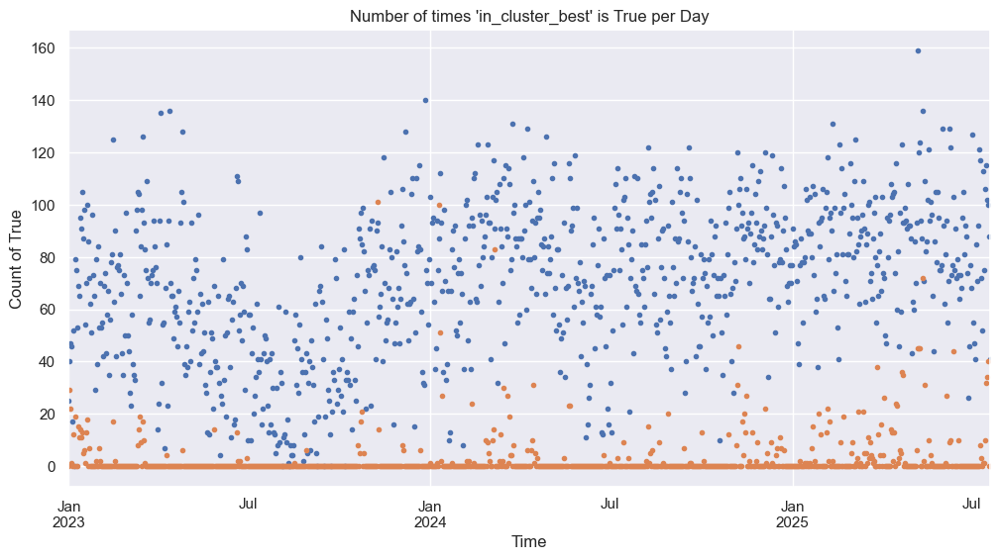

In [791]:
# by group sum every day
(list_df[0]["target_cat"] == "high").resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
df_comb_cluster["in_cluster_best"].resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")

plt.title("Number of times 'in_cluster_best' is True per Day")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)

In [792]:
df_comb_cluster["in_cluster_best"].resample("D").sum().describe()


count    932.000000
mean       2.692060
std        8.812074
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max      101.000000
Name: in_cluster_best, dtype: float64

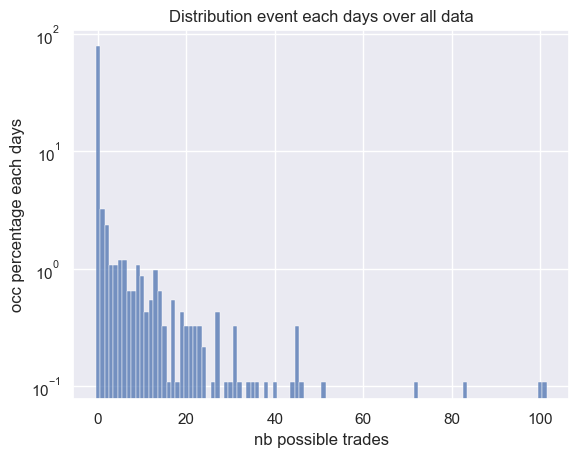

In [793]:
#df_combined_condition["in_cluster_best"].resample("D").sum()#.hist()#value_counts(ascending=True)

sns.histplot(df_comb_cluster["in_cluster_best"].resample("D").sum(), 
             discrete=True,
             stat="percent")#.hist()#value_counts(ascending=True)
# rename xlabel
ax = plt.gca()
ax.set_yscale('log')
ax.set_xlabel("nb possible trades")
ax.set_ylabel("occ percentage each days")
plt.title("Distribution event each days over all data")
plt.show()

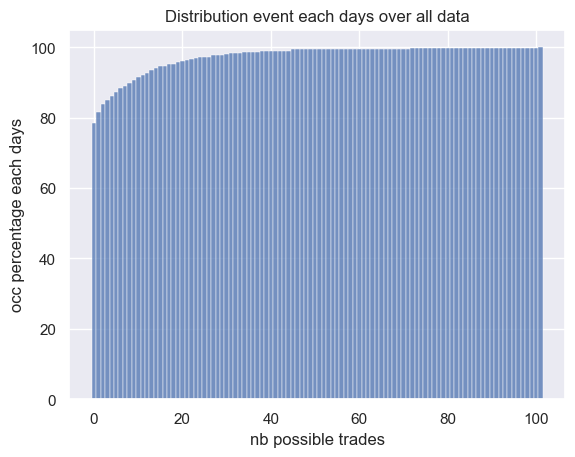

In [794]:

sns.histplot(df_comb_cluster["in_cluster_best"].resample("D").sum(), 
             discrete=True,
             cumulative=True,
             stat="percent",
)#.hist()#value_counts(ascending=True)
# rename xlabel
ax = plt.gca()
ax.set_xlabel("nb possible trades")
ax.set_ylabel("occ percentage each days")
plt.title("Distribution event each days over all data")
plt.show()

In [795]:
df_comb_cluster_test["in_cluster_best"].resample("D").sum().describe()


count    104.000000
mean       2.548077
std        6.660826
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       37.000000
Name: in_cluster_best, dtype: float64

In [796]:
df_comb_cluster_test["in_cluster_best"].resample("D").sum().value_counts()

in_cluster_best
0     81
2      3
3      2
4      2
26     2
20     2
9      2
6      2
16     1
7      1
37     1
11     1
8      1
19     1
24     1
1      1
Name: count, dtype: int64

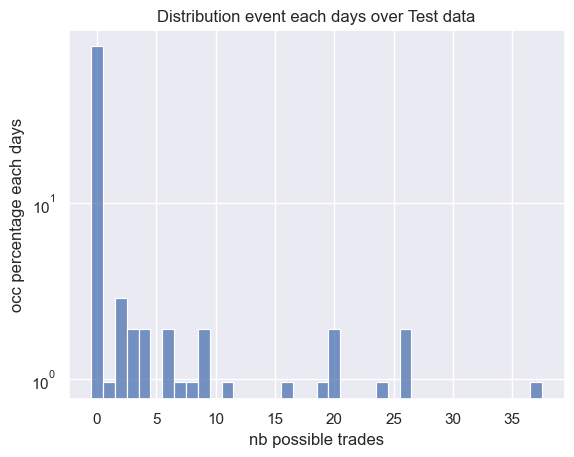

In [797]:
sns.histplot(df_comb_cluster_test["in_cluster_best"].resample("D").sum(), 
             discrete=True,
             stat="percent",
)#.hist()#value_counts(ascending=True)
# rename xlabel
ax = plt.gca()
ax.set_yscale('log')
ax.set_xlabel("nb possible trades")
ax.set_ylabel("occ percentage each days")
plt.title("Distribution event each days over Test data")
plt.show()
plt.show()

## Backtest

### Baseline

In [700]:
list_df[0]["Close_ETH_raw"]

date_ETH
2023-01-01 00:00:00    1194.540039
2023-01-01 00:05:00    1195.089966
2023-01-01 00:10:00    1195.000000
2023-01-01 00:15:00    1194.089966
2023-01-01 00:20:00    1194.890015
                          ...     
2025-07-20 04:30:00    3702.030029
2025-07-20 04:35:00    3702.969971
2025-07-20 04:40:00    3701.310059
2025-07-20 04:45:00    3700.010010
2025-07-20 04:50:00    3702.790039
Name: Close_ETH_raw, Length: 268188, dtype: float32

- BE CAREFUL : Hyperliquid for example can take 25% of trade if 0.1% is a trigger : 
  - maker fees : 0.015% (if trade out of orderbook (usually when limit order)
  - or taker fees : 0.038% (if market order)
  - funding 1h : 0.0014% ( funding rate will be positive, and the long position will pay the short position.)
  - TOTAL max 2 takers trades (open/close) + funding 1h max :  0.0774% => 77% of 0.1% !

- in 5 min candle : Close value at 8:00 ⇒ real value at 08:04:59.999

(TP*0.23) / (SL * 1.77) = Req == 2: 
- R = TP/SL
- R * 0.23 / 1.77 = Req
- R = 1.77/0.23 * Req

In [701]:
target_level

0.0045000000000000005

In [702]:
(0.45/100 - 0.0774 / 100 ) * 10000 * 10 


372.6

In [703]:
(-0.45/2/100 - 0.0774 / 100 ) * 10000 * 10


-302.40000000000003

In [704]:
(0.45/100 - 0.0774 / 100 ) / (0.45/2/100 + 0.0774 / 100 )


1.2321428571428572

In [705]:
target_level

0.0045000000000000005

In [706]:
R

2

In [707]:
df_feat_tot = pd.concat((list_df[0], list_df_test[0]))

target level for TP [-]:  0.0045000000000000005
R TP/SL [-]:  2
r_fees %fees/%TP [-]:  0.17199999999999996
R_eq [-]:  1.2321428571428572
leverage [-]:  8.269576962347871
Gain for one TP [$]:  307.9804229342824
Loss for one SL [$]:  -250.0
Capital init [$] 10000
final capital [$]: -2794488.301003885
ratio gain final [-]:  -280.4488301003885
Winrate [-] :  0.29361825485567566
nb_tp:  14180
capital_tp [$]:  4367162.397206699
nb_sl:  28946
capital_sl [$]:  -7236500.0
nb_neutral:  5168
capital_neutral [$] 64849.30178884704


,type,date_open,buy,sell,gain,fees,capital
2023-01-01 01:15:00,Neutral,2023-01-01 00:00:00,1194.540039,1194.369995,-75.773794,64.001970,9.924226e+03
2023-01-01 02:40:00,Neutral,2023-01-01 01:20:00,1193.660034,1195.109985,36.406005,64.045400,9.960632e+03
2023-01-01 04:05:00,Neutral,2023-01-01 02:45:00,1194.290039,1196.010010,55.042660,64.052616,1.001567e+04
2023-01-01 05:30:00,Neutral,2023-01-01 04:10:00,1195.829956,1196.160034,-41.189318,64.015359,9.974486e+03
2023-01-01 06:55:00,Neutral,2023-01-01 05:35:00,1196.170044,1197.160034,4.408765,64.033013,9.978894e+03
...,...,...,...,...,...,...,...
2025-10-31 14:05:00,SL,2025-10-31 13:55:00,3891.370000,3882.614417,-250.000000,63.934518,-2.794046e+06
2025-10-31 14:45:00,SL,2025-10-31 14:10:00,3883.090000,3874.353048,-250.000000,63.934518,-2.794296e+06
2025-10-31 14:55:00,SL,2025-10-31 14:50:00,3878.430000,3869.703532,-250.000000,63.934518,-2.794546e+06
2025-10-31 15:10:00,SL,2025-10-31 15:00:00,3861.080000,3852.392570,-250.000000,63.934518,-2.794796e+06


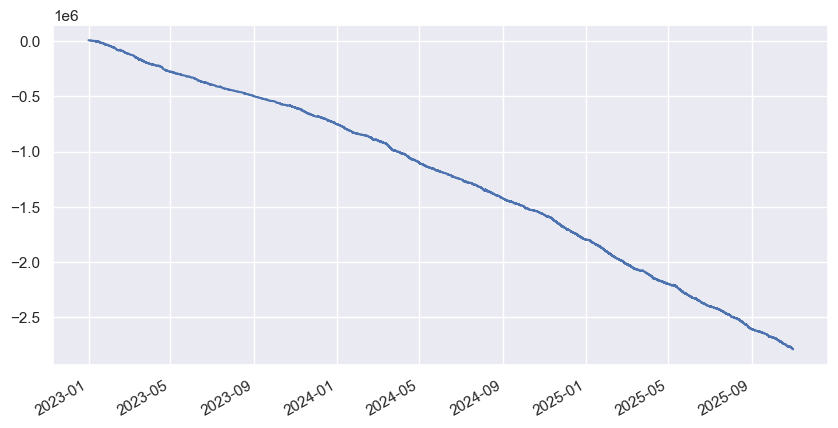

In [708]:
# 
capital_init = 10000
# strategy
step_max = FUTURE_TARGET # 1h15
tp_ratio = target_level #0.45/100 #0.1 / 100 #0.33/100
risk_ratio = 2.5/100

# trading platform
ratio_fees = 0.0774 / 100 # hyperliquid

# display
print("target level for TP [-]: ", tp_ratio)
print("R TP/SL [-]: ", R)
print("r_fees %fees/%TP [-]: ", ratio_fees / tp_ratio)
R_eq = (tp_ratio - ratio_fees) / ((tp_ratio / R) + ratio_fees)
print("R_eq [-]: ", R_eq)

def backtest(df_, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=None):
    # leverage calculation 
    #leverage = (capital_init * risk_ratio * R / tp_ratio) / capital_init
    leverage = risk_ratio /  (tp_ratio / R + ratio_fees * (1 - tp_ratio / (2 * R)))
    print('leverage [-]: ', leverage)

    # TP calculation
    fees_tp = ((1+tp_ratio) + 1) / 2 * leverage * capital_init * ratio_fees
    gain_tp = tp_ratio * leverage * capital_init - fees_tp
    # SL calculation
    fees_sl = (1 + 1-1/R*tp_ratio) / 2 * leverage * capital_init * ratio_fees
    gain_sl = -1/R*tp_ratio * leverage * capital_init - fees_sl
    print("Gain for one TP [$]: ", gain_tp)
    print("Loss for one SL [$]: ", gain_sl)
    # simulation: initialisation
    if trade_signal is None:
        buy = df_["Close_ETH_raw"].values[0] # for first trade
        list_buy = [buy]
        list_trade_date_open = [df_["Close_ETH_raw"].index[0]]
        neutral = False
    else:
        list_buy = []
        list_trade_date_open = []
        neutral = True
    tp = False
    nb_tp = 0
    capital_tp = 0
    sl = False
    nb_sl = 0
    capital_sl = 0
    
    nb_neutral = 0
    capital_neutral = 0
    capital = capital_init
    step = 0
    list_trade_gain = []
    list_trade_date = []
    list_trade_type = []
    list_trade_fees = []
    list_capital = []
    list_sell = []
    
    #list_buy.append(buy)
    # simulation calculation
    for close, high, low, date_trade in zip(
            df_["Close_ETH_raw"], 
            df_["Close_ETH_raw"] * df_["High_ETH"], 
            df_["Close_ETH_raw"] * df_["Low_ETH"],
            df_["Close_ETH_raw"].index
        ):
        
        # NEUTRAL : if elasted time to take a trade is over (more than 1 hour) : we close the position
        if step >= step_max:
            nb_neutral += 1
            fees = ( (buy + close) / 2 ) / buy * leverage * capital_init * ratio_fees
            gain = ((close - buy) / buy) * leverage * capital_init - fees
            list_trade_fees.append(fees)
            list_trade_gain.append(gain)
            list_trade_date.append(date_trade)
            list_sell.append(close)
            list_trade_type.append("Neutral")
            capital += gain
            list_capital.append(capital)
            capital_neutral += gain
            neutral = True
            step = 0
            continue

        # if trade_signal is not None:
        #     if trade_signal.at[date_trade] == True:
        #         print("Trade possible at ", date_trade)

        # if last time, we have close a position or no trade opened
        if tp or sl or neutral:
            if trade_signal is not None:
                try:
                    if trade_signal.at[date_trade] == True:
                        pass
                except:
                    print(date_trade, "is not in trade_signal")

            # if no signal used,  we open a new one immediatly (5 min after)
            if trade_signal is None:
                buy = close
                list_trade_date_open.append(date_trade)
                list_buy.append(buy)
                step = 0
                tp = False
                sl = False
                neutral = False
                continue # trade done at close
            # if trade signal is True
            elif np.any(trade_signal.at[date_trade]):
                #print("Trade opened at ", date_trade)
                buy = close
                list_trade_date_open.append(date_trade)
                list_buy.append(buy)
                step = 0
                tp = False
                sl = False
                neutral = False
                continue # trade done at close
            # if no trade signal => no trade opened
            else:
                tp = False
                sl = False
                neutral = True # to be able to check next time
                step = 0
                continue
        # TP : if max price is higher than TP, we take the trade and close position
        if high >= (1+tp_ratio) * buy:
            fees = fees_tp
            gain = gain_tp
            list_trade_fees.append(fees)
            list_trade_gain.append(gain)
            list_trade_date.append(date_trade)
            list_sell.append((1+tp_ratio)*buy)
            list_trade_type.append("TP")
            capital += gain
            list_capital.append(capital)
            capital_tp += gain
            tp = True
            nb_tp += 1
            continue
        # SL : if min price is lower than SL, we take the trade and close position
        elif low <= (1-1/R*tp_ratio) * buy: 
            fees = fees_sl
            gain = gain_sl
            list_trade_fees.append(fees)
            list_trade_gain.append(gain)
            list_trade_date.append(date_trade)
            list_sell.append((1-1/R*tp_ratio)*buy)
            list_trade_type.append("SL")
            capital +=  gain
            list_capital.append(capital)
            capital_sl +=  gain
            sl = True
            nb_sl += 1
            continue
        # no trade
        else:
            step += 1
    # results
    if trade_signal is not None:
        print("trade signal used, adding last buy & date_open")
        list_trade_date_open.append(df_["Close_ETH_raw"].index[-1])
        #list_buy.append(buy)
    if len(list_buy) > len(list_trade_date):
        list_buy = list_buy[:len(list_trade_date)]
    if len(list_trade_date_open) > len(list_trade_date):
        list_trade_date_open = list_trade_date_open[:len(list_trade_date)]
    df_trades = pd.concat([
        pd.Series(list_trade_type, index=list_trade_date, name="type"),
        pd.Series(list_trade_date_open, index=list_trade_date, name="date_open"),
        pd.Series(list_buy, index=list_trade_date, name="buy"),
        pd.Series(list_sell, index=list_trade_date, name="sell"),
        pd.Series(list_trade_gain, index=list_trade_date, name="gain"),
        pd.Series(list_trade_fees, index=list_trade_date, name="fees"),
        pd.Series(list_capital, index=list_trade_date, name="capital"),
        ],
        axis=1,
    )
    return df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral

df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(df_feat_tot, capital_init, step_max, tp_ratio, risk_ratio, ratio_fees, R)
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)

# final capital [$]: -2794488.301003885 # baseline
df_trades["capital"].plot(kind="line", figsize=(10, 5))
df_trades

### Mdl best cluster

leverage [-]:  8.269576962347871
Gain for one TP [$]:  307.9804229342824
Loss for one SL [$]:  -250.0
2024-12-12 13:00:00 is not in trade_signal
2024-12-12 13:00:00 is not in trade_signal
trade signal used, adding last buy & date_open
Capital init [$] 10000
final capital [$]: -3944.6769554236735
ratio gain final [-]:  -1.3944676955423674
Winrate [-] :  0.4
nb_tp:  210
capital_tp [$]:  64675.88881619944
nb_sl:  314
capital_sl [$]:  -78500.0
nb_neutral:  1
capital_neutral [$] -120.56577162301465


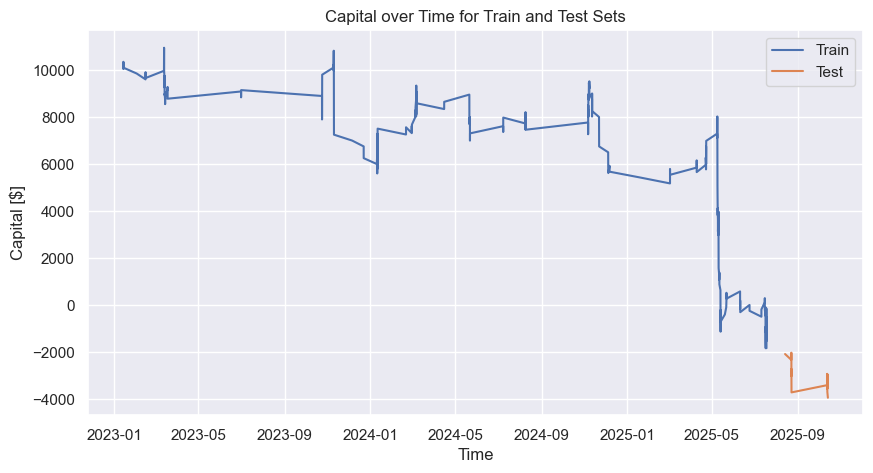

,type,date_open,buy,sell,gain,fees,capital,Train
2023-01-14 00:50:00,TP,2023-01-13 23:55:00,1547.170044,1554.132309,307.980423,64.150540,10307.980423,True
2023-01-14 01:40:00,SL,2023-01-14 00:55:00,1554.869995,1551.371538,-250.000000,63.934518,10057.980423,True
2023-01-14 02:15:00,TP,2023-01-14 01:45:00,1550.420044,1557.396934,307.980423,64.150540,10365.960846,True
2023-01-14 03:15:00,SL,2023-01-14 03:10:00,1556.250000,1552.748438,-250.000000,63.934518,10115.960846,True
2023-02-02 00:25:00,SL,2023-02-02 00:20:00,1666.069946,1662.321289,-250.000000,63.934518,9865.960846,True
...,...,...,...,...,...,...,...,...
2025-10-12 20:00:00,TP,2025-10-12 19:40:00,4159.270000,4177.986715,307.980423,64.150540,-2944.676955,False
2025-10-12 20:20:00,SL,2025-10-12 20:05:00,4175.260000,4165.865665,-250.000000,63.934518,-3194.676955,False
2025-10-12 20:35:00,SL,2025-10-12 20:25:00,4177.010000,4167.611728,-250.000000,63.934518,-3444.676955,False
2025-10-12 21:05:00,SL,2025-10-12 20:50:00,4165.010000,4155.638728,-250.000000,63.934518,-3694.676955,False


In [709]:
df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(df_feat_tot, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=pd.concat(
                 (df_comb_cluster["in_cluster_best"], 
                                     df_comb_cluster_test["in_cluster_best"])
                                 )
            )
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)


# add train test info from list_df[0]["Train"]
df_trades["Train"] = df_trades.index.isin(df_comb_cluster.index)
# plot capital for train and test
plt.figure(figsize=(10, 5))
plt.plot(df_trades[df_trades["Train"]]["capital"], label="Train")
plt.plot(df_trades[~df_trades["Train"]]["capital"], label="Test")
plt.title("Capital over Time for Train and Test Sets")
plt.xlabel("Time")
plt.ylabel("Capital [$]")
plt.legend()
plt.grid(True)
plt.show()

#final capital [$]: 9116.393289460655
df_trades

<Axes: xlabel='type', ylabel='percent'>

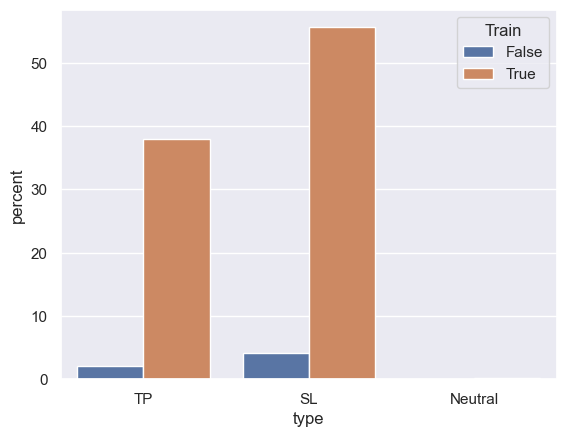

In [710]:
sns.countplot(df_trades, x="type", order=["TP", "SL", "Neutral"], hue="Train", stat="percent")

In [711]:
print("Winrate TRAIN: ", (df_trades.loc[df_trades["Train"] == True,"type"] == "TP").sum() / df_trades["Train"].sum())
print("Winrate TEST: ", (df_trades.loc[df_trades["Train"] == False,"type"] == "TP").sum() / (~df_trades["Train"]).sum())

Winrate TRAIN:  0.40447154471544716
Winrate TEST:  0.3333333333333333


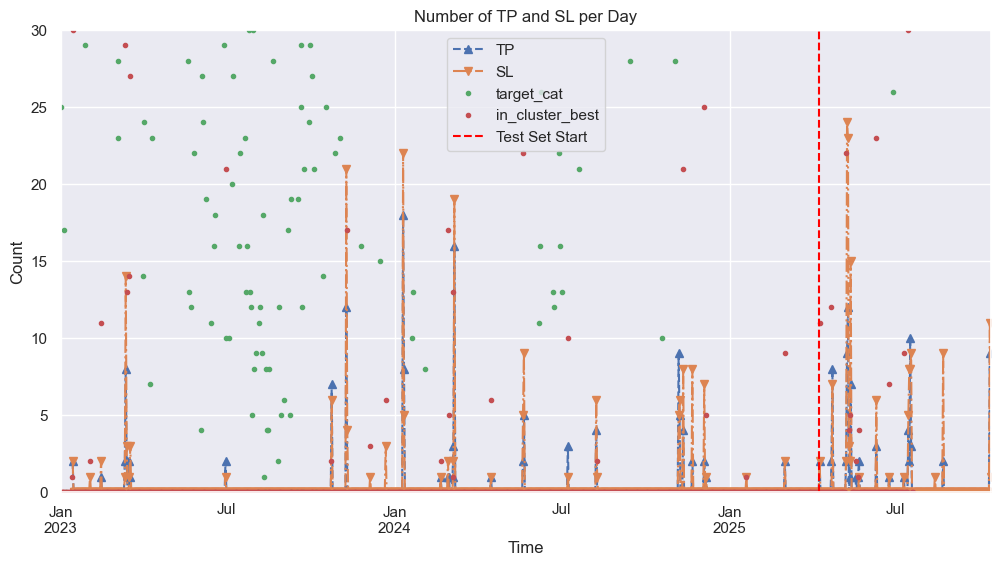

In [712]:
(df_trades["type"] == "TP").resample("D").sum().plot(figsize=(12, 6), linestyle='--', marker="^", label="TP")
(df_trades["type"] == "SL").resample("D").sum().plot(figsize=(12, 6), linestyle='-.', marker="v", label="SL")
(list_df[0]["target_cat"] == "high").resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
df_comb_cluster["in_cluster_best"].resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
# add vertical line when test set starts
plt.axvline(x=list_df[0].index[df_comb_cluster.shape[0] - nb_test], color='red', linestyle='--', label='Test Set Start')
# limit y axis
plt.ylim(0, 30)
plt.title("Number of TP and SL per Day")
plt.xlabel("Time")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

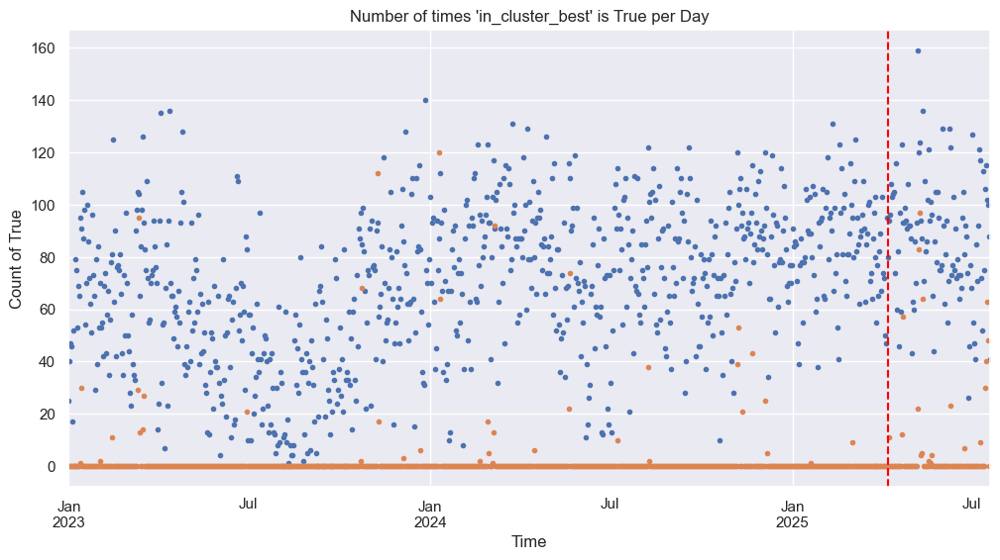

In [713]:
# by group sum every day
(list_df[0]["target_cat"] == "high").resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
df_comb_cluster["in_cluster_best"].resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
# add vertical line when test set starts
plt.axvline(x=list_df[0].index[df_comb_cluster.shape[0] - nb_test], color='red', linestyle='--', label='Test Set Start')
plt.title("Number of times 'in_cluster_best' is True per Day")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)

In [714]:
# plot first trade with type TP
df_trades[df_trades["type"] == "TP"].head(2)

,type,date_open,buy,sell,gain,fees,capital,Train
2023-01-14 00:50:00,TP,2023-01-13 23:55:00,1547.170044,1554.132309,307.980423,64.15054,10307.980423,True
2023-01-14 02:15:00,TP,2023-01-14 01:45:00,1550.420044,1557.396934,307.980423,64.15054,10365.960846,True


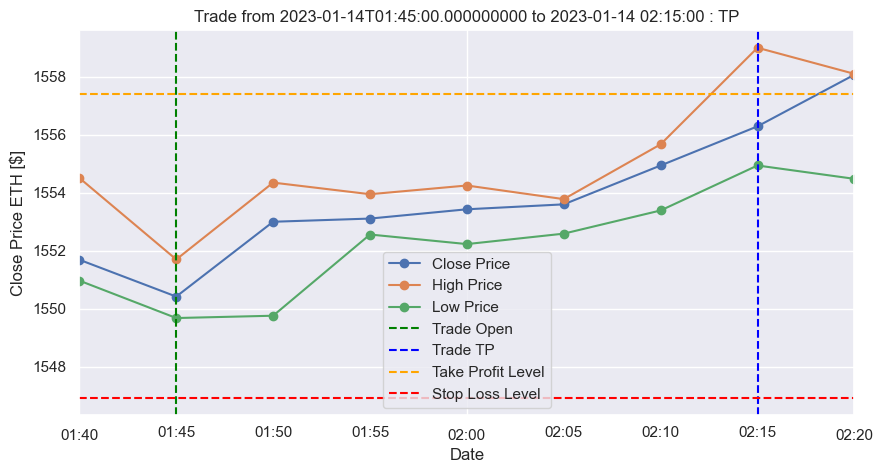

In [715]:
i_trade = 1
date_open = df_trades[df_trades["type"] == "TP"]["date_open"].values[i_trade]
date_tp = df_trades[df_trades["type"] == "TP"].index[i_trade]

list_df[0]["Close_ETH_raw"].loc[
    date_open - pd.Timedelta(minutes=5):date_tp + pd.Timedelta(minutes=5)
    ].plot(kind="line", figsize=(10,5), label="Close Price", marker="o")
(list_df[0]["Close_ETH_raw"]*list_df[0]["High_ETH"]).loc[date_open 
    - pd.Timedelta(minutes=5):date_tp + pd.Timedelta(minutes=5)].plot(
        kind="line", figsize=(10,5), label="High Price", marker="o"
    ) 
(list_df[0]["Close_ETH_raw"]*list_df[0]["Low_ETH"]).loc[date_open 
    - pd.Timedelta(minutes=5):date_tp + pd.Timedelta(minutes=5)].plot(
        kind="line", figsize=(10,5), label="Low Price", marker="o"
    )

plt.title(f"Trade from {date_open} to {date_tp} : TP")
plt.axvline(x=date_open, color='green', linestyle='--', label='Trade Open')
plt.axvline(x=date_tp, color='blue', linestyle='--', label='Trade TP')
# plot target_level line
price_open = list_df[0]["Close_ETH_raw"].loc[date_open]
plt.axhline(y=price_open * (1 + target_level), color='orange', linestyle='--', label='Take Profit Level')
# plot SL line
plt.axhline(y=price_open * (1 - 1/R * target_level), color='red', linestyle='--', label='Stop Loss Level')
plt.xlabel("Date")
plt.ylabel("Close Price ETH [$]")
plt.legend()
plt.show()

### Best Mdl ML

In [716]:
# leverage [-]:  8.269576962347871
# Gain for one TP [$]:  307.9804229342824
# Loss for one SL [$]:  -250.0
# 2024-12-12 13:00:00 is not in trade_signal
# 2024-12-12 13:00:00 is not in trade_signal
# trade signal used, adding last buy & date_open
# Capital init [$] 10000
# final capital [$]: -358.2319261540101
# ratio gain final [-]:  -1.0358231926154011
# Winrate [-] :  0.3852040816326531
# nb_tp:  151
# capital_tp [$]:  46505.04386307666
# nb_sl:  228
# capital_sl [$]:  -57000.0
# nb_neutral:  13
# capital_neutral [$] 136.72421076932784

In [717]:
arr_mdl_pred_train = rf.predict(df_combined_condition)
arr_mdl_pred = rf.predict(df_combined_condition_test)

leverage [-]:  8.269576962347871
Gain for one TP [$]:  307.9804229342824
Loss for one SL [$]:  -250.0
2024-12-12 13:00:00 is not in trade_signal
2024-12-12 13:00:00 is not in trade_signal
trade signal used, adding last buy & date_open
Capital init [$] 10000
final capital [$]: -369952.8293008392
ratio gain final [-]:  -37.995282930083924
Winrate [-] :  0.36253842775581907
nb_tp:  3302
capital_tp [$]:  1016951.3565290069
nb_sl:  5591
capital_sl [$]:  -1397750.0
nb_neutral:  215
capital_neutral [$] 845.8141701546224


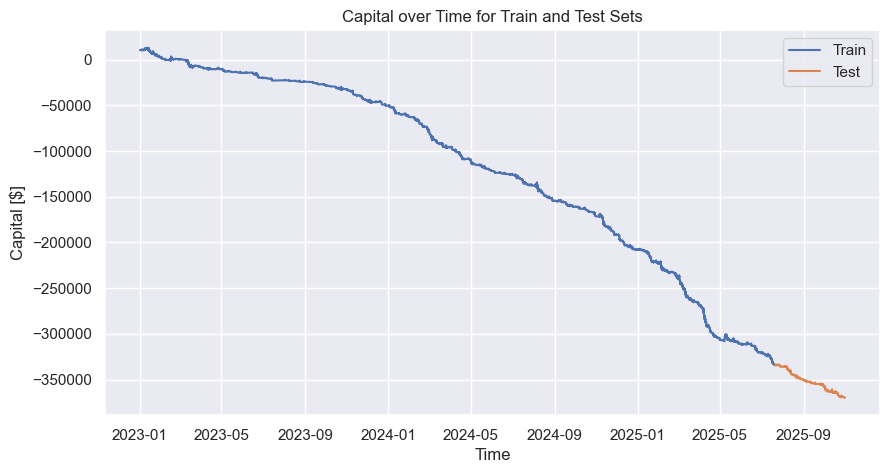

,type,date_open,buy,sell,gain,fees,capital,Train
2023-01-02 01:20:00,TP,2023-01-02 01:15:00,1208.069946,1213.506261,307.980423,64.150540,10307.980423,True
2023-01-02 02:45:00,Neutral,2023-01-02 01:25:00,1212.760010,1215.619995,130.934896,64.081997,10438.915319,True
2023-01-02 04:10:00,TP,2023-01-02 03:10:00,1217.329956,1222.807941,307.980423,64.150540,10746.895742,True
2023-01-02 04:40:00,SL,2023-01-02 04:15:00,1220.010010,1217.264987,-250.000000,63.934518,10496.895742,True
2023-01-03 19:25:00,SL,2023-01-03 19:20:00,1227.180054,1224.418899,-250.000000,63.934518,10246.895742,True
...,...,...,...,...,...,...,...,...
2025-10-27 13:05:00,SL,2025-10-27 12:35:00,4216.180000,4206.693595,-250.000000,63.934518,-368952.829301,False
2025-10-28 08:25:00,SL,2025-10-28 08:20:00,4170.680000,4161.295970,-250.000000,63.934518,-369202.829301,False
2025-10-31 13:40:00,SL,2025-10-31 13:35:00,3900.560000,3891.783740,-250.000000,63.934518,-369452.829301,False
2025-10-31 14:05:00,SL,2025-10-31 13:45:00,3893.280000,3884.520120,-250.000000,63.934518,-369702.829301,False


In [718]:
trade_signal_ml = pd.Series(
    np.concatenate((arr_mdl_pred_train, arr_mdl_pred), axis=0), 
    index=df_feat_tot.index,
    name="ml_pred"
)


df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(df_feat_tot, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=trade_signal_ml)
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)

# -129832.82
# add train test info from list_df[0]["Train"]
df_trades["Train"] = df_trades.index.isin(df_combined_condition.index)
# plot capital for train and test
plt.figure(figsize=(10, 5))
plt.plot(df_trades[df_trades["Train"]]["capital"], label="Train")
plt.plot(df_trades[~df_trades["Train"]]["capital"], label="Test")
plt.title("Capital over Time for Train and Test Sets")
plt.xlabel("Time")
plt.ylabel("Capital [$]")
plt.legend()
plt.grid(True)
plt.show()

#df_trades["capital"].plot(kind="line", figsize=(10, 5))
df_trades

<Axes: xlabel='type', ylabel='percent'>

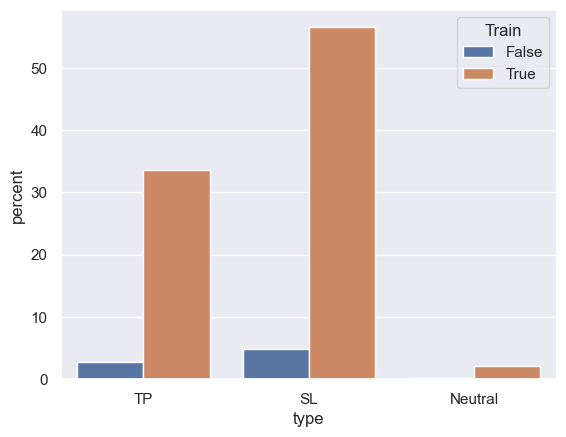

In [719]:
sns.countplot(df_trades, x="type", order=["TP", "SL", "Neutral"], hue="Train", stat="percent")

In [720]:
print("Winrate TRAIN: ", (df_trades.loc[df_trades["Train"] == True,"type"] == "TP").sum() / df_trades["Train"].sum())
print("Winrate TEST: ", (df_trades.loc[df_trades["Train"] == False,"type"] == "TP").sum() / (~df_trades["Train"]).sum())

Winrate TRAIN:  0.3640909632099059
Winrate TEST:  0.3441466854724965


#### Nb TP & SP per Day

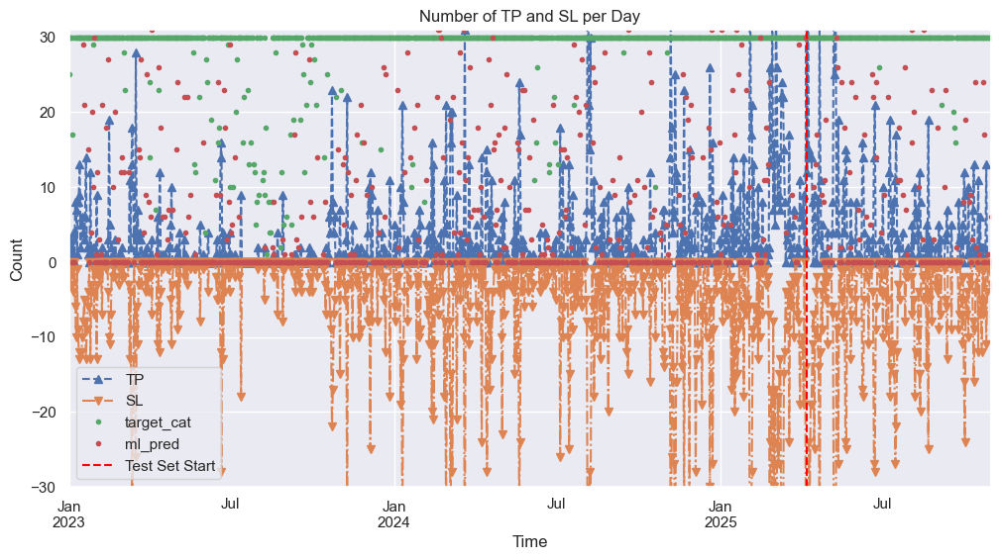

In [721]:

(df_trades["type"] == "TP").resample("D").sum().plot(figsize=(12, 6), linestyle='--', marker="^", label="TP")
((df_trades["type"] == "SL").resample("D").sum()*-1).plot(figsize=(12, 6), linestyle='-.', marker="v", label="SL")
(np.clip((df_feat_tot["target_cat"] == "high").resample("D").sum(),0,30)).plot(figsize=(12, 6), linestyle='', marker=".")
trade_signal_ml.resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
# limit y axis
plt.ylim(-30, 31)
plt.title("Number of TP and SL per Day")
plt.xlabel("Time")
plt.ylabel("Count")
# add vertical line when test set starts
plt.axvline(x=df_feat_tot.index[df_combined_condition.shape[0] - nb_test], 
            color='red', linestyle='--', label='Test Set Start')
plt.legend()
plt.grid(True)

#### Worst Day : nb max SL in one Day

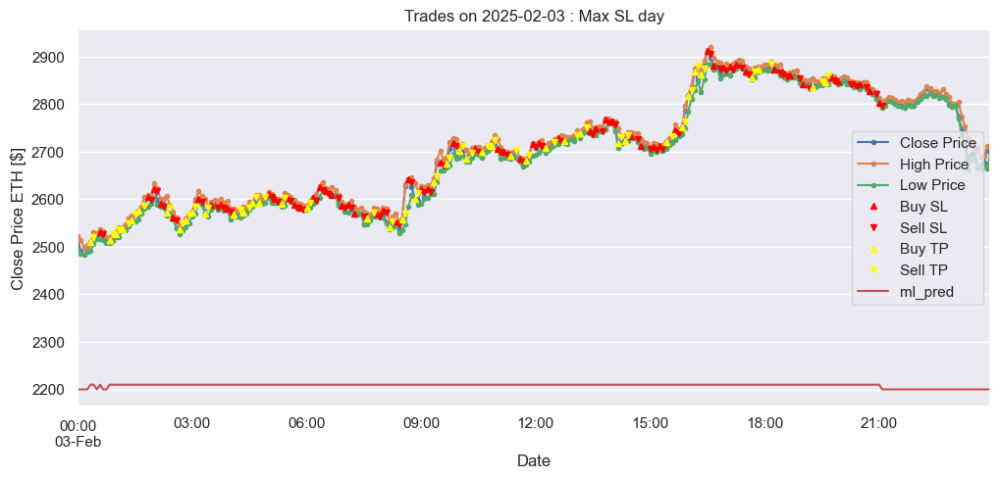

,type,date_open,buy,sell,gain,fees,capital,Train
2025-02-03 00:25:00,TP,2025-02-03 00:20:00,2509.929932,2521.224616,307.980423,64.150540,-222806.441880,True
2025-02-03 00:40:00,SL,2025-02-03 00:35:00,2531.669922,2525.973665,-250.000000,63.934518,-223056.441880,True
2025-02-03 00:55:00,TP,2025-02-03 00:50:00,2515.000000,2526.317500,307.980423,64.150540,-222748.461457,True
2025-02-03 01:05:00,TP,2025-02-03 01:00:00,2525.629883,2536.995217,307.980423,64.150540,-222440.481034,True
2025-02-03 01:20:00,TP,2025-02-03 01:10:00,2537.000000,2548.416500,307.980423,64.150540,-222132.500611,True
...,...,...,...,...,...,...,...,...
2025-02-03 20:15:00,SL,2025-02-03 19:55:00,2848.340088,2841.931323,-250.000000,63.934518,-224121.264116,True
2025-02-03 20:25:00,SL,2025-02-03 20:20:00,2844.570068,2838.169786,-250.000000,63.934518,-224371.264116,True
2025-02-03 20:40:00,SL,2025-02-03 20:30:00,2842.489990,2836.094388,-250.000000,63.934518,-224621.264116,True
2025-02-03 20:55:00,SL,2025-02-03 20:45:00,2827.399902,2821.038253,-250.000000,63.934518,-224871.264116,True


In [722]:
# index day with max SL
i_day_sl_max = np.argmax((df_trades["type"] == "SL").resample("D").sum())
#(df_trades["type"] == "SL").resample("D").sum()[i_day_sl_max]
date_max_sl = (df_trades["type"] == "SL").resample("D").sum().idxmax()

fig = plt.figure(figsize=(12,5))
ax = fig.gca()
b_df_sl =  df_feat_tot.index.date == date_max_sl.date()
# Create the plot and get the axes object
df_feat_tot["Close_ETH_raw"].loc[b_df_sl].plot(kind="line", ax=ax, label="Close Price", marker=".")

# Plot other lines on the same axes
(df_feat_tot["Close_ETH_raw"] * df_feat_tot["High_ETH"]).loc[b_df_sl].plot(ax=ax, kind="line", label="High Price", marker=".")

(df_feat_tot["Close_ETH_raw"] * df_feat_tot["Low_ETH"]).loc[b_df_sl].plot(ax=ax, kind="line", label="Low Price", marker=".")

# Get buy & sell points for SL trades on that day
df_trades_sl_max = df_trades.copy().loc[df_trades.index.date == date_max_sl.date()]

# Add annotations for each trade
b_trades_sl = df_trades_sl_max["type"] == "SL"
b_trades_tp = df_trades_sl_max["type"] == "TP"

ser_buy_sl = pd.Series(df_trades_sl_max.loc[b_trades_sl, "buy"].values, index=df_trades_sl_max.loc[b_trades_sl, "date_open"])
ser_buy_sl.plot(ax=ax,  color="red", marker="^", label="Buy SL", linestyle='', markersize=5)
ser_sell_sl = df_trades_sl_max.loc[b_trades_sl,"sell"]
ser_sell_sl.plot(ax=ax,  color="red", marker="v", label="Sell SL", linestyle='',  markersize=5)

ser_buy_tp = pd.Series(df_trades_sl_max.loc[b_trades_tp, "buy"].values, index=df_trades_sl_max.loc[b_trades_tp, "date_open"])
ser_buy_tp.plot(ax=ax,  color="yellow", marker="^", label="Buy TP", linestyle='', markersize=5)
ser_sell_tp = df_trades_sl_max.loc[b_trades_tp,"sell"]
ser_sell_tp.plot(ax=ax,  color="yellow", marker="v", label="Sell TP", linestyle='',  markersize=5)
# signal trade high
(trade_signal_ml.loc[trade_signal_ml.index.date == date_max_sl.date()]*10+2200).plot()
""" for idx, row in df_trades_sl_max.iterrows():
    ser_buy = pd.Series(row["buy"], index=[row["date_open"]])
    ser_buy.plot(ax=ax, kind="scatter", color="green", marker="^", s=50, label="Buy SL" if "Buy SL" not in plt.gca().get_legend_handles_labels()[1] else "")
    ser_sell = pd.Series(row["sell"], index=[idx])
    ser_sell.plot(ax=ax, kind="scatter", color="red", marker="v", s=50, label="Sell SL" if "Sell SL" not in plt.gca().get_legend_handles_labels()[1] else "")
    #plt.scatter(row["date_open"], row["buy"],  color="green", marker="^", s=10, label="Buy SL" if "Buy SL" not in plt.gca().get_legend_handles_labels()[1] else "")
    #plt.scatter(idx, row["sell"], color="red",  marker="v", s=10, label="Sell SL" if "Sell SL" not in plt.gca().get_legend_handles_labels()[1] else "")
 """
# Set plot titles and labels
plt.title(f"Trades on {date_max_sl.date()} : Max SL day")
plt.xlabel("Date")
plt.ylabel("Close Price ETH [$]")
plt.legend()
plt.grid(True) # Adding a grid can help with readability
plt.show()

# Display the dataframe
df_trades_sl_max


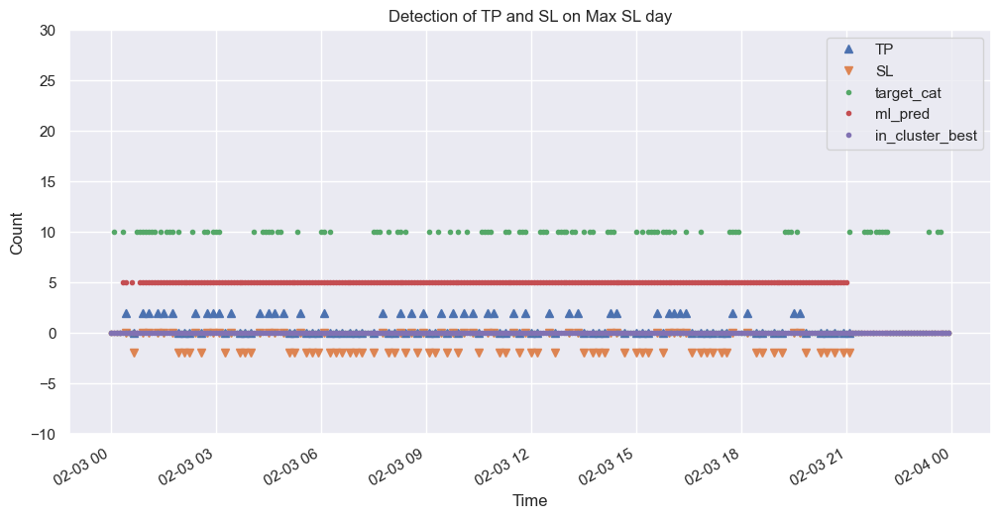

In [723]:
((df_trades_sl_max["type"] == "TP")*2).plot(figsize=(12, 6), linestyle='', marker="^", label="TP")
((df_trades_sl_max["type"] == "SL")*-2).plot(figsize=(12, 6), linestyle='', marker="v", label="SL")
((df_feat_tot.loc[b_df_sl, "target_cat"] == "high")*10).plot(figsize=(12, 6), linestyle='', marker=".")
(trade_signal_ml.loc[b_df_sl]*5).plot(figsize=(12, 6), linestyle='', marker=".")
(pd.concat((df_comb_cluster["in_cluster_best"], 
            df_comb_cluster_test["in_cluster_best"])).loc[b_df_sl]*7).plot(figsize=(12, 6), linestyle='', marker=".")
# limit y axis
plt.ylim(-10, 30)
plt.title("Detection of TP and SL on Max SL day")
plt.xlabel("Time")
plt.ylabel("Count")
plt.legend()
plt.grid(True)

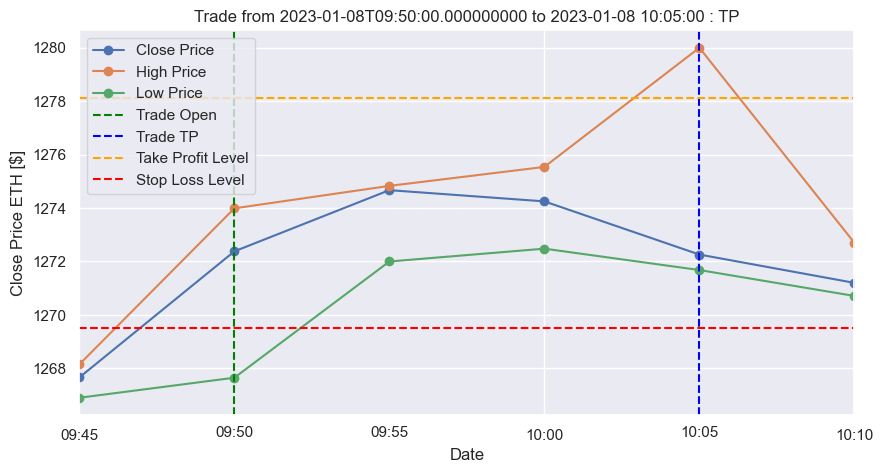

In [724]:
i_trade = 10
date_open = df_trades[df_trades["type"] == "TP"]["date_open"].values[i_trade]
date_tp = df_trades[df_trades["type"] == "TP"].index[i_trade]

list_df[0]["Close_ETH_raw"].loc[
    date_open - pd.Timedelta(minutes=5):date_tp + pd.Timedelta(minutes=5)
    ].plot(kind="line", figsize=(10,5), label="Close Price", marker="o")
(list_df[0]["Close_ETH_raw"]*list_df[0]["High_ETH"]).loc[date_open 
    - pd.Timedelta(minutes=5):date_tp + pd.Timedelta(minutes=5)].plot(
        kind="line", figsize=(10,5), label="High Price", marker="o"
    ) 
(list_df[0]["Close_ETH_raw"]*list_df[0]["Low_ETH"]).loc[date_open 
    - pd.Timedelta(minutes=5):date_tp + pd.Timedelta(minutes=5)].plot(
        kind="line", figsize=(10,5), label="Low Price", marker="o"
    )

plt.title(f"Trade from {date_open} to {date_tp} : TP")
plt.axvline(x=date_open, color='green', linestyle='--', label='Trade Open')
plt.axvline(x=date_tp, color='blue', linestyle='--', label='Trade TP')
# plot target_level line
price_open = list_df[0]["Close_ETH_raw"].loc[date_open]
plt.axhline(y=price_open * (1 + target_level), color='orange', linestyle='--', label='Take Profit Level')
# plot SL line
plt.axhline(y=price_open * (1 - 1/R * target_level), color='red', linestyle='--', label='Stop Loss Level')
plt.xlabel("Date")
plt.ylabel("Close Price ETH [$]")
plt.legend()
plt.show()

#### XGBoost best winrate [OLD DATA]

In [725]:
trade_signal_xgb = pd.Series(
    np.concatenate((arr_xgb_pred_train, arr_xgb_pred), axis=0), 
    index=list_df[0].index,
    name="xgb_pred"
)
df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(list_df, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=trade_signal_xgb)
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)

# -129832.82
# add train test info from list_df[0]["Train"]
df_trades["Train"] = df_trades.index.isin(df_combined_condition[df_combined_condition['Train']].index)
# plot capital for train and test
plt.figure(figsize=(10, 5))
plt.plot(df_trades[df_trades["Train"]]["capital"], label="Train", marker="o")
plt.plot(df_trades[~df_trades["Train"]]["capital"], label="Test", marker="x")
plt.title("Capital over Time for Train and Test Sets")
plt.xlabel("Time")
plt.ylabel("Capital [$]")
plt.legend()
plt.grid(True)
plt.show()

#df_trades["capital"].plot(kind="line", figsize=(10, 5))
df_trades

ValueError: Length of values (297908) does not match length of index (268188)

In [ ]:
print("Winrate TRAIN: ", (df_trades.loc[df_trades["Train"] == True,"type"] == "TP").sum() / df_trades["Train"].sum())
print("Winrate TEST: ", (df_trades.loc[df_trades["Train"] == False,"type"] == "TP").sum() / (~df_trades["Train"]).sum())

Winrate TRAIN:  0.425531914893617
Winrate TEST:  0.4827586206896552


<Axes: xlabel='type', ylabel='percent'>

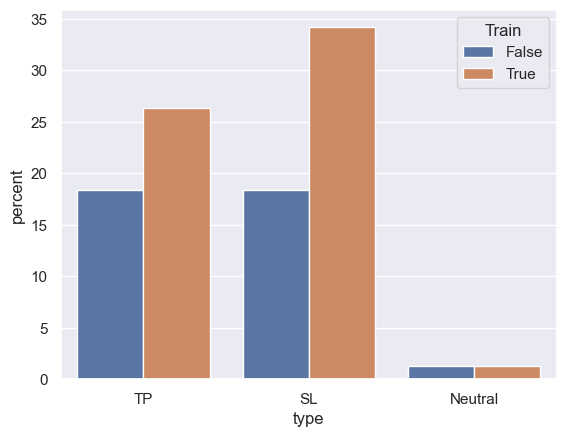

In [ ]:
sns.countplot(df_trades, x="type", order=["TP", "SL", "Neutral"], hue="Train", stat="percent")

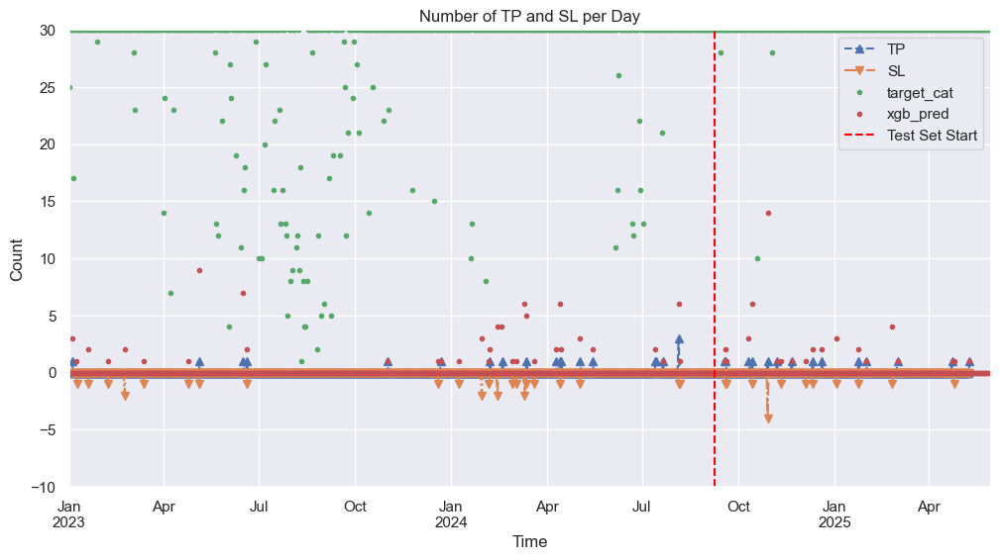

In [ ]:

(df_trades["type"] == "TP").resample("D").sum().plot(figsize=(12, 6), linestyle='--', marker="^", label="TP")
((df_trades["type"] == "SL").resample("D").sum()*-1).plot(figsize=(12, 6), linestyle='-.', marker="v", label="SL")
(np.clip((list_df[0]["target_cat"] == "high").resample("D").sum(),0,30)).plot(figsize=(12, 6), linestyle='', marker=".")
trade_signal_xgb.resample("D").sum().plot(figsize=(12, 6), linestyle='', marker=".")
# limit y axis
plt.ylim(-10, 30)
plt.title("Number of TP and SL per Day")
plt.xlabel("Time")
plt.ylabel("Count")
# add vertical line when test set starts
plt.axvline(x=list_df[0].index[df_combined_condition.shape[0] - nb_test], color='red', linestyle='--', label='Test Set Start')
plt.legend()
plt.grid(True)

664
2024-10-29 00:00:00


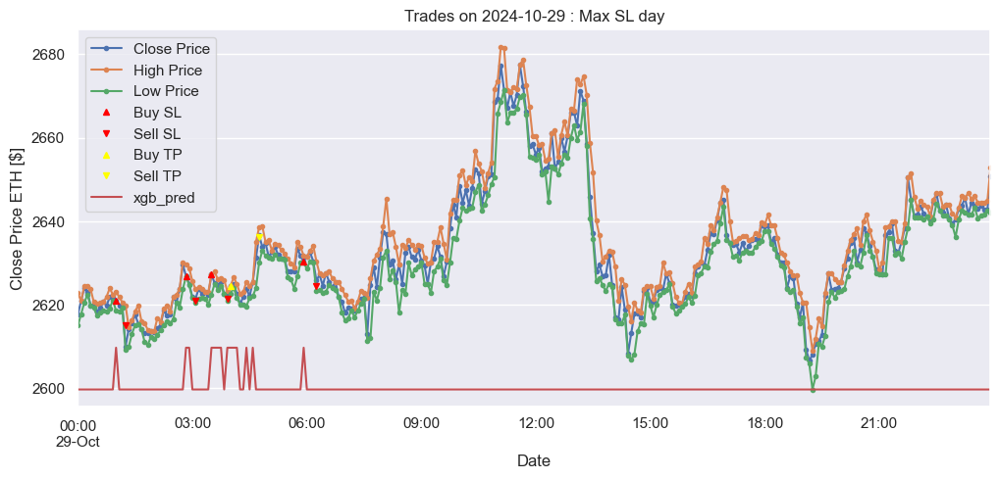

,type,date_open,buy,sell,gain,fees,capital,Train
2024-10-29 01:15:00,SL,2024-10-29 01:00:00,2620.899902,2615.002878,-250.000000,63.934518,9377.269620,False
2024-10-29 03:05:00,SL,2024-10-29 02:50:00,2626.840088,2620.929698,-250.000000,63.934518,9127.269620,False
2024-10-29 03:55:00,SL,2024-10-29 03:30:00,2627.189941,2621.278764,-250.000000,63.934518,8877.269620,False
2024-10-29 04:45:00,TP,2024-10-29 04:00:00,2624.389893,2636.199647,307.980423,64.150540,9185.250043,False
2024-10-29 06:15:00,SL,2024-10-29 05:55:00,2630.320068,2624.401848,-250.000000,63.934518,8935.250043,False


In [ ]:
# index day with max SL
i_day_sl_max = np.argmax((df_trades["type"] == "SL").resample("D").sum())
print(i_day_sl_max)
#(df_trades["type"] == "SL").resample("D").sum()[i_day_sl_max]
date_max_sl = (df_trades["type"] == "SL").resample("D").sum().idxmax()
print(date_max_sl)
fig = plt.figure(figsize=(12,5))
ax = fig.gca()
b_df_sl =  list_df[0].index.date == date_max_sl.date()
# Create the plot and get the axes object
list_df[0]["Close_ETH_raw"].loc[b_df_sl].plot(kind="line", ax=ax, label="Close Price", marker=".")

# Plot other lines on the same axes
(list_df[0]["Close_ETH_raw"] * list_df[0]["High_ETH"]).loc[b_df_sl].plot(ax=ax, kind="line", label="High Price", marker=".")

(list_df[0]["Close_ETH_raw"] * list_df[0]["Low_ETH"]).loc[b_df_sl].plot(ax=ax, kind="line", label="Low Price", marker=".")

# Get buy & sell points for SL trades on that day
df_trades_sl_max = df_trades.copy().loc[df_trades.index.date == date_max_sl.date()]

# Add annotations for each trade
b_trades_sl = df_trades_sl_max["type"] == "SL"
b_trades_tp = df_trades_sl_max["type"] == "TP"

ser_buy_sl = pd.Series(df_trades_sl_max.loc[b_trades_sl, "buy"].values, index=df_trades_sl_max.loc[b_trades_sl, "date_open"])
ser_buy_sl.plot(ax=ax,  color="red", marker="^", label="Buy SL", linestyle='', markersize=5)
ser_sell_sl = df_trades_sl_max.loc[b_trades_sl,"sell"]
ser_sell_sl.plot(ax=ax,  color="red", marker="v", label="Sell SL", linestyle='',  markersize=5)

if np.any(b_trades_tp):
    ser_buy_tp = pd.Series(df_trades_sl_max.loc[b_trades_tp, "buy"].values, index=df_trades_sl_max.loc[b_trades_tp, "date_open"])
    ser_buy_tp.plot(ax=ax,  color="yellow", marker="^", label="Buy TP", linestyle='', markersize=5)
    ser_sell_tp = df_trades_sl_max.loc[b_trades_tp,"sell"]
    ser_sell_tp.plot(ax=ax,  color="yellow", marker="v", label="Sell TP", linestyle='',  markersize=5)
# signal trade high
price_min = ((list_df[0]["Close_ETH_raw"] * list_df[0]["Low_ETH"]).loc[b_df_sl]).min()
(trade_signal_xgb.loc[trade_signal_xgb.index.date == date_max_sl.date()]*10+price_min).plot()
""" for idx, row in df_trades_sl_max.iterrows():
    ser_buy = pd.Series(row["buy"], index=[row["date_open"]])
    ser_buy.plot(ax=ax, kind="scatter", color="green", marker="^", s=50, label="Buy SL" if "Buy SL" not in plt.gca().get_legend_handles_labels()[1] else "")
    ser_sell = pd.Series(row["sell"], index=[idx])
    ser_sell.plot(ax=ax, kind="scatter", color="red", marker="v", s=50, label="Sell SL" if "Sell SL" not in plt.gca().get_legend_handles_labels()[1] else "")
    #plt.scatter(row["date_open"], row["buy"],  color="green", marker="^", s=10, label="Buy SL" if "Buy SL" not in plt.gca().get_legend_handles_labels()[1] else "")
    #plt.scatter(idx, row["sell"], color="red",  marker="v", s=10, label="Sell SL" if "Sell SL" not in plt.gca().get_legend_handles_labels()[1] else "")
 """
# Set plot titles and labels
plt.title(f"Trades on {date_max_sl.date()} : Max SL day")
plt.xlabel("Date")
plt.ylabel("Close Price ETH [$]")
plt.legend()
plt.grid(True) # Adding a grid can help with readability
plt.show()

# Display the dataframe
df_trades_sl_max


### Best Prob Mdl [OLD DATA]

leverage [-]:  8.269576962347871
Gain for one TP [$]:  307.9804229342824
Loss for one SL [$]:  -250.0
2024-12-12 13:00:00 is not in trade_signal
2024-12-12 13:00:00 is not in trade_signal
trade signal used, adding last buy & date_open
Capital init [$] 10000
final capital [$]: 13308.980207382352
ratio gain final [-]:  0.3308980207382352
Winrate [-] :  0.4948453608247423
nb_tp:  48
capital_tp [$]:  14783.060300845564
nb_sl:  47
capital_sl [$]:  -11750.0
nb_neutral:  2
capital_neutral [$] 275.91990653678573


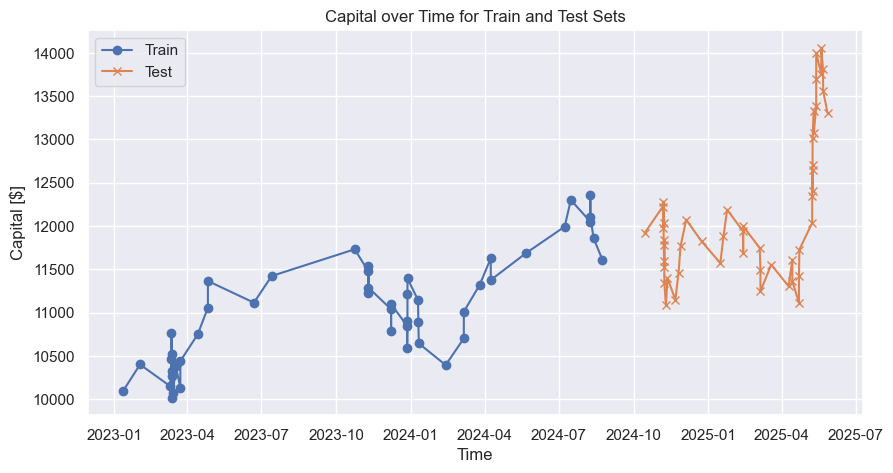

,type,date_open,buy,sell,gain,fees,capital,Train
2023-01-11 22:20:00,Neutral,2023-01-11 21:00:00,1399.589966,1402.270020,94.285073,64.067808,10094.285073,True
2023-02-01 21:30:00,TP,2023-02-01 20:40:00,1667.270020,1674.772735,307.980423,64.150540,10402.265496,True
2023-03-10 22:10:00,SL,2023-03-10 22:00:00,1458.310059,1455.028861,-250.000000,63.934518,10152.265496,True
2023-03-12 14:10:00,TP,2023-03-12 13:55:00,1513.030029,1519.838664,307.980423,64.150540,10460.245919,True
2023-03-12 14:30:00,TP,2023-03-12 14:15:00,1520.869995,1527.713910,307.980423,64.150540,10768.226342,True
...,...,...,...,...,...,...,...,...
2025-05-19 22:15:00,SL,2025-05-19 21:55:00,2550.929932,2545.190339,-250.000000,63.934518,13750.999784,False
2025-05-19 22:50:00,TP,2025-05-19 22:35:00,2553.469971,2564.960586,307.980423,64.150540,14058.980207,False
2025-05-22 00:05:00,SL,2025-05-22 00:00:00,2609.409912,2603.538740,-250.000000,63.934518,13808.980207,False
2025-05-22 05:10:00,SL,2025-05-22 04:50:00,2655.100098,2649.126122,-250.000000,63.934518,13558.980207,False


In [ ]:
trade_signal_prob = pd.concat((y_pred_max_comb2_train, y_pred_max_comb2_test), axis=0)

df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(list_df, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=trade_signal_prob)
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)

# -129832.82
# add train test info from list_df[0]["Train"]
df_trades["Train"] = df_trades.index.isin(df_combined_condition[df_combined_condition['Train']].index)
# plot capital for train and test
plt.figure(figsize=(10, 5))
plt.plot(df_trades[df_trades["Train"]]["capital"], label="Train", marker="o")
plt.plot(df_trades[~df_trades["Train"]]["capital"], label="Test", marker="x")
plt.title("Capital over Time for Train and Test Sets")
plt.xlabel("Time")
plt.ylabel("Capital [$]")
plt.legend()
plt.grid(True)
plt.show()

#df_trades["capital"].plot(kind="line", figsize=(10, 5))
df_trades

In [ ]:
len(list_col_select)

109

In [ ]:
list_past



[71, 70, 68, 64, 56, 40, 8]

In [ ]:
# how many combinaison of 3 elements in len(list_col_select) * nb lags
nb_elements = len(list_col_select) * len(list_past)
nb_comb = nb_elements * (nb_elements-1) * (nb_elements-2)
nb_comb


442449966

It s too much

In [ ]:
# how many combinaison of 3 elements in 40 selected comb (feat / lag) 
# (20 high target /20 low target and with max or min delta_prob)
nb_elements = 40
print(nb_elements, " elements")
nb_comb = nb_elements * (nb_elements-1) * (nb_elements-2)
nb_comb

40  elements


59280

Ok 